## Stage 01 — Environment and Google Drive

In [ ]:
# ============================================================
# STAGE 01 — FAST COLAB ENVIRONMENT AND GOOGLE DRIVE
# ============================================================

import os
import sys
import subprocess
import importlib.util
from pathlib import Path

print("Python:", sys.version)
print("Executable:", sys.executable)

def pip_install_missing(module_to_package):
    missing = [
        package
        for module, package in module_to_package.items()
        if importlib.util.find_spec(module) is None
    ]

    if missing:
        print("Installing missing packages:")
        for package in missing:
            print(" ", package)

        subprocess.check_call(
            [
                sys.executable,
                "-m",
                "pip",
                "install",
                "-q",
                *missing,
            ]
        )
    else:
        print("✓ Required Python packages already available")

pip_install_missing(
    {
        "timm": "timm==1.0.15",
        "albumentations": "albumentations",
        "cv2": "opencv-python-headless",
        "sklearn": "scikit-learn",
        "skimage": "scikit-image",
        "scipy": "scipy",
        "umap": "umap-learn",
        "squarify": "squarify",
        "pyarrow": "pyarrow",
        "captum": "captum",
        "tqdm": "tqdm",
        "segmentation_models_pytorch": "segmentation-models-pytorch",
        "statsmodels": "statsmodels",
        "openpyxl": "openpyxl",
    }
)

from google.colab import drive
drive.mount("/content/drive")

ROOT = Path("/content/drive/MyDrive")

# Reuse corrected datasets already downloaded in the previous project.
DATA_PROJECT = ROOT / "MTG_MambaX"
PROJECT = ROOT / "MTG_MaxViTX"

DATA = DATA_PROJECT / "data"
RAW = DATA / "raw"
EXTRACTED = DATA / "extracted"
META = DATA / "metadata"

SPLITS = PROJECT / "splits"
CHECKPOINTS = PROJECT / "checkpoints"
CACHE = PROJECT / "cache"
RESULTS = PROJECT / "results"
FIGURES = PROJECT / "figures"
STATE = PROJECT / "state"
EXPERIMENTS = PROJECT / "q1_experiments"

for p in [
    PROJECT, SPLITS, CHECKPOINTS, CACHE,
    RESULTS, FIGURES, STATE, EXPERIMENTS
]:
    p.mkdir(parents=True, exist_ok=True)

print("Dataset root:", DATA)
print("MaxViT project root:", PROJECT)
print("✓ Stage 01 complete")

Python: 3.13.15 (main, Aug  6 2026, 11:06:23) [GCC 11.4.0]
Executable: /usr/bin/python3
Installing missing packages:
  squarify
  captum
  segmentation-models-pytorch
Mounted at /content/drive
Dataset root: /content/drive/MyDrive/MTG_MambaX/data
MaxViT project root: /content/drive/MyDrive/MTG_MaxViTX
✓ Stage 01 complete


## Stage 02 — Imports, Reproducibility, and Configuration

In [ ]:
import os, sys, gc, json, math, time, random, shutil, zipfile, hashlib, warnings, subprocess

os.environ["TORCH_HOME"] = str(PROJECT / "torch_cache")
(PROJECT / "torch_cache").mkdir(parents=True, exist_ok=True)
from pathlib import Path
from itertools import cycle
from collections import defaultdict

import numpy as np
import pandas as pd
import requests
from tqdm.auto import tqdm
from PIL import Image
import cv2

import matplotlib.pyplot as plt
import matplotlib as mpl
import squarify

from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import (
    accuracy_score, balanced_accuracy_score, precision_recall_fscore_support,
    f1_score, confusion_matrix, matthews_corrcoef, roc_auc_score
)
from sklearn.preprocessing import label_binarize
from sklearn.utils.class_weight import compute_class_weight
import scipy
from scipy.ndimage import binary_erosion, binary_dilation, distance_transform_edt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision.transforms import functional as TVF

import albumentations as A
from albumentations.pytorch import ToTensorV2

import timm
import umap

warnings.filterwarnings("ignore")
mpl.rcParams.update({
    "figure.dpi": 120,
    "savefig.dpi": 300,
    "font.size": 11,
    "axes.titlesize": 14,
    "axes.labelsize": 11,
    "figure.facecolor": "white",
    "axes.facecolor": "white",
})

SEED = 42
IMG_SIZE = 256
BATCH_CLS = 16
BATCH_SEG = 8
NUM_WORKERS = 0
EPOCHS = 30
PATIENCE = 6
LR = 2e-4
WEIGHT_DECAY = 1e-4
LAMBDA_CLS = 1.0
LAMBDA_SEG = 1.0
GRAD_ACCUM = 1
MODEL_NAME = "maxvit_rmlp_tiny_rw_256.sw_in1k"
TEST_FOLD = 0
VAL_FOLD = 1
TRAIN_FOLDS = [2, 3, 4]
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Q1_SEEDS = [42, 123, 2024, 3407, 8192]
RUN_FULL_Q1_SUITE = False
Q1_EXPERIMENT_EPOCHS = 30
Q1_EXPERIMENT_PATIENCE = 6

LAMBDA_SEG_CLS = 0.05
LAMBDA_BOUNDARY = 0.20
LAMBDA_CONSISTENCY = 0.15
STEP_CKPT_INTERVAL = 25

# ------------------------------------------------------------
# LOW-COMPUTE DEFAULTS
# ------------------------------------------------------------
CONTINUE_PRIMARY_TRAINING = False
VERIFY_CHECKPOINT_SELECTION = False
RUN_HEAVY_Q1_SUITE = False
# ------------------------------------------------------------
# V5 PERFORMANCE REFINEMENT
# ------------------------------------------------------------
RUN_PERFORMANCE_REFINEMENT = True

CLS_REFINE_EPOCHS = 8
CLS_REFINE_PATIENCE = 3
CLS_ENCODER_LR = 5e-6
CLS_HEAD_LR = 5e-5
CLS_REFINE_WEIGHT_DECAY = 5e-5
CLS_REFINE_STEP_CKPT_INTERVAL = 40
CLS_TARGET_ACCURACY = 0.90

SEG_REFINE_EPOCHS = 5
SEG_REFINE_PATIENCE = 2
SEG_DECODER_LR = 1e-4
SEG_REFINE_STEP_CKPT_INTERVAL = 20

CLS_TTA_VIEWS = 4
SEG_TTA_HORIZONTAL = True

CACHE_PRIMARY_CLASSIFICATION_LOCALLY = True
CACHE_EXTERNAL_LOCALLY = True

RUN_ROBUSTNESS_SUITE = True
# ------------------------------------------------------------
# V6 LOW-COMPUTE BALANCED ENSEMBLE
# ------------------------------------------------------------
RUN_V6_BALANCED_ENSEMBLE = True

BALANCED_HEAD_EPOCHS = 60
BALANCED_HEAD_PATIENCE = 10
BALANCED_HEAD_LR = 1e-3
BALANCED_HEAD_WEIGHT_DECAY = 1e-4
BALANCED_HEAD_CKPT_INTERVAL = 10

V6_MIN_VALIDATION_ACCURACY = 0.90

RUN_V6_SEGMENTATION_ENSEMBLE = True

# Enable these only intentionally:
# CONTINUE_PRIMARY_TRAINING=True  -> use the v3 safe-training notebook
# VERIFY_CHECKPOINT_SELECTION=True -> rerun validation on checkpoint candidates
RUN_HEAVY_Q1_SUITE=True -> five-run ablations/baselines/significance


POLYP_LABEL = None

def seed_everything(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    torch.backends.cudnn.deterministic = False
    torch.backends.cudnn.benchmark = True

seed_everything()

def mark_stage(name, payload=None):
    path = STATE / f"{name}.json"
    tmp = path.with_suffix(".tmp")
    obj = {"done": True, "time": time.strftime("%Y-%m-%d %H:%M:%S"), "payload": payload or {}}
    tmp.write_text(json.dumps(obj, indent=2))
    tmp.replace(path)

def stage_done(name):
    return (STATE / f"{name}.json").exists()

def savefig(name):
    path = FIGURES / f"{name}.png"
    plt.savefig(path, bbox_inches="tight", dpi=300)
    return path

print("Device:", DEVICE)
print("Backbone:", MODEL_NAME)
print("Q1 seeds:", Q1_SEEDS)

if DEVICE.type != "cuda":
    print(
        "WARNING: CPU execution is supported, "
        "but GPU is strongly recommended for training."
    )

print("✓ Standard PyTorch/timm environment ready")

Device: cuda
Backbone: maxvit_rmlp_tiny_rw_256.sw_in1k
Q1 seeds: [42, 123, 2024, 3407, 8192]
✓ Standard PyTorch/timm environment ready


## Stage 03 — Resumable Dataset Acquisition

In [ ]:
KAGGLE_DATASET = "kelkalot/the-hyper-kvasir-dataset"
KAGGLE_DOWNLOAD_URL = f"https://www.kaggle.com/api/v1/datasets/download/{KAGGLE_DATASET}"
HYPER_SPLIT_URL = "https://raw.githubusercontent.com/simula/hyper-kvasir/refs/heads/master/official_splits/5_fold_split.csv"
GASTROVISION_OSF_PROJECT = "84e7f"

def curl_resumable_download(url, destination, retries=10):
    destination = Path(destination)
    destination.parent.mkdir(parents=True, exist_ok=True)
    part = destination.with_suffix(destination.suffix + ".part")

    if destination.exists() and destination.stat().st_size > 0:
        print(f"Already downloaded: {destination}")
        return destination

    cmd = [
        "curl", "-L", "--fail",
        "--retry", str(retries),
        "--retry-delay", "5",
        "--retry-all-errors",
        "--connect-timeout", "30",
        "--speed-time", "120",
        "--speed-limit", "1024",
        "-C", "-",
        "-o", str(part),
        url,
    ]
    result = subprocess.run(cmd)

    if result.returncode != 0:
        raise RuntimeError(
            f"curl download failed with exit code {result.returncode}. "
            f"Keep {part}; rerun this cell to resume."
        )

    if not part.exists() or part.stat().st_size == 0:
        raise RuntimeError(f"Download produced an empty file: {part}")

    part.replace(destination)
    print(f"Completed: {destination} ({destination.stat().st_size / 1024**3:.2f} GB)")
    return destination

def resumable_download(url, destination, expected_size=None, chunk_size=8 * 1024 * 1024, retries=8):
    destination = Path(destination)
    destination.parent.mkdir(parents=True, exist_ok=True)
    part = destination.with_suffix(destination.suffix + ".part")

    if destination.exists() and (expected_size is None or destination.stat().st_size == expected_size):
        return destination

    for attempt in range(retries):
        try:
            existing = part.stat().st_size if part.exists() else 0
            headers = {"Range": f"bytes={existing}-"} if existing else {}
            with requests.get(
                url, headers=headers, stream=True,
                timeout=(30, 180), allow_redirects=True
            ) as r:
                if existing and r.status_code == 200:
                    part.unlink(missing_ok=True)
                    existing = 0
                r.raise_for_status()

                total = expected_size
                if total is None:
                    length = r.headers.get("Content-Length")
                    total = existing + int(length) if length else None

                mode = "ab" if existing else "wb"
                with open(part, mode) as f, tqdm(
                    total=total, initial=existing, unit="B", unit_scale=True,
                    desc=destination.name, leave=True
                ) as pbar:
                    for chunk in r.iter_content(chunk_size=chunk_size):
                        if chunk:
                            f.write(chunk)
                            pbar.update(len(chunk))

            if expected_size is not None and part.stat().st_size != expected_size:
                raise IOError(f"Size mismatch for {destination.name}")

            part.replace(destination)
            return destination

        except requests.exceptions.SSLError:
            print(f"Python SSL verification failed for {url}; switching to curl.")
            return curl_resumable_download(url, destination, retries=retries)

        except Exception:
            if attempt == retries - 1:
                raise
            time.sleep(min(2 ** attempt, 30))

def paged_json(url):
    while url:
        r = requests.get(url, timeout=60)
        r.raise_for_status()
        js = r.json()
        for item in js.get("data", []):
            yield item
        url = js.get("links", {}).get("next")

def osf_manifest(project_id):
    root_url = f"https://api.osf.io/v2/nodes/{project_id}/files/osfstorage/"
    stack = [root_url]
    manifest = []
    while stack:
        url = stack.pop()
        for item in paged_json(url):
            attr = item["attributes"]
            if attr["kind"] == "folder":
                child = (
                    item.get("relationships", {})
                    .get("files", {})
                    .get("links", {})
                    .get("related", {})
                    .get("href")
                )
                if child:
                    stack.append(child)
            else:
                manifest.append({
                    "name": attr["name"],
                    "path": attr.get("materialized_path", "/" + attr["name"]),
                    "size": attr.get("size"),
                    "download": item["links"]["download"],
                })
    return pd.DataFrame(manifest)

def download_osf_project(project_id, dest_root):
    dest_root = Path(dest_root)
    manifest_path = META / f"osf_{project_id}_manifest.parquet"

    if manifest_path.exists():
        manifest = pd.read_parquet(manifest_path)
    else:
        manifest = osf_manifest(project_id)
        manifest.to_parquet(manifest_path, index=False)

    for row in manifest.itertuples(index=False):
        rel = str(row.path).lstrip("/")
        dest = dest_root / rel
        resumable_download(
            row.download,
            dest,
            expected_size=int(row.size) if pd.notna(row.size) else None
        )
    return manifest

hyper_kaggle_zip = RAW / "hyper-kvasir-kaggle.zip"
official_split_csv = META / "hyper_kvasir_5_fold_split.csv"
gastro_raw = RAW / "GastroVision_OSF"

curl_resumable_download(KAGGLE_DOWNLOAD_URL, hyper_kaggle_zip)
mark_stage(
    "03a_hyper_kaggle_download",
    {"path": str(hyper_kaggle_zip), "dataset": KAGGLE_DATASET}
)

resumable_download(HYPER_SPLIT_URL, official_split_csv)
mark_stage("03b_hyper_official_split", {"path": str(official_split_csv)})

gastro_manifest = download_osf_project(GASTROVISION_OSF_PROJECT, gastro_raw)
mark_stage("03c_gastrovision_download", {"files": int(len(gastro_manifest))})

display(gastro_manifest.head())

Already downloaded: /content/drive/MyDrive/MTG_MambaX/data/raw/hyper-kvasir-kaggle.zip


,name,path,size,download
0,resolution.png,/Wiki images/resolution.png,12915,https://osf.io/download/q2f96/
1,gast_icml_count.png,/Wiki images/gast_icml_count.png,64415,https://osf.io/download/9v4cg/
2,gastrovision5_res.png,/Wiki images/gastrovision5_res.png,317932,https://osf.io/download/3x4sh/
3,gastrovision5 (1).png,/Wiki images/gastrovision5 (1).png,3146638,https://osf.io/download/k6y3t/
4,Gastrovision.zip,/Gastrovision/Gastrovision.zip,1793518442,https://osf.io/download/gvx3q/


## Stage 04 — Resumable Extraction and File Discovery

In [ ]:
# ============================================================
# STAGE 04 — ROBUST HYPER-KVASIR EXTRACTION + DATASET AUDIT
# ============================================================

HK_CLASSES = [
    "barretts", "bbps-0-1", "bbps-2-3", "dyed-lifted-polyps",
    "dyed-resection-margins", "hemorrhoids", "ileum", "impacted-stool",
    "normal-cecum", "normal-pylorus", "normal-z-line", "oesophagitis-a",
    "oesophagitis-b-d", "polyp", "retroflex-rectum", "retroflex-stomach",
    "short-segment-barretts", "ulcerative-colitis-0-1",
    "ulcerative-colitis-1-2", "ulcerative-colitis-2-3",
    "ulcerative-colitis-grade-1", "ulcerative-colitis-grade-2",
    "ulcerative-colitis-grade-3"
]

POLYP_LABEL = HK_CLASSES.index("polyp")

OFFICIAL_TO_CANONICAL = {
    "ulcerative-colitis-grade-0-1": "ulcerative-colitis-0-1",
    "ulcerative-colitis-grade-1-2": "ulcerative-colitis-1-2",
    "ulcerative-colitis-grade-2-3": "ulcerative-colitis-2-3",
    "hemorroids": "hemorrhoids",
}

def canonical_hk_class(name):
    name = str(name).strip().lower()
    return OFFICIAL_TO_CANONICAL.get(name, name)

IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}

# Existing selected root remains the segmentation source.
hyper_selected_root = EXTRACTED / "HyperKvasir_Kaggle_Selected"
hyper_seg_root = hyper_selected_root

# Classification is rebuilt into a clean filename-based folder.
hyper_official_root = EXTRACTED / "HyperKvasir_Official_Available"
hyper_labeled_root = hyper_official_root / "labeled"
hyper_labeled_root.mkdir(parents=True, exist_ok=True)

# ------------------------------------------------------------
# Load official split metadata
# ------------------------------------------------------------

official_folds = pd.read_csv(official_split_csv, sep=";")
official_folds.columns = [c.strip() for c in official_folds.columns]

required_cols = {"file-name", "class-name", "split-index"}
missing_cols = required_cols - set(official_folds.columns)

if missing_cols:
    raise RuntimeError(
        f"Official split CSV is missing required columns: {sorted(missing_cols)}"
    )

official_folds["file-name"] = (
    official_folds["file-name"]
    .astype(str)
    .str.strip()
)

official_folds["class-name-raw"] = (
    official_folds["class-name"]
    .astype(str)
    .str.strip()
    .str.lower()
)

official_folds["class-name"] = (
    official_folds["class-name-raw"]
    .map(canonical_hk_class)
)

official_folds["split-index"] = pd.to_numeric(
    official_folds["split-index"],
    errors="raise"
).astype(int)

official_filenames = set(official_folds["file-name"])

assert len(official_folds) == 10662
assert len(official_filenames) == 10662

canonical_classes = set(official_folds["class-name"].unique())

missing_taxonomy = sorted(set(HK_CLASSES) - canonical_classes)
unexpected_taxonomy = sorted(canonical_classes - set(HK_CLASSES))

if missing_taxonomy or unexpected_taxonomy:
    raise RuntimeError(
        "Hyper-Kvasir taxonomy mismatch after canonicalization.\n"
        f"Missing: {missing_taxonomy}\n"
        f"Unexpected: {unexpected_taxonomy}"
    )

print("✓ Hyper-Kvasir taxonomy validated")
print("Official metadata rows:", len(official_folds))
print("Canonical classes:", len(canonical_classes))

# ------------------------------------------------------------
# Archive helper functions
# ------------------------------------------------------------

def _norm_archive_path(x):
    return str(x).replace("\\", "/").lower()

def _is_segmentation_archive_path(x):
    s = "/" + _norm_archive_path(x).strip("/") + "/"
    tokens = [
        "/segmented-images/",
        "/segmented_images/",
        "/segmentation/",
        "/segmented/",
        "/masks/",
        "/mask/",
        "/bounding-boxes/",
        "/bounding_boxes/",
        "/bounding-box/",
        "/bounding_box/",
    ]
    return any(t in s for t in tokens)

def _is_unlabeled_archive_path(x):
    s = "/" + _norm_archive_path(x).strip("/") + "/"
    return "/unlabeled/" in s or "/unlabelled/" in s

def _member_rank(member):
    return (
        int(_is_segmentation_archive_path(member.filename)),
        int(_is_unlabeled_archive_path(member.filename)),
        len(Path(member.filename).parts),
        len(member.filename),
    )

# ------------------------------------------------------------
# Scan the Kaggle ZIP
# ------------------------------------------------------------

print("\nScanning Kaggle Hyper-Kvasir ZIP...")

official_lower_to_name = {
    name.lower(): name
    for name in official_filenames
}

official_stem_to_names = {}
for name in official_filenames:
    official_stem_to_names.setdefault(
        Path(name).stem.lower(),
        []
    ).append(name)

exact_matches = {}
stem_candidates = {}

with zipfile.ZipFile(hyper_kaggle_zip, "r") as z:
    members = z.infolist()

    for member in tqdm(
        members,
        desc="Scanning archive"
    ):
        if member.is_dir():
            continue

        p = Path(member.filename)

        if p.suffix.lower() not in IMAGE_EXTS:
            continue

        lower_name = p.name.lower()

        # 1) Exact filename match, case-insensitive.
        if lower_name in official_lower_to_name:
            official_name = official_lower_to_name[lower_name]

            current = exact_matches.get(official_name)

            if current is None or _member_rank(member) < _member_rank(current):
                exact_matches[official_name] = member

            continue

        # 2) Stem fallback for possible extension differences.
        stem = p.stem.lower()

        if stem in official_stem_to_names:
            stem_candidates.setdefault(stem, []).append(member)

    resolved_members = dict(exact_matches)

    unresolved_exact = sorted(
        official_filenames - set(resolved_members)
    )

    extension_recovered = {}

    for official_name in unresolved_exact:
        stem = Path(official_name).stem.lower()
        candidates = stem_candidates.get(stem, [])

        if not candidates:
            continue

        # Prefer the best non-segmentation/non-unlabeled candidate.
        best = sorted(
            candidates,
            key=_member_rank
        )[0]

        resolved_members[official_name] = best
        extension_recovered[official_name] = best.filename

    available_official_names = set(resolved_members)
    missing_in_archive = sorted(
        official_filenames - available_official_names
    )

    coverage = (
        len(available_official_names)
        / len(official_filenames)
    )

    print("\nOfficial filenames required:", len(official_filenames))
    print("Exact filename matches:", len(exact_matches))
    print("Recovered by stem/extension:", len(extension_recovered))
    print("Total official images available:", len(available_official_names))
    print("Still missing from Kaggle mirror:", len(missing_in_archive))
    print(f"Classification coverage: {coverage*100:.4f}%")

    if extension_recovered:
        print("\nExamples recovered by stem matching:")
        for k, v in list(extension_recovered.items())[:10]:
            print(f"  {k} <- {v}")

    # Save a full missing-image audit instead of crashing.
    missing_audit = (
        official_folds[
            official_folds["file-name"].isin(missing_in_archive)
        ][
            [
                "file-name",
                "class-name-raw",
                "class-name",
                "split-index"
            ]
        ]
        .copy()
        .rename(
            columns={
                "file-name": "filename",
                "class-name-raw": "class_name_raw",
                "class-name": "class_name",
                "split-index": "fold"
            }
        )
    )

    missing_audit.to_csv(
        META / "hyper_kvasir_missing_from_kaggle.csv",
        index=False
    )

    # Protect against a badly incomplete mirror, while allowing the observed
    # 99%+ coverage to proceed.
    MIN_ACCEPTABLE_COVERAGE = 0.99

    if coverage < MIN_ACCEPTABLE_COVERAGE:
        raise RuntimeError(
            f"Kaggle Hyper-Kvasir coverage is only {coverage*100:.2f}%. "
            f"Minimum required coverage is {MIN_ACCEPTABLE_COVERAGE*100:.2f}%."
        )

    if missing_in_archive:
        print("\nWARNING:")
        print(
            f"{len(missing_in_archive)} official images are absent from "
            "this Kaggle mirror and will be excluded."
        )
        print(
            "Their filenames, classes, and folds were saved to:"
        )
        print(
            META / "hyper_kvasir_missing_from_kaggle.csv"
        )

    # --------------------------------------------------------
    # Resume-safe extraction of every available official image
    # --------------------------------------------------------

    extracted_now = 0
    already_complete = 0

    for official_name in tqdm(
        sorted(available_official_names),
        desc="Building clean classification dataset"
    ):
        member = resolved_members[official_name]
        target = hyper_labeled_root / official_name

        if (
            target.exists()
            and target.stat().st_size == member.file_size
        ):
            already_complete += 1
            continue

        tmp = target.with_suffix(target.suffix + ".part")

        with z.open(member, "r") as src_f, open(tmp, "wb") as dst_f:
            shutil.copyfileobj(
                src_f,
                dst_f,
                length=8 * 1024 * 1024
            )

        if tmp.stat().st_size != member.file_size:
            raise IOError(
                f"Extraction size mismatch for {official_name}"
            )

        tmp.replace(target)
        extracted_now += 1

# ------------------------------------------------------------
# Clean-folder integrity check
# ------------------------------------------------------------

classification_files = [
    p for p in hyper_labeled_root.iterdir()
    if p.is_file()
    and p.suffix.lower() in IMAGE_EXTS
]

classification_names = {
    p.name
    for p in classification_files
}

# Remove stale files that are not part of the current resolved set.
stale_files = sorted(
    classification_names - available_official_names
)

for filename in stale_files:
    (hyper_labeled_root / filename).unlink(missing_ok=True)

classification_files = [
    p for p in hyper_labeled_root.iterdir()
    if p.is_file()
    and p.suffix.lower() in IMAGE_EXTS
]

classification_names = {
    p.name
    for p in classification_files
}

missing_after = sorted(
    available_official_names - classification_names
)

if missing_after:
    raise RuntimeError(
        f"{len(missing_after)} available official images failed extraction."
    )

if len(classification_names) != len(available_official_names):
    raise RuntimeError(
        "Clean classification folder count does not match "
        "the resolved Kaggle archive count."
    )

print("\n" + "=" * 68)
print("HYPER-KVASIR CLASSIFICATION EXTRACTION COMPLETE")
print("=" * 68)

print("Already complete:", already_complete)
print("Extracted/repaired now:", extracted_now)
print("Images available for classification:", len(classification_names))
print("Official images absent from Kaggle mirror:", len(missing_in_archive))
print(f"Final retained coverage: {coverage*100:.4f}%")
print("Classification root:", hyper_labeled_root)

# ------------------------------------------------------------
# GastroVision nested extraction
# ------------------------------------------------------------

def extract_nested_zips(root, marker_name):
    marker = STATE / f"{marker_name}.json"

    if marker.exists():
        return

    for zpath in sorted(Path(root).rglob("*.zip")):
        out = zpath.with_suffix("")
        out.mkdir(parents=True, exist_ok=True)

        inner_marker = STATE / (
            "nested_"
            + hashlib.md5(str(zpath).encode()).hexdigest()
            + ".json"
        )

        if not inner_marker.exists():
            with zipfile.ZipFile(zpath) as z:
                z.extractall(out)

            inner_marker.write_text('{"done": true}')

    mark_stage(marker_name)

extract_nested_zips(
    gastro_raw,
    "04b_extract_gastrovision_nested"
)

def image_files(root):
    return [
        p for p in Path(root).rglob("*")
        if p.is_file()
        and p.suffix.lower() in IMAGE_EXTS
    ]

print("\nGastroVision images:", len(image_files(gastro_raw)))

# ------------------------------------------------------------
# Segmentation audit
# ------------------------------------------------------------

seg_images = image_files(hyper_seg_root)

mask_like = [
    p for p in seg_images
    if "mask" in "/".join(
        q.lower()
        for q in p.parts
    )
]

print("Hyper-Kvasir selected image files:", len(seg_images))
print("Segmentation mask-like images:", len(mask_like))

if len(mask_like) < 900:
    raise RuntimeError(
        f"Only {len(mask_like)} segmentation masks were found. "
        "Segmentation extraction is incomplete."
    )

# ------------------------------------------------------------
# Dataset audit tables
# ------------------------------------------------------------

official_class_counts = (
    official_folds["class-name"]
    .value_counts()
    .reindex(HK_CLASSES)
    .rename("official_count")
)

retained_folds = official_folds[
    official_folds["file-name"].isin(classification_names)
].copy()

retained_class_counts = (
    retained_folds["class-name"]
    .value_counts()
    .reindex(HK_CLASSES)
    .fillna(0)
    .astype(int)
    .rename("retained_count")
)

audit_table = pd.concat(
    [
        official_class_counts,
        retained_class_counts
    ],
    axis=1
)

audit_table["missing_count"] = (
    audit_table["official_count"]
    - audit_table["retained_count"]
)

audit_table["retained_percent"] = (
    100
    * audit_table["retained_count"]
    / audit_table["official_count"]
)

audit_table.to_csv(
    META / "hyper_kvasir_kaggle_coverage_by_class.csv"
)

display(audit_table)

mark_stage(
    "04_hyper_kaggle_available_v5",
    {
        "official_total": 10662,
        "retained_total": int(len(classification_names)),
        "missing_total": int(len(missing_in_archive)),
        "coverage": float(coverage),
        "classification_root": str(hyper_labeled_root),
    }
)

✓ Hyper-Kvasir taxonomy validated
Official metadata rows: 10662
Canonical classes: 23

Scanning Kaggle Hyper-Kvasir ZIP...


Scanning archive:   0%|          | 0/112407 [00:00<?, ?it/s]


Official filenames required: 10662
Exact filename matches: 10619
Recovered by stem/extension: 0
Total official images available: 10619
Still missing from Kaggle mirror: 43
Classification coverage: 99.5967%

43 official images are absent from this Kaggle mirror and will be excluded.
Their filenames, classes, and folds were saved to:
/content/drive/MyDrive/MTG_MambaX/data/metadata/hyper_kvasir_missing_from_kaggle.csv


Building clean classification dataset:   0%|          | 0/10619 [00:00<?, ?it/s]


HYPER-KVASIR CLASSIFICATION EXTRACTION COMPLETE
Already complete: 10619
Extracted/repaired now: 0
Images available for classification: 10619
Official images absent from Kaggle mirror: 43
Final retained coverage: 99.5967%
Classification root: /content/drive/MyDrive/MTG_MambaX/data/extracted/HyperKvasir_Official_Available/labeled

GastroVision images: 8004
Hyper-Kvasir selected image files: 7957
Segmentation mask-like images: 1000


,official_count,retained_count,missing_count,retained_percent
class-name,,,,
barretts,41,41,0,100.000000
bbps-0-1,646,646,0,100.000000
bbps-2-3,1148,1148,0,100.000000
dyed-lifted-polyps,1002,1002,0,100.000000
dyed-resection-margins,989,989,0,100.000000
hemorrhoids,6,6,0,100.000000
ileum,9,9,0,100.000000
impacted-stool,131,131,0,100.000000
normal-cecum,1009,1009,0,100.000000


## Stage 05 — Hyper-Kvasir Classification Index and Official Fold Assignment

In [ ]:
# ============================================================
# STAGE 05 — HYPER-KVASIR CLASSIFICATION INDEX
# ============================================================

cls_index_path = META / "hyper_kvasir_classification_index_v6.parquet"

IMAGE_EXTS = {
    ".jpg", ".jpeg", ".png",
    ".bmp", ".tif", ".tiff"
}

hyper_labeled_root = (
    EXTRACTED
    / "HyperKvasir_Official_Available"
    / "labeled"
)

OFFICIAL_TO_CANONICAL = {
    "ulcerative-colitis-grade-0-1": "ulcerative-colitis-0-1",
    "ulcerative-colitis-grade-1-2": "ulcerative-colitis-1-2",
    "ulcerative-colitis-grade-2-3": "ulcerative-colitis-2-3",
    "hemorroids": "hemorrhoids",
}

def canonical_hk_class(name):
    name = str(name).strip().lower()
    return OFFICIAL_TO_CANONICAL.get(name, name)

def image_files(root):
    return [
        p for p in Path(root).rglob("*")
        if p.is_file()
        and p.suffix.lower() in IMAGE_EXTS
    ]

if cls_index_path.exists():
    cls_df = pd.read_parquet(cls_index_path)
    print("Loaded cached classification index:")
    print(cls_index_path)

else:
    # --------------------------------------------------------
    # Official metadata
    # --------------------------------------------------------

    folds = pd.read_csv(
        official_split_csv,
        sep=";"
    )

    folds.columns = [
        c.strip()
        for c in folds.columns
    ]

    folds = folds.rename(
        columns={
            "file-name": "filename",
            "class-name": "class_name_raw",
            "split-index": "fold"
        }
    )

    folds["filename"] = (
        folds["filename"]
        .astype(str)
        .str.strip()
    )

    folds["class_name_raw"] = (
        folds["class_name_raw"]
        .astype(str)
        .str.strip()
        .str.lower()
    )

    folds["class_name"] = (
        folds["class_name_raw"]
        .map(canonical_hk_class)
    )

    folds["fold"] = pd.to_numeric(
        folds["fold"],
        errors="raise"
    ).astype(int)

    # --------------------------------------------------------
    # Available Kaggle files
    # --------------------------------------------------------

    available_images = image_files(
        hyper_labeled_root
    )

    path_map = {
        p.name: str(p)
        for p in available_images
    }

    available_names = set(path_map)

    print("Official metadata rows:", len(folds))
    print("Official unique filenames:", folds["filename"].nunique())
    print("Images available from Kaggle mirror:", len(available_names))

    # --------------------------------------------------------
    # Keep only files actually present in the Kaggle mirror
    # while preserving their original official fold assignment.
    # --------------------------------------------------------

    cls_df = (
        folds[
            folds["filename"].isin(available_names)
        ]
        .copy()
        .reset_index(drop=True)
    )

    cls_df["path"] = (
        cls_df["filename"]
        .map(path_map)
    )

    if cls_df["path"].isna().any():
        raise RuntimeError(
            "Internal path mapping failure for retained images."
        )

    excluded_df = (
        folds[
            ~folds["filename"].isin(available_names)
        ]
        .copy()
        .reset_index(drop=True)
    )

    excluded_df.to_csv(
        META / "hyper_kvasir_excluded_missing_kaggle.csv",
        index=False
    )

    # --------------------------------------------------------
    # Labels
    # --------------------------------------------------------

    class_to_label = {
        c: i
        for i, c in enumerate(HK_CLASSES)
    }

    cls_df["label"] = (
        cls_df["class_name"]
        .map(class_to_label)
    )

    if cls_df["label"].isna().any():
        unknown = sorted(
            cls_df.loc[
                cls_df["label"].isna(),
                "class_name"
            ].unique()
        )

        raise RuntimeError(
            f"Unexpected canonical classes: {unknown}"
        )

    cls_df["label"] = (
        cls_df["label"]
        .astype(int)
    )

    # --------------------------------------------------------
    # Integrity checks
    # --------------------------------------------------------

    assert cls_df["filename"].is_unique
    assert cls_df["path"].notna().all()
    assert cls_df["fold"].isin([0, 1, 2, 3, 4]).all()
    assert cls_df["class_name"].nunique() == 23
    assert set(cls_df["class_name"].unique()) == set(HK_CLASSES)

    retained_coverage = (
        len(cls_df)
        / len(folds)
    )

    if retained_coverage < 0.99:
        raise RuntimeError(
            f"Retained classification coverage is only "
            f"{retained_coverage*100:.2f}%."
        )

    cls_df.to_parquet(
        cls_index_path,
        index=False
    )

# ------------------------------------------------------------
# Official fold → train/validation/test
# ------------------------------------------------------------

cls_df["split"] = np.where(
    cls_df["fold"].eq(TEST_FOLD),
    "test",
    np.where(
        cls_df["fold"].eq(VAL_FOLD),
        "val",
        "train"
    )
)

cls_df.to_csv(
    SPLITS / "hyper_kvasir_classification_splits.csv",
    index=False
)

# ------------------------------------------------------------
# Audit the missing images by fold
# ------------------------------------------------------------

all_official = pd.read_csv(
    official_split_csv,
    sep=";"
)

all_official.columns = [
    c.strip()
    for c in all_official.columns
]

all_official = all_official.rename(
    columns={
        "file-name": "filename",
        "class-name": "class_name_raw",
        "split-index": "fold"
    }
)

all_official["filename"] = (
    all_official["filename"]
    .astype(str)
    .str.strip()
)

all_official["class_name_raw"] = (
    all_official["class_name_raw"]
    .astype(str)
    .str.strip()
    .str.lower()
)

all_official["class_name"] = (
    all_official["class_name_raw"]
    .map(canonical_hk_class)
)

all_official["fold"] = pd.to_numeric(
    all_official["fold"],
    errors="raise"
).astype(int)

retained_names = set(
    cls_df["filename"]
)

missing_index_df = (
    all_official[
        ~all_official["filename"].isin(retained_names)
    ]
    .copy()
)

missing_index_df.to_csv(
    META / "hyper_kvasir_missing_classification_audit.csv",
    index=False
)

# ------------------------------------------------------------
# Final summary
# ------------------------------------------------------------

mark_stage(
    "05_hyper_classification_index_v6",
    {
        "official_total": int(len(all_official)),
        "retained_total": int(len(cls_df)),
        "excluded_total": int(len(missing_index_df)),
        "classes": int(cls_df["class_name"].nunique()),
        "source": "official_folds_intersect_kaggle_available"
    }
)

print("\n" + "=" * 70)
print("HYPER-KVASIR CLASSIFICATION INDEX COMPLETE")
print("=" * 70)

print("Official dataset size:", len(all_official))
print("Retained Kaggle images:", len(cls_df))
print("Excluded missing images:", len(missing_index_df))
print(
    "Retained coverage:",
    f"{100*len(cls_df)/len(all_official):.4f}%"
)
print("Classes retained:", cls_df["class_name"].nunique())
print("Missing paths:", int(cls_df["path"].isna().sum()))

print("\nRetained split counts:")
display(
    cls_df["split"]
    .value_counts()
    .reindex(["train", "val", "test"])
    .rename("images")
    .to_frame()
)

print("\nMissing-image audit by fold:")
display(
    missing_index_df["fold"]
    .value_counts()
    .sort_index()
    .rename("missing_images")
    .to_frame()
)

print("\nClass × split distribution:")
class_split_table = (
    cls_df
    .groupby(["class_name", "split"])
    .size()
    .unstack("split")
    .fillna(0)
    .astype(int)
    .reindex(HK_CLASSES)
)

display(class_split_table)

print("\nMissing images by class:")
missing_by_class = (
    missing_index_df["class_name"]
    .value_counts()
    .reindex(HK_CLASSES)
    .fillna(0)
    .astype(int)
    .rename("missing_images")
    .to_frame()
)

display(missing_by_class)

print("\n✓ No fabricated or substituted images")
print("✓ Official fold assignments preserved for every retained image")
print("✓ All 23 canonical classes retained")
print("✓ Missing Kaggle files explicitly audited")
print("✓ Classification index checkpoint saved")

Loaded cached classification index:
/content/drive/MyDrive/MTG_MambaX/data/metadata/hyper_kvasir_classification_index_v6.parquet

HYPER-KVASIR CLASSIFICATION INDEX COMPLETE
Official dataset size: 10662
Retained Kaggle images: 10619
Excluded missing images: 43
Retained coverage: 99.5967%
Classes retained: 23
Missing paths: 0

Retained split counts:


,images
split,
train,6388
val,2112
test,2119



Missing-image audit by fold:


,missing_images
fold,
0,3
1,10
2,9
3,18
4,3



Class × split distribution:


split,test,train,val
class_name,,,
barretts,8,25,8
bbps-0-1,129,388,129
bbps-2-3,229,690,229
dyed-lifted-polyps,200,602,200
dyed-resection-margins,197,595,197
hemorrhoids,1,4,1
ileum,1,7,1
impacted-stool,26,79,26
normal-cecum,201,607,201



Missing images by class:


,missing_images
class_name,
barretts,0
bbps-0-1,0
bbps-2-3,0
dyed-lifted-polyps,0
dyed-resection-margins,0
hemorrhoids,0
ileum,0
impacted-stool,0
normal-cecum,0



✓ No fabricated or substituted images
✓ Official fold assignments preserved for every retained image
✓ All 23 canonical classes retained
✓ Missing Kaggle files explicitly audited
✓ Classification index checkpoint saved


## Stage 06 — Hyper-Kvasir Segmentation Index with Cross-Task Fold Alignment

In [ ]:
# ============================================================
# STAGE 06 — ROBUST HYPER-KVASIR SEGMENTATION INDEX
# ============================================================

import hashlib
from collections import defaultdict

seg_index_path = META / "hyper_kvasir_segmentation_index_v7.parquet"
seg_unmatched_path = META / "hyper_kvasir_segmentation_unmatched_v7.csv"

IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".tif", ".tiff"}

def image_files(root):
    return [
        p for p in Path(root).rglob("*")
        if p.is_file() and p.suffix.lower() in IMAGE_EXTS
    ]

def _lower_parts(p):
    return [x.lower().strip() for x in Path(p).parts]

def _is_mask_path(p):
    parts = _lower_parts(p)
    return any(x in {"mask", "masks"} for x in parts)

def _is_segmented_tree_path(p):
    parts = _lower_parts(p)
    return any(
        x in {"segmented-images", "segmented_images", "segmentation", "segmented"}
        or x.startswith("segmented-")
        or x.startswith("segmented_")
        for x in parts
    )

def _sha256_file(path, block_size=4 * 1024 * 1024):
    h = hashlib.sha256()
    with open(path, "rb") as f:
        while True:
            b = f.read(block_size)
            if not b:
                break
            h.update(b)
    return h.hexdigest()

def _phash64(path):
    img = cv2.imread(str(path), cv2.IMREAD_GRAYSCALE)
    if img is None:
        return None
    img = cv2.resize(img, (32, 32), interpolation=cv2.INTER_AREA).astype(np.float32)
    dct = cv2.dct(img)
    low = dct[:8, :8].copy()
    med = np.median(low.flatten()[1:])
    bits = (low > med).flatten()
    value = 0
    for bit in bits:
        value = (value << 1) | int(bit)
    return int(value)

def _hamming64(a, b):
    if a is None or b is None:
        return 999
    return int((a ^ b).bit_count())

if seg_index_path.exists():
    seg_df = pd.read_parquet(seg_index_path)
    print("Loaded cached segmentation index:", seg_index_path)

else:
    # --------------------------------------------------------
    # 1. Discover segmentation subtree only
    # --------------------------------------------------------
    all_hk_images = image_files(hyper_seg_root)
    segmentation_tree_files = [
        p for p in all_hk_images if _is_segmented_tree_path(p)
    ]
    mask_candidates = [
        p for p in segmentation_tree_files if _is_mask_path(p)
    ]
    image_candidates = [
        p for p in segmentation_tree_files if not _is_mask_path(p)
    ]

    print("All images under selected Hyper-Kvasir root:", len(all_hk_images))
    print("Images inside segmentation subtree:", len(segmentation_tree_files))
    print("Segmentation original-image candidates:", len(image_candidates))
    print("Segmentation mask candidates:", len(mask_candidates))

    # --------------------------------------------------------
    # 2. Pair image ↔ mask by exact filename/stem
    # --------------------------------------------------------
    images_by_name = defaultdict(list)
    images_by_stem = defaultdict(list)
    masks_by_name = defaultdict(list)
    masks_by_stem = defaultdict(list)

    for p in image_candidates:
        images_by_name[p.name.lower()].append(p)
        images_by_stem[p.stem.lower()].append(p)

    for p in mask_candidates:
        masks_by_name[p.name.lower()].append(p)
        masks_by_stem[p.stem.lower()].append(p)

    pair_rows = []
    used_images = set()
    used_masks = set()

    for name in sorted(set(images_by_name) & set(masks_by_name)):
        img = sorted(images_by_name[name], key=lambda p: len(str(p)))[0]
        mask = sorted(masks_by_name[name], key=lambda p: len(str(p)))[0]

        pair_rows.append({
            "image_path": str(img),
            "mask_path": str(mask),
            "seg_filename": img.name,
            "pair_method": "exact_filename"
        })

        used_images.add(str(img))
        used_masks.add(str(mask))

    for stem in sorted(set(images_by_stem) & set(masks_by_stem)):
        imgs = [p for p in images_by_stem[stem] if str(p) not in used_images]
        masks = [p for p in masks_by_stem[stem] if str(p) not in used_masks]

        if not imgs or not masks:
            continue

        img = sorted(imgs, key=lambda p: len(str(p)))[0]
        mask = sorted(masks, key=lambda p: len(str(p)))[0]

        pair_rows.append({
            "image_path": str(img),
            "mask_path": str(mask),
            "seg_filename": img.name,
            "pair_method": "stem"
        })

        used_images.add(str(img))
        used_masks.add(str(mask))

    pairs_df = pd.DataFrame(pair_rows).drop_duplicates(
        subset=["image_path", "mask_path"]
    ).reset_index(drop=True)

    print("\nPaired segmentation image-mask samples:", len(pairs_df))

    if len(pairs_df) < 900:
        parent_summary = pd.Series(
            [str(p.parent) for p in segmentation_tree_files]
        ).value_counts().head(30)

        display(parent_summary.rename("files").to_frame())

        raise RuntimeError(
            f"Only {len(pairs_df)} image-mask pairs were found."
        )

    # --------------------------------------------------------
    # 3. Match segmentation originals to labeled polyp images
    # --------------------------------------------------------
    polyp_cls = cls_df[
        cls_df["class_name"].eq("polyp")
    ].copy().reset_index(drop=True)

    print("Available labeled polyp images:", len(polyp_cls))

    cls_by_name = {
        str(r.filename).lower(): r
        for r in polyp_cls.itertuples(index=False)
    }

    cls_by_stem = defaultdict(list)

    for r in polyp_cls.itertuples(index=False):
        cls_by_stem[Path(str(r.filename)).stem.lower()].append(r)

    align_rows = []

    for _, row in pairs_df.iterrows():
        seg_name = str(row["seg_filename"])
        lower_name = seg_name.lower()
        stem = Path(seg_name).stem.lower()

        match = None
        method = None

        if lower_name in cls_by_name:
            match = cls_by_name[lower_name]
            method = "classification_exact_filename"

        elif stem in cls_by_stem and len(cls_by_stem[stem]) == 1:
            match = cls_by_stem[stem][0]
            method = "classification_stem"

        if match is None:
            align_rows.append({
                "cls_filename": None,
                "class_path": None,
                "fold": np.nan,
                "split": None,
                "alignment_method": None
            })
        else:
            align_rows.append({
                "cls_filename": str(match.filename),
                "class_path": str(match.path),
                "fold": int(match.fold),
                "split": str(match.split),
                "alignment_method": method
            })

    pairs_df = pd.concat(
        [pairs_df, pd.DataFrame(align_rows)],
        axis=1
    )

    # --------------------------------------------------------
    # 4. SHA-256 fallback
    # --------------------------------------------------------
    unresolved = int(pairs_df["cls_filename"].isna().sum())
    print("\nUnresolved after filename/stem matching:", unresolved)

    if unresolved > 0:
        cls_hash_map = defaultdict(list)

        for r in tqdm(
            polyp_cls.itertuples(index=False),
            total=len(polyp_cls),
            desc="Hashing labeled polyps"
        ):
            cls_hash_map[_sha256_file(r.path)].append(r)

        for idx in tqdm(
            pairs_df.index[pairs_df["cls_filename"].isna()],
            desc="Matching segmentation hashes"
        ):
            h = _sha256_file(pairs_df.at[idx, "image_path"])
            matches = cls_hash_map.get(h, [])

            if len(matches) == 1:
                r = matches[0]
                pairs_df.at[idx, "cls_filename"] = str(r.filename)
                pairs_df.at[idx, "class_path"] = str(r.path)
                pairs_df.at[idx, "fold"] = int(r.fold)
                pairs_df.at[idx, "split"] = str(r.split)
                pairs_df.at[idx, "alignment_method"] = "sha256"

    # --------------------------------------------------------
    # 5. Perceptual-hash fallback
    # --------------------------------------------------------
    unresolved = int(pairs_df["cls_filename"].isna().sum())
    print("Unresolved after SHA-256 matching:", unresolved)

    if unresolved > 0:
        cls_phashes = []

        for r in tqdm(
            polyp_cls.itertuples(index=False),
            total=len(polyp_cls),
            desc="Perceptual hashing labeled polyps"
        ):
            cls_phashes.append((_phash64(r.path), r))

        for idx in tqdm(
            pairs_df.index[pairs_df["cls_filename"].isna()],
            desc="Perceptual image matching"
        ):
            seg_hash = _phash64(pairs_df.at[idx, "image_path"])

            distances = [
                (_hamming64(seg_hash, cls_hash), str(r.filename), r)
                for cls_hash, r in cls_phashes
            ]

            distances.sort(key=lambda x: x[0])

            best_d, _, best_r = distances[0]
            second_d = distances[1][0] if len(distances) > 1 else 999

            if best_d <= 4 and second_d - best_d >= 2:
                pairs_df.at[idx, "cls_filename"] = str(best_r.filename)
                pairs_df.at[idx, "class_path"] = str(best_r.path)
                pairs_df.at[idx, "fold"] = int(best_r.fold)
                pairs_df.at[idx, "split"] = str(best_r.split)
                pairs_df.at[idx, "alignment_method"] = f"phash_d{best_d}"

    # --------------------------------------------------------
    # 6. Save unmatched audit; retain safely aligned pairs
    # --------------------------------------------------------
    unmatched_df = pairs_df[
        pairs_df["cls_filename"].isna()
    ].copy()

    unmatched_df.to_csv(
        seg_unmatched_path,
        index=False
    )

    seg_df = pairs_df[
        pairs_df["cls_filename"].notna()
    ].copy().reset_index(drop=True)

    print("\nSegmentation pairs discovered:", len(pairs_df))
    print("Pairs aligned to labeled polyp images:", len(seg_df))
    print("Unmatched pairs excluded:", len(unmatched_df))
    print(
        "Alignment rate:",
        f"{100*len(seg_df)/len(pairs_df):.2f}%"
    )

    if len(seg_df) < 900:
        raise RuntimeError(
            f"Only {len(seg_df)} segmentation pairs could be safely aligned."
        )

    # --------------------------------------------------------
    # 7. Cross-task leakage audit
    # --------------------------------------------------------
    cls_split_map = cls_df.set_index("filename")["split"].to_dict()

    expected_split = seg_df["cls_filename"].map(cls_split_map)

    cross_leak = seg_df[
        expected_split.notna()
        &
        (seg_df["split"] != expected_split)
    ].copy()

    if len(cross_leak) > 0:
        cross_leak.to_csv(
            META / "hyper_kvasir_cross_task_leakage.csv",
            index=False
        )
        raise RuntimeError(
            f"Cross-task leakage detected in {len(cross_leak)} samples."
        )

    # --------------------------------------------------------
    # 8. Final integrity
    # --------------------------------------------------------
    seg_df["fold"] = pd.to_numeric(
        seg_df["fold"],
        errors="raise"
    ).astype(int)

    assert seg_df["fold"].isin([0, 1, 2, 3, 4]).all()
    assert seg_df["split"].isin(["train", "val", "test"]).all()
    assert seg_df[["image_path", "mask_path", "cls_filename"]].notna().all().all()

    seg_df.to_parquet(
        seg_index_path,
        index=False
    )

# ============================================================
# EXPORT + SUMMARY
# ============================================================

seg_df.to_csv(
    SPLITS / "hyper_kvasir_segmentation_splits.csv",
    index=False
)

print("\n" + "=" * 72)
print("HYPER-KVASIR SEGMENTATION INDEX COMPLETE")
print("=" * 72)

print("Retained image-mask pairs:", len(seg_df))
print("Missing fold assignments:", int(seg_df["fold"].isna().sum()))
print("Cross-task leakage:", 0)

print("\nSplit distribution:")
display(
    seg_df["split"]
    .value_counts()
    .reindex(["train", "val", "test"])
    .fillna(0)
    .astype(int)
    .rename("images")
    .to_frame()
)

print("\nAlignment methods:")
display(
    seg_df["alignment_method"]
    .value_counts()
    .rename("pairs")
    .to_frame()
)

print("\nFold distribution:")
display(
    seg_df["fold"]
    .value_counts()
    .sort_index()
    .rename("images")
    .to_frame()
)

unmatched_count = 0

if seg_unmatched_path.exists():
    unmatched_count = len(pd.read_csv(seg_unmatched_path))

mark_stage(
    "06_hyper_segmentation_index_v7",
    {
        "n": int(len(seg_df)),
        "leakage": 0,
        "unmatched": int(unmatched_count)
    }
)

print("\n✓ Segmentation image-mask pairs validated")
print("✓ Fold inherited from duplicate labeled polyp image")
print("✓ Cross-task train/test leakage prevented")
print("✓ Unresolved samples explicitly audited")
print("✓ Segmentation checkpoint saved")

Loaded cached segmentation index: /content/drive/MyDrive/MTG_MambaX/data/metadata/hyper_kvasir_segmentation_index_v7.parquet

HYPER-KVASIR SEGMENTATION INDEX COMPLETE
Retained image-mask pairs: 1000
Missing fold assignments: 0
Cross-task leakage: 0

Split distribution:


,images
split,
train,598
val,199
test,203



Alignment methods:


,pairs
alignment_method,
sha256,1000



Fold distribution:


,images
fold,
0,203
1,199
2,192
3,201
4,205



✓ Segmentation image-mask pairs validated
✓ Fold inherited from duplicate labeled polyp image
✓ Cross-task train/test leakage prevented
✓ Unresolved samples explicitly audited
✓ Segmentation checkpoint saved


## Stage 07 — Dataset Audit Visualizations

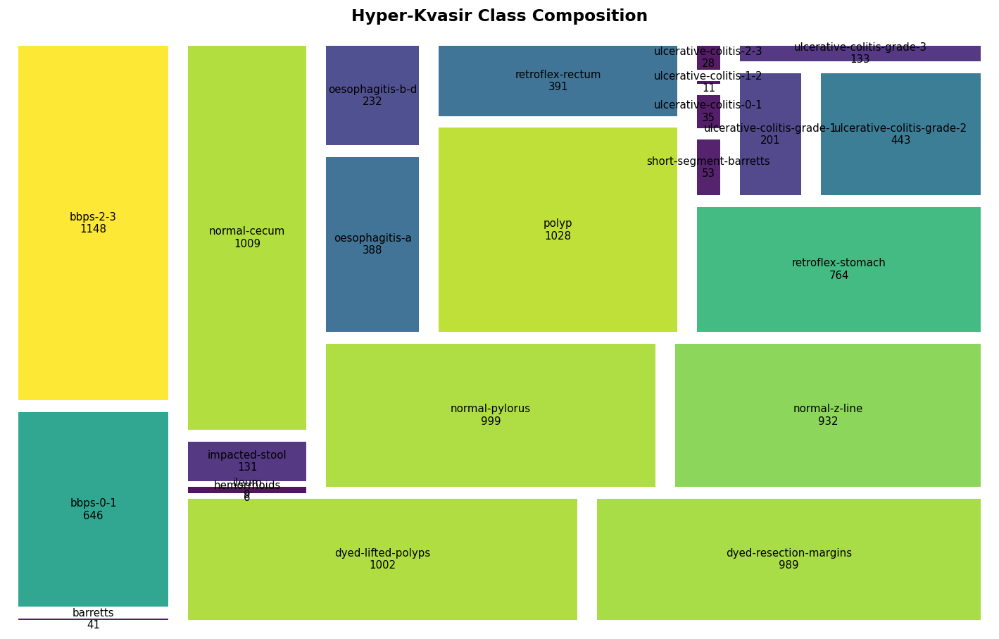

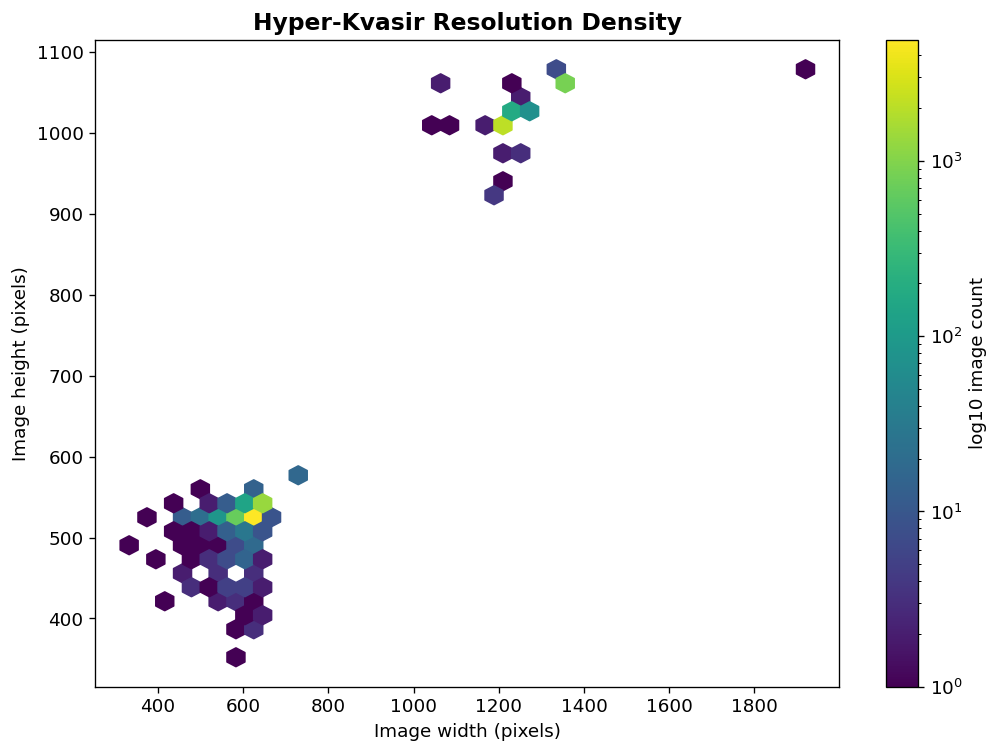

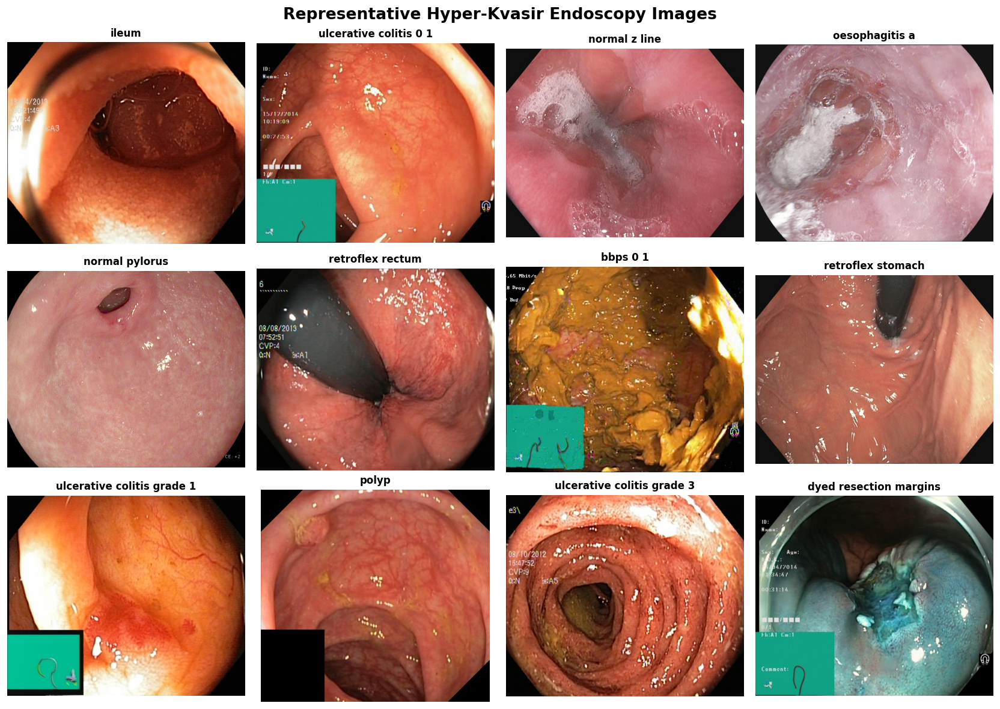

In [ ]:
audit_path = CACHE / "image_audit.parquet"

if audit_path.exists():
    audit = pd.read_parquet(audit_path)
else:
    sample_df = cls_df.copy()
    rows = []
    for r in tqdm(sample_df.itertuples(index=False), total=len(sample_df), desc="Auditing Hyper-Kvasir"):
        try:
            with Image.open(r.path) as im:
                w, h = im.size
            rows.append({"filename": r.filename, "class_name": r.class_name, "width": w, "height": h})
        except Exception:
            pass
    audit = pd.DataFrame(rows)
    audit["megapixels"] = audit["width"] * audit["height"] / 1e6
    audit["aspect_ratio"] = audit["width"] / audit["height"]
    audit.to_parquet(audit_path, index=False)

counts = cls_df["class_name"].value_counts().reindex(HK_CLASSES)
cmap = mpl.colormaps["viridis"]
norm = mpl.colors.Normalize(vmin=counts.min(), vmax=counts.max())
colors = [cmap(norm(v)) for v in counts.values]

plt.figure(figsize=(15, 9))
squarify.plot(
    sizes=counts.values,
    label=[f"{k}\n{v}" for k, v in counts.items()],
    color=colors, alpha=.92, pad=True,
    text_kwargs={"fontsize": 9}
)
plt.axis("off")
plt.title("Hyper-Kvasir Class Composition", pad=16, weight="bold")
savefig("07a_hyperkvasir_class_treemap")
plt.show()

plt.figure(figsize=(10, 7))
hb = plt.hexbin(
    audit["width"], audit["height"], gridsize=38, mincnt=1,
    cmap="viridis", bins="log"
)
plt.xlabel("Image width (pixels)")
plt.ylabel("Image height (pixels)")
plt.title("Hyper-Kvasir Resolution Density", weight="bold")
plt.colorbar(hb, label="log10 image count")
savefig("07b_resolution_hexbin")
plt.show()

rng = np.random.default_rng(SEED)
sample_classes = rng.choice(HK_CLASSES, size=min(12, len(HK_CLASSES)), replace=False)
fig, axes = plt.subplots(3, 4, figsize=(14, 10))
for ax, cls in zip(axes.ravel(), sample_classes):
    row = cls_df[cls_df.class_name == cls].sample(1, random_state=SEED).iloc[0]
    img = Image.open(row.path).convert("RGB")
    ax.imshow(img)
    ax.set_title(cls.replace("-", " "), fontsize=10, weight="bold")
    ax.axis("off")
plt.suptitle("Representative Hyper-Kvasir Endoscopy Images", fontsize=16, weight="bold")
plt.tight_layout()
savefig("07c_hyperkvasir_mosaic")
plt.show()

mark_stage("07_dataset_audit")

## Stage 08 — Segmentation Geometry and Mask Burden

Loaded cached mask statistics: /content/drive/MyDrive/MTG_MaxViTX/cache/segmentation_mask_stats_v2.parquet

SEGMENTATION MASK AUDIT
Masks analysed: 1000
Mean foreground fraction: 0.1539
Median foreground fraction: 0.1140


mask_fraction                 bbox_w_fraction                  \
               mean  median     std            mean  median     std   
split                                                                 
test         0.1514  0.1145  0.1167          0.4528  0.3971  0.2277   
train        0.1547  0.1171  0.1338          0.4480  0.3783  0.2419   
val          0.1539  0.1111  0.1319          0.4387  0.3714  0.2317   

      bbox_h_fraction                  
                 mean  median     std  
split                                  
test           0.5264  0.4934  0.2371  
train          0.5188  0.4688  0.2488  
val            0.5158  0.4625  0.2455

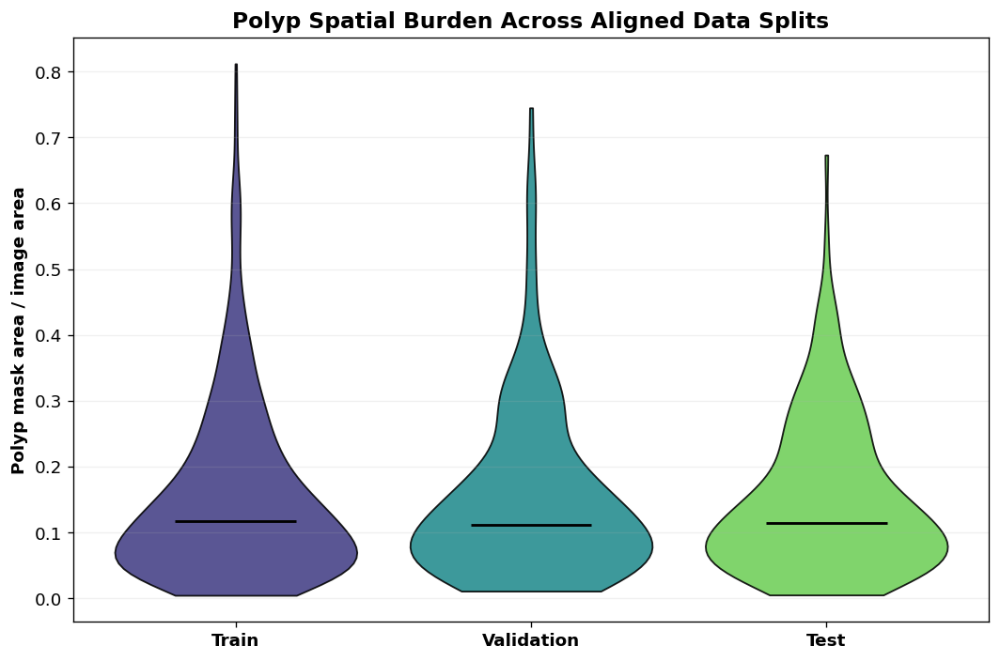

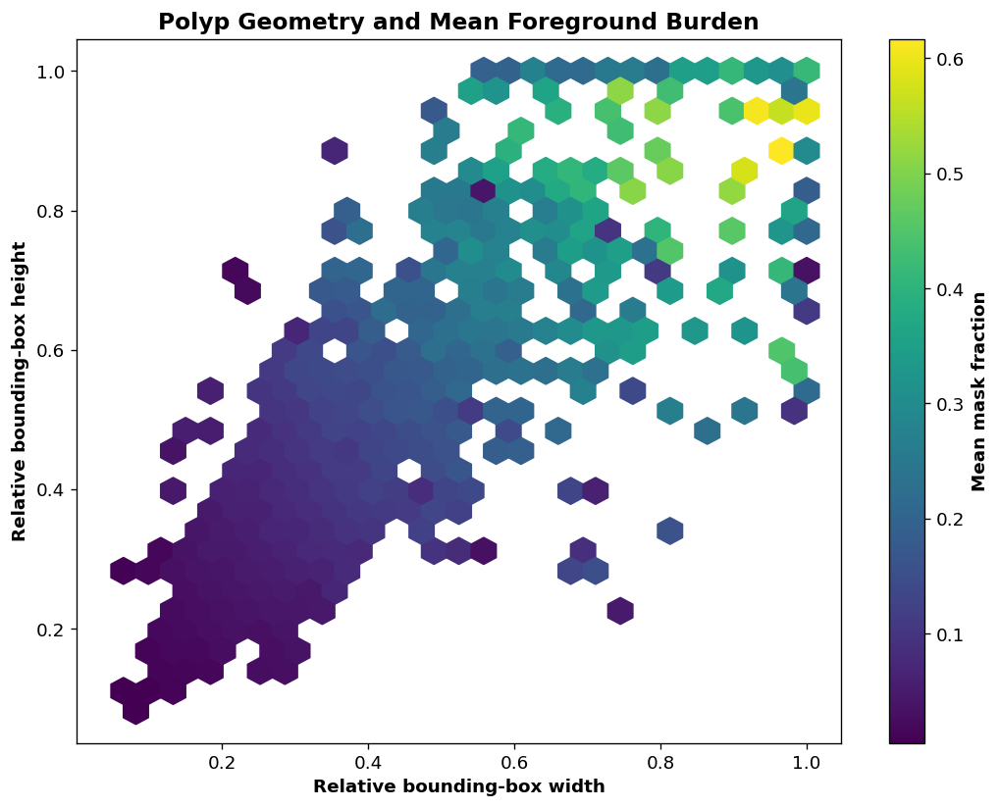

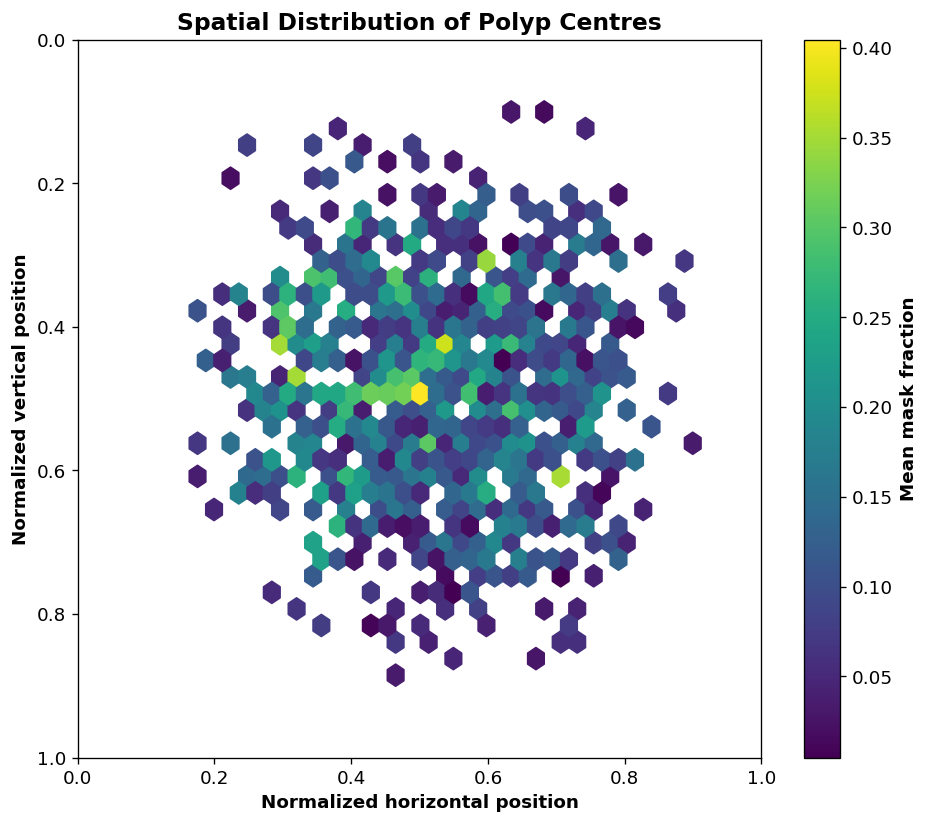

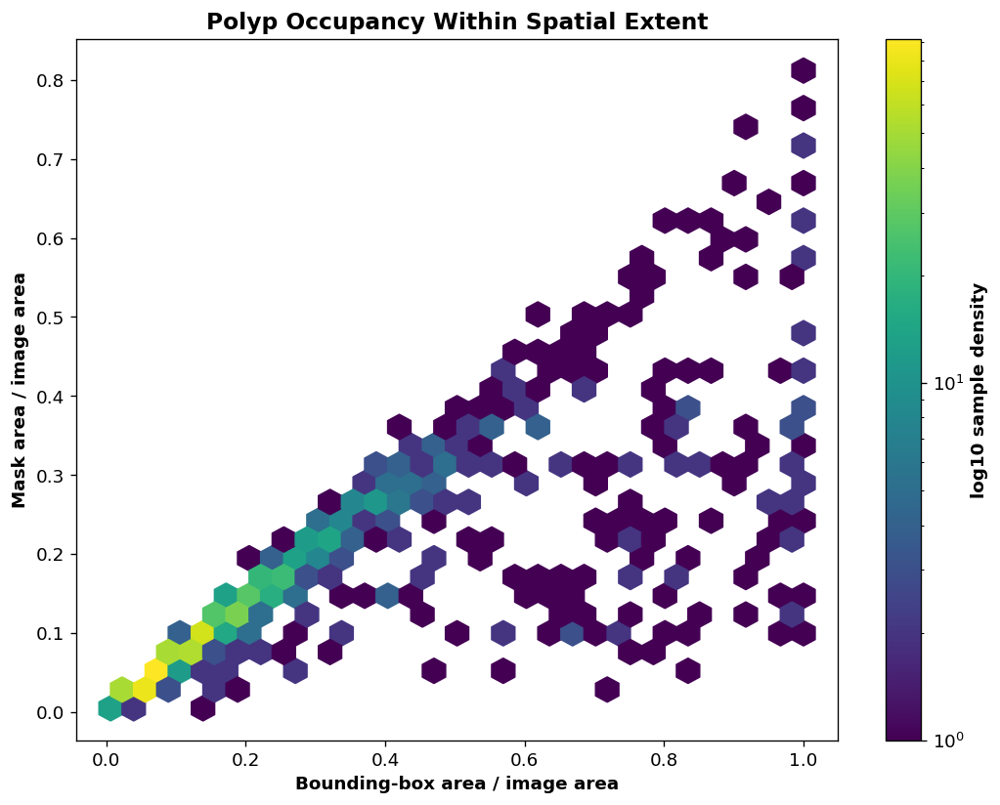


✓ Segmentation mask statistics completed
✓ Publication figures saved at 300 DPI


In [ ]:
# ============================================================
# STAGE 08 — SEGMENTATION GEOMETRY AND MASK BURDEN
# ============================================================

mask_stats_path = CACHE / "segmentation_mask_stats_v2.parquet"

if mask_stats_path.exists():

    mask_stats = pd.read_parquet(
        mask_stats_path
    )

    print(
        "Loaded cached mask statistics:",
        mask_stats_path
    )

else:

    rows = []

    for r in tqdm(
        seg_df.itertuples(index=False),
        total=len(seg_df),
        desc="Mask statistics"
    ):

        mask = cv2.imread(
            str(r.mask_path),
            cv2.IMREAD_GRAYSCALE
        )

        if mask is None:
            continue

        fg = mask > 127

        frac = float(
            fg.mean()
        )

        ys, xs = np.where(
            fg
        )

        if len(xs) > 0:

            bw = (
                xs.max()
                - xs.min()
                + 1
            ) / mask.shape[1]

            bh = (
                ys.max()
                - ys.min()
                + 1
            ) / mask.shape[0]

            cx = (
                (
                    xs.min()
                    + xs.max()
                )
                / 2.0
                / mask.shape[1]
            )

            cy = (
                (
                    ys.min()
                    + ys.max()
                )
                / 2.0
                / mask.shape[0]
            )

        else:

            bw = 0.0
            bh = 0.0
            cx = np.nan
            cy = np.nan

        filename = getattr(
            r,
            "seg_filename",
            Path(str(r.image_path)).name
        )

        rows.append(
            {
                "filename": filename,
                "split": str(r.split),
                "fold": int(r.fold),
                "mask_fraction": frac,
                "bbox_w_fraction": float(bw),
                "bbox_h_fraction": float(bh),
                "bbox_center_x": float(cx) if np.isfinite(cx) else np.nan,
                "bbox_center_y": float(cy) if np.isfinite(cy) else np.nan,
                "mask_width": int(mask.shape[1]),
                "mask_height": int(mask.shape[0]),
            }
        )

    mask_stats = pd.DataFrame(
        rows
    )

    if len(mask_stats) == 0:
        raise RuntimeError(
            "No valid segmentation masks were processed."
        )

    expected_columns = {
        "filename",
        "split",
        "fold",
        "mask_fraction",
        "bbox_w_fraction",
        "bbox_h_fraction",
        "bbox_center_x",
        "bbox_center_y",
    }

    missing_columns = (
        expected_columns
        - set(mask_stats.columns)
    )

    if missing_columns:
        raise RuntimeError(
            f"Mask statistics missing columns: {sorted(missing_columns)}"
        )

    if not mask_stats["split"].isin(
        ["train", "val", "test"]
    ).all():
        raise RuntimeError(
            "Unexpected split values in mask statistics."
        )

    mask_stats.to_parquet(
        mask_stats_path,
        index=False
    )

# ------------------------------------------------------------
# Summary
# ------------------------------------------------------------

print("\n" + "=" * 65)
print("SEGMENTATION MASK AUDIT")
print("=" * 65)

print("Masks analysed:", len(mask_stats))
print(
    "Mean foreground fraction:",
    f"{mask_stats['mask_fraction'].mean():.4f}"
)
print(
    "Median foreground fraction:",
    f"{mask_stats['mask_fraction'].median():.4f}"
)

display(
    mask_stats
    .groupby("split")[
        [
            "mask_fraction",
            "bbox_w_fraction",
            "bbox_h_fraction",
        ]
    ]
    .agg(["mean", "median", "std"])
    .round(4)
)

# ------------------------------------------------------------
# Violin: mask burden by split
# ------------------------------------------------------------

split_order = ["train", "val", "test"]

vals = [
    mask_stats.loc[
        mask_stats["split"].eq(s),
        "mask_fraction"
    ].dropna().values
    for s in split_order
]

valid = [
    (s, v)
    for s, v in zip(split_order, vals)
    if len(v) > 0
]

plot_vals = [
    x[1]
    for x in valid
]

label_map = {
    "train": "Train",
    "val": "Validation",
    "test": "Test",
}

plot_labels = [
    label_map[x[0]]
    for x in valid
]

plt.figure(
    figsize=(9, 6)
)

parts = plt.violinplot(
    plot_vals,
    showmeans=False,
    showmedians=True,
    showextrema=False,
    widths=0.82
)

for i, body in enumerate(
    parts["bodies"]
):

    body.set_facecolor(
        mpl.colormaps["viridis"](
            0.18 + 0.30 * i
        )
    )

    body.set_edgecolor(
        "black"
    )

    body.set_linewidth(
        1.1
    )

    body.set_alpha(
        0.88
    )

parts["cmedians"].set_color(
    "black"
)

parts["cmedians"].set_linewidth(
    1.7
)

plt.xticks(
    range(1, len(plot_labels) + 1),
    plot_labels,
    fontweight="bold"
)

plt.ylabel(
    "Polyp mask area / image area",
    fontweight="bold"
)

plt.title(
    "Polyp Spatial Burden Across Aligned Data Splits",
    weight="bold"
)

plt.grid(
    axis="y",
    alpha=0.18
)

plt.tight_layout()

savefig(
    "08a_mask_fraction_violin"
)

plt.show()

# ------------------------------------------------------------
# Hexbin: bounding-box geometry
# ------------------------------------------------------------

plt.figure(
    figsize=(9, 7)
)

hb = plt.hexbin(
    mask_stats["bbox_w_fraction"],
    mask_stats["bbox_h_fraction"],
    C=mask_stats["mask_fraction"],
    reduce_C_function=np.mean,
    gridsize=28,
    cmap="viridis",
    mincnt=1
)

plt.xlabel(
    "Relative bounding-box width",
    fontweight="bold"
)

plt.ylabel(
    "Relative bounding-box height",
    fontweight="bold"
)

plt.title(
    "Polyp Geometry and Mean Foreground Burden",
    weight="bold"
)

cbar = plt.colorbar(
    hb
)

cbar.set_label(
    "Mean mask fraction",
    fontweight="bold"
)

plt.tight_layout()

savefig(
    "08b_polyp_geometry_hexbin"
)

plt.show()

# ------------------------------------------------------------
# Hexbin: polyp centre distribution
# ------------------------------------------------------------

valid_centers = mask_stats[
    [
        "bbox_center_x",
        "bbox_center_y",
        "mask_fraction",
    ]
].dropna()

plt.figure(
    figsize=(8, 7)
)

hb_center = plt.hexbin(
    valid_centers["bbox_center_x"],
    valid_centers["bbox_center_y"],
    C=valid_centers["mask_fraction"],
    reduce_C_function=np.mean,
    gridsize=30,
    cmap="viridis",
    mincnt=1
)

plt.xlim(0, 1)
plt.ylim(1, 0)

plt.xlabel(
    "Normalized horizontal position",
    fontweight="bold"
)

plt.ylabel(
    "Normalized vertical position",
    fontweight="bold"
)

plt.title(
    "Spatial Distribution of Polyp Centres",
    weight="bold"
)

cbar = plt.colorbar(
    hb_center
)

cbar.set_label(
    "Mean mask fraction",
    fontweight="bold"
)

plt.tight_layout()

savefig(
    "08c_polyp_center_hexbin"
)

plt.show()

# ------------------------------------------------------------
# Hexbin: bounding-box area versus mask area
# ------------------------------------------------------------

mask_stats["bbox_area_fraction"] = (
    mask_stats["bbox_w_fraction"]
    * mask_stats["bbox_h_fraction"]
)

plt.figure(
    figsize=(9, 7)
)

hb_area = plt.hexbin(
    mask_stats["bbox_area_fraction"],
    mask_stats["mask_fraction"],
    gridsize=30,
    cmap="viridis",
    mincnt=1,
    bins="log"
)

plt.xlabel(
    "Bounding-box area / image area",
    fontweight="bold"
)

plt.ylabel(
    "Mask area / image area",
    fontweight="bold"
)

plt.title(
    "Polyp Occupancy Within Spatial Extent",
    weight="bold"
)

cbar = plt.colorbar(
    hb_area
)

cbar.set_label(
    "log10 sample density",
    fontweight="bold"
)

plt.tight_layout()

savefig(
    "08d_mask_bbox_density"
)

plt.show()

mask_stats.to_parquet(
    mask_stats_path,
    index=False
)

mask_stats.to_csv(
    RESULTS / "segmentation_mask_statistics.csv",
    index=False
)

mark_stage(
    "08_mask_audit_v2",
    {
        "n": int(len(mask_stats)),
        "mean_mask_fraction": float(
            mask_stats["mask_fraction"].mean()
        ),
        "median_mask_fraction": float(
            mask_stats["mask_fraction"].median()
        ),
    }
)

print("\n✓ Segmentation mask statistics completed")
print("✓ Publication figures saved at 300 DPI")

## Stage 09 — GastroVision External Dataset Index and Taxonomy Mapping

In [ ]:
def normalize_name(x):
    x = str(x).strip().lower()
    x = x.replace("’", "'").replace("–", "-").replace("_", "-")
    for token in ["'", ".", ",", "(", ")"]:
        x = x.replace(token, "")
    x = "-".join(x.replace("/", "-").split())
    while "--" in x:
        x = x.replace("--", "-")
    return x

GV_ALIAS_TO_HK = {
    "pylorus": "normal-pylorus",
    "normal-pylorus": "normal-pylorus",
    "cecum": "normal-cecum",
    "normal-cecum": "normal-cecum",
    "terminal-ileum": "ileum",
    "ileum": "ileum",
    "retroflex-rectum": "retroflex-rectum",
    "retroflexed-rectum": "retroflex-rectum",
    "normal-z-line": "normal-z-line",
    "z-line": "normal-z-line",
    "dyed-lifted-polyp": "dyed-lifted-polyps",
    "dyed-lifted-polyps": "dyed-lifted-polyps",
    "dyed-resection-margin": "dyed-resection-margins",
    "dyed-resection-margins": "dyed-resection-margins",
    "colon-polyps": "polyp",
    "colon-polyp": "polyp",
    "colorectal-polyp": "polyp",
    "colorectal-polyps": "polyp",
}

gv_index_path = META / "gastrovision_index.parquet"

if gv_index_path.exists():
    gv_df = pd.read_parquet(gv_index_path)
else:
    gv_images = image_files(gastro_raw)
    basename_map = defaultdict(list)
    for p in gv_images:
        basename_map[p.name].append(p)

    metadata_candidates = list(gastro_raw.rglob("*metadata*.csv")) + list(gastro_raw.rglob("GastroVision_metadata.csv"))
    rows = []

    if metadata_candidates:
        meta_csv = pd.read_csv(metadata_candidates[0])
        cols_norm = {normalize_name(c): c for c in meta_csv.columns}
        file_col = next((cols_norm[k] for k in cols_norm if "filename" in k or k == "file"), None)
        class_col = next((cols_norm[k] for k in cols_norm if k in {"class", "class-name", "label", "category"} or "class" in k), None)

        if file_col and class_col:
            for _, r in meta_csv.iterrows():
                fn = str(r[file_col])
                cls = str(r[class_col])
                paths = basename_map.get(Path(fn).name, [])
                if paths:
                    rows.append({"path": str(paths[0]), "filename": Path(fn).name, "gv_class": cls})

    if not rows:
        for p in gv_images:
            # Class folders are expected near the image. Use the nearest meaningful parent.
            parents = [q.name for q in p.parents[:5]]
            parent = next((x for x in parents if normalize_name(x) not in {"images", "image", "train", "test", "val", "validation"}), p.parent.name)
            rows.append({"path": str(p), "filename": p.name, "gv_class": parent})

    gv_df = pd.DataFrame(rows).drop_duplicates("path")
    gv_df["gv_norm"] = gv_df["gv_class"].map(normalize_name)
    gv_df["hk_class"] = gv_df["gv_norm"].map(GV_ALIAS_TO_HK)
    gv_df["hk_label"] = gv_df["hk_class"].map({c: i for i, c in enumerate(HK_CLASSES)})
    gv_df.to_parquet(gv_index_path, index=False)

gv_mapped = gv_df[gv_df["hk_label"].notna()].copy()
gv_mapped["hk_label"] = gv_mapped["hk_label"].astype(int)
gv_mapped.to_csv(SPLITS / "gastrovision_external_mapped.csv", index=False)

display(gv_df["gv_class"].value_counts().rename("n").to_frame())
display(gv_mapped.groupby(["gv_class", "hk_class"]).size().rename("n").reset_index())

assert len(gv_mapped) > 0, "No unambiguous GastroVision-to-Hyper-Kvasir overlapping classes were detected."
mark_stage("09_gastrovision_mapping", {"all_images": int(len(gv_df)), "mapped_images": int(len(gv_mapped))})

,n
gv_class,
Normal mucosa and vascular pattern in the large bowel,1467
Accessory tools,1266
Normal stomach,969
Small bowel_terminal ileum,846
Colon polyps,820
Pylorus,393
Gastroesophageal_junction_normal z-line,330
Dyed-resection-margins,246
Duodenal bulb,205


,gv_class,hk_class,n
0,Cecum,normal-cecum,113
1,Colon polyps,polyp,820
2,Dyed-lifted-polyps,dyed-lifted-polyps,141
3,Dyed-resection-margins,dyed-resection-margins,246
4,Pylorus,normal-pylorus,393
5,Retroflex rectum,retroflex-rectum,67


### Stage 09C — Persistent Runtime Cache Restore

Restores the verified segmentation runtime cache from a single Drive archive before Stage 10. This avoids repeating the expensive 1,000-pair Drive preflight on later Colab sessions.

In [ ]:
# ============================================================
# STAGE 09C — PERSISTENT SEGMENTATION CACHE RESTORE
# ============================================================

import tarfile

PERSISTENT_RUNTIME_CACHE_DIR = CACHE / "runtime_cache_archives"
PERSISTENT_RUNTIME_CACHE_DIR.mkdir(parents=True, exist_ok=True)

LOCAL_SEG_CACHE = Path("/content/MTG_MaxViTX_segmentation_cache")
SEG_CACHE_ARCHIVE = PERSISTENT_RUNTIME_CACHE_DIR / "hyper_kvasir_segmentation_runtime.tar"
SEG_CACHE_INDEX = PERSISTENT_RUNTIME_CACHE_DIR / "hyper_kvasir_segmentation_runtime_index.csv"
SEG_CACHE_MANIFEST = PERSISTENT_RUNTIME_CACHE_DIR / "hyper_kvasir_segmentation_runtime_manifest.json"


def segmentation_cache_signature(frame):
    ordered = frame.sort_values("seg_filename")
    records = [
        f"{r.seg_filename}|{r.fold}|{r.split}"
        for r in ordered.itertuples(index=False)
    ]
    return hashlib.sha256("\n".join(records).encode("utf-8")).hexdigest()


def restore_segmentation_runtime_cache(frame):
    import tarfile
    required = [SEG_CACHE_ARCHIVE, SEG_CACHE_INDEX, SEG_CACHE_MANIFEST]
    if not all(p.exists() for p in required):
        return None
    try:
        manifest = json.loads(SEG_CACHE_MANIFEST.read_text())
        signature = segmentation_cache_signature(frame)
        if manifest.get("signature") != signature:
            print("Segmentation persistent cache signature changed; full audit required.")
            return None
        if int(manifest.get("pairs", -1)) != len(frame):
            return None
        runtime_df = pd.read_csv(SEG_CACHE_INDEX)
        if len(runtime_df) != len(frame):
            return None
        local_ok = (
            runtime_df["image_path"].map(lambda p: Path(str(p)).exists()).all()
            and runtime_df["mask_path"].map(lambda p: Path(str(p)).exists()).all()
        )
        if not local_ok:
            print("Restoring verified segmentation cache from Drive archive...")
            local_tar = Path("/content") / SEG_CACHE_ARCHIVE.name
            if (
                (not local_tar.exists())
                or (local_tar.stat().st_size != SEG_CACHE_ARCHIVE.stat().st_size)
            ):
                shutil.copy2(SEG_CACHE_ARCHIVE, local_tar)
            if LOCAL_SEG_CACHE.exists():
                shutil.rmtree(LOCAL_SEG_CACHE)
            with tarfile.open(local_tar, "r") as tf:
                tf.extractall(Path("/content"))
            local_ok = (
                runtime_df["image_path"].map(lambda p: Path(str(p)).exists()).all()
                and runtime_df["mask_path"].map(lambda p: Path(str(p)).exists()).all()
            )
        if not local_ok:
            return None
        print("✓ Restored verified segmentation runtime cache:", len(runtime_df), "pairs")
        return runtime_df.reset_index(drop=True)
    except Exception as e:
        print("Segmentation cache restore warning:", e)
        return None


def persist_segmentation_runtime_cache(runtime_df, source_frame):
    import tarfile
    try:
        signature = segmentation_cache_signature(source_frame)
        if SEG_CACHE_ARCHIVE.exists() and SEG_CACHE_INDEX.exists() and SEG_CACHE_MANIFEST.exists():
            try:
                manifest = json.loads(SEG_CACHE_MANIFEST.read_text())
                if manifest.get("signature") == signature and int(manifest.get("pairs", -1)) == len(runtime_df):
                    print("✓ Segmentation persistent archive already saved")
                    return True
            except Exception:
                pass
        runtime_df.to_csv(SEG_CACHE_INDEX, index=False)
        local_tar = Path("/content") / SEG_CACHE_ARCHIVE.name
        print("Creating persistent segmentation runtime archive...")
        with tarfile.open(local_tar, "w") as tf:
            tf.add(LOCAL_SEG_CACHE, arcname=LOCAL_SEG_CACHE.name, recursive=True)
        tmp = Path(str(SEG_CACHE_ARCHIVE) + ".tmp")
        shutil.copy2(local_tar, tmp)
        os.replace(tmp, SEG_CACHE_ARCHIVE)
        SEG_CACHE_MANIFEST.write_text(json.dumps({
            "pairs": int(len(runtime_df)),
            "signature": signature,
            "created": time.strftime("%Y-%m-%d %H:%M:%S"),
        }, indent=2))
        print("✓ Saved segmentation persistent archive:", SEG_CACHE_ARCHIVE)
        return True
    except Exception as e:
        print("WARNING: segmentation cache archive save failed:", e)
        return False


_restored_seg_runtime = restore_segmentation_runtime_cache(seg_df)
SEGMENTATION_PERSISTENT_READY = _restored_seg_runtime is not None

if SEGMENTATION_PERSISTENT_READY:
    seg_df_local = _restored_seg_runtime.copy()
    seg_df_verified = seg_df.copy().reset_index(drop=True)
    coverage = 1.0
    print("✓ Stage 10 will skip raw segmentation Drive preflight")
else:
    print("No verified persistent segmentation cache yet; Stage 10 will audit once.")

No verified persistent segmentation cache yet; Stage 10 will audit once.


## Stage 10 — Data Transforms, Datasets, and Loaders

In [ ]:
import tarfile

# ============================================================
# STAGE 10 — ROBUST DATA TRANSFORMS, I/O AUDIT, LOCAL CACHE,
#            DATASETS, AND LOADERS
# ============================================================

MEAN = (0.485, 0.456, 0.406)
STD = (0.229, 0.224, 0.225)

cls_train_tf = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.12),
    A.Rotate(
        limit=12,
        border_mode=cv2.BORDER_REFLECT_101,
        p=0.45
    ),
    A.RandomBrightnessContrast(
        brightness_limit=0.12,
        contrast_limit=0.12,
        p=0.35
    ),
    A.HueSaturationValue(
        hue_shift_limit=4,
        sat_shift_limit=8,
        val_shift_limit=8,
        p=0.20
    ),
    A.GaussNoise(
        std_range=(0.01, 0.03),
        p=0.15
    ),
    A.Normalize(
        mean=MEAN,
        std=STD
    ),
    ToTensorV2(),
])

eval_tf = A.Compose([
    A.Resize(
        IMG_SIZE,
        IMG_SIZE
    ),
    A.Normalize(
        mean=MEAN,
        std=STD
    ),
    ToTensorV2(),
])

seg_train_tf = A.Compose([
    A.Resize(
        IMG_SIZE,
        IMG_SIZE
    ),
    A.HorizontalFlip(
        p=0.5
    ),
    A.VerticalFlip(
        p=0.12
    ),
    A.Rotate(
        limit=12,
        border_mode=cv2.BORDER_REFLECT_101,
        p=0.45
    ),
    A.RandomBrightnessContrast(
        brightness_limit=0.10,
        contrast_limit=0.10,
        p=0.30
    ),
    A.Normalize(
        mean=MEAN,
        std=STD
    ),
    ToTensorV2(),
])


# ============================================================
# ROBUST IMAGE READER
# ============================================================

def safe_cv2_read(
    path,
    flags=cv2.IMREAD_COLOR,
    retries=4,
    sleep_s=0.08
):
    """
    Robust reader for Google Drive / Colab file systems.

    Attempts:
      1. cv2.imread
      2. np.fromfile + cv2.imdecode
      3. PIL fallback

    Returns None only after all retries fail.
    """
    path = Path(
        str(path)
    )

    for attempt in range(
        retries
    ):
        try:
            if (
                not path.exists()
                or
                not path.is_file()
                or
                path.stat().st_size <= 0
            ):
                return None

            img = cv2.imread(
                str(path),
                flags
            )

            if img is not None:
                return img

            # Fallback for path / filesystem issues.
            raw = np.fromfile(
                str(path),
                dtype=np.uint8
            )

            if raw.size > 0:
                img = cv2.imdecode(
                    raw,
                    flags
                )

                if img is not None:
                    return img

            # PIL fallback.
            with Image.open(
                path
            ) as pil_img:

                if flags == cv2.IMREAD_GRAYSCALE:
                    arr = np.asarray(
                        pil_img.convert("L")
                    )
                    return arr

                arr = np.asarray(
                    pil_img.convert("RGB")
                )

                # Convert RGB -> BGR to preserve cv2.imread semantics.
                return cv2.cvtColor(
                    arr,
                    cv2.COLOR_RGB2BGR
                )

        except Exception:
            pass

        if attempt < retries - 1:
            time.sleep(
                sleep_s
                *
                (
                    attempt + 1
                )
            )

    return None


# ============================================================
# SEGMENTATION I/O PREFLIGHT AUDIT
# ============================================================

def audit_segmentation_io(
    frame
):
    rows = []

    for r in tqdm(
        frame.itertuples(
            index=False
        ),
        total=len(
            frame
        ),
        desc="Segmentation I/O preflight"
    ):
        image_path = Path(
            str(
                r.image_path
            )
        )

        mask_path = Path(
            str(
                r.mask_path
            )
        )

        image_exists = (
            image_path.exists()
            and
            image_path.is_file()
        )

        mask_exists = (
            mask_path.exists()
            and
            mask_path.is_file()
        )

        image_size = (
            image_path.stat().st_size
            if image_exists
            else 0
        )

        mask_size = (
            mask_path.stat().st_size
            if mask_exists
            else 0
        )

        image = (
            safe_cv2_read(
                image_path,
                cv2.IMREAD_COLOR,
                retries=2
            )
            if image_exists
            else None
        )

        mask = (
            safe_cv2_read(
                mask_path,
                cv2.IMREAD_GRAYSCALE,
                retries=2
            )
            if mask_exists
            else None
        )

        image_readable = (
            image is not None
        )

        mask_readable = (
            mask is not None
        )

        shape_ok = (
            image_readable
            and mask_readable
            and (image.shape[:2] == mask.shape[:2])
        )

        valid = (
            image_exists
            and
            mask_exists
            and
            image_size > 0
            and
            mask_size > 0
            and
            image_readable
            and
            mask_readable
            and
            shape_ok
        )

        reason = "ok"

        if not image_exists:
            reason = "image_missing"

        elif image_size <= 0:
            reason = "image_zero_bytes"

        elif not image_readable:
            reason = "image_unreadable"

        elif not mask_exists:
            reason = "mask_missing"

        elif mask_size <= 0:
            reason = "mask_zero_bytes"

        elif not mask_readable:
            reason = "mask_unreadable"

        elif not shape_ok:
            reason = "image_mask_shape_mismatch"

        filename = getattr(
            r,
            "seg_filename",
            Path(
                str(
                    r.image_path
                )
            ).name
        )

        rows.append({
            "filename":
                filename,

            "image_path":
                str(
                    image_path
                ),

            "mask_path":
                str(
                    mask_path
                ),

            "split":
                str(
                    r.split
                ),

            "fold":
                int(
                    r.fold
                ),

            "image_exists":
                bool(
                    image_exists
                ),

            "mask_exists":
                bool(
                    mask_exists
                ),

            "image_size_bytes":
                int(
                    image_size
                ),

            "mask_size_bytes":
                int(
                    mask_size
                ),

            "image_readable":
                bool(
                    image_readable
                ),

            "mask_readable":
                bool(
                    mask_readable
                ),

            "shape_ok":
                bool(
                    shape_ok
                ),

            "valid":
                bool(
                    valid
                ),

            "reason":
                reason,
        })

    return pd.DataFrame(
        rows
    )


if globals().get("SEGMENTATION_PERSISTENT_READY", False):
    print()
    print("=" * 70)
    print("SEGMENTATION PERSISTENT CACHE ACTIVE")
    print("=" * 70)
    print("Verified pairs:", len(seg_df_local))
    print("✓ Full Drive I/O preflight skipped")
    print("✓ Local runtime cache reused")

else:
    seg_io_audit = audit_segmentation_io(
        seg_df
    )

    seg_io_audit.to_csv(
        RESULTS
        / "segmentation_io_preflight_audit.csv",
        index=False
    )

    print()
    print(
        "=" * 70
    )

    print(
        "SEGMENTATION I/O PREFLIGHT"
    )

    print(
        "=" * 70
    )

    print(
        "Total segmentation pairs:",
        len(
            seg_io_audit
        )
    )

    print(
        "Valid/readable pairs:",
        int(
            seg_io_audit[
                "valid"
            ].sum()
        )
    )

    print(
        "Invalid pairs:",
        int(
            (
                ~seg_io_audit[
                    "valid"
                ]
            ).sum()
        )
    )

    if (
        ~seg_io_audit[
            "valid"
        ]
    ).any():

        print(
            "\nInvalid-pair reasons:"
        )

        display(
            seg_io_audit.loc[
                ~seg_io_audit[
                    "valid"
                ],
                [
                    "filename",
                    "split",
                    "reason",
                    "image_path",
                    "mask_path",
                ]
            ]
        )


    # ============================================================
    # FILTER ONLY VERIFIED PAIRS
    # ============================================================

    valid_seg_names = set(
        seg_io_audit.loc[
            seg_io_audit[
                "valid"
            ],
            "filename"
        ]
    )

    seg_df_verified = (
        seg_df[
            seg_df[
                "seg_filename"
            ].isin(
                valid_seg_names
            )
        ]
        .copy()
        .reset_index(
            drop=True
        )
    )

    coverage = (
        len(
            seg_df_verified
        )
        /
        max(
            1,
            len(
                seg_df
            )
        )
    )

    print(
        "\nVerified segmentation coverage:",
        f"{coverage * 100:.2f}%"
    )

    # Do not silently proceed with a badly damaged segmentation set.
    if coverage < 0.95:
        raise RuntimeError(
            f"Only {coverage * 100:.2f}% of segmentation pairs "
            "passed the I/O preflight. Inspect "
            "segmentation_io_preflight_audit.csv before training."
        )


    # ============================================================
    # LOCAL /CONTENT CACHE FOR SEGMENTATION FILES
    # ============================================================

    LOCAL_SEG_CACHE = Path(
        "/content/MTG_MaxViTX_segmentation_cache"
    )

    LOCAL_SEG_IMAGES = (
        LOCAL_SEG_CACHE
        / "images"
    )

    LOCAL_SEG_MASKS = (
        LOCAL_SEG_CACHE
        / "masks"
    )

    LOCAL_SEG_IMAGES.mkdir(
        parents=True,
        exist_ok=True
    )

    LOCAL_SEG_MASKS.mkdir(
        parents=True,
        exist_ok=True
    )


    def copy_verified_segmentation_to_local(
        frame
    ):
        local_rows = []

        for r in tqdm(
            frame.itertuples(
                index=False
            ),
            total=len(
                frame
            ),
            desc="Caching segmentation pairs locally"
        ):
            filename = getattr(
                r,
                "seg_filename",
                Path(
                    str(
                        r.image_path
                    )
                ).name
            )

            image_src = Path(
                str(
                    r.image_path
                )
            )

            mask_src = Path(
                str(
                    r.mask_path
                )
            )

            # Include stem hash so duplicate filenames can never collide.
            key = hashlib.md5(
                (
                    str(
                        image_src
                    )
                    +
                    "|"
                    +
                    str(
                        mask_src
                    )
                ).encode(
                    "utf-8"
                )
            ).hexdigest()[
                :10
            ]

            image_dst = (
                LOCAL_SEG_IMAGES
                /
                f"{key}_{filename}"
            )

            mask_suffix = (
                mask_src.suffix
                if mask_src.suffix
                else ".png"
            )

            mask_dst = (
                LOCAL_SEG_MASKS
                /
                f"{key}_{Path(filename).stem}{mask_suffix}"
            )

            if (
                (not image_dst.exists())
                or
                (
                    image_dst.stat().st_size
                    != image_src.stat().st_size
                )
            ):
                shutil.copy2(
                    image_src,
                    image_dst
                )

            if (
                (not mask_dst.exists())
                or
                (
                    mask_dst.stat().st_size
                    != mask_src.stat().st_size
                )
            ):
                shutil.copy2(
                    mask_src,
                    mask_dst
                )

            # Verify the local copies once.
            local_img = safe_cv2_read(
                image_dst,
                cv2.IMREAD_COLOR,
                retries=2
            )

            local_mask = safe_cv2_read(
                mask_dst,
                cv2.IMREAD_GRAYSCALE,
                retries=2
            )

            if (
                local_img is None
                or
                local_mask is None
            ):
                raise RuntimeError(
                    f"Local cache verification failed for {filename}"
                )

            row = r._asdict()

            row[
                "image_path"
            ] = str(
                image_dst
            )

            row[
                "mask_path"
            ] = str(
                mask_dst
            )

            local_rows.append(
                row
            )

        return pd.DataFrame(
            local_rows
        )


    seg_df_local = copy_verified_segmentation_to_local(
        seg_df_verified
    )

    seg_df_local.to_csv(
        CACHE
        / "segmentation_local_runtime_index.csv",
        index=False
    )

    print(
        "\n✓ Segmentation dataset cached locally:"
    )

    print(
        LOCAL_SEG_CACHE
    )

    if "persist_segmentation_runtime_cache" in globals():
        persist_segmentation_runtime_cache(
            seg_df_local,
            seg_df
        )

# ============================================================
# DATASET CLASSES
# ============================================================

class ClassificationDataset(
    Dataset
):
    def __init__(
        self,
        frame,
        transform
    ):
        self.df = frame.reset_index(
            drop=True
        )

        self.transform = transform

    def __len__(
        self
    ):
        return len(
            self.df
        )

    def __getitem__(
        self,
        idx
    ):
        r = self.df.iloc[
            idx
        ]

        img = safe_cv2_read(
            r.path,
            cv2.IMREAD_COLOR
        )

        if img is None:
            raise RuntimeError(
                f"Unreadable classification image: {r.path}"
            )

        img = cv2.cvtColor(
            img,
            cv2.COLOR_BGR2RGB
        )

        x = self.transform(
            image=img
        )[
            "image"
        ]

        return (
            x,
            int(
                r.label
            ),
            r.filename
        )


class SegmentationDataset(
    Dataset
):
    def __init__(
        self,
        frame,
        transform
    ):
        self.df = frame.reset_index(
            drop=True
        )

        self.transform = transform

    def __len__(
        self
    ):
        return len(
            self.df
        )

    def __getitem__(
        self,
        idx
    ):
        r = self.df.iloc[
            idx
        ]

        img = safe_cv2_read(
            r.image_path,
            cv2.IMREAD_COLOR
        )

        if img is None:
            raise RuntimeError(
                f"Unreadable segmentation image: "
                f"{r.image_path}"
            )

        mask = safe_cv2_read(
            r.mask_path,
            cv2.IMREAD_GRAYSCALE
        )

        if mask is None:
            raise RuntimeError(
                f"Unreadable segmentation mask: "
                f"{r.mask_path}"
            )

        if img.shape[:2] != mask.shape[:2]:
            raise RuntimeError(
                "Segmentation image/mask shape mismatch: "
                f"{r.image_path} | {r.mask_path} | "
                f"{img.shape[:2]} vs {mask.shape[:2]}"
            )

        img = cv2.cvtColor(
            img,
            cv2.COLOR_BGR2RGB
        )

        mask = (
            mask > 127
        ).astype(
            np.float32
        )

        out = self.transform(
            image=img,
            mask=mask
        )

        x = out[
            "image"
        ]

        y = out[
            "mask"
        ].float()

        if y.ndim == 2:
            y = y.unsqueeze(
                0
            )

        filename = getattr(
            r,
            "seg_filename",
            Path(
                str(
                    r.image_path
                )
            ).name
        )

        return (
            x,
            y,
            filename
        )


class ExternalClassificationDataset(
    Dataset
):
    def __init__(
        self,
        frame,
        transform
    ):
        self.df = frame.reset_index(
            drop=True
        )

        self.transform = transform

    def __len__(
        self
    ):
        return len(
            self.df
        )

    def __getitem__(
        self,
        idx
    ):
        r = self.df.iloc[
            idx
        ]

        img = safe_cv2_read(
            r.path,
            cv2.IMREAD_COLOR
        )

        if img is None:
            raise RuntimeError(
                f"Unreadable external image: {r.path}"
            )

        img = cv2.cvtColor(
            img,
            cv2.COLOR_BGR2RGB
        )

        x = self.transform(
            image=img
        )[
            "image"
        ]

        return (
            x,
            int(
                r.hk_label
            ),
            r.filename
        )


# ============================================================
# SPLITS
# ============================================================

cls_train_df = (
    cls_df[
        cls_df.split == "train"
    ]
    .copy()
)

cls_val_df = (
    cls_df[
        cls_df.split == "val"
    ]
    .copy()
)

cls_test_df = (
    cls_df[
        cls_df.split == "test"
    ]
    .copy()
)

seg_train_df = (
    seg_df_local[
        seg_df_local.split == "train"
    ]
    .copy()
)

seg_val_df = (
    seg_df_local[
        seg_df_local.split == "val"
    ]
    .copy()
)

seg_test_df = (
    seg_df_local[
        seg_df_local.split == "test"
    ]
    .copy()
)


# ============================================================
# CLASS-BALANCED CLASSIFICATION SAMPLER
# ============================================================

class_counts = (
    cls_train_df[
        "label"
    ]
    .value_counts()
    .sort_index()
)

sample_weights = (
    cls_train_df[
        "label"
    ]
    .map(
        (
            1.0
            /
            class_counts
        ).to_dict()
    )
    .values
)

sampler = WeightedRandomSampler(
    sample_weights,
    num_samples=len(
        sample_weights
    ),
    replacement=True
)


# ============================================================
# DATALOADERS
# ============================================================

# Segmentation is now served from /content, so workers are safe.
# Classification remains on Drive but uses a retry-capable reader.

loader_workers = 0

cls_train_loader = DataLoader(
    ClassificationDataset(
        cls_train_df,
        cls_train_tf
    ),
    batch_size=BATCH_CLS,
    sampler=sampler,
    num_workers=loader_workers,
    pin_memory=(
        DEVICE.type == "cuda"
    ),
    persistent_workers=False,
)

cls_val_loader = DataLoader(
    ClassificationDataset(
        cls_val_df,
        eval_tf
    ),
    batch_size=BATCH_CLS,
    shuffle=False,
    num_workers=loader_workers,
    pin_memory=(
        DEVICE.type == "cuda"
    ),
    persistent_workers=False,
)

cls_test_loader = DataLoader(
    ClassificationDataset(
        cls_test_df,
        eval_tf
    ),
    batch_size=BATCH_CLS,
    shuffle=False,
    num_workers=loader_workers,
    pin_memory=(
        DEVICE.type == "cuda"
    ),
    persistent_workers=False,
)

seg_train_loader = DataLoader(
    SegmentationDataset(
        seg_train_df,
        seg_train_tf
    ),
    batch_size=BATCH_SEG,
    shuffle=True,
    num_workers=loader_workers,
    pin_memory=(
        DEVICE.type == "cuda"
    ),
    persistent_workers=False,
)

seg_val_loader = DataLoader(
    SegmentationDataset(
        seg_val_df,
        eval_tf
    ),
    batch_size=BATCH_SEG,
    shuffle=False,
    num_workers=loader_workers,
    pin_memory=(
        DEVICE.type == "cuda"
    ),
    persistent_workers=False,
)

seg_test_loader = DataLoader(
    SegmentationDataset(
        seg_test_df,
        eval_tf
    ),
    batch_size=BATCH_SEG,
    shuffle=False,
    num_workers=loader_workers,
    pin_memory=(
        DEVICE.type == "cuda"
    ),
    persistent_workers=False,
)

external_loader = DataLoader(
    ExternalClassificationDataset(
        gv_mapped,
        eval_tf
    ),
    batch_size=BATCH_CLS,
    shuffle=False,
    num_workers=loader_workers,
    pin_memory=(
        DEVICE.type == "cuda"
    ),
    persistent_workers=False,
)


# ============================================================
# DETERMINISTIC SINGLE-PROCESS EPOCH LOADERS
# ============================================================

def build_epoch_train_loaders(epoch_index):
    """Build repeatable train loaders with num_workers=0."""

    cls_gen = torch.Generator()
    cls_gen.manual_seed(SEED + 1000 * int(epoch_index) + 17)

    seg_gen = torch.Generator()
    seg_gen.manual_seed(SEED + 1000 * int(epoch_index) + 43)

    epoch_sampler = WeightedRandomSampler(
        weights=torch.as_tensor(sample_weights, dtype=torch.double),
        num_samples=len(sample_weights),
        replacement=True,
        generator=cls_gen,
    )

    epoch_cls_loader = DataLoader(
        ClassificationDataset(cls_train_df, cls_train_tf),
        batch_size=BATCH_CLS,
        sampler=epoch_sampler,
        num_workers=0,
        pin_memory=(DEVICE.type == "cuda"),
        persistent_workers=False,
        generator=cls_gen,
    )

    epoch_seg_loader = DataLoader(
        SegmentationDataset(seg_train_df, seg_train_tf),
        batch_size=BATCH_SEG,
        shuffle=True,
        num_workers=0,
        pin_memory=(DEVICE.type == "cuda"),
        persistent_workers=False,
        generator=seg_gen,
    )

    return epoch_cls_loader, epoch_seg_loader

print("DataLoader multiprocessing disabled: num_workers=0")
print("✓ Deterministic epoch-specific train loaders enabled")

# ============================================================
# ONE-BATCH SANITY CHECK BEFORE TRAINING
# ============================================================

def preflight_loader_batch(
    loader,
    name
):
    batch = next(
        iter(
            loader
        )
    )

    x = batch[
        0
    ]

    y = batch[
        1
    ]

    print(
        f"{name}: "
        f"x={tuple(x.shape)} | "
        f"y={tuple(y.shape)}"
    )


print()
print(
    "=" * 70
)

print(
    "FINAL DATALOADER SANITY CHECK"
)

print(
    "=" * 70
)

preflight_loader_batch(
    cls_train_loader,
    "Classification train"
)

preflight_loader_batch(
    cls_val_loader,
    "Classification validation"
)

preflight_loader_batch(
    seg_train_loader,
    "Segmentation train"
)

preflight_loader_batch(
    seg_val_loader,
    "Segmentation validation"
)

preflight_loader_batch(
    external_loader,
    "External classification"
)


print()
print(
    "Classification:",
    len(
        cls_train_df
    ),
    len(
        cls_val_df
    ),
    len(
        cls_test_df
    )
)

print(
    "Segmentation:",
    len(
        seg_train_df
    ),
    len(
        seg_val_df
    ),
    len(
        seg_test_df
    )
)

print(
    "External mapped:",
    len(
        gv_mapped
    )
)

print()
print(
    "✓ All loaders passed preflight"
)

print(
    "✓ Segmentation files served from local /content cache"
)

print(
    "✓ Invalid segmentation pairs audited before training"
)

mark_stage(
    "10_robust_dataloaders_v2",
    {
        "segmentation_pairs_original":
            int(
                len(
                    seg_df
                )
            ),

        "segmentation_pairs_verified":
            int(
                len(
                    seg_df_verified
                )
            ),

        "segmentation_coverage":
            float(
                coverage
            ),

        "local_seg_cache":
            str(
                LOCAL_SEG_CACHE
            ),
    }
)

# ============================================================
# V5 — LOCAL 256×256 CLASSIFICATION / EXTERNAL RUNTIME CACHE
# ============================================================

LOCAL_CLS_CACHE = Path(
    "/content/MTG_MaxViTX_classification_cache_256"
)

LOCAL_EXT_CACHE = Path(
    "/content/MTG_MaxViTX_gastrovision_cache_256"
)

LOCAL_CLS_CACHE.mkdir(
    parents=True,
    exist_ok=True
)

LOCAL_EXT_CACHE.mkdir(
    parents=True,
    exist_ok=True
)

PERSISTENT_RUNTIME_CACHE_DIR = (
    CACHE
    /
    "runtime_cache_archives"
)

PERSISTENT_RUNTIME_CACHE_DIR.mkdir(
    parents=True,
    exist_ok=True
)

CLS_CACHE_ARCHIVE = (
    PERSISTENT_RUNTIME_CACHE_DIR
    /
    "hyper_kvasir_classification_256.tar"
)

EXT_CACHE_ARCHIVE = (
    PERSISTENT_RUNTIME_CACHE_DIR
    /
    "gastrovision_mapped_256.tar"
)


def restore_runtime_cache_archive(
    archive_path,
    target_dir,
    expected_min_files
):
    import tarfile

    target_dir.mkdir(
        parents=True,
        exist_ok=True
    )

    existing = len(
        list(
            target_dir.glob(
                "*.jpg"
            )
        )
    )

    if existing >= expected_min_files:
        print(
            f"✓ Reusing existing local cache: "
            f"{target_dir} ({existing} files)"
        )
        return True

    if not archive_path.exists():
        return False

    print(
        "Restoring persistent runtime cache:"
    )

    print(
        " ",
        archive_path
    )

    local_archive = (
        Path(
            "/content"
        )
        /
        archive_path.name
    )

    if (
        (not local_archive.exists())
        or
        (
            local_archive.stat().st_size
            != archive_path.stat().st_size
        )
    ):
        shutil.copy2(
            archive_path,
            local_archive
        )

    with tarfile.open(
        local_archive,
        mode="r"
    ) as tf:
        tf.extractall(
            target_dir
        )

    restored = len(
        list(
            target_dir.glob(
                "*.jpg"
            )
        )
    )

    print(
        f"✓ Restored {restored} cached JPEG files"
    )

    return (
        restored
        >=
        expected_min_files
    )


def persist_runtime_cache_archive(
    source_dir,
    archive_path,
    expected_min_files
):
    import tarfile

    files = list(
        source_dir.glob(
            "*.jpg"
        )
    )

    if len(
        files
    ) < expected_min_files:
        print(
            "Archive not written: local cache incomplete."
        )
        return False

    if archive_path.exists():
        print(
            "✓ Persistent cache archive already exists:"
        )

        print(
            " ",
            archive_path
        )

        return True

    local_archive = (
        Path(
            "/content"
        )
        /
        archive_path.name
    )

    print(
        "Creating persistent single-file cache archive..."
    )

    with tarfile.open(
        local_archive,
        mode="w"
    ) as tf:

        for file_path in tqdm(
            files,
            desc=(
                "Packing "
                +
                source_dir.name
            )
        ):
            tf.add(
                file_path,
                arcname=file_path.name,
                recursive=False
            )

    tmp_drive = Path(
        str(
            archive_path
        )
        +
        ".tmp"
    )

    shutil.copy2(
        local_archive,
        tmp_drive
    )

    os.replace(
        tmp_drive,
        archive_path
    )

    print(
        "✓ Persistent runtime cache archive saved:"
    )

    print(
        " ",
        archive_path
    )

    return True


def _cached_256_path(
    src_path,
    cache_dir
):
    src_path = Path(
        str(
            src_path
        )
    )

    key = hashlib.md5(
        str(
            src_path
        ).encode(
            "utf-8"
        )
    ).hexdigest()[
        :12
    ]

    return (
        cache_dir
        /
        f"{key}_{src_path.stem}.jpg"
    )


def cache_frame_as_256_jpeg(
    frame,
    path_col,
    cache_dir,
    dataset_name,
    min_coverage=0.995
):
    rows = []
    audit = []

    for r in tqdm(
        frame.itertuples(
            index=False
        ),
        total=len(
            frame
        ),
        desc=f"Caching {dataset_name}"
    ):
        row = r._asdict()

        src = Path(
            str(
                row[
                    path_col
                ]
            )
        )

        dst = _cached_256_path(
            src,
            cache_dir
        )

        # Fast path: never touch the original Drive image when the
        # local runtime JPEG already exists.
        if (
            dst.exists()
            and
            dst.stat().st_size
            >
            0
        ):
            row[
                path_col
            ] = str(
                dst
            )

            rows.append(
                row
            )

            audit.append(
                {
                    "source_path":
                        str(
                            src
                        ),

                    "cache_path":
                        str(
                            dst
                        ),

                    "readable":
                        True,

                    "reason":
                        "local_cache_reused",
                }
            )

            continue

        reason = "ok"

        img = safe_cv2_read(
            src,
            cv2.IMREAD_COLOR,
            retries=3
        )

        readable = (
            img is not None
        )

        if not readable:
            reason = "source_unreadable"

        if readable:
            try:
                resized = cv2.resize(
                    img,
                    (
                        IMG_SIZE,
                        IMG_SIZE
                    ),
                    interpolation=cv2.INTER_AREA
                )

                ok, encoded = cv2.imencode(
                    ".jpg",
                    resized,
                    [
                        int(
                            cv2.IMWRITE_JPEG_QUALITY
                        ),
                        95
                    ]
                )

                if not ok:
                    raise RuntimeError(
                        "JPEG encode failed"
                    )

                encoded.tofile(
                    str(
                        dst
                    )
                )

                local_img = safe_cv2_read(
                    dst,
                    cv2.IMREAD_COLOR,
                    retries=2
                )

                if local_img is None:
                    readable = False
                    reason = "local_cache_unreadable"

            except Exception as e:
                readable = False
                reason = (
                    "cache_write_failed:"
                    +
                    str(
                        e
                    )[
                        :120
                    ]
                )

        audit.append(
            {
                "source_path":
                    str(
                        src
                    ),

                "cache_path":
                    str(
                        dst
                    ),

                "readable":
                    bool(
                        readable
                    ),

                "reason":
                    reason,
            }
        )

        if readable:
            row[
                path_col
            ] = str(
                dst
            )

            rows.append(
                row
            )

    audit_df = pd.DataFrame(
        audit
    )

    runtime_df = pd.DataFrame(
        rows
    )

    coverage = (
        len(
            runtime_df
        )
        /
        max(
            1,
            len(
                frame
            )
        )
    )

    print()
    print(
        dataset_name,
        "cache coverage:",
        f"{coverage * 100:.3f}%"
    )

    if coverage < min_coverage:
        display(
            audit_df.loc[
                ~audit_df[
                    "readable"
                ]
            ]
        )

        raise RuntimeError(
            f"{dataset_name} local-cache coverage "
            f"{coverage * 100:.3f}% is below "
            f"required {min_coverage * 100:.2f}%."
        )

    return (
        runtime_df.reset_index(
            drop=True
        ),
        audit_df,
        coverage
    )


# ------------------------------------------------------------
# Hyper-Kvasir classification local cache
# ------------------------------------------------------------

if CACHE_PRIMARY_CLASSIFICATION_LOCALLY:

    restore_runtime_cache_archive(
        CLS_CACHE_ARCHIVE,
        LOCAL_CLS_CACHE,
        expected_min_files=max(
            1,
            len(
                cls_df
            )
            -
            5
        )
    )

    cls_runtime_df, cls_runtime_audit, cls_runtime_coverage = (
        cache_frame_as_256_jpeg(
            cls_df,
            path_col="path",
            cache_dir=LOCAL_CLS_CACHE,
            dataset_name="Hyper-Kvasir classification",
            min_coverage=0.995
        )
    )

    cls_runtime_audit.to_csv(
        RESULTS
        /
        "classification_runtime_io_audit.csv",
        index=False
    )

    persist_runtime_cache_archive(
        LOCAL_CLS_CACHE,
        CLS_CACHE_ARCHIVE,
        expected_min_files=max(
            1,
            len(
                cls_runtime_df
            )
            -
            5
        )
    )

else:

    cls_runtime_df = cls_df.copy()

    cls_runtime_coverage = 1.0


# ------------------------------------------------------------
# GastroVision mapped-class strict audit + local cache
# ------------------------------------------------------------

if CACHE_EXTERNAL_LOCALLY:

    restore_runtime_cache_archive(
        EXT_CACHE_ARCHIVE,
        LOCAL_EXT_CACHE,
        expected_min_files=max(
            1,
            int(
                0.98
                *
                len(
                    gv_mapped
                )
            )
        )
    )

    gv_runtime_df, gv_runtime_audit, gv_runtime_coverage = (
        cache_frame_as_256_jpeg(
            gv_mapped,
            path_col="path",
            cache_dir=LOCAL_EXT_CACHE,
            dataset_name="GastroVision mapped external",
            min_coverage=0.98
        )
    )

    gv_runtime_audit.to_csv(
        RESULTS
        /
        "gastrovision_runtime_io_audit.csv",
        index=False
    )

    bad_external = gv_runtime_audit.loc[
        ~gv_runtime_audit[
            "readable"
        ]
    ].copy()

    if len(
        bad_external
    ):

        print()
        print(
            "Unreadable GastroVision files excluded from runtime evaluation:"
        )

        display(
            bad_external
        )

    persist_runtime_cache_archive(
        LOCAL_EXT_CACHE,
        EXT_CACHE_ARCHIVE,
        expected_min_files=max(
            1,
            len(
                gv_runtime_df
            )
            -
            5
        )
    )

else:

    gv_runtime_df = gv_mapped.copy()

    gv_runtime_coverage = 1.0


# ============================================================
# REBUILD ALL CLASSIFICATION LOADERS FROM LOCAL RUNTIME INDEX
# ============================================================

cls_train_df = (
    cls_runtime_df[
        cls_runtime_df.split
        ==
        "train"
    ]
    .copy()
    .reset_index(
        drop=True
    )
)

cls_val_df = (
    cls_runtime_df[
        cls_runtime_df.split
        ==
        "val"
    ]
    .copy()
    .reset_index(
        drop=True
    )
)

cls_test_df = (
    cls_runtime_df[
        cls_runtime_df.split
        ==
        "test"
    ]
    .copy()
    .reset_index(
        drop=True
    )
)


class_counts = (
    cls_train_df[
        "label"
    ]
    .value_counts()
    .sort_index()
)

sample_weights = (
    cls_train_df[
        "label"
    ]
    .map(
        (
            1.0
            /
            class_counts
        ).to_dict()
    )
    .values
)


sampler = WeightedRandomSampler(
    torch.as_tensor(
        sample_weights,
        dtype=torch.double
    ),
    num_samples=len(
        sample_weights
    ),
    replacement=True
)


cls_train_loader = DataLoader(
    ClassificationDataset(
        cls_train_df,
        cls_train_tf
    ),
    batch_size=BATCH_CLS,
    sampler=sampler,
    num_workers=0,
    pin_memory=(
        DEVICE.type
        ==
        "cuda"
    ),
    persistent_workers=False,
)


cls_val_loader = DataLoader(
    ClassificationDataset(
        cls_val_df,
        eval_tf
    ),
    batch_size=BATCH_CLS,
    shuffle=False,
    num_workers=0,
    pin_memory=(
        DEVICE.type
        ==
        "cuda"
    ),
    persistent_workers=False,
)


cls_test_loader = DataLoader(
    ClassificationDataset(
        cls_test_df,
        eval_tf
    ),
    batch_size=BATCH_CLS,
    shuffle=False,
    num_workers=0,
    pin_memory=(
        DEVICE.type
        ==
        "cuda"
    ),
    persistent_workers=False,
)


external_loader = DataLoader(
    ExternalClassificationDataset(
        gv_runtime_df,
        eval_tf
    ),
    batch_size=BATCH_CLS,
    shuffle=False,
    num_workers=0,
    pin_memory=(
        DEVICE.type
        ==
        "cuda"
    ),
    persistent_workers=False,
)


print()
print(
    "=" * 70
)

print(
    "V5 LOCAL RUNTIME CACHE READY"
)

print(
    "=" * 70
)

print(
    "Classification train/val/test:",
    len(
        cls_train_df
    ),
    len(
        cls_val_df
    ),
    len(
        cls_test_df
    )
)

print(
    "GastroVision mapped runtime images:",
    len(
        gv_runtime_df
    )
)

print(
    "Classification cache:",
    LOCAL_CLS_CACHE
)

print(
    "External cache:",
    LOCAL_EXT_CACHE
)

print(
    "✓ All classification/external loaders use num_workers=0"
)


# Reuse the deterministic per-epoch function with the updated local frames.
def build_epoch_train_loaders(
    epoch_index
):
    cls_generator = torch.Generator()

    cls_generator.manual_seed(
        int(
            SEED
            +
            1000
            *
            int(
                epoch_index
            )
            +
            17
        )
    )

    seg_generator = torch.Generator()

    seg_generator.manual_seed(
        int(
            SEED
            +
            1000
            *
            int(
                epoch_index
            )
            +
            43
        )
    )

    epoch_sampler = WeightedRandomSampler(
        weights=torch.as_tensor(
            sample_weights,
            dtype=torch.double
        ),
        num_samples=len(
            sample_weights
        ),
        replacement=True,
        generator=cls_generator
    )

    epoch_cls_loader = DataLoader(
        ClassificationDataset(
            cls_train_df,
            cls_train_tf
        ),
        batch_size=BATCH_CLS,
        sampler=epoch_sampler,
        num_workers=0,
        pin_memory=(
            DEVICE.type
            ==
            "cuda"
        ),
        persistent_workers=False,
    )

    epoch_seg_loader = DataLoader(
        SegmentationDataset(
            seg_train_df,
            seg_train_tf
        ),
        batch_size=BATCH_SEG,
        shuffle=True,
        generator=seg_generator,
        num_workers=0,
        pin_memory=(
            DEVICE.type
            ==
            "cuda"
        ),
        persistent_workers=False,
    )

    return (
        epoch_cls_loader,
        epoch_seg_loader
    )


mark_stage(
    "10b_local_classification_external_cache_v5",
    {
        "classification_runtime_images":
            int(
                len(
                    cls_runtime_df
                )
            ),

        "classification_runtime_coverage":
            float(
                cls_runtime_coverage
            ),

        "gastrovision_runtime_images":
            int(
                len(
                    gv_runtime_df
                )
            ),

        "gastrovision_runtime_coverage":
            float(
                gv_runtime_coverage
            ),
    }
)

Segmentation I/O preflight:   0%|          | 0/1000 [00:00<?, ?it/s]


SEGMENTATION I/O PREFLIGHT
Total segmentation pairs: 1000
Valid/readable pairs: 1000
Invalid pairs: 0

Verified segmentation coverage: 100.00%


Caching segmentation pairs locally:   0%|          | 0/1000 [00:00<?, ?it/s]


✓ Segmentation dataset cached locally:
/content/MTG_MaxViTX_segmentation_cache
Creating persistent segmentation runtime archive...
✓ Saved segmentation persistent archive: /content/drive/MyDrive/MTG_MaxViTX/cache/runtime_cache_archives/hyper_kvasir_segmentation_runtime.tar
DataLoader multiprocessing disabled: num_workers=0
✓ Deterministic epoch-specific train loaders enabled

FINAL DATALOADER SANITY CHECK
Classification train: x=(16, 3, 256, 256) | y=(16,)
Classification validation: x=(16, 3, 256, 256) | y=(16,)
Segmentation train: x=(8, 3, 256, 256) | y=(8, 1, 256, 256)
Segmentation validation: x=(8, 3, 256, 256) | y=(8, 1, 256, 256)
External classification: x=(16, 3, 256, 256) | y=(16,)

Classification: 6388 2112 2119
Segmentation: 598 199 203
External mapped: 1780

✓ All loaders passed preflight
✓ Segmentation files served from local /content cache
✓ Invalid segmentation pairs audited before training


Caching Hyper-Kvasir classification:   0%|          | 0/10619 [00:00<?, ?it/s]


Hyper-Kvasir classification cache coverage: 100.000%
Creating persistent single-file cache archive...


Packing MTG_MaxViTX_classification_cache_256:   0%|          | 0/10619 [00:00<?, ?it/s]

✓ Persistent runtime cache archive saved:
  /content/drive/MyDrive/MTG_MaxViTX/cache/runtime_cache_archives/hyper_kvasir_classification_256.tar


Caching GastroVision mapped external:   0%|          | 0/1780 [00:00<?, ?it/s]


GastroVision mapped external cache coverage: 100.000%
Creating persistent single-file cache archive...


Packing MTG_MaxViTX_gastrovision_cache_256:   0%|          | 0/1780 [00:00<?, ?it/s]

✓ Persistent runtime cache archive saved:
  /content/drive/MyDrive/MTG_MaxViTX/cache/runtime_cache_archives/gastrovision_mapped_256.tar

V5 LOCAL RUNTIME CACHE READY
Classification train/val/test: 6388 2112 2119
GastroVision mapped runtime images: 1780
Classification cache: /content/MTG_MaxViTX_classification_cache_256
External cache: /content/MTG_MaxViTX_gastrovision_cache_256
✓ All classification/external loaders use num_workers=0


### Stage 10C — Persistent Cache Status

Once an archive is marked **SAVED**, future Colab sessions restore that cache from a single Drive file instead of re-reading thousands of original images.


In [ ]:
# ============================================================
# STAGE 10C — PERSISTENT CACHE STATUS
# ============================================================

_runtime_archive_dir = (
    CACHE
    /
    "runtime_cache_archives"
)

_runtime_archive_dir.mkdir(
    parents=True,
    exist_ok=True
)

_cache_archives = [
    (
        "Hyper-Kvasir classification 256",
        _runtime_archive_dir
        /
        "hyper_kvasir_classification_256.tar",
    ),
    (
        "GastroVision mapped 256",
        _runtime_archive_dir
        /
        "gastrovision_mapped_256.tar",
    ),
    (
        "Hyper-Kvasir segmentation runtime",
        _runtime_archive_dir
        /
        "hyper_kvasir_segmentation_runtime.tar",
    ),
]

rows = []

for cache_name, archive_path in _cache_archives:

    exists = archive_path.exists()

    rows.append(
        {
            "cache":
                cache_name,

            "status":
                (
                    "SAVED"
                    if exists
                    else "NOT YET SAVED"
                ),

            "archive":
                str(
                    archive_path
                ),

            "size_gb":
                (
                    archive_path.stat().st_size
                    /
                    (
                        1024
                        **
                        3
                    )
                    if exists
                    else np.nan
                ),
        }
    )

persistent_cache_status_df = pd.DataFrame(
    rows
)

display(
    persistent_cache_status_df
)

persistent_cache_status_df.to_csv(
    RESULTS
    /
    "persistent_runtime_cache_status.csv",
    index=False
)

,cache,status,archive,size_gb
0,Hyper-Kvasir classification 256,SAVED,/content/drive/MyDrive/MTG_MaxViTX/cache/runti...,0.254507
1,GastroVision mapped 256,SAVED,/content/drive/MyDrive/MTG_MaxViTX/cache/runti...,0.042658
2,Hyper-Kvasir segmentation runtime,SAVED,/content/drive/MyDrive/MTG_MaxViTX/cache/runti...,0.052137


## Stage 11 — MTG-MaxViTX Architecture

MaxViT-Tiny provides hierarchical multi-axis attention features. The proposed model fuses all backbone scales for gastrointestinal disease recognition, embeds the predicted disease distribution into the segmentation pathway, gates decoder channels using that semantic context, and predicts both polyp masks and explicit boundaries.


In [ ]:
# ============================================================
# STAGE 11 — MTG-MAXVITX ARCHITECTURE
# ============================================================

class ConvGNAct(nn.Module):
    def __init__(self, in_ch, out_ch, k=3):
        super().__init__()

        groups = min(32, out_ch)
        while groups > 1 and out_ch % groups != 0:
            groups -= 1

        self.block = nn.Sequential(
            nn.Conv2d(
                in_ch, out_ch, kernel_size=k,
                padding=k // 2, bias=False
            ),
            nn.GroupNorm(groups, out_ch),
            nn.GELU(),
        )

    def forward(self, x):
        return self.block(x)


class MultiScaleContext(nn.Module):
    def __init__(self, channels, context_dim):
        super().__init__()

        self.channels = list(channels)
        total_dim = int(sum(self.channels))

        self.multi_scale = nn.Sequential(
            nn.LayerNorm(total_dim),
            nn.Linear(total_dim, context_dim * 2),
            nn.GELU(),
            nn.Dropout(0.15),
            nn.Linear(context_dim * 2, context_dim),
            nn.LayerNorm(context_dim),
        )

        self.single_scale = nn.Sequential(
            nn.LayerNorm(self.channels[-1]),
            nn.Linear(self.channels[-1], context_dim),
            nn.GELU(),
            nn.LayerNorm(context_dim),
        )

    def forward(self, feats, use_multiscale=True):
        if use_multiscale:
            pooled = [
                F.adaptive_avg_pool2d(f, 1).flatten(1)
                for f in feats
            ]
            return self.multi_scale(
                torch.cat(pooled, dim=1)
            )

        deepest = F.adaptive_avg_pool2d(
            feats[-1], 1
        ).flatten(1)

        return self.single_scale(deepest)


class SemanticBoundaryFPN(nn.Module):
    def __init__(
        self,
        channels,
        context_dim,
        decoder_dim=128
    ):
        super().__init__()

        self.lateral = nn.ModuleList(
            [
                nn.Conv2d(c, decoder_dim, 1)
                for c in channels
            ]
        )

        self.gates = nn.ModuleList(
            [
                nn.Sequential(
                    nn.Linear(context_dim, decoder_dim),
                    nn.Sigmoid(),
                )
                for _ in channels
            ]
        )

        self.refine = nn.ModuleList(
            [
                ConvGNAct(decoder_dim, decoder_dim)
                for _ in channels
            ]
        )

        self.fusion = nn.Sequential(
            ConvGNAct(
                decoder_dim * len(channels),
                decoder_dim
            ),
            nn.Dropout2d(0.10),
            ConvGNAct(decoder_dim, decoder_dim),
        )

        self.mask_head = nn.Sequential(
            ConvGNAct(decoder_dim, decoder_dim // 2),
            nn.Conv2d(decoder_dim // 2, 1, 1),
        )

        self.boundary_head = nn.Sequential(
            ConvGNAct(decoder_dim, decoder_dim // 2),
            nn.Conv2d(decoder_dim // 2, 1, 1),
        )

    def forward(
        self,
        feats,
        semantic_context,
        output_size,
        use_gating=True,
        use_boundary=True
    ):
        lateral = []

        for feat, projection, gate_layer in zip(
            feats, self.lateral, self.gates
        ):
            x = projection(feat)

            if use_gating:
                gate = gate_layer(
                    semantic_context
                ).unsqueeze(-1).unsqueeze(-1)

                x = x * (0.5 + gate)

            lateral.append(x)

        pyramid = [None] * len(lateral)
        pyramid[-1] = self.refine[-1](
            lateral[-1]
        )

        for i in range(
            len(lateral) - 2, -1, -1
        ):
            up = F.interpolate(
                pyramid[i + 1],
                size=lateral[i].shape[-2:],
                mode="bilinear",
                align_corners=False
            )

            pyramid[i] = self.refine[i](
                lateral[i] + up
            )

        target = pyramid[0].shape[-2:]

        resized = [
            F.interpolate(
                p,
                size=target,
                mode="bilinear",
                align_corners=False
            )
            for p in pyramid
        ]

        fused = self.fusion(
            torch.cat(resized, dim=1)
        )

        mask_logits = self.mask_head(fused)
        mask_logits = F.interpolate(
            mask_logits,
            size=output_size,
            mode="bilinear",
            align_corners=False
        )

        boundary_logits = None

        if use_boundary:
            boundary_logits = self.boundary_head(
                pyramid[0]
            )
            boundary_logits = F.interpolate(
                boundary_logits,
                size=output_size,
                mode="bilinear",
                align_corners=False
            )

        return mask_logits, boundary_logits


class MTGMaxViTX(nn.Module):
    def __init__(
        self,
        num_classes=len(HK_CLASSES),
        model_name=MODEL_NAME,
        decoder_dim=128,
        use_multiscale_context=True,
        use_semantic_gating=True,
        use_boundary_head=True
    ):
        super().__init__()

        self.use_multiscale_context = bool(
            use_multiscale_context
        )
        self.use_semantic_gating = bool(
            use_semantic_gating
        )
        self.use_boundary_head = bool(
            use_boundary_head
        )

        self.encoder = timm.create_model(
            model_name,
            pretrained=True,
            features_only=True,
            out_indices=(1, 2, 3, 4)
        )

        self.feature_channels = list(
            self.encoder.feature_info.channels()
        )

        if len(self.feature_channels) != 4:
            raise RuntimeError(
                f"Expected 4 MaxViT feature stages, "
                f"received {self.feature_channels}"
            )

        context_dim = int(
            self.feature_channels[-1]
        )

        self.context = MultiScaleContext(
            self.feature_channels,
            context_dim
        )

        self.classifier = nn.Sequential(
            nn.LayerNorm(context_dim),
            nn.Dropout(0.25),
            nn.Linear(context_dim, num_classes),
        )

        self.class_semantic_embedding = nn.Sequential(
            nn.Linear(num_classes, context_dim),
            nn.GELU(),
            nn.Linear(context_dim, context_dim),
            nn.LayerNorm(context_dim),
        )

        self.decoder = SemanticBoundaryFPN(
            self.feature_channels,
            context_dim,
            decoder_dim=decoder_dim
        )

    def forward(
        self,
        x,
        task="both",
        return_features=False
    ):
        if task not in {"both", "cls", "seg"}:
            raise ValueError(
                f"Unsupported task: {task}"
            )

        feats = self.encoder(x)

        context = self.context(
            feats,
            use_multiscale=self.use_multiscale_context
        )

        cls_logits = self.classifier(context)

        disease_prob = torch.softmax(
            cls_logits, dim=1
        )

        semantic_context = (
            context
            +
            self.class_semantic_embedding(
                disease_prob
            )
        )

        out = {}

        if task in {"both", "cls"}:
            out["cls"] = cls_logits

        if task in {"both", "seg"}:
            seg_logits, boundary_logits = self.decoder(
                feats,
                semantic_context,
                x.shape[-2:],
                use_gating=self.use_semantic_gating,
                use_boundary=self.use_boundary_head
            )

            out["seg"] = seg_logits

            if boundary_logits is not None:
                out["boundary"] = boundary_logits

            flat = seg_logits.flatten(1)

            smooth_max = (
                torch.logsumexp(flat, dim=1)
                -
                math.log(flat.shape[1])
            )

            out["seg_presence"] = torch.sigmoid(
                smooth_max
            )

        if return_features:
            out["pooled"] = context
            out["features"] = feats
            out["semantic_context"] = semantic_context

        return out


model = MTGMaxViTX().to(DEVICE)

print("Backbone:", MODEL_NAME)
print(
    "Feature channels:",
    model.feature_channels
)

model.eval()

with torch.no_grad():
    dummy = torch.randn(
        2, 3, IMG_SIZE, IMG_SIZE,
        device=DEVICE
    )

    out = model(
        dummy,
        task="both",
        return_features=True
    )

    print(
        "Classification:",
        tuple(out["cls"].shape)
    )
    print(
        "Segmentation:",
        tuple(out["seg"].shape)
    )
    print(
        "Boundary:",
        tuple(out["boundary"].shape)
    )
    print(
        "Feature pyramid:",
        [tuple(f.shape) for f in out["features"]]
    )

    assert tuple(out["cls"].shape) == (
        2, len(HK_CLASSES)
    )
    assert tuple(out["seg"].shape) == (
        2, 1, IMG_SIZE, IMG_SIZE
    )

total_params = sum(
    p.numel()
    for p in model.parameters()
)
trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

print(
    f"Parameters: {total_params/1e6:.2f} M "
    f"| Trainable: {trainable_params/1e6:.2f} M"
)
print("✓ MTG-MaxViTX initialized successfully")

model.safetensors: reconstructing file:   0%|          |  0.00B /  117MB            

model.safetensors: downloading bytes:           |  0.00B            

Backbone: maxvit_rmlp_tiny_rw_256.sw_in1k
Feature channels: [64, 128, 256, 512]
Classification: (2, 23)
Segmentation: (2, 1, 256, 256)
Boundary: (2, 1, 256, 256)
Feature pyramid: [(2, 64, 64, 64), (2, 128, 32, 32), (2, 256, 16, 16), (2, 512, 8, 8)]
Parameters: 32.56 M | Trainable: 32.56 M
✓ MTG-MaxViTX initialized successfully


## Stage 12 — Architecture Visualization

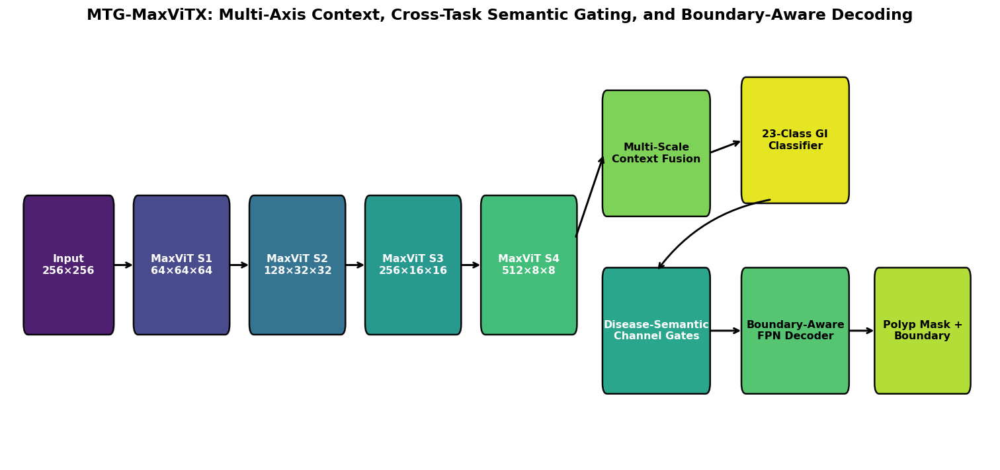

In [ ]:
with torch.no_grad():
    d = torch.randn(
        1, 3, IMG_SIZE, IMG_SIZE,
        device=DEVICE
    )

    o = model(
        d,
        task="both",
        return_features=True
    )

    shapes = [
        f.shape
        for f in o["features"]
    ]

fig, ax = plt.subplots(
    figsize=(16, 7)
)

ax.axis("off")
cmap = mpl.colormaps["viridis"]

blocks = [
    (
        f"Input\n{IMG_SIZE}×{IMG_SIZE}",
        0.3, 1.0, 1.5, 1.0, cmap(.06)
    ),
    (
        f"MaxViT S1\n{shapes[0][1]}×{shapes[0][2]}×{shapes[0][3]}",
        2.2, 1.0, 1.6, 1.0, cmap(.20)
    ),
    (
        f"MaxViT S2\n{shapes[1][1]}×{shapes[1][2]}×{shapes[1][3]}",
        4.2, 1.0, 1.6, 1.0, cmap(.36)
    ),
    (
        f"MaxViT S3\n{shapes[2][1]}×{shapes[2][2]}×{shapes[2][3]}",
        6.2, 1.0, 1.6, 1.0, cmap(.52)
    ),
    (
        f"MaxViT S4\n{shapes[3][1]}×{shapes[3][2]}×{shapes[3][3]}",
        8.2, 1.0, 1.6, 1.0, cmap(.68)
    ),
    (
        "Multi-Scale\nContext Fusion",
        10.3, 1.9, 1.8, 0.9, cmap(.80)
    ),
    (
        "23-Class GI\nClassifier",
        12.7, 2.0, 1.8, 0.9, cmap(.96)
    ),
    (
        "Disease-Semantic\nChannel Gates",
        10.3, 0.55, 1.8, 0.9, cmap(.58)
    ),
    (
        "Boundary-Aware\nFPN Decoder",
        12.7, 0.55, 1.8, 0.9, cmap(.72)
    ),
    (
        "Polyp Mask +\nBoundary",
        15.0, 0.55, 1.6, 0.9, cmap(.88)
    ),
]

for text, x, y, w, h, color in blocks:
    rect = mpl.patches.FancyBboxPatch(
        (x, y),
        w,
        h,
        boxstyle="round,pad=.03,rounding_size=.08",
        linewidth=1.5,
        edgecolor="black",
        facecolor=color,
        alpha=.96
    )

    ax.add_patch(rect)

    ax.text(
        x + w/2,
        y + h/2,
        text,
        ha="center",
        va="center",
        fontsize=9.5,
        weight="bold",
        color=(
            "white"
            if float(np.mean(color[:3])) < .48
            else "black"
        )
    )

for x1, x2 in [
    (1.8, 2.2),
    (3.8, 4.2),
    (5.8, 6.2),
    (7.8, 8.2),
]:
    ax.annotate(
        "",
        xy=(x2, 1.5),
        xytext=(x1, 1.5),
        arrowprops=dict(
            arrowstyle="->",
            lw=1.8
        )
    )

ax.annotate(
    "",
    xy=(10.3, 2.35),
    xytext=(9.8, 1.7),
    arrowprops=dict(
        arrowstyle="->",
        lw=1.8
    )
)

ax.annotate(
    "",
    xy=(12.7, 2.45),
    xytext=(12.1, 2.35),
    arrowprops=dict(
        arrowstyle="->",
        lw=1.8
    )
)

ax.annotate(
    "",
    xy=(11.2, 1.45),
    xytext=(13.2, 2.0),
    arrowprops=dict(
        arrowstyle="->",
        lw=1.7,
        connectionstyle="arc3,rad=.20"
    )
)

ax.annotate(
    "",
    xy=(12.7, 1.0),
    xytext=(12.1, 1.0),
    arrowprops=dict(
        arrowstyle="->",
        lw=1.8
    )
)

ax.annotate(
    "",
    xy=(15.0, 1.0),
    xytext=(14.5, 1.0),
    arrowprops=dict(
        arrowstyle="->",
        lw=1.8
    )
)

ax.set_xlim(0, 17)
ax.set_ylim(0, 3.25)

ax.set_title(
    "MTG-MaxViTX: Multi-Axis Context, Cross-Task Semantic Gating, and Boundary-Aware Decoding",
    weight="bold",
    pad=14
)

savefig(
    "12_mtg_maxvitx_architecture"
)

plt.show()

## Stage 13 — Losses, Metrics, Optimizer, and Checkpoint Resume

In [ ]:
# ============================================================
# STAGE 13 — LOSSES, OPTIMIZER, AND CHECKPOINT RESUME
# ============================================================

def soft_dice_loss(
    logits,
    targets,
    eps=1e-6
):
    probs = torch.sigmoid(logits)
    dims = tuple(range(1, probs.ndim))
    inter = (probs * targets).sum(dims)
    denom = probs.sum(dims) + targets.sum(dims)

    return (
        1
        -
        (2 * inter + eps)
        /
        (denom + eps)
    ).mean()


def gradient_boundary_loss(
    logits,
    targets
):
    probs = torch.sigmoid(logits)

    kx = torch.tensor(
        [
            [-1, 0, 1],
            [-2, 0, 2],
            [-1, 0, 1],
        ],
        dtype=probs.dtype,
        device=probs.device
    ).view(1, 1, 3, 3)

    ky = kx.transpose(2, 3)

    pg = torch.sqrt(
        F.conv2d(
            probs,
            kx,
            padding=1
        ).pow(2)
        +
        F.conv2d(
            probs,
            ky,
            padding=1
        ).pow(2)
        +
        1e-6
    )

    tg = torch.sqrt(
        F.conv2d(
            targets,
            kx,
            padding=1
        ).pow(2)
        +
        F.conv2d(
            targets,
            ky,
            padding=1
        ).pow(2)
        +
        1e-6
    )

    return F.l1_loss(
        pg,
        tg
    )


def make_boundary_target(targets):
    dilated = F.max_pool2d(
        targets,
        3,
        stride=1,
        padding=1
    )

    eroded = -F.max_pool2d(
        -targets,
        3,
        stride=1,
        padding=1
    )

    return (
        dilated
        -
        eroded
    ).clamp(
        0,
        1
    )


def segmentation_loss(
    logits,
    targets
):
    bce = F.binary_cross_entropy_with_logits(
        logits,
        targets
    )

    dice = soft_dice_loss(
        logits,
        targets
    )

    edge = gradient_boundary_loss(
        logits,
        targets
    )

    return (
        0.40 * bce
        +
        0.45 * dice
        +
        0.15 * edge
    )


def explicit_boundary_loss(
    boundary_logits,
    targets
):
    boundary_target = make_boundary_target(
        targets
    )

    bce = F.binary_cross_entropy_with_logits(
        boundary_logits,
        boundary_target
    )

    dice = soft_dice_loss(
        boundary_logits,
        boundary_target
    )

    return (
        0.60 * bce
        +
        0.40 * dice
    )


def cross_task_consistency_loss(
    cls_logits,
    seg_presence
):
    p_polyp = torch.softmax(
        cls_logits,
        dim=1
    )[:, POLYP_LABEL]

    return F.smooth_l1_loss(
        p_polyp,
        seg_presence
    )


classes_present = np.sort(
    cls_train_df.label.unique()
)

cw = compute_class_weight(
    class_weight="balanced",
    classes=classes_present,
    y=cls_train_df.label.values
)

class_weights = torch.ones(
    len(HK_CLASSES),
    dtype=torch.float32
)

class_weights[
    classes_present
] = torch.tensor(
    cw,
    dtype=torch.float32
)

class_weights = class_weights.to(
    DEVICE
)

cls_criterion = nn.CrossEntropyLoss(
    weight=class_weights,
    label_smoothing=0.05
)

optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=LR,
    weight_decay=WEIGHT_DECAY
)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=EPOCHS,
    eta_min=LR * 0.02
)

scaler = torch.amp.GradScaler(
    "cuda",
    enabled=DEVICE.type == "cuda"
)

# ============================================================
# SAFE V3 CHECKPOINTS
# ============================================================

BEST_CKPT = CHECKPOINTS / "mtg_maxvitx_v3_best.pt"
LAST_CKPT = CHECKPOINTS / "mtg_maxvitx_v3_last.pt"
STEP_CKPT = CHECKPOINTS / "mtg_maxvitx_v3_step.pt"
LEGACY_BEST_CKPT = CHECKPOINTS / "mtg_maxvitx_best.pt"

history = []
start_epoch = 0
resume_step = 0
best_score = -np.inf
bad_epochs = 0
resume_running = None
resume_cls_updates = 0
resume_seg_updates = 0


def save_training_checkpoint(
    path,
    epoch,
    step_in_epoch=-1,
    epoch_complete=True,
    best_score=-np.inf,
    bad_epochs=0,
    history=None,
    running=None,
    cls_updates=0,
    seg_updates=0,
):
    payload = {
        "epoch": int(epoch),
        "step_in_epoch": int(step_in_epoch),
        "epoch_complete": bool(epoch_complete),
        "model": model.state_dict(),
        "optimizer": optimizer.state_dict(),
        "scheduler": scheduler.state_dict(),
        "scaler": scaler.state_dict(),
        "best_score": float(best_score),
        "bad_epochs": int(bad_epochs),
        "history": list(history or []),
        "running": dict(running or {}),
        "cls_updates": int(cls_updates),
        "seg_updates": int(seg_updates),
        "config": {
            "model_name": MODEL_NAME,
            "img_size": IMG_SIZE,
            "epochs": EPOCHS,
            "patience": PATIENCE,
            "lambda_seg_cls": LAMBDA_SEG_CLS,
            "lambda_boundary": LAMBDA_BOUNDARY,
            "lambda_consistency": LAMBDA_CONSISTENCY,
            "num_workers": 0,
            "step_checkpoint_interval": STEP_CKPT_INTERVAL,
        },
    }

    tmp = Path(str(path) + ".tmp")
    torch.save(payload, tmp)
    os.replace(tmp, path)


def save_checkpoint(path, epoch, best_score, bad_epochs, history):
    save_training_checkpoint(
        path=path,
        epoch=epoch,
        step_in_epoch=-1,
        epoch_complete=True,
        best_score=best_score,
        bad_epochs=bad_epochs,
        history=history,
    )


def load_full_checkpoint(path):
    ckpt = torch.load(
        path,
        map_location=DEVICE,
        weights_only=False,
    )

    model.load_state_dict(ckpt["model"])
    optimizer.load_state_dict(ckpt["optimizer"])
    scheduler.load_state_dict(ckpt["scheduler"])

    try:
        scaler.load_state_dict(ckpt["scaler"])
    except Exception:
        pass

    return ckpt


# Resume priority: unfinished v3 step -> completed v3 last -> legacy best.
if STEP_CKPT.exists():
    ckpt = load_full_checkpoint(STEP_CKPT)

    start_epoch = int(ckpt["epoch"])
    resume_step = int(ckpt.get("step_in_epoch", -1)) + 1
    best_score = float(ckpt.get("best_score", -np.inf))
    bad_epochs = int(ckpt.get("bad_epochs", 0))
    history = list(ckpt.get("history", []))
    resume_running = dict(ckpt.get("running", {}))
    resume_cls_updates = int(ckpt.get("cls_updates", 0))
    resume_seg_updates = int(ckpt.get("seg_updates", 0))

    print("✓ Resuming v3 step checkpoint")
    print("  epoch:", start_epoch + 1)
    print("  next classification step:", resume_step)

elif LAST_CKPT.exists():
    ckpt = load_full_checkpoint(LAST_CKPT)

    start_epoch = int(ckpt["epoch"]) + 1
    best_score = float(ckpt.get("best_score", -np.inf))
    bad_epochs = int(ckpt.get("bad_epochs", 0))
    history = list(ckpt.get("history", []))

    print("✓ Resuming v3 after completed epoch", start_epoch)

elif LEGACY_BEST_CKPT.exists():
    legacy = torch.load(
        LEGACY_BEST_CKPT,
        map_location=DEVICE,
        weights_only=False,
    )

    model.load_state_dict(legacy["model"])

    # New efficient schedule starts with fresh optimizer/scheduler states,
    # while retaining the already learned model parameters.
    print("✓ Warm-started from previous best model checkpoint")
    print(" ", LEGACY_BEST_CKPT)
    print("  legacy best score:", legacy.get("best_score", "unknown"))
    print("  v3 optimizer/scheduler start fresh")

else:
    print("No previous checkpoint found; using ImageNet-pretrained MaxViT.")

print("BEST:", BEST_CKPT)
print("LAST:", LAST_CKPT)
print("STEP:", STEP_CKPT)

# ============================================================
# LOW-COMPUTE CHECKPOINT CANDIDATES
# ============================================================

LEGACY_BEST_CKPT = (
    CHECKPOINTS
    /
    "mtg_maxvitx_best.pt"
)

V3_BEST_CKPT = (
    CHECKPOINTS
    /
    "mtg_maxvitx_v3_best.pt"
)

V3_LAST_CKPT = (
    CHECKPOINTS
    /
    "mtg_maxvitx_v3_last.pt"
)

V3_STEP_CKPT = (
    CHECKPOINTS
    /
    "mtg_maxvitx_v3_step.pt"
)

SELECTED_CKPT = (
    CHECKPOINTS
    /
    "mtg_maxvitx_selected_best.pt"
)

checkpoint_candidates = [
    (
        "legacy_best",
        LEGACY_BEST_CKPT
    ),
    (
        "v3_best",
        V3_BEST_CKPT
    ),
    (
        "v3_last",
        V3_LAST_CKPT
    ),
]

print()
print(
    "Low-compute checkpoint mode"
)

print(
    "CONTINUE_PRIMARY_TRAINING:",
    CONTINUE_PRIMARY_TRAINING
)

print(
    "VERIFY_CHECKPOINT_SELECTION:",
    VERIFY_CHECKPOINT_SELECTION
)

print(
    "RUN_HEAVY_Q1_SUITE:",
    RUN_HEAVY_Q1_SUITE
)

print()
print(
    "Checkpoint candidates:"
)

for name, path in checkpoint_candidates:
    print(
        f"  {name:14s}",
        "FOUND" if path.exists() else "missing",
        path
    )


✓ Resuming v3 after completed epoch 3
BEST: /content/drive/MyDrive/MTG_MaxViTX/checkpoints/mtg_maxvitx_v3_best.pt
LAST: /content/drive/MyDrive/MTG_MaxViTX/checkpoints/mtg_maxvitx_v3_last.pt
STEP: /content/drive/MyDrive/MTG_MaxViTX/checkpoints/mtg_maxvitx_v3_step.pt

Low-compute checkpoint mode
CONTINUE_PRIMARY_TRAINING: False
VERIFY_CHECKPOINT_SELECTION: False
RUN_HEAVY_Q1_SUITE: False

Checkpoint candidates:
  legacy_best    FOUND /content/drive/MyDrive/MTG_MaxViTX/checkpoints/mtg_maxvitx_best.pt
  v3_best        FOUND /content/drive/MyDrive/MTG_MaxViTX/checkpoints/mtg_maxvitx_v3_best.pt
  v3_last        FOUND /content/drive/MyDrive/MTG_MaxViTX/checkpoints/mtg_maxvitx_v3_last.pt


## Stage 14 — Base Checkpoint Selection

The available legacy-best, v3-best, and v3-last checkpoints are compared using saved validation metadata. The strongest checkpoint is selected as the starting point for the v5 performance-refinement stage, avoiding another expensive joint-training run.


In [ ]:
# ============================================================
# STAGE 14 — LOW-COMPUTE CHECKPOINT SELECTION
# ============================================================

def checkpoint_saved_score(
    name,
    payload
):
    """
    Recover the validation selection score already stored during training.

    Best checkpoints:
        use payload['best_score'].

    Last checkpoints:
        prefer the latest history row's 'score' because payload['best_score']
        records the historical best rather than the last epoch itself.
    """

    history_local = payload.get(
        "history",
        []
    )

    if (
        name.endswith(
            "_last"
        )
        and
        history_local
        and
        isinstance(
            history_local[
                -1
            ],
            dict
        )
        and
        "score"
        in history_local[
            -1
        ]
    ):
        return float(
            history_local[
                -1
            ][
                "score"
            ]
        )

    score = payload.get(
        "best_score",
        np.nan
    )

    try:
        return float(
            score
        )

    except Exception:
        return np.nan


def checkpoint_saved_metrics(
    payload
):
    history_local = payload.get(
        "history",
        []
    )

    if (
        history_local
        and
        isinstance(
            history_local[
                -1
            ],
            dict
        )
    ):
        return history_local[
            -1
        ]

    return {}


candidate_rows = []
candidate_payloads = {}

for candidate_name, candidate_path in checkpoint_candidates:

    if not candidate_path.exists():
        continue

    payload = torch.load(
        candidate_path,
        map_location="cpu",
        weights_only=False
    )

    if (
        not isinstance(
            payload,
            dict
        )
        or
        "model"
        not in payload
    ):
        print(
            "Skipping invalid checkpoint:",
            candidate_path
        )
        continue

    saved_metrics = checkpoint_saved_metrics(
        payload
    )

    saved_score = checkpoint_saved_score(
        candidate_name,
        payload
    )

    candidate_rows.append(
        {
            "checkpoint":
                candidate_name,

            "path":
                str(
                    candidate_path
                ),

            "stored_epoch":
                int(
                    payload.get(
                        "epoch",
                        -1
                    )
                )
                +
                1,

            "saved_selection_score":
                saved_score,

            "saved_val_macro_f1":
                float(
                    saved_metrics.get(
                        "val_macro_f1",
                        np.nan
                    )
                ),

            "saved_val_dice":
                float(
                    saved_metrics.get(
                        "val_dice",
                        np.nan
                    )
                ),

            "saved_val_cls_loss":
                float(
                    saved_metrics.get(
                        "val_cls_loss",
                        np.nan
                    )
                ),

            "saved_val_seg_loss":
                float(
                    saved_metrics.get(
                        "val_seg_loss",
                        np.nan
                    )
                ),
        }
    )

    candidate_payloads[
        candidate_name
    ] = payload


checkpoint_selection_df = pd.DataFrame(
    candidate_rows
)


if len(
    checkpoint_selection_df
) == 0:

    raise RuntimeError(
        "No usable trained checkpoint found in Google Drive. "
        "Expected mtg_maxvitx_best.pt, mtg_maxvitx_v3_best.pt, "
        "or mtg_maxvitx_v3_last.pt."
    )


# ============================================================
# OPTIONAL RE-VALIDATION
# Default False to save Colab quota.
# ============================================================

if VERIFY_CHECKPOINT_SELECTION:

    @torch.no_grad()
    def _quick_cls_validation(
        loader
    ):
        model.eval()

        ys = []
        ps = []

        for x, y, _ in loader:

            x = x.to(
                DEVICE,
                non_blocking=True
            )

            logits = model(
                x,
                task="cls"
            )[
                "cls"
            ]

            ys.extend(
                y.numpy()
            )

            ps.extend(
                logits.argmax(
                    1
                ).cpu().numpy()
            )

        return f1_score(
            ys,
            ps,
            average="macro",
            zero_division=0
        )


    @torch.no_grad()
    def _quick_seg_validation(
        loader
    ):
        model.eval()

        dices = []

        for x, y, _ in loader:

            x = x.to(
                DEVICE,
                non_blocking=True
            )

            y = y.to(
                DEVICE,
                non_blocking=True
            )

            logits = model(
                x,
                task="seg"
            )[
                "seg"
            ]

            pred = (
                torch.sigmoid(
                    logits
                )
                >
                0.5
            ).float()

            inter = (
                pred
                *
                y
            ).sum(
                (
                    1,
                    2,
                    3
                )
            )

            denom = (
                pred.sum(
                    (
                        1,
                        2,
                        3
                    )
                )
                +
                y.sum(
                    (
                        1,
                        2,
                        3
                    )
                )
            )

            dice = (
                (
                    2
                    *
                    inter
                    +
                    1e-6
                )
                /
                (
                    denom
                    +
                    1e-6
                )
            )

            dices.extend(
                dice.cpu().numpy()
            )

        return float(
            np.mean(
                dices
            )
        )


    verified_scores = []

    for row in checkpoint_selection_df.itertuples(
        index=False
    ):

        payload = candidate_payloads[
            row.checkpoint
        ]

        model.load_state_dict(
            payload[
                "model"
            ]
        )

        cls_f1 = _quick_cls_validation(
            cls_val_loader
        )

        seg_dice = _quick_seg_validation(
            seg_val_loader
        )

        verified_scores.append(
            0.50
            *
            cls_f1
            +
            0.50
            *
            seg_dice
        )

    checkpoint_selection_df[
        "verified_selection_score"
    ] = verified_scores

    sort_column = (
        "verified_selection_score"
    )

else:

    sort_column = (
        "saved_selection_score"
    )


checkpoint_selection_df = (
    checkpoint_selection_df
    .sort_values(
        sort_column,
        ascending=False,
        na_position="last"
    )
    .reset_index(
        drop=True
    )
)


display(
    checkpoint_selection_df
)


checkpoint_selection_df.to_csv(
    RESULTS
    /
    "checkpoint_selection_low_compute.csv",
    index=False
)


winner = checkpoint_selection_df.iloc[
    0
]

winner_name = str(
    winner[
        "checkpoint"
    ]
)

winner_payload = candidate_payloads[
    winner_name
]


# Load only the selected model into GPU memory.
model.load_state_dict(
    winner_payload[
        "model"
    ]
)

model = model.to(
    DEVICE
)

model.eval()


selected_payload = dict(
    winner_payload
)

selected_payload[
    "selection_metadata"
] = {
    "selected_from":
        winner_name,

    "selection_mode":
        (
            "revalidated"
            if VERIFY_CHECKPOINT_SELECTION
            else "saved_validation_metadata"
        ),

    "selection_score":
        float(
            winner[
                sort_column
            ]
        ),
}


tmp_selected = Path(
    str(
        SELECTED_CKPT
    )
    +
    ".tmp"
)

torch.save(
    selected_payload,
    tmp_selected
)

os.replace(
    tmp_selected,
    SELECTED_CKPT
)


# All later primary-evaluation stages use this path.
BEST_CKPT = SELECTED_CKPT


print()
print(
    "=" * 70
)

print(
    "SELECTED MODEL — NO NEW TRAINING"
)

print(
    "=" * 70
)

print(
    "Selected checkpoint:",
    winner_name
)

print(
    "Selection source:",
    (
        "fresh validation"
        if VERIFY_CHECKPOINT_SELECTION
        else "saved validation metadata"
    )
)

print(
    "Selection score:",
    f"{float(winner[sort_column]):.6f}"
)

print(
    "Saved evaluation checkpoint:",
    SELECTED_CKPT
)


if CONTINUE_PRIMARY_TRAINING:

    print()
    print(
        "CONTINUE_PRIMARY_TRAINING=True."
    )

    print(
        "To protect Colab quota, continued optimization is intentionally "
        "not launched by this low-compute notebook. Use the v3 safe-training "
        "notebook only if further training is truly required."
    )

else:

    print()
    print(
        "✓ Additional primary training skipped"
    )

    print(
        "✓ Proceed directly to primary evaluation / XAI"
    )


mark_stage(
    "14_low_compute_checkpoint_selection_v4",
    {
        "selected_checkpoint":
            winner_name,

        "selection_score":
            float(
                winner[
                    sort_column
                ]
            ),

        "selection_revalidated":
            bool(
                VERIFY_CHECKPOINT_SELECTION
            ),

        "continued_training":
            False,
    }
)

,checkpoint,path,stored_epoch,saved_selection_score,saved_val_macro_f1,saved_val_dice,saved_val_cls_loss,saved_val_seg_loss
0,legacy_best,/content/drive/MyDrive/MTG_MaxViTX/checkpoints...,11,0.749451,0.598326,0.900577,3.512655,0.173336
1,v3_best,/content/drive/MyDrive/MTG_MaxViTX/checkpoints...,3,0.736062,0.589094,0.883031,3.343204,0.177030
2,v3_last,/content/drive/MyDrive/MTG_MaxViTX/checkpoints...,3,0.736062,0.589094,0.883031,3.343204,0.177030



SELECTED MODEL — NO NEW TRAINING
Selected checkpoint: legacy_best
Selection source: saved validation metadata
Selection score: 0.749451
Saved evaluation checkpoint: /content/drive/MyDrive/MTG_MaxViTX/checkpoints/mtg_maxvitx_selected_best.pt

✓ Additional primary training skipped
✓ Proceed directly to primary evaluation / XAI


## Stage 14B — Q1 Performance Refinement

This stage starts from the selected joint checkpoint and performs two checkpoint-safe specialist refinements:

1. **Classification refinement:** low encoder learning rate, stronger classifier/context learning rate, balanced-softmax focal loss, and a coarse anatomical/pathology auxiliary task. The segmentation decoder is frozen.
2. **Segmentation refinement:** the improved encoder/classifier is frozen and only the segmentation decoder is optimized with Dice, BCE, focal-Tversky, and boundary supervision.

The final checkpoint therefore preserves the classification refinement while adapting the segmentation decoder to the refined shared representation. Every phase has resumable step/epoch checkpoints.


In [ ]:
# ============================================================
# STAGE 14B — CHECKPOINT-SAFE Q1 PERFORMANCE REFINEMENT
# ============================================================

REFINE_DIR = (
    CHECKPOINTS
    /
    "q1_refinement_v5"
)

REFINE_DIR.mkdir(
    parents=True,
    exist_ok=True
)

CLS_REFINE_BEST = (
    REFINE_DIR
    /
    "classification_refined_best.pt"
)

CLS_REFINE_LAST = (
    REFINE_DIR
    /
    "classification_refined_last.pt"
)

CLS_REFINE_STEP = (
    REFINE_DIR
    /
    "classification_refined_step.pt"
)

CLS_REFINE_DONE = (
    REFINE_DIR
    /
    "classification_refined_done.json"
)

SEG_REFINE_BEST = (
    REFINE_DIR
    /
    "segmentation_refined_best.pt"
)

SEG_REFINE_LAST = (
    REFINE_DIR
    /
    "segmentation_refined_last.pt"
)

SEG_REFINE_STEP = (
    REFINE_DIR
    /
    "segmentation_refined_step.pt"
)

SEG_REFINE_DONE = (
    REFINE_DIR
    /
    "segmentation_refined_done.json"
)

FINAL_REFINED_CKPT = (
    CHECKPOINTS
    /
    "mtg_maxvitx_q1_refined_final.pt"
)

INFERENCE_CONFIG_PATH = (
    RESULTS
    /
    "q1_refined_inference_config.json"
)


# ============================================================
# COARSE AUXILIARY CLASSIFICATION TAXONOMY
# ============================================================

COARSE_GROUPS = {
    "normal_anatomy":
        {
            "ileum",
            "normal-cecum",
            "normal-pylorus",
            "normal-z-line",
            "retroflex-rectum",
            "retroflex-stomach",
        },

    "esophageal_pathology":
        {
            "barretts",
            "short-segment-barretts",
            "oesophagitis-a",
            "oesophagitis-b-d",
        },

    "ulcerative_colitis":
        {
            "ulcerative-colitis-0-1",
            "ulcerative-colitis-1-2",
            "ulcerative-colitis-2-3",
            "ulcerative-colitis-grade-1",
            "ulcerative-colitis-grade-2",
            "ulcerative-colitis-grade-3",
        },

    "polyp":
        {
            "polyp",
        },

    "procedure_quality":
        {
            "bbps-0-1",
            "bbps-2-3",
            "dyed-lifted-polyps",
            "dyed-resection-margins",
            "impacted-stool",
        },

    "anorectal_pathology":
        {
            "hemorrhoids",
        },
}


COARSE_NAMES = list(
    COARSE_GROUPS.keys()
)

COARSE_INDEX = {
    name:
        i
    for i, name
    in enumerate(
        COARSE_NAMES
    )
}


fine_to_coarse = {}

for coarse_name, members in COARSE_GROUPS.items():

    for class_name in members:

        fine_to_coarse[
            class_name
        ] = COARSE_INDEX[
            coarse_name
        ]


missing_coarse = [
    class_name
    for class_name
    in HK_CLASSES
    if class_name
    not in fine_to_coarse
]


if missing_coarse:

    raise RuntimeError(
        "Coarse taxonomy incomplete: "
        +
        str(
            missing_coarse
        )
    )


FINE_TO_COARSE = torch.tensor(
    [
        fine_to_coarse[
            class_name
        ]
        for class_name
        in HK_CLASSES
    ],
    dtype=torch.long,
    device=DEVICE
)


# ============================================================
# IMBALANCE-AWARE LOSS
# ============================================================

train_counts = np.ones(
    len(
        HK_CLASSES
    ),
    dtype=np.float64
)


for label, count in (
    cls_train_df[
        "label"
    ]
    .value_counts()
    .items()
):

    train_counts[
        int(
            label
        )
    ] = float(
        count
    )


CLS_LOG_COUNTS = torch.tensor(
    np.log(
        train_counts
        +
        1.0
    ),
    dtype=torch.float32,
    device=DEVICE
)


CLS_LOG_PRIOR = torch.tensor(
    np.log(
        train_counts
        /
        train_counts.sum()
        +
        1e-12
    ),
    dtype=torch.float32,
    device=DEVICE
)


def balanced_softmax_focal_loss(
    logits,
    targets,
    gamma=1.5,
    label_smoothing=0.05
):
    adjusted = (
        logits
        +
        CLS_LOG_COUNTS.unsqueeze(
            0
        )
    )

    ce = F.cross_entropy(
        adjusted,
        targets,
        reduction="none",
        label_smoothing=label_smoothing
    )

    pt = torch.exp(
        -ce
    )

    focal = (
        (
            1.0
            -
            pt
        )
        **
        gamma
    ) * ce

    return focal.mean()


def refinement_boundary_f1(
    pred,
    true,
    tolerance=2
):
    pred = pred.astype(
        bool
    )

    true = true.astype(
        bool
    )

    pred_edge = (
        pred
        ^
        binary_erosion(
            pred
        )
    )

    true_edge = (
        true
        ^
        binary_erosion(
            true
        )
    )

    if (
        not pred_edge.any()
        and
        not true_edge.any()
    ):
        return 1.0

    if (
        not pred_edge.any()
        or
        not true_edge.any()
    ):
        return 0.0

    true_d = binary_dilation(
        true_edge,
        iterations=tolerance
    )

    pred_d = binary_dilation(
        pred_edge,
        iterations=tolerance
    )

    precision = (
        pred_edge
        &
        true_d
    ).sum() / (
        pred_edge.sum()
        +
        1e-9
    )

    recall = (
        true_edge
        &
        pred_d
    ).sum() / (
        true_edge.sum()
        +
        1e-9
    )

    return float(
        2
        *
        precision
        *
        recall
        /
        (
            precision
            +
            recall
            +
            1e-9
        )
    )

# ============================================================
# CLASSIFICATION REFINEMENT HELPERS
# ============================================================

def build_cls_refine_loader(
    epoch_index
):
    generator = torch.Generator()

    generator.manual_seed(
        int(
            SEED
            +
            20000
            +
            997
            *
            int(
                epoch_index
            )
        )
    )

    return DataLoader(
        ClassificationDataset(
            cls_train_df,
            cls_train_tf
        ),
        batch_size=BATCH_CLS,
        shuffle=True,
        generator=generator,
        num_workers=0,
        pin_memory=(
            DEVICE.type
            ==
            "cuda"
        ),
        persistent_workers=False,
    )


@torch.no_grad()
def cls_refine_validation(
    model_obj
):
    model_obj.eval()

    ys = []
    preds = []
    losses = []

    for x, y, _ in cls_val_loader:

        x = x.to(
            DEVICE,
            non_blocking=True
        )

        y = y.to(
            DEVICE,
            non_blocking=True
        )

        out = model_obj(
            x,
            task="cls"
        )

        logits = out[
            "cls"
        ]

        loss = balanced_softmax_focal_loss(
            logits,
            y
        )

        losses.append(
            loss.item()
        )

        ys.extend(
            y.cpu().numpy()
        )

        preds.extend(
            logits.argmax(
                1
            ).cpu().numpy()
        )

    ys = np.asarray(
        ys
    )

    preds = np.asarray(
        preds
    )

    accuracy = accuracy_score(
        ys,
        preds
    )

    macro_f1 = f1_score(
        ys,
        preds,
        average="macro",
        zero_division=0
    )

    return {
        "loss":
            float(
                np.mean(
                    losses
                )
            ),

        "accuracy":
            float(
                accuracy
            ),

        "macro_f1":
            float(
                macro_f1
            ),

        "score":
            float(
                0.60
                *
                accuracy
                +
                0.40
                *
                macro_f1
            ),
    }


def atomic_torch_save(
    payload,
    path
):
    tmp = Path(
        str(
            path
        )
        +
        ".tmp"
    )

    torch.save(
        payload,
        tmp
    )

    os.replace(
        tmp,
        path
    )


# ============================================================
# CLASSIFICATION REFINEMENT
# ============================================================

if RUN_PERFORMANCE_REFINEMENT:

    print()
    print(
        "=" * 72
    )

    print(
        "PHASE A — CLASSIFICATION PERFORMANCE REFINEMENT"
    )

    print(
        "=" * 72
    )


    # Start from the selected joint checkpoint unless a refinement
    # checkpoint already exists.
    selected_payload = torch.load(
        SELECTED_CKPT,
        map_location=DEVICE,
        weights_only=False
    )

    model.load_state_dict(
        selected_payload[
            "model"
        ]
    )

    model = model.to(
        DEVICE
    )


    context_dim = int(
        model.feature_channels[
            -1
        ]
    )


    coarse_head = nn.Sequential(
        nn.LayerNorm(
            context_dim
        ),
        nn.Dropout(
            0.20
        ),
        nn.Linear(
            context_dim,
            len(
                COARSE_NAMES
            )
        )
    ).to(
        DEVICE
    )


    # Freeze segmentation-only modules during classification refinement.
    for p in model.decoder.parameters():

        p.requires_grad = False


    for p in model.class_semantic_embedding.parameters():

        p.requires_grad = False


    for p in model.encoder.parameters():

        p.requires_grad = True


    for p in model.context.parameters():

        p.requires_grad = True


    for p in model.classifier.parameters():

        p.requires_grad = True


    encoder_params = [
        p
        for p
        in model.encoder.parameters()
        if p.requires_grad
    ]


    head_params = (
        list(
            model.context.parameters()
        )
        +
        list(
            model.classifier.parameters()
        )
        +
        list(
            coarse_head.parameters()
        )
    )


    cls_optimizer = torch.optim.AdamW(
        [
            {
                "params":
                    encoder_params,

                "lr":
                    CLS_ENCODER_LR,
            },
            {
                "params":
                    head_params,

                "lr":
                    CLS_HEAD_LR,
            },
        ],
        weight_decay=CLS_REFINE_WEIGHT_DECAY
    )


    cls_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        cls_optimizer,
        T_max=CLS_REFINE_EPOCHS,
        eta_min=CLS_ENCODER_LR
        *
        0.20
    )


    cls_scaler = torch.amp.GradScaler(
        "cuda",
        enabled=DEVICE.type
        ==
        "cuda"
    )


    cls_history = []

    cls_best_score = -np.inf

    cls_bad_epochs = 0

    cls_start_epoch = 0

    cls_resume_step = 0


    if CLS_REFINE_DONE.exists() and CLS_REFINE_BEST.exists():

        print(
            "✓ Classification refinement already completed."
        )

        payload = torch.load(
            CLS_REFINE_BEST,
            map_location=DEVICE,
            weights_only=False
        )

        model.load_state_dict(
            payload[
                "model"
            ]
        )

        if "coarse_head" in payload:

            coarse_head.load_state_dict(
                payload[
                    "coarse_head"
                ]
            )

        cls_history = list(
            payload.get(
                "history",
                []
            )
        )

        cls_best_score = float(
            payload.get(
                "best_score",
                np.nan
            )
        )


    else:

        if CLS_REFINE_STEP.exists():

            payload = torch.load(
                CLS_REFINE_STEP,
                map_location=DEVICE,
                weights_only=False
            )

            model.load_state_dict(
                payload[
                    "model"
                ]
            )

            coarse_head.load_state_dict(
                payload[
                    "coarse_head"
                ]
            )

            cls_optimizer.load_state_dict(
                payload[
                    "optimizer"
                ]
            )

            cls_scheduler.load_state_dict(
                payload[
                    "scheduler"
                ]
            )

            cls_scaler.load_state_dict(
                payload[
                    "scaler"
                ]
            )

            cls_history = list(
                payload.get(
                    "history",
                    []
                )
            )

            cls_best_score = float(
                payload.get(
                    "best_score",
                    -np.inf
                )
            )

            cls_bad_epochs = int(
                payload.get(
                    "bad_epochs",
                    0
                )
            )

            cls_start_epoch = int(
                payload[
                    "epoch"
                ]
            )

            cls_resume_step = int(
                payload[
                    "step"
                ]
            ) + 1

            print(
                "✓ Resuming classification refinement from step checkpoint:",
                "epoch",
                cls_start_epoch
                +
                1,
                "step",
                cls_resume_step
            )


        elif CLS_REFINE_LAST.exists():

            payload = torch.load(
                CLS_REFINE_LAST,
                map_location=DEVICE,
                weights_only=False
            )

            model.load_state_dict(
                payload[
                    "model"
                ]
            )

            coarse_head.load_state_dict(
                payload[
                    "coarse_head"
                ]
            )

            cls_optimizer.load_state_dict(
                payload[
                    "optimizer"
                ]
            )

            cls_scheduler.load_state_dict(
                payload[
                    "scheduler"
                ]
            )

            cls_scaler.load_state_dict(
                payload[
                    "scaler"
                ]
            )

            cls_history = list(
                payload.get(
                    "history",
                    []
                )
            )

            cls_best_score = float(
                payload.get(
                    "best_score",
                    -np.inf
                )
            )

            cls_bad_epochs = int(
                payload.get(
                    "bad_epochs",
                    0
                )
            )

            cls_start_epoch = int(
                payload[
                    "epoch"
                ]
            ) + 1

            print(
                "✓ Resuming classification refinement after epoch",
                cls_start_epoch
            )


        for epoch in range(
            cls_start_epoch,
            CLS_REFINE_EPOCHS
        ):

            model.train()

            coarse_head.train()

            loader = build_cls_refine_loader(
                epoch
            )

            total_steps = len(
                loader
            )

            running_loss = 0.0

            running_fine = 0.0

            running_coarse = 0.0

            updates = 0


            pbar = tqdm(
                enumerate(
                    loader
                ),
                total=total_steps,
                desc=(
                    f"Cls refine "
                    f"{epoch + 1}/{CLS_REFINE_EPOCHS}"
                )
            )


            for step, (
                x,
                y,
                _
            ) in pbar:


                if (
                    epoch
                    ==
                    cls_start_epoch
                    and
                    step
                    <
                    cls_resume_step
                ):

                    continue


                x = x.to(
                    DEVICE,
                    non_blocking=True
                )

                y = y.to(
                    DEVICE,
                    non_blocking=True
                )


                coarse_y = FINE_TO_COARSE[
                    y
                ]


                cls_optimizer.zero_grad(
                    set_to_none=True
                )


                with torch.amp.autocast(
                    "cuda",
                    enabled=DEVICE.type
                    ==
                    "cuda"
                ):

                    out = model(
                        x,
                        task="cls",
                        return_features=True
                    )

                    logits = out[
                        "cls"
                    ]

                    pooled = out[
                        "pooled"
                    ]

                    coarse_logits = coarse_head(
                        pooled
                    )


                    fine_loss = balanced_softmax_focal_loss(
                        logits,
                        y
                    )


                    coarse_loss = F.cross_entropy(
                        coarse_logits,
                        coarse_y,
                        label_smoothing=0.05
                    )


                    loss = (
                        fine_loss
                        +
                        0.18
                        *
                        coarse_loss
                    )


                cls_scaler.scale(
                    loss
                ).backward()


                cls_scaler.unscale_(
                    cls_optimizer
                )


                torch.nn.utils.clip_grad_norm_(
                    [
                        p
                        for group
                        in cls_optimizer.param_groups
                        for p
                        in group[
                            "params"
                        ]
                    ],
                    max_norm=1.0
                )


                cls_scaler.step(
                    cls_optimizer
                )

                cls_scaler.update()


                running_loss += loss.item()

                running_fine += fine_loss.item()

                running_coarse += coarse_loss.item()

                updates += 1


                pbar.set_postfix(
                    {
                        "loss":
                            f"{running_loss / max(1, updates):.3f}",

                        "enc_lr":
                            f"{cls_optimizer.param_groups[0]['lr']:.1e}",
                    }
                )


                if (
                    ((step + 1) % CLS_REFINE_STEP_CKPT_INTERVAL == 0)
                    or
                    (step == total_steps - 1)
                ):

                    atomic_torch_save(
                        {
                            "model":
                                model.state_dict(),

                            "coarse_head":
                                coarse_head.state_dict(),

                            "optimizer":
                                cls_optimizer.state_dict(),

                            "scheduler":
                                cls_scheduler.state_dict(),

                            "scaler":
                                cls_scaler.state_dict(),

                            "epoch":
                                int(
                                    epoch
                                ),

                            "step":
                                int(
                                    step
                                ),

                            "history":
                                list(
                                    cls_history
                                ),

                            "best_score":
                                float(
                                    cls_best_score
                                ),

                            "bad_epochs":
                                int(
                                    cls_bad_epochs
                                ),
                        },
                        CLS_REFINE_STEP
                    )


            val = cls_refine_validation(
                model
            )


            row = {
                "epoch":
                    int(
                        epoch
                        +
                        1
                    ),

                "train_loss":
                    float(
                        running_loss
                        /
                        max(
                            1,
                            updates
                        )
                    ),

                "train_fine_loss":
                    float(
                        running_fine
                        /
                        max(
                            1,
                            updates
                        )
                    ),

                "train_coarse_loss":
                    float(
                        running_coarse
                        /
                        max(
                            1,
                            updates
                        )
                    ),

                "val_loss":
                    val[
                        "loss"
                    ],

                "val_accuracy":
                    val[
                        "accuracy"
                    ],

                "val_macro_f1":
                    val[
                        "macro_f1"
                    ],

                "score":
                    val[
                        "score"
                    ],

                "encoder_lr":
                    float(
                        cls_optimizer.param_groups[
                            0
                        ][
                            "lr"
                        ]
                    ),

                "head_lr":
                    float(
                        cls_optimizer.param_groups[
                            1
                        ][
                            "lr"
                        ]
                    ),
            }


            cls_history.append(
                row
            )


            improved = (
                val[
                    "score"
                ]
                >
                cls_best_score
                +
                1e-4
            )


            if improved:

                cls_best_score = float(
                    val[
                        "score"
                    ]
                )

                cls_bad_epochs = 0


                atomic_torch_save(
                    {
                        "model":
                            model.state_dict(),

                        "coarse_head":
                            coarse_head.state_dict(),

                        "epoch":
                            int(
                                epoch
                            ),

                        "history":
                            list(
                                cls_history
                            ),

                        "best_score":
                            float(
                                cls_best_score
                            ),

                        "val":
                            dict(
                                val
                            ),
                    },
                    CLS_REFINE_BEST
                )


            else:

                cls_bad_epochs += 1


            cls_scheduler.step()


            atomic_torch_save(
                {
                    "model":
                        model.state_dict(),

                    "coarse_head":
                        coarse_head.state_dict(),

                    "optimizer":
                        cls_optimizer.state_dict(),

                    "scheduler":
                        cls_scheduler.state_dict(),

                    "scaler":
                        cls_scaler.state_dict(),

                    "epoch":
                        int(
                            epoch
                        ),

                    "history":
                        list(
                            cls_history
                        ),

                    "best_score":
                        float(
                            cls_best_score
                        ),

                    "bad_epochs":
                        int(
                            cls_bad_epochs
                        ),
                },
                CLS_REFINE_LAST
            )


            if CLS_REFINE_STEP.exists():

                CLS_REFINE_STEP.unlink()


            pd.DataFrame(
                cls_history
            ).to_csv(
                RESULTS
                /
                "classification_refinement_history.csv",
                index=False
            )


            print(
                row
            )


            # Validation-only early target.
            if (
                val[
                    "accuracy"
                ]
                >=
                CLS_TARGET_ACCURACY
                and
                val[
                    "macro_f1"
                ]
                >=
                0.75
            ):

                print(
                    "✓ Classification validation target reached."
                )

                break


            if (
                cls_bad_epochs
                >=
                CLS_REFINE_PATIENCE
            ):

                print(
                    "Classification refinement early stopping."
                )

                break


            cls_resume_step = 0


        CLS_REFINE_DONE.write_text(
            json.dumps(
                {
                    "done":
                        True,

                    "time":
                        time.strftime(
                            "%Y-%m-%d %H:%M:%S"
                        ),

                    "best_score":
                        float(
                            cls_best_score
                        ),
                },
                indent=2
            )
        )


        best_cls_payload = torch.load(
            CLS_REFINE_BEST,
            map_location=DEVICE,
            weights_only=False
        )

        model.load_state_dict(
            best_cls_payload[
                "model"
            ]
        )


    # ========================================================
    # SEGMENTATION REFINEMENT — DECODER ONLY
    # ========================================================

    print()
    print(
        "=" * 72
    )

    print(
        "PHASE B — SEGMENTATION DECODER REFINEMENT"
    )

    print(
        "=" * 72
    )


    for p in model.parameters():

        p.requires_grad = False


    for p in model.decoder.parameters():

        p.requires_grad = True


    def focal_tversky_loss(
        logits,
        targets,
        alpha=0.30,
        beta=0.70,
        gamma=0.75,
        eps=1e-6
    ):
        probs = torch.sigmoid(
            logits
        )

        dims = (
            1,
            2,
            3
        )

        tp = (
            probs
            *
            targets
        ).sum(
            dims
        )

        fp = (
            probs
            *
            (
                1
                -
                targets
            )
        ).sum(
            dims
        )

        fn = (
            (
                1
                -
                probs
            )
            *
            targets
        ).sum(
            dims
        )

        tversky = (
            tp
            +
            eps
        ) / (
            tp
            +
            alpha
            *
            fp
            +
            beta
            *
            fn
            +
            eps
        )

        return (
            (
                1
                -
                tversky
            )
            **
            gamma
        ).mean()


    def strong_segmentation_loss(
        out,
        targets
    ):
        logits = out[
            "seg"
        ]

        bce = F.binary_cross_entropy_with_logits(
            logits,
            targets
        )

        dice = soft_dice_loss(
            logits,
            targets
        )

        tversky = focal_tversky_loss(
            logits,
            targets
        )

        if "boundary" in out:

            bnd = explicit_boundary_loss(
                out[
                    "boundary"
                ],
                targets
            )

        else:

            bnd = torch.zeros(
                (),
                device=targets.device
            )

        return (
            0.25
            *
            bce
            +
            0.30
            *
            dice
            +
            0.30
            *
            tversky
            +
            0.15
            *
            bnd
        )


    def build_seg_refine_loader(
        epoch_index
    ):
        generator = torch.Generator()

        generator.manual_seed(
            int(
                SEED
                +
                30000
                +
                991
                *
                int(
                    epoch_index
                )
            )
        )

        return DataLoader(
            SegmentationDataset(
                seg_train_df,
                seg_train_tf
            ),
            batch_size=BATCH_SEG,
            shuffle=True,
            generator=generator,
            num_workers=0,
            pin_memory=(
                DEVICE.type
                ==
                "cuda"
            ),
            persistent_workers=False,
        )


    @torch.no_grad()
    def seg_refine_validation(
        model_obj
    ):
        model_obj.eval()

        dice_values = []

        boundary_values = []

        losses = []


        for x, y, _ in seg_val_loader:

            x = x.to(
                DEVICE,
                non_blocking=True
            )

            y = y.to(
                DEVICE,
                non_blocking=True
            )


            out = model_obj(
                x,
                task="seg"
            )


            loss = strong_segmentation_loss(
                out,
                y
            )


            losses.append(
                loss.item()
            )


            pred = (
                torch.sigmoid(
                    out[
                        "seg"
                    ]
                )
                >
                0.5
            ).float()


            inter = (
                pred
                *
                y
            ).sum(
                (
                    1,
                    2,
                    3
                )
            )


            denom = (
                pred.sum(
                    (
                        1,
                        2,
                        3
                    )
                )
                +
                y.sum(
                    (
                        1,
                        2,
                        3
                    )
                )
            )


            dice = (
                (
                    2
                    *
                    inter
                    +
                    1e-6
                )
                /
                (
                    denom
                    +
                    1e-6
                )
            )


            dice_values.extend(
                dice.cpu().numpy()
            )


            pred_np = pred.cpu().numpy()

            y_np = (
                y.cpu().numpy()
                >
                0.5
            )


            for i in range(
                len(
                    pred_np
                )
            ):

                boundary_values.append(
                    refinement_boundary_f1(
                        pred_np[
                            i,
                            0
                        ],
                        y_np[
                            i,
                            0
                        ]
                    )
                )


        mean_dice = float(
            np.mean(
                dice_values
            )
        )

        mean_boundary = float(
            np.mean(
                boundary_values
            )
        )


        return {
            "loss":
                float(
                    np.mean(
                        losses
                    )
                ),

            "dice":
                mean_dice,

            "boundary_f1":
                mean_boundary,

            "score":
                float(
                    0.85
                    *
                    mean_dice
                    +
                    0.15
                    *
                    mean_boundary
                ),
        }


    seg_optimizer = torch.optim.AdamW(
        model.decoder.parameters(),
        lr=SEG_DECODER_LR,
        weight_decay=1e-5
    )


    seg_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        seg_optimizer,
        T_max=SEG_REFINE_EPOCHS,
        eta_min=SEG_DECODER_LR
        *
        0.10
    )


    seg_scaler = torch.amp.GradScaler(
        "cuda",
        enabled=DEVICE.type
        ==
        "cuda"
    )


    seg_history = []

    seg_best_score = -np.inf

    seg_bad_epochs = 0

    seg_start_epoch = 0

    seg_resume_step = 0


    if SEG_REFINE_DONE.exists() and SEG_REFINE_BEST.exists():

        print(
            "✓ Segmentation refinement already completed."
        )

        payload = torch.load(
            SEG_REFINE_BEST,
            map_location=DEVICE,
            weights_only=False
        )

        model.load_state_dict(
            payload[
                "model"
            ]
        )

        seg_history = list(
            payload.get(
                "history",
                []
            )
        )

        seg_best_score = float(
            payload.get(
                "best_score",
                np.nan
            )
        )


    else:

        if SEG_REFINE_STEP.exists():

            payload = torch.load(
                SEG_REFINE_STEP,
                map_location=DEVICE,
                weights_only=False
            )

            model.load_state_dict(
                payload[
                    "model"
                ]
            )

            seg_optimizer.load_state_dict(
                payload[
                    "optimizer"
                ]
            )

            seg_scheduler.load_state_dict(
                payload[
                    "scheduler"
                ]
            )

            seg_scaler.load_state_dict(
                payload[
                    "scaler"
                ]
            )

            seg_history = list(
                payload.get(
                    "history",
                    []
                )
            )

            seg_best_score = float(
                payload.get(
                    "best_score",
                    -np.inf
                )
            )

            seg_bad_epochs = int(
                payload.get(
                    "bad_epochs",
                    0
                )
            )

            seg_start_epoch = int(
                payload[
                    "epoch"
                ]
            )

            seg_resume_step = int(
                payload[
                    "step"
                ]
            ) + 1

            print(
                "✓ Resuming segmentation refinement:",
                "epoch",
                seg_start_epoch
                +
                1,
                "step",
                seg_resume_step
            )


        elif SEG_REFINE_LAST.exists():

            payload = torch.load(
                SEG_REFINE_LAST,
                map_location=DEVICE,
                weights_only=False
            )

            model.load_state_dict(
                payload[
                    "model"
                ]
            )

            seg_optimizer.load_state_dict(
                payload[
                    "optimizer"
                ]
            )

            seg_scheduler.load_state_dict(
                payload[
                    "scheduler"
                ]
            )

            seg_scaler.load_state_dict(
                payload[
                    "scaler"
                ]
            )

            seg_history = list(
                payload.get(
                    "history",
                    []
                )
            )

            seg_best_score = float(
                payload.get(
                    "best_score",
                    -np.inf
                )
            )

            seg_bad_epochs = int(
                payload.get(
                    "bad_epochs",
                    0
                )
            )

            seg_start_epoch = int(
                payload[
                    "epoch"
                ]
            ) + 1


        for epoch in range(
            seg_start_epoch,
            SEG_REFINE_EPOCHS
        ):

            model.eval()
            model.decoder.train()

            loader = build_seg_refine_loader(
                epoch
            )

            total_steps = len(
                loader
            )

            running = 0.0

            updates = 0


            pbar = tqdm(
                enumerate(
                    loader
                ),
                total=total_steps,
                desc=(
                    f"Seg refine "
                    f"{epoch + 1}/{SEG_REFINE_EPOCHS}"
                )
            )


            for step, (
                x,
                y,
                _
            ) in pbar:


                if (
                    epoch
                    ==
                    seg_start_epoch
                    and
                    step
                    <
                    seg_resume_step
                ):

                    continue


                x = x.to(
                    DEVICE,
                    non_blocking=True
                )

                y = y.to(
                    DEVICE,
                    non_blocking=True
                )


                seg_optimizer.zero_grad(
                    set_to_none=True
                )


                with torch.amp.autocast(
                    "cuda",
                    enabled=DEVICE.type
                    ==
                    "cuda"
                ):

                    out = model(
                        x,
                        task="seg"
                    )

                    loss = strong_segmentation_loss(
                        out,
                        y
                    )


                seg_scaler.scale(
                    loss
                ).backward()


                seg_scaler.unscale_(
                    seg_optimizer
                )


                torch.nn.utils.clip_grad_norm_(
                    model.decoder.parameters(),
                    max_norm=1.0
                )


                seg_scaler.step(
                    seg_optimizer
                )

                seg_scaler.update()


                running += loss.item()

                updates += 1


                pbar.set_postfix(
                    {
                        "loss":
                            f"{running / max(1, updates):.4f}",
                    }
                )


                if (
                    ((step + 1) % SEG_REFINE_STEP_CKPT_INTERVAL == 0)
                    or
                    (step == total_steps - 1)
                ):

                    atomic_torch_save(
                        {
                            "model":
                                model.state_dict(),

                            "optimizer":
                                seg_optimizer.state_dict(),

                            "scheduler":
                                seg_scheduler.state_dict(),

                            "scaler":
                                seg_scaler.state_dict(),

                            "epoch":
                                int(
                                    epoch
                                ),

                            "step":
                                int(
                                    step
                                ),

                            "history":
                                list(
                                    seg_history
                                ),

                            "best_score":
                                float(
                                    seg_best_score
                                ),

                            "bad_epochs":
                                int(
                                    seg_bad_epochs
                                ),
                        },
                        SEG_REFINE_STEP
                    )


            val = seg_refine_validation(
                model
            )


            row = {
                "epoch":
                    int(
                        epoch
                        +
                        1
                    ),

                "train_loss":
                    float(
                        running
                        /
                        max(
                            1,
                            updates
                        )
                    ),

                "val_loss":
                    val[
                        "loss"
                    ],

                "val_dice":
                    val[
                        "dice"
                    ],

                "val_boundary_f1":
                    val[
                        "boundary_f1"
                    ],

                "score":
                    val[
                        "score"
                    ],

                "lr":
                    float(
                        seg_optimizer.param_groups[
                            0
                        ][
                            "lr"
                        ]
                    ),
            }


            seg_history.append(
                row
            )


            improved = (
                val[
                    "score"
                ]
                >
                seg_best_score
                +
                1e-4
            )


            if improved:

                seg_best_score = float(
                    val[
                        "score"
                    ]
                )

                seg_bad_epochs = 0


                atomic_torch_save(
                    {
                        "model":
                            model.state_dict(),

                        "epoch":
                            int(
                                epoch
                            ),

                        "history":
                            list(
                                seg_history
                            ),

                        "best_score":
                            float(
                                seg_best_score
                            ),

                        "val":
                            dict(
                                val
                            ),
                    },
                    SEG_REFINE_BEST
                )


            else:

                seg_bad_epochs += 1


            seg_scheduler.step()


            atomic_torch_save(
                {
                    "model":
                        model.state_dict(),

                    "optimizer":
                        seg_optimizer.state_dict(),

                    "scheduler":
                        seg_scheduler.state_dict(),

                    "scaler":
                        seg_scaler.state_dict(),

                    "epoch":
                        int(
                            epoch
                        ),

                    "history":
                        list(
                            seg_history
                        ),

                    "best_score":
                        float(
                            seg_best_score
                        ),

                    "bad_epochs":
                        int(
                            seg_bad_epochs
                        ),
                },
                SEG_REFINE_LAST
            )


            if SEG_REFINE_STEP.exists():

                SEG_REFINE_STEP.unlink()


            pd.DataFrame(
                seg_history
            ).to_csv(
                RESULTS
                /
                "segmentation_refinement_history.csv",
                index=False
            )


            print(
                row
            )


            if (
                seg_bad_epochs
                >=
                SEG_REFINE_PATIENCE
            ):

                print(
                    "Segmentation refinement early stopping."
                )

                break


            seg_resume_step = 0


        SEG_REFINE_DONE.write_text(
            json.dumps(
                {
                    "done":
                        True,

                    "time":
                        time.strftime(
                            "%Y-%m-%d %H:%M:%S"
                        ),

                    "best_score":
                        float(
                            seg_best_score
                        ),
                },
                indent=2
            )
        )


        best_seg_payload = torch.load(
            SEG_REFINE_BEST,
            map_location=DEVICE,
            weights_only=False
        )

        model.load_state_dict(
            best_seg_payload[
                "model"
            ]
        )


    # ========================================================
    # VALIDATION-ONLY INFERENCE PARAMETER TUNING
    # ========================================================

    model.eval()


    @torch.no_grad()
    def classification_tta_logits(
        x
    ):
        views = [
            x
        ]

        if CLS_TTA_VIEWS >= 2:

            views.append(
                torch.flip(
                    x,
                    dims=[
                        3
                    ]
                )
            )

        if CLS_TTA_VIEWS >= 3:

            views.append(
                torch.flip(
                    x,
                    dims=[
                        2
                    ]
                )
            )

        if CLS_TTA_VIEWS >= 4:

            views.append(
                torch.flip(
                    x,
                    dims=[
                        2,
                        3
                    ]
                )
            )


        logits_list = [
            model(
                view,
                task="cls"
            )[
                "cls"
            ]
            for view in views
        ]


        return torch.stack(
            logits_list,
            dim=0
        ).mean(
            dim=0
        )


    val_logits_list = []

    val_y_list = []


    with torch.no_grad():

        for x, y, _ in tqdm(
            cls_val_loader,
            desc="Tuning classification prior"
        ):

            x = x.to(
                DEVICE,
                non_blocking=True
            )

            logits = classification_tta_logits(
                x
            )

            val_logits_list.append(
                logits.cpu()
            )

            val_y_list.append(
                y
            )


    val_logits_tensor = torch.cat(
        val_logits_list,
        dim=0
    )

    val_y_tensor = torch.cat(
        val_y_list,
        dim=0
    )


    prior_cpu = CLS_LOG_PRIOR.detach().cpu()


    alpha_rows = []


    for alpha in np.linspace(
        -0.25,
        1.25,
        16
    ):

        adjusted = (
            val_logits_tensor
            -
            float(
                alpha
            )
            *
            prior_cpu.unsqueeze(
                0
            )
        )


        pred = adjusted.argmax(
            1
        ).numpy()


        y_np = val_y_tensor.numpy()


        acc = accuracy_score(
            y_np,
            pred
        )


        mf1 = f1_score(
            y_np,
            pred,
            average="macro",
            zero_division=0
        )


        alpha_rows.append(
            {
                "alpha":
                    float(
                        alpha
                    ),

                "accuracy":
                    float(
                        acc
                    ),

                "macro_f1":
                    float(
                        mf1
                    ),

                "score":
                    float(
                        0.60
                        *
                        acc
                        +
                        0.40
                        *
                        mf1
                    ),
            }
        )


    alpha_df = pd.DataFrame(
        alpha_rows
    ).sort_values(
        "score",
        ascending=False
    )


    CLASSIFICATION_PRIOR_ALPHA = float(
        alpha_df.iloc[
            0
        ][
            "alpha"
        ]
    )


    alpha_df.to_csv(
        RESULTS
        /
        "classification_prior_tuning.csv",
        index=False
    )


    print()
    print(
        "Selected classification prior alpha:",
        CLASSIFICATION_PRIOR_ALPHA
    )

    display(
        alpha_df.head(
            8
        )
    )


    # --------------------------------------------------------
    # Segmentation threshold / component tuning on validation.
    # --------------------------------------------------------

    @torch.no_grad()
    def segmentation_tta_probability(
        x
    ):
        prob = torch.sigmoid(
            model(
                x,
                task="seg"
            )[
                "seg"
            ]
        )


        if SEG_TTA_HORIZONTAL:

            xf = torch.flip(
                x,
                dims=[
                    3
                ]
            )

            pf = torch.sigmoid(
                model(
                    xf,
                    task="seg"
                )[
                    "seg"
                ]
            )

            pf = torch.flip(
                pf,
                dims=[
                    3
                ]
            )

            prob = (
                prob
                +
                pf
            ) / 2.0


        return prob


    val_seg_probs = []

    val_seg_targets = []


    with torch.no_grad():

        for x, y, _ in tqdm(
            seg_val_loader,
            desc="Tuning segmentation post-processing"
        ):

            x = x.to(
                DEVICE,
                non_blocking=True
            )

            prob = segmentation_tta_probability(
                x
            )


            val_seg_probs.extend(
                prob[
                    :,
                    0
                ].cpu().numpy()
            )

            val_seg_targets.extend(
                (
                    y[
                        :,
                        0
                    ].numpy()
                    >
                    0.5
                )
            )


    def postprocess_mask(
        mask,
        min_component_ratio=0.0,
        fill_holes=True
    ):
        mask = mask.astype(
            bool
        )


        if min_component_ratio > 0:

            labeled, n_comp = scipy.ndimage.label(
                mask
            )

            min_pixels = max(
                1,
                int(
                    min_component_ratio
                    *
                    mask.size
                )
            )


            cleaned = np.zeros_like(
                mask,
                dtype=bool
            )


            for comp_id in range(
                1,
                n_comp
                +
                1
            ):

                comp = (
                    labeled
                    ==
                    comp_id
                )


                if comp.sum() >= min_pixels:

                    cleaned |= comp


            mask = cleaned


        if fill_holes:

            mask = scipy.ndimage.binary_fill_holes(
                mask
            )


        return mask.astype(
            bool
        )


    seg_tuning_rows = []


    for threshold in np.arange(
        0.30,
        0.71,
        0.05
    ):

        for min_ratio in [
            0.0,
            0.0005,
            0.001,
            0.002,
        ]:

            dice_values = []


            for prob, gt in zip(
                val_seg_probs,
                val_seg_targets
            ):

                pred = postprocess_mask(
                    prob
                    >=
                    float(
                        threshold
                    ),
                    min_component_ratio=min_ratio,
                    fill_holes=True
                )


                tp = np.logical_and(
                    pred,
                    gt
                ).sum()


                fp = np.logical_and(
                    pred,
                    ~gt
                ).sum()


                fn = np.logical_and(
                    ~pred,
                    gt
                ).sum()


                dice = (
                    2
                    *
                    tp
                    +
                    1e-9
                ) / (
                    2
                    *
                    tp
                    +
                    fp
                    +
                    fn
                    +
                    1e-9
                )


                dice_values.append(
                    dice
                )


            seg_tuning_rows.append(
                {
                    "threshold":
                        float(
                            threshold
                        ),

                    "min_component_ratio":
                        float(
                            min_ratio
                        ),

                    "fill_holes":
                        True,

                    "val_dice":
                        float(
                            np.mean(
                                dice_values
                            )
                        ),
                }
            )


    seg_tuning_df = pd.DataFrame(
        seg_tuning_rows
    ).sort_values(
        "val_dice",
        ascending=False
    )


    SEGMENTATION_THRESHOLD = float(
        seg_tuning_df.iloc[
            0
        ][
            "threshold"
        ]
    )


    SEG_MIN_COMPONENT_RATIO = float(
        seg_tuning_df.iloc[
            0
        ][
            "min_component_ratio"
        ]
    )


    SEG_FILL_HOLES = bool(
        seg_tuning_df.iloc[
            0
        ][
            "fill_holes"
        ]
    )


    seg_tuning_df.to_csv(
        RESULTS
        /
        "segmentation_postprocessing_tuning.csv",
        index=False
    )


    print()
    print(
        "Selected segmentation threshold:",
        SEGMENTATION_THRESHOLD
    )

    print(
        "Selected minimum component ratio:",
        SEG_MIN_COMPONENT_RATIO
    )

    print(
        "Fill holes:",
        SEG_FILL_HOLES
    )


    # ========================================================
    # FINAL REFINED CHECKPOINT
    # ========================================================

    final_payload = {
        "model":
            model.state_dict(),

        "base_checkpoint":
            str(
                SELECTED_CKPT
            ),

        "classification_refinement_history":
            list(
                cls_history
            ),

        "segmentation_refinement_history":
            list(
                seg_history
            ),

        "inference_config":
            {
                "classification_prior_alpha":
                    float(
                        CLASSIFICATION_PRIOR_ALPHA
                    ),

                "classification_tta_views":
                    int(
                        CLS_TTA_VIEWS
                    ),

                "segmentation_threshold":
                    float(
                        SEGMENTATION_THRESHOLD
                    ),

                "segmentation_min_component_ratio":
                    float(
                        SEG_MIN_COMPONENT_RATIO
                    ),

                "segmentation_fill_holes":
                    bool(
                        SEG_FILL_HOLES
                    ),

                "segmentation_horizontal_tta":
                    bool(
                        SEG_TTA_HORIZONTAL
                    ),
            },
    }


    atomic_torch_save(
        final_payload,
        FINAL_REFINED_CKPT
    )


    INFERENCE_CONFIG_PATH.write_text(
        json.dumps(
            final_payload[
                "inference_config"
            ],
            indent=2
        )
    )


    BEST_CKPT = FINAL_REFINED_CKPT


    print()
    print(
        "=" * 72
    )

    print(
        "V5 Q1 REFINED MODEL READY"
    )

    print(
        "=" * 72
    )

    print(
        "Final checkpoint:",
        BEST_CKPT
    )

    print(
        "Inference config:",
        INFERENCE_CONFIG_PATH
    )


else:

    CLASSIFICATION_PRIOR_ALPHA = 0.0

    SEGMENTATION_THRESHOLD = 0.5

    SEG_MIN_COMPONENT_RATIO = 0.0

    SEG_FILL_HOLES = False

    BEST_CKPT = SELECTED_CKPT


mark_stage(
    "14b_q1_performance_refinement_v5",
    {
        "enabled":
            bool(
                RUN_PERFORMANCE_REFINEMENT
            ),

        "best_checkpoint":
            str(
                BEST_CKPT
            ),

        "classification_prior_alpha":
            float(
                CLASSIFICATION_PRIOR_ALPHA
            ),

        "segmentation_threshold":
            float(
                SEGMENTATION_THRESHOLD
            ),
    }
)


PHASE A — CLASSIFICATION PERFORMANCE REFINEMENT
✓ Classification refinement already completed.

PHASE B — SEGMENTATION DECODER REFINEMENT
✓ Segmentation refinement already completed.


Tuning classification prior:   0%|          | 0/132 [00:00<?, ?it/s]


Selected classification prior alpha: -0.25


,alpha,accuracy,macro_f1,score
0,-0.25,0.915720,0.645329,0.807563
1,-0.15,0.915246,0.645277,0.807259
2,-0.05,0.913352,0.643262,0.805316
3,0.05,0.910511,0.642057,0.803130
4,0.15,0.898201,0.637727,0.794011
5,0.25,0.773201,0.591252,0.700421
6,0.35,0.235322,0.339382,0.276946
7,0.45,0.121686,0.259498,0.176811


Tuning segmentation post-processing:   0%|          | 0/25 [00:00<?, ?it/s]


Selected segmentation threshold: 0.49999999999999994
Selected minimum component ratio: 0.002
Fill holes: True

V5 Q1 REFINED MODEL READY
Final checkpoint: /content/drive/MyDrive/MTG_MaxViTX/checkpoints/mtg_maxvitx_q1_refined_final.pt
Inference config: /content/drive/MyDrive/MTG_MaxViTX/results/q1_refined_inference_config.json


## Stage 15 — Training Dynamics Heatmap

Using existing training history: /content/drive/MyDrive/MTG_MaxViTX/results/training_history_v3.csv


,epoch,train_loss,train_cls_loss,train_seg_loss,train_seg_cls_loss,train_boundary_loss,train_consistency_loss,segmentation_updates,val_cls_loss,val_macro_f1,val_seg_loss,val_dice,score,lr
0,1,0.383495,0.334154,0.041099,3.561622,0.187347,0.043343,75,3.517314,0.546713,0.201636,0.876391,0.711552,0.000200
1,2,0.401013,0.350244,0.047863,3.568801,0.191082,0.041661,75,3.404691,0.560014,0.202896,0.872110,0.716062,0.000199
2,3,0.388176,0.336654,0.050919,3.577974,0.193796,0.041381,75,3.343204,0.589094,0.177030,0.883031,0.736062,0.000198
3,4,0.369825,0.319272,0.046375,3.567595,0.193502,0.041074,75,3.392239,0.573450,0.169653,0.898087,0.735769,0.000195


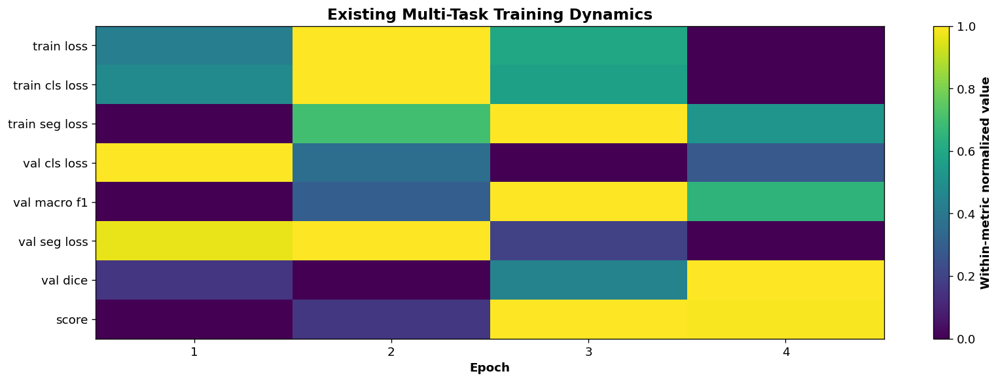

In [ ]:
# ============================================================
# STAGE 15 — EXISTING TRAINING HISTORY
# ============================================================

history_candidates = [
    RESULTS
    /
    "training_history_v3.csv",

    RESULTS
    /
    "training_history.csv",
]


history_path = next(
    (
        path
        for path
        in history_candidates
        if path.exists()
    ),
    None
)


if history_path is None:

    print(
        "No training-history CSV found; skipping training-dynamics figure."
    )

else:

    hist = pd.read_csv(
        history_path
    )

    print(
        "Using existing training history:",
        history_path
    )

    display(
        hist.tail(
            10
        )
    )


    metric_cols = [
        c
        for c
        in [
            "train_loss",
            "train_cls_loss",
            "train_seg_loss",
            "val_cls_loss",
            "val_macro_f1",
            "val_seg_loss",
            "val_dice",
            "score",
        ]
        if c
        in hist.columns
    ]


    if len(
        metric_cols
    ) >= 2:

        matrix = hist[
            metric_cols
        ].T.values.astype(
            float
        )

        normalized = np.zeros_like(
            matrix
        )

        for i in range(
            matrix.shape[
                0
            ]
        ):

            lo = np.nanpercentile(
                matrix[
                    i
                ],
                5
            )

            hi = np.nanpercentile(
                matrix[
                    i
                ],
                95
            )

            normalized[
                i
            ] = np.clip(
                (
                    matrix[
                        i
                    ]
                    -
                    lo
                )
                /
                (
                    hi
                    -
                    lo
                    +
                    1e-9
                ),
                0,
                1
            )


        plt.figure(
            figsize=(
                14,
                5
            )
        )

        im = plt.imshow(
            normalized,
            aspect="auto",
            cmap="viridis",
            interpolation="nearest"
        )

        plt.yticks(
            range(
                len(
                    metric_cols
                )
            ),
            [
                c.replace(
                    "_",
                    " "
                )
                for c
                in metric_cols
            ]
        )

        epochs = (
            hist[
                "epoch"
            ].values
            if "epoch"
            in hist.columns
            else np.arange(
                1,
                len(
                    hist
                )
                +
                1
            )
        )

        tick_idx = np.linspace(
            0,
            len(
                hist
            )
            -
            1,
            min(
                12,
                len(
                    hist
                )
            )
        ).astype(
            int
        )

        plt.xticks(
            tick_idx,
            epochs[
                tick_idx
            ]
        )

        plt.xlabel(
            "Epoch",
            fontweight="bold"
        )

        plt.title(
            "Existing Multi-Task Training Dynamics",
            weight="bold"
        )

        cbar = plt.colorbar(
            im
        )

        cbar.set_label(
            "Within-metric normalized value",
            fontweight="bold"
        )

        plt.tight_layout()

        savefig(
            "15_existing_training_dynamics_heatmap"
        )

        plt.show()

## Stage 16 — Primary Classification Evaluation

In [ ]:
if not BEST_CKPT.exists():

    raise RuntimeError(
        "Best/refined checkpoint missing. "
        "Run Stage 14 and Stage 14B first."
    )


print(
    "Primary evaluation checkpoint:",
    BEST_CKPT
)


best = torch.load(
    BEST_CKPT,
    map_location=DEVICE,
    weights_only=False
)


model.load_state_dict(
    best[
        "model"
    ]
)


model.eval()


inference_cfg = dict(
    best.get(
        "inference_config",
        {}
    )
)


CLASSIFICATION_PRIOR_ALPHA = float(
    inference_cfg.get(
        "classification_prior_alpha",
        globals().get(
            "CLASSIFICATION_PRIOR_ALPHA",
            0.0
        )
    )
)


CLS_TTA_VIEWS_EVAL = int(
    inference_cfg.get(
        "classification_tta_views",
        globals().get(
            "CLS_TTA_VIEWS",
            1
        )
    )
)


_eval_counts = np.ones(
    len(
        HK_CLASSES
    ),
    dtype=np.float64
)


for label, count in (
    cls_train_df[
        "label"
    ]
    .value_counts()
    .items()
):

    _eval_counts[
        int(
            label
        )
    ] = float(
        count
    )


EVAL_LOG_PRIOR = torch.tensor(
    np.log(
        _eval_counts
        /
        _eval_counts.sum()
        +
        1e-12
    ),
    dtype=torch.float32,
    device=DEVICE
)


@torch.no_grad()
def classification_tta_logits_inference(
    x
):

    views = [
        x
    ]


    if CLS_TTA_VIEWS_EVAL >= 2:

        views.append(
            torch.flip(
                x,
                dims=[
                    3
                ]
            )
        )


    if CLS_TTA_VIEWS_EVAL >= 3:

        views.append(
            torch.flip(
                x,
                dims=[
                    2
                ]
            )
        )


    if CLS_TTA_VIEWS_EVAL >= 4:

        views.append(
            torch.flip(
                x,
                dims=[
                    2,
                    3
                ]
            )
        )


    logits = torch.stack(
        [
            model(
                view,
                task="cls"
            )[
                "cls"
            ]
            for view
            in views
        ],
        dim=0
    ).mean(
        dim=0
    )


    logits = (
        logits
        -
        CLASSIFICATION_PRIOR_ALPHA
        *
        EVAL_LOG_PRIOR.unsqueeze(
            0
        )
    )


    return logits


@torch.no_grad()
def classification_predictions(
    loader,
    perturb_fn=None,
    desc="Classification inference"
):

    ys = []

    preds = []

    probs = []

    names = []

    latency = []


    for x, y, fn in tqdm(
        loader,
        desc=desc
    ):

        x = x.to(
            DEVICE,
            non_blocking=True
        )


        if perturb_fn is not None:

            x = perturb_fn(
                x
            )


        if DEVICE.type == "cuda":

            torch.cuda.synchronize()


        t0 = time.perf_counter()


        logits = classification_tta_logits_inference(
            x
        )


        if DEVICE.type == "cuda":

            torch.cuda.synchronize()


        latency.append(
            (
                time.perf_counter()
                -
                t0
            )
            /
            len(
                x
            )
        )


        pr = torch.softmax(
            logits,
            dim=1
        )


        ys.extend(
            y.numpy()
        )


        preds.extend(
            pr.argmax(
                1
            ).cpu().numpy()
        )


        probs.append(
            pr.cpu().numpy()
        )


        names.extend(
            fn
        )


    return (
        np.asarray(
            ys
        ),
        np.asarray(
            preds
        ),
        np.concatenate(
            probs
        ),
        names,
        np.asarray(
            latency
        ),
    )


def multiclass_ece(
    y,
    probs,
    bins=15
):

    conf = probs.max(
        1
    )

    pred = probs.argmax(
        1
    )

    correct = (
        pred
        ==
        y
    ).astype(
        float
    )

    edges = np.linspace(
        0,
        1,
        bins
        +
        1
    )

    ece = 0.0


    for a, b in zip(
        edges[
            :-1
        ],
        edges[
            1:
        ]
    ):

        m = (
            (
                conf
                >
                a
            )
            &
            (
                conf
                <=
                b
            )
        )


        if m.any():

            ece += (
                m.mean()
                *
                abs(
                    correct[
                        m
                    ].mean()
                    -
                    conf[
                        m
                    ].mean()
                )
            )


    return float(
        ece
    )


def classification_metrics(
    y,
    pred,
    probs,
    labels=None
):

    labels = (
        np.arange(
            probs.shape[
                1
            ]
        )
        if labels
        is None
        else np.asarray(
            labels
        )
    )


    p, r, f, _ = precision_recall_fscore_support(
        y,
        pred,
        labels=labels,
        average="macro",
        zero_division=0
    )


    wp, wr, wf, _ = precision_recall_fscore_support(
        y,
        pred,
        average="weighted",
        zero_division=0
    )


    out = {
        "accuracy":
            accuracy_score(
                y,
                pred
            ),

        "balanced_accuracy":
            balanced_accuracy_score(
                y,
                pred
            ),

        "macro_precision":
            p,

        "macro_recall":
            r,

        "macro_f1":
            f,

        "weighted_f1":
            wf,

        "mcc":
            matthews_corrcoef(
                y,
                pred
            ),

        "ece":
            multiclass_ece(
                y,
                probs
            ),

        "brier_multiclass":
            float(
                np.mean(
                    np.sum(
                        (
                            probs
                            -
                            np.eye(
                                probs.shape[
                                    1
                                ]
                            )[
                                y
                            ]
                        )
                        **
                        2,
                        axis=1
                    )
                )
            ),
    }


    aucs = []


    for lab in labels:

        target = (
            y
            ==
            lab
        ).astype(
            int
        )


        if target.min() != target.max():

            try:

                aucs.append(
                    roc_auc_score(
                        target,
                        probs[
                            :,
                            int(
                                lab
                            )
                        ]
                    )
                )

            except Exception:

                pass


    out[
        "macro_auroc_ovr"
    ] = (
        float(
            np.mean(
                aucs
            )
        )
        if aucs
        else np.nan
    )


    return out


print(
    "Classification TTA views:",
    CLS_TTA_VIEWS_EVAL
)

print(
    "Validation-selected prior alpha:",
    CLASSIFICATION_PRIOR_ALPHA
)


y_test, p_test, prob_test, fn_test, latency_test = (
    classification_predictions(
        cls_test_loader
    )
)


cls_metrics = classification_metrics(
    y_test,
    p_test,
    prob_test
)


cls_metrics[
    "latency_ms_per_image"
] = float(
    latency_test.mean()
    *
    1000
)


cls_metrics[
    "tta_views"
] = int(
    CLS_TTA_VIEWS_EVAL
)


cls_metrics[
    "prior_alpha"
] = float(
    CLASSIFICATION_PRIOR_ALPHA
)


pd.DataFrame(
    [
        cls_metrics
    ]
).to_csv(
    RESULTS
    /
    "primary_classification_metrics.csv",
    index=False
)


pred_df = pd.DataFrame(
    {
        "filename":
            fn_test,

        "true":
            y_test,

        "pred":
            p_test,

        "true_class":
            [
                HK_CLASSES[
                    i
                ]
                for i
                in y_test
            ],

        "pred_class":
            [
                HK_CLASSES[
                    i
                ]
                for i
                in p_test
            ],

        "confidence":
            prob_test.max(
                1
            ),

        "entropy":
            -(
                prob_test
                *
                np.log(
                    prob_test
                    +
                    1e-12
                )
            ).sum(
                1
            ),
    }
)


pred_df.to_csv(
    RESULTS
    /
    "primary_classification_predictions.csv",
    index=False
)


display(
    pd.DataFrame(
        [
            cls_metrics
        ]
    ).T.rename(
        columns={
            0:
                "value"
        }
    )
)

Primary evaluation checkpoint: /content/drive/MyDrive/MTG_MaxViTX/checkpoints/mtg_maxvitx_q1_refined_final.pt
Classification TTA views: 4
Validation-selected prior alpha: -0.25


Classification inference:   0%|          | 0/133 [00:00<?, ?it/s]

,value
accuracy,0.903728
balanced_accuracy,0.594774
macro_precision,0.600743
macro_recall,0.594774
macro_f1,0.594554
weighted_f1,0.900086
mcc,0.895615
ece,0.178462
brier_multiclass,0.198876
macro_auroc_ovr,0.814716


## Stage 16B — Low-Compute Balanced Classification Ensemble

The refined MaxViT encoder is frozen. Training/validation/test embeddings are cached once, after which a lightweight class-balanced head is optimized in embedding space. Its predictions are combined with the refined classifier, cosine class prototypes, and the coarse anatomical/pathology head. Ensemble weights are selected **only on validation data** with a ≥90% validation-accuracy constraint.


In [ ]:
# ============================================================
# STAGE 16B — V6 BALANCED CLASSIFICATION ENSEMBLE
# ============================================================

V6_CLS_DIR = (
    CHECKPOINTS
    /
    "v6_balanced_classifier"
)

V6_CLS_DIR.mkdir(
    parents=True,
    exist_ok=True
)

V6_HEAD_BEST = (
    V6_CLS_DIR
    /
    "balanced_embedding_head_best.pt"
)

V6_HEAD_LAST = (
    V6_CLS_DIR
    /
    "balanced_embedding_head_last.pt"
)

V6_HEAD_DONE = (
    V6_CLS_DIR
    /
    "balanced_embedding_head_done.json"
)

V6_ENSEMBLE_CONFIG = (
    RESULTS
    /
    "v6_classification_ensemble_config.json"
)


# Preserve the already-computed v5 test predictions for a paired comparison.
V5_TEST_Y = np.asarray(
    y_test
).copy()

V5_TEST_PRED = np.asarray(
    p_test
).copy()

V5_TEST_PROB = np.asarray(
    prob_test
).copy()


def _v6_embedding_cache_path(
    split_name
):

    return (
        CACHE
        /
        (
            f"v6_embeddings_"
            f"{BEST_CKPT.stem}_"
            f"{split_name}.npz"
        )
    )


@torch.no_grad()
def extract_v6_embeddings(
    loader,
    split_name
):

    cache_path = _v6_embedding_cache_path(
        split_name
    )


    if cache_path.exists():

        z = np.load(
            cache_path,
            allow_pickle=True
        )


        return {
            "embedding":
                z[
                    "embedding"
                ].astype(
                    np.float32
                ),

            "y":
                z[
                    "y"
                ].astype(
                    np.int64
                ),

            "filename":
                z[
                    "filename"
                ].astype(
                    str
                ),
        }


    model.eval()


    embeddings = []

    ys = []

    names = []


    for x, y, fn in tqdm(
        loader,
        desc=f"Embedding cache — {split_name}"
    ):

        x = x.to(
            DEVICE,
            non_blocking=True
        )


        out = model(
            x,
            task="cls",
            return_features=True
        )


        embeddings.append(
            out[
                "pooled"
            ].detach().cpu().numpy()
        )


        ys.extend(
            y.numpy()
        )


        names.extend(
            fn
        )


    payload = {
        "embedding":
            np.concatenate(
                embeddings,
                axis=0
            ).astype(
                np.float32
            ),

        "y":
            np.asarray(
                ys,
                dtype=np.int64
            ),

        "filename":
            np.asarray(
                names
            ),
    }


    np.savez_compressed(
        cache_path,
        **payload
    )


    return payload


if RUN_V6_BALANCED_ENSEMBLE:

    print()
    print(
        "=" * 72
    )

    print(
        "V6 CLASS-BALANCED EMBEDDING ENSEMBLE"
    )

    print(
        "=" * 72
    )


    train_emb = extract_v6_embeddings(
        cls_train_loader,
        "train"
    )

    val_emb = extract_v6_embeddings(
        cls_val_loader,
        "val"
    )

    test_emb = extract_v6_embeddings(
        cls_test_loader,
        "test"
    )


    EMB_DIM = int(
        train_emb[
            "embedding"
        ].shape[
            1
        ]
    )


    class BalancedEmbeddingHead(
        nn.Module
    ):

        def __init__(
            self,
            dim,
            num_classes
        ):

            super().__init__()


            self.net = nn.Sequential(
                nn.LayerNorm(
                    dim
                ),
                nn.Dropout(
                    0.10
                ),
                nn.Linear(
                    dim,
                    dim
                    //
                    2
                ),
                nn.GELU(),
                nn.Dropout(
                    0.15
                ),
                nn.Linear(
                    dim
                    //
                    2,
                    num_classes
                ),
            )


        def forward(
            self,
            x
        ):

            return self.net(
                x
            )


    balanced_head = BalancedEmbeddingHead(
        EMB_DIM,
        len(
            HK_CLASSES
        )
    ).to(
        DEVICE
    )


    # --------------------------------------------------------
    # Class-balanced embedding sampler
    # --------------------------------------------------------

    embedding_counts = np.bincount(
        train_emb[
            "y"
        ],
        minlength=len(
            HK_CLASSES
        )
    ).astype(
        np.float64
    )


    embedding_weights = (
        1.0
        /
        np.maximum(
            1.0,
            embedding_counts[
                train_emb[
                    "y"
                ]
            ]
        )
    )


    class EmbeddingDataset(
        Dataset
    ):

        def __init__(
            self,
            emb,
            y
        ):

            self.emb = torch.tensor(
                emb,
                dtype=torch.float32
            )

            self.y = torch.tensor(
                y,
                dtype=torch.long
            )


        def __len__(
            self
        ):

            return len(
                self.y
            )


        def __getitem__(
            self,
            idx
        ):

            return (
                self.emb[
                    idx
                ],
                self.y[
                    idx
                ]
            )


    emb_train_ds = EmbeddingDataset(
        train_emb[
            "embedding"
        ],
        train_emb[
            "y"
        ]
    )


    emb_val_x = torch.tensor(
        val_emb[
            "embedding"
        ],
        dtype=torch.float32,
        device=DEVICE
    )


    emb_val_y = np.asarray(
        val_emb[
            "y"
        ],
        dtype=np.int64
    )


    head_optimizer = torch.optim.AdamW(
        balanced_head.parameters(),
        lr=BALANCED_HEAD_LR,
        weight_decay=BALANCED_HEAD_WEIGHT_DECAY
    )


    head_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        head_optimizer,
        T_max=BALANCED_HEAD_EPOCHS,
        eta_min=BALANCED_HEAD_LR
        *
        0.03
    )


    effective_num = (
        1.0
        -
        np.power(
            0.999,
            embedding_counts
        )
    )


    cb_weights = (
        1.0
        -
        0.999
    ) / np.maximum(
        effective_num,
        1e-8
    )


    cb_weights = (
        cb_weights
        /
        cb_weights.mean()
    )


    cb_weights_t = torch.tensor(
        cb_weights,
        dtype=torch.float32,
        device=DEVICE
    )


    head_best_score = -np.inf

    head_bad = 0

    head_start_epoch = 0

    head_history = []


    if (
        V6_HEAD_DONE.exists()
        and
        V6_HEAD_BEST.exists()
    ):

        state = torch.load(
            V6_HEAD_BEST,
            map_location=DEVICE,
            weights_only=False
        )


        balanced_head.load_state_dict(
            state[
                "head"
            ]
        )


        head_history = list(
            state.get(
                "history",
                []
            )
        )


        print(
            "✓ Loaded completed balanced embedding head."
        )


    else:

        if V6_HEAD_LAST.exists():

            state = torch.load(
                V6_HEAD_LAST,
                map_location=DEVICE,
                weights_only=False
            )


            balanced_head.load_state_dict(
                state[
                    "head"
                ]
            )


            head_optimizer.load_state_dict(
                state[
                    "optimizer"
                ]
            )


            head_scheduler.load_state_dict(
                state[
                    "scheduler"
                ]
            )


            head_best_score = float(
                state.get(
                    "best_score",
                    -np.inf
                )
            )


            head_bad = int(
                state.get(
                    "bad",
                    0
                )
            )


            head_start_epoch = int(
                state[
                    "epoch"
                ]
            ) + 1


            head_history = list(
                state.get(
                    "history",
                    []
                )
            )


            print(
                "✓ Resuming embedding-head training from epoch",
                head_start_epoch
                +
                1
            )


        for epoch in range(
            head_start_epoch,
            BALANCED_HEAD_EPOCHS
        ):

            generator = torch.Generator()

            generator.manual_seed(
                int(
                    SEED
                    +
                    50000
                    +
                    epoch
                    *
                    131
                )
            )


            epoch_sampler = WeightedRandomSampler(
                torch.tensor(
                    embedding_weights,
                    dtype=torch.double
                ),
                num_samples=len(
                    embedding_weights
                ),
                replacement=True,
                generator=generator
            )


            emb_loader = DataLoader(
                emb_train_ds,
                batch_size=128,
                sampler=epoch_sampler,
                num_workers=0
            )


            balanced_head.train()


            train_loss = 0.0

            n_updates = 0


            for xb, yb in emb_loader:

                xb = xb.to(
                    DEVICE
                )

                yb = yb.to(
                    DEVICE
                )


                head_optimizer.zero_grad(
                    set_to_none=True
                )


                logits = balanced_head(
                    xb
                )


                ce = F.cross_entropy(
                    logits,
                    yb,
                    weight=cb_weights_t,
                    label_smoothing=0.03
                )


                pt = torch.softmax(
                    logits,
                    dim=1
                ).gather(
                    1,
                    yb.unsqueeze(
                        1
                    )
                ).squeeze(
                    1
                )


                focal = (
                    (
                        1.0
                        -
                        pt
                    )
                    **
                    1.2
                    *
                    F.cross_entropy(
                        logits,
                        yb,
                        weight=cb_weights_t,
                        reduction="none"
                    )
                ).mean()


                loss = (
                    0.65
                    *
                    ce
                    +
                    0.35
                    *
                    focal
                )


                loss.backward()


                torch.nn.utils.clip_grad_norm_(
                    balanced_head.parameters(),
                    1.0
                )


                head_optimizer.step()


                train_loss += loss.item()

                n_updates += 1


            head_scheduler.step()


            balanced_head.eval()


            with torch.no_grad():

                val_logits_bal = balanced_head(
                    emb_val_x
                )


                val_pred_bal = val_logits_bal.argmax(
                    1
                ).cpu().numpy()


            val_acc_bal = accuracy_score(
                emb_val_y,
                val_pred_bal
            )


            val_f1_bal = f1_score(
                emb_val_y,
                val_pred_bal,
                average="macro",
                zero_division=0
            )


            # Head itself is optimized toward macro-F1.
            score_bal = (
                0.25
                *
                val_acc_bal
                +
                0.75
                *
                val_f1_bal
            )


            row = {
                "epoch":
                    int(
                        epoch
                        +
                        1
                    ),

                "train_loss":
                    float(
                        train_loss
                        /
                        max(
                            1,
                            n_updates
                        )
                    ),

                "val_accuracy":
                    float(
                        val_acc_bal
                    ),

                "val_macro_f1":
                    float(
                        val_f1_bal
                    ),

                "score":
                    float(
                        score_bal
                    ),
            }


            head_history.append(
                row
            )


            improved = (
                score_bal
                >
                head_best_score
                +
                1e-4
            )


            if improved:

                head_best_score = float(
                    score_bal
                )

                head_bad = 0


                atomic_torch_save(
                    {
                        "head":
                            balanced_head.state_dict(),

                        "epoch":
                            int(
                                epoch
                            ),

                        "best_score":
                            float(
                                head_best_score
                            ),

                        "history":
                            list(
                                head_history
                            ),
                    },
                    V6_HEAD_BEST
                )


            else:

                head_bad += 1


            if (
                ((epoch + 1) % BALANCED_HEAD_CKPT_INTERVAL == 0)
                or improved
            ):

                atomic_torch_save(
                    {
                        "head":
                            balanced_head.state_dict(),

                        "optimizer":
                            head_optimizer.state_dict(),

                        "scheduler":
                            head_scheduler.state_dict(),

                        "epoch":
                            int(
                                epoch
                            ),

                        "best_score":
                            float(
                                head_best_score
                            ),

                        "bad":
                            int(
                                head_bad
                            ),

                        "history":
                            list(
                                head_history
                            ),
                    },
                    V6_HEAD_LAST
                )


            if (
                head_bad
                >=
                BALANCED_HEAD_PATIENCE
            ):

                print(
                    "Balanced embedding head early stopping."
                )

                break


        best_head_state = torch.load(
            V6_HEAD_BEST,
            map_location=DEVICE,
            weights_only=False
        )


        balanced_head.load_state_dict(
            best_head_state[
                "head"
            ]
        )


        V6_HEAD_DONE.write_text(
            json.dumps(
                {
                    "done":
                        True,

                    "time":
                        time.strftime(
                            "%Y-%m-%d %H:%M:%S"
                        ),

                    "best_score":
                        float(
                            best_head_state[
                                "best_score"
                            ]
                        ),
                },
                indent=2
            )
        )


    pd.DataFrame(
        head_history
    ).to_csv(
        RESULTS
        /
        "v6_balanced_embedding_head_history.csv",
        index=False
    )


    # ========================================================
    # COSINE CLASS PROTOTYPES
    # ========================================================

    train_x_np = np.asarray(
        train_emb[
            "embedding"
        ],
        dtype=np.float32
    )


    train_y_np = np.asarray(
        train_emb[
            "y"
        ],
        dtype=np.int64
    )


    train_x_norm = (
        train_x_np
        /
        (
            np.linalg.norm(
                train_x_np,
                axis=1,
                keepdims=True
            )
            +
            1e-9
        )
    )


    prototypes = np.zeros(
        (
            len(
                HK_CLASSES
            ),
            train_x_norm.shape[
                1
            ]
        ),
        dtype=np.float32
    )


    for cls_id in range(
        len(
            HK_CLASSES
        )
    ):

        m = (
            train_y_np
            ==
            cls_id
        )


        if m.any():

            proto = train_x_norm[
                m
            ].mean(
                axis=0
            )


            prototypes[
                cls_id
            ] = (
                proto
                /
                (
                    np.linalg.norm(
                        proto
                    )
                    +
                    1e-9
                )
            )


    V6_PROTOTYPES = torch.tensor(
        prototypes,
        dtype=torch.float32,
        device=DEVICE
    )


    # ========================================================
    # COARSE HEAD FROM CLASSIFICATION REFINEMENT
    # ========================================================

    coarse_head_v6 = nn.Sequential(
        nn.LayerNorm(
            EMB_DIM
        ),
        nn.Dropout(
            0.20
        ),
        nn.Linear(
            EMB_DIM,
            len(
                COARSE_NAMES
            )
        )
    ).to(
        DEVICE
    )


    if CLS_REFINE_BEST.exists():

        cls_ref_payload = torch.load(
            CLS_REFINE_BEST,
            map_location=DEVICE,
            weights_only=False
        )


        if "coarse_head" in cls_ref_payload:

            coarse_head_v6.load_state_dict(
                cls_ref_payload[
                    "coarse_head"
                ]
            )


            V6_HAS_COARSE_HEAD = True


        else:

            V6_HAS_COARSE_HEAD = False


    else:

        V6_HAS_COARSE_HEAD = False


    coarse_head_v6.eval()

    balanced_head.eval()


    # ========================================================
    # FAST VALIDATION COMPONENT PREDICTIONS
    # ========================================================

    @torch.no_grad()
    def embedding_component_probabilities(
        emb_np
    ):

        emb = torch.tensor(
            emb_np,
            dtype=torch.float32,
            device=DEVICE
        )


        bal_logits = balanced_head(
            emb
        )


        bal_prob = torch.softmax(
            bal_logits,
            dim=1
        )


        emb_norm = F.normalize(
            emb,
            p=2,
            dim=1
        )


        proto_logits = (
            emb_norm
            @
            V6_PROTOTYPES.T
        ) / 0.07


        proto_prob = torch.softmax(
            proto_logits,
            dim=1
        )


        if V6_HAS_COARSE_HEAD:

            coarse_prob = torch.softmax(
                coarse_head_v6(
                    emb
                ),
                dim=1
            )


            fine_coarse = coarse_prob[
                :,
                FINE_TO_COARSE
            ]


        else:

            fine_coarse = torch.ones_like(
                bal_prob
            )


        return (
            bal_prob.cpu().numpy(),
            proto_prob.cpu().numpy(),
            fine_coarse.cpu().numpy()
        )


    val_bal_prob, val_proto_prob, val_coarse_prob = (
        embedding_component_probabilities(
            val_emb[
                "embedding"
            ]
        )
    )


    # Base TTA probability cache on validation.
    @torch.no_grad()
    def base_tta_probabilities(
        loader,
        desc
    ):

        probs_out = []

        ys_out = []


        for x, y, _ in tqdm(
            loader,
            desc=desc
        ):

            x = x.to(
                DEVICE,
                non_blocking=True
            )


            logits = classification_tta_logits_inference(
                x
            )


            probs_out.append(
                torch.softmax(
                    logits,
                    dim=1
                ).cpu().numpy()
            )


            ys_out.extend(
                y.numpy()
            )


        return (
            np.concatenate(
                probs_out,
                axis=0
            ),
            np.asarray(
                ys_out,
                dtype=np.int64
            ),
        )


    val_base_prob, val_y_v6 = base_tta_probabilities(
        cls_val_loader,
        "V6 validation base probabilities"
    )


    # ========================================================
    # VALIDATION-ONLY ENSEMBLE SEARCH
    # ========================================================

    search_rows = []


    for w_bal in np.arange(
        0.00,
        0.61,
        0.10
    ):

        for w_proto in np.arange(
            0.00,
            0.31,
            0.10
        ):

            if (
                w_bal
                +
                w_proto
                >
                0.80
            ):

                continue


            w_base = (
                1.0
                -
                w_bal
                -
                w_proto
            )


            for coarse_gamma in [
                0.0,
                0.25,
                0.50,
                0.75,
            ]:

                prob = (
                    w_base
                    *
                    val_base_prob
                    +
                    w_bal
                    *
                    val_bal_prob
                    +
                    w_proto
                    *
                    val_proto_prob
                )


                if (
                    coarse_gamma
                    >
                    0
                    and
                    V6_HAS_COARSE_HEAD
                ):

                    prob = (
                        prob
                        *
                        np.power(
                            np.clip(
                                val_coarse_prob,
                                1e-6,
                                1.0
                            ),
                            coarse_gamma
                        )
                    )


                    prob = (
                        prob
                        /
                        (
                            prob.sum(
                                axis=1,
                                keepdims=True
                            )
                            +
                            1e-12
                        )
                    )


                pred = prob.argmax(
                    1
                )


                acc = accuracy_score(
                    val_y_v6,
                    pred
                )


                mf1 = f1_score(
                    val_y_v6,
                    pred,
                    average="macro",
                    zero_division=0
                )


                bacc = balanced_accuracy_score(
                    val_y_v6,
                    pred
                )


                # Hard validation-accuracy preference, then maximize
                # class-balanced performance.
                accuracy_penalty = max(
                    0.0,
                    V6_MIN_VALIDATION_ACCURACY
                    -
                    acc
                )


                score = (
                    0.15
                    *
                    acc
                    +
                    0.55
                    *
                    mf1
                    +
                    0.30
                    *
                    bacc
                    -
                    8.0
                    *
                    accuracy_penalty
                )


                search_rows.append(
                    {
                        "w_base":
                            float(
                                w_base
                            ),

                        "w_balanced":
                            float(
                                w_bal
                            ),

                        "w_prototype":
                            float(
                                w_proto
                            ),

                        "coarse_gamma":
                            float(
                                coarse_gamma
                            ),

                        "accuracy":
                            float(
                                acc
                            ),

                        "macro_f1":
                            float(
                                mf1
                            ),

                        "balanced_accuracy":
                            float(
                                bacc
                            ),

                        "score":
                            float(
                                score
                            ),
                    }
                )


    ensemble_search_df = pd.DataFrame(
        search_rows
    ).sort_values(
        [
            "score",
            "macro_f1",
        ],
        ascending=False
    )


    valid90 = ensemble_search_df.loc[
        ensemble_search_df[
            "accuracy"
        ]
        >=
        V6_MIN_VALIDATION_ACCURACY
    ]


    if len(
        valid90
    ):

        winner = valid90.iloc[
            0
        ]


    else:

        print(
            "Warning: no ensemble candidate preserved the "
            "requested validation accuracy constraint."
        )


        winner = ensemble_search_df.iloc[
            0
        ]


    V6_W_BASE = float(
        winner[
            "w_base"
        ]
    )

    V6_W_BALANCED = float(
        winner[
            "w_balanced"
        ]
    )

    V6_W_PROTOTYPE = float(
        winner[
            "w_prototype"
        ]
    )

    V6_COARSE_GAMMA = float(
        winner[
            "coarse_gamma"
        ]
    )


    ensemble_search_df.to_csv(
        RESULTS
        /
        "v6_classification_ensemble_validation_search.csv",
        index=False
    )


    V6_ENSEMBLE_CONFIG.write_text(
        json.dumps(
            {
                "w_base":
                    V6_W_BASE,

                "w_balanced":
                    V6_W_BALANCED,

                "w_prototype":
                    V6_W_PROTOTYPE,

                "coarse_gamma":
                    V6_COARSE_GAMMA,

                "validation_accuracy":
                    float(
                        winner[
                            "accuracy"
                        ]
                    ),

                "validation_macro_f1":
                    float(
                        winner[
                            "macro_f1"
                        ]
                    ),

                "validation_balanced_accuracy":
                    float(
                        winner[
                            "balanced_accuracy"
                        ]
                    ),

                "has_coarse_head":
                    bool(
                        V6_HAS_COARSE_HEAD
                    ),
            },
            indent=2
        )
    )


    print()
    print(
        "Selected V6 ensemble:"
    )

    display(
        ensemble_search_df.head(
            12
        )
    )


    print(
        "Weights:",
        {
            "base":
                V6_W_BASE,

            "balanced":
                V6_W_BALANCED,

            "prototype":
                V6_W_PROTOTYPE,

            "coarse_gamma":
                V6_COARSE_GAMMA,
        }
    )


    # ========================================================
    # FINAL ENSEMBLE INFERENCE FUNCTION
    # ========================================================

    @torch.no_grad()
    def v6_classification_probabilities(
        x
    ):

        views = [
            x
        ]


        if CLS_TTA_VIEWS_EVAL >= 2:

            views.append(
                torch.flip(
                    x,
                    dims=[
                        3
                    ]
                )
            )


        if CLS_TTA_VIEWS_EVAL >= 3:

            views.append(
                torch.flip(
                    x,
                    dims=[
                        2
                    ]
                )
            )


        if CLS_TTA_VIEWS_EVAL >= 4:

            views.append(
                torch.flip(
                    x,
                    dims=[
                        2,
                        3
                    ]
                )
            )


        original_out = model(
            views[
                0
            ],
            task="cls",
            return_features=True
        )


        logits_list = [
            original_out[
                "cls"
            ]
        ]


        for view in views[
            1:
        ]:

            logits_list.append(
                model(
                    view,
                    task="cls"
                )[
                    "cls"
                ]
            )


        base_logits = torch.stack(
            logits_list,
            dim=0
        ).mean(
            dim=0
        )


        base_logits = (
            base_logits
            -
            CLASSIFICATION_PRIOR_ALPHA
            *
            EVAL_LOG_PRIOR.unsqueeze(
                0
            )
        )


        base_prob = torch.softmax(
            base_logits,
            dim=1
        )


        pooled = original_out[
            "pooled"
        ]


        bal_prob = torch.softmax(
            balanced_head(
                pooled
            ),
            dim=1
        )


        pooled_norm = F.normalize(
            pooled,
            p=2,
            dim=1
        )


        proto_prob = torch.softmax(
            (
                pooled_norm
                @
                V6_PROTOTYPES.T
            ) / 0.07,
            dim=1
        )


        prob = (
            V6_W_BASE
            *
            base_prob
            +
            V6_W_BALANCED
            *
            bal_prob
            +
            V6_W_PROTOTYPE
            *
            proto_prob
        )


        if (
            V6_COARSE_GAMMA
            >
            0
            and
            V6_HAS_COARSE_HEAD
        ):

            coarse_prob = torch.softmax(
                coarse_head_v6(
                    pooled
                ),
                dim=1
            )


            fine_coarse = coarse_prob[
                :,
                FINE_TO_COARSE
            ]


            prob = (
                prob
                *
                torch.pow(
                    torch.clamp(
                        fine_coarse,
                        min=1e-6
                    ),
                    V6_COARSE_GAMMA
                )
            )


        prob = (
            prob
            /
            (
                prob.sum(
                    dim=1,
                    keepdim=True
                )
                +
                1e-12
            )
        )


        return prob


    @torch.no_grad()
    def classification_predictions(
        loader,
        perturb_fn=None,
        desc="Classification inference"
    ):

        ys = []

        preds = []

        probs = []

        names = []

        latency = []


        for x, y, fn in tqdm(
            loader,
            desc=desc
        ):

            x = x.to(
                DEVICE,
                non_blocking=True
            )


            if perturb_fn is not None:

                x = perturb_fn(
                    x
                )


            if DEVICE.type == "cuda":

                torch.cuda.synchronize()


            t0 = time.perf_counter()


            pr = v6_classification_probabilities(
                x
            )


            if DEVICE.type == "cuda":

                torch.cuda.synchronize()


            latency.append(
                (
                    time.perf_counter()
                    -
                    t0
                )
                /
                len(
                    x
                )
            )


            ys.extend(
                y.numpy()
            )


            preds.extend(
                pr.argmax(
                    1
                ).cpu().numpy()
            )


            probs.append(
                pr.cpu().numpy()
            )


            names.extend(
                fn
            )


        return (
            np.asarray(
                ys
            ),
            np.asarray(
                preds
            ),
            np.concatenate(
                probs,
                axis=0
            ),
            names,
            np.asarray(
                latency
            ),
        )


    # ========================================================
    # V6 TEST EVALUATION
    # ========================================================

    y_test, p_test, prob_test, fn_test, latency_test = (
        classification_predictions(
            cls_test_loader,
            desc="V6 balanced classification inference"
        )
    )


    cls_metrics = classification_metrics(
        y_test,
        p_test,
        prob_test
    )


    cls_metrics[
        "latency_ms_per_image"
    ] = float(
        latency_test.mean()
        *
        1000
    )


    cls_metrics[
        "v6_w_base"
    ] = V6_W_BASE

    cls_metrics[
        "v6_w_balanced"
    ] = V6_W_BALANCED

    cls_metrics[
        "v6_w_prototype"
    ] = V6_W_PROTOTYPE

    cls_metrics[
        "v6_coarse_gamma"
    ] = V6_COARSE_GAMMA


    pd.DataFrame(
        [
            cls_metrics
        ]
    ).to_csv(
        RESULTS
        /
        "primary_classification_metrics_v6.csv",
        index=False
    )


    pred_df = pd.DataFrame(
        {
            "filename":
                fn_test,

            "true":
                y_test,

            "pred":
                p_test,

            "true_class":
                [
                    HK_CLASSES[
                        i
                    ]
                    for i
                    in y_test
                ],

            "pred_class":
                [
                    HK_CLASSES[
                        i
                    ]
                    for i
                    in p_test
                ],

            "confidence":
                prob_test.max(
                    1
                ),

            "entropy":
                -(
                    prob_test
                    *
                    np.log(
                        prob_test
                        +
                        1e-12
                    )
                ).sum(
                    1
                ),
        }
    )


    pred_df.to_csv(
        RESULTS
        /
        "primary_classification_predictions_v6.csv",
        index=False
    )


    # Paired incremental significance against v5.
    try:

        v5_correct = (
            V5_TEST_PRED
            ==
            V5_TEST_Y
        )


        v6_correct = (
            p_test
            ==
            y_test
        )


        mcn_table = [
            [
                int(
                    np.sum(
                        v5_correct
                        &
                        v6_correct
                    )
                ),

                int(
                    np.sum(
                        v5_correct
                        &
                        ~v6_correct
                    )
                ),
            ],
            [
                int(
                    np.sum(
                        ~v5_correct
                        &
                        v6_correct
                    )
                ),

                int(
                    np.sum(
                        ~v5_correct
                        &
                        ~v6_correct
                    )
                ),
            ],
        ]


        v6_mcnemar = mcnemar(
            mcn_table,
            exact=True
        )


        pd.DataFrame(
            [
                {
                    "comparison":
                        "V6 balanced ensemble vs V5 refined",

                    "test":
                        "Exact McNemar",

                    "statistic":
                        float(
                            v6_mcnemar.statistic
                        ),

                    "p_value":
                        float(
                            v6_mcnemar.pvalue
                        ),

                    "v5_accuracy":
                        float(
                            accuracy_score(
                                V5_TEST_Y,
                                V5_TEST_PRED
                            )
                        ),

                    "v6_accuracy":
                        float(
                            cls_metrics[
                                "accuracy"
                            ]
                        ),
                }
            ]
        ).to_csv(
            RESULTS
            /
            "v6_classification_incremental_significance.csv",
            index=False
        )


    except Exception as e:

        print(
            "Incremental McNemar warning:",
            e
        )


    print()
    print(
        "V6 TEST CLASSIFICATION"
    )

    display(
        pd.DataFrame(
            [
                cls_metrics
            ]
        ).T.rename(
            columns={
                0:
                    "value"
            }
        )
    )


    mark_stage(
        "16b_v6_balanced_classification",
        {
            "accuracy":
                float(
                    cls_metrics[
                        "accuracy"
                    ]
                ),

            "macro_f1":
                float(
                    cls_metrics[
                        "macro_f1"
                    ]
                ),

            "balanced_accuracy":
                float(
                    cls_metrics[
                        "balanced_accuracy"
                    ]
                ),
        }
    )


else:

    print(
        "V6 balanced classification ensemble skipped."
    )


V6 CLASS-BALANCED EMBEDDING ENSEMBLE


Embedding cache — train:   0%|          | 0/400 [00:00<?, ?it/s]

Embedding cache — val:   0%|          | 0/132 [00:00<?, ?it/s]

Embedding cache — test:   0%|          | 0/133 [00:00<?, ?it/s]

Balanced embedding head early stopping.


V6 validation base probabilities:   0%|          | 0/132 [00:00<?, ?it/s]


Selected V6 ensemble:


,w_base,w_balanced,w_prototype,coarse_gamma,accuracy,macro_f1,balanced_accuracy,score
36,0.7,0.2,0.1,0.00,0.919034,0.657326,0.654024,0.695592
50,0.7,0.3,0.0,0.50,0.918561,0.657352,0.654003,0.695529
64,0.6,0.4,0.0,0.00,0.921402,0.656627,0.652820,0.695201
39,0.7,0.2,0.1,0.75,0.918561,0.656244,0.654349,0.695023
67,0.6,0.4,0.0,0.75,0.920455,0.656268,0.652348,0.694720
49,0.7,0.3,0.0,0.25,0.918087,0.656174,0.653467,0.694649
12,0.7,0.0,0.3,0.00,0.917140,0.656154,0.653025,0.694363
66,0.6,0.4,0.0,0.50,0.919981,0.655758,0.652114,0.694298
38,0.7,0.2,0.1,0.50,0.917614,0.654657,0.653557,0.693770
37,0.7,0.2,0.1,0.25,0.917614,0.654453,0.653255,0.693568


Weights: {'base': 0.7000000000000001, 'balanced': 0.2, 'prototype': 0.1, 'coarse_gamma': 0.0}


V6 balanced classification inference:   0%|          | 0/133 [00:00<?, ?it/s]

Incremental McNemar warning: name 'mcnemar' is not defined

V6 TEST CLASSIFICATION


,value
accuracy,0.908919
balanced_accuracy,0.599672
macro_precision,0.617698
macro_recall,0.599672
macro_f1,0.601925
weighted_f1,0.904122
mcc,0.901308
ece,0.144532
brier_multiclass,0.175411
macro_auroc_ovr,0.817044


## Stage 17 — Classification Confusion Structure and Uncertainty Landscape

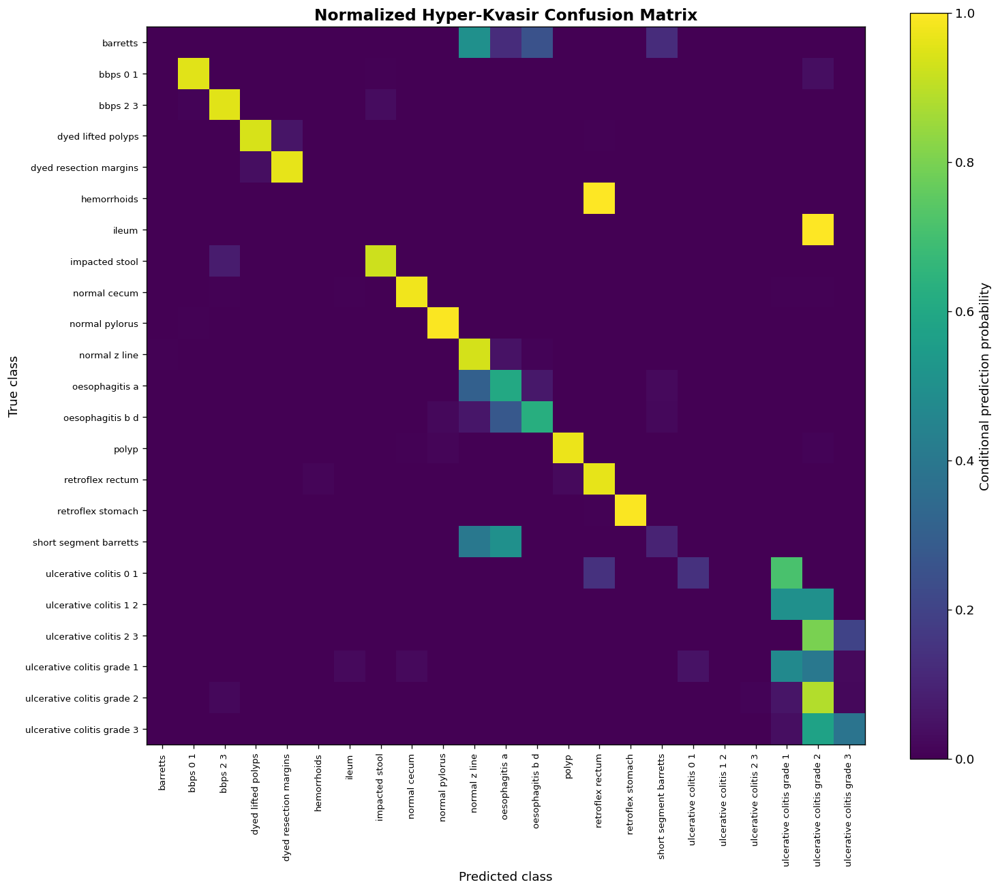

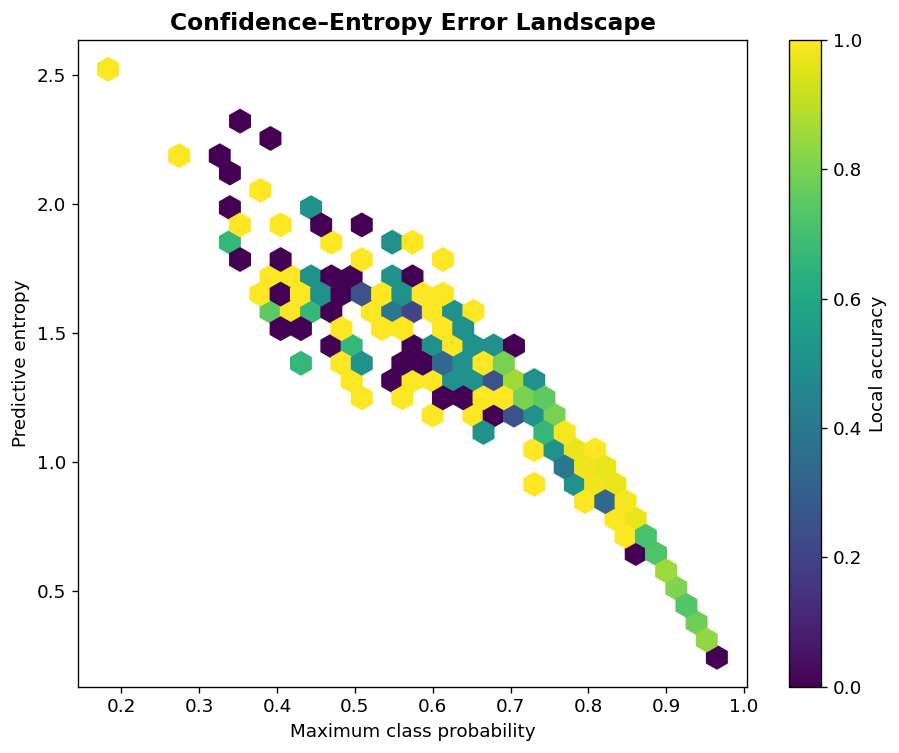

In [ ]:
cm = confusion_matrix(y_test, p_test, labels=np.arange(len(HK_CLASSES)), normalize="true")

plt.figure(figsize=(13, 11))
im = plt.imshow(cm, cmap="viridis", vmin=0, vmax=1, interpolation="nearest")
plt.xticks(range(len(HK_CLASSES)), [c.replace("-", " ") for c in HK_CLASSES], rotation=90, fontsize=8)
plt.yticks(range(len(HK_CLASSES)), [c.replace("-", " ") for c in HK_CLASSES], fontsize=8)
plt.xlabel("Predicted class")
plt.ylabel("True class")
plt.title("Normalized Hyper-Kvasir Confusion Matrix", weight="bold")
plt.colorbar(im, label="Conditional prediction probability")
plt.tight_layout()
savefig("17a_confusion_heatmap")
plt.show()

correct = (y_test == p_test).astype(float)
plt.figure(figsize=(9, 7))
hb = plt.hexbin(
    pred_df["confidence"], pred_df["entropy"],
    C=correct, reduce_C_function=np.mean,
    gridsize=30, cmap="viridis", mincnt=1, vmin=0, vmax=1
)
plt.xlabel("Maximum class probability")
plt.ylabel("Predictive entropy")
plt.title("Confidence–Entropy Error Landscape", weight="bold")
plt.colorbar(hb, label="Local accuracy")
savefig("17b_uncertainty_hexbin")
plt.show()

## Stage 18 — Primary Polyp Segmentation Evaluation

In [ ]:
def boundary_f1(
    pred,
    true,
    tolerance=2
):

    pred = pred.astype(
        bool
    )

    true = true.astype(
        bool
    )

    pe = (
        pred
        ^
        binary_erosion(
            pred
        )
    )

    te = (
        true
        ^
        binary_erosion(
            true
        )
    )


    if (
        not pe.any()
        and
        not te.any()
    ):

        return 1.0


    if (
        not pe.any()
        or
        not te.any()
    ):

        return 0.0


    te_d = binary_dilation(
        te,
        iterations=tolerance
    )

    pe_d = binary_dilation(
        pe,
        iterations=tolerance
    )


    precision = (
        (
            pe
            &
            te_d
        ).sum()
        /
        (
            pe.sum()
            +
            1e-9
        )
    )


    recall = (
        (
            te
            &
            pe_d
        ).sum()
        /
        (
            te.sum()
            +
            1e-9
        )
    )


    return float(
        2
        *
        precision
        *
        recall
        /
        (
            precision
            +
            recall
            +
            1e-9
        )
    )


def hd95(
    pred,
    true
):

    pred = pred.astype(
        bool
    )

    true = true.astype(
        bool
    )


    ps = (
        pred
        ^
        binary_erosion(
            pred
        )
    )

    ts = (
        true
        ^
        binary_erosion(
            true
        )
    )


    if (
        not ps.any()
        and
        not ts.any()
    ):

        return 0.0


    if (
        not ps.any()
        or
        not ts.any()
    ):

        return np.nan


    d_to_t = distance_transform_edt(
        ~ts
    )

    d_to_p = distance_transform_edt(
        ~ps
    )


    d = np.concatenate(
        [
            d_to_t[
                ps
            ],
            d_to_p[
                ts
            ],
        ]
    )


    return float(
        np.percentile(
            d,
            95
        )
    )


seg_inference_cfg = dict(
    best.get(
        "inference_config",
        {}
    )
)


SEGMENTATION_THRESHOLD = float(
    seg_inference_cfg.get(
        "segmentation_threshold",
        globals().get(
            "SEGMENTATION_THRESHOLD",
            0.5
        )
    )
)


SEG_MIN_COMPONENT_RATIO = float(
    seg_inference_cfg.get(
        "segmentation_min_component_ratio",
        globals().get(
            "SEG_MIN_COMPONENT_RATIO",
            0.0
        )
    )
)


SEG_FILL_HOLES = bool(
    seg_inference_cfg.get(
        "segmentation_fill_holes",
        globals().get(
            "SEG_FILL_HOLES",
            False
        )
    )
)


SEG_TTA_HORIZONTAL_EVAL = bool(
    seg_inference_cfg.get(
        "segmentation_horizontal_tta",
        globals().get(
            "SEG_TTA_HORIZONTAL",
            False
        )
    )
)


def postprocess_segmentation_mask(
    mask
):

    mask = mask.astype(
        bool
    )


    if SEG_MIN_COMPONENT_RATIO > 0:

        labeled, n_comp = scipy.ndimage.label(
            mask
        )

        min_pixels = max(
            1,
            int(
                SEG_MIN_COMPONENT_RATIO
                *
                mask.size
            )
        )


        cleaned = np.zeros_like(
            mask,
            dtype=bool
        )


        for comp_id in range(
            1,
            n_comp
            +
            1
        ):

            component = (
                labeled
                ==
                comp_id
            )


            if component.sum() >= min_pixels:

                cleaned |= component


        mask = cleaned


    if SEG_FILL_HOLES:

        mask = scipy.ndimage.binary_fill_holes(
            mask
        )


    return mask.astype(
        bool
    )


@torch.no_grad()
def segmentation_tta_probability_inference(
    x
):

    prob = torch.sigmoid(
        model(
            x,
            task="seg"
        )[
            "seg"
        ]
    )


    if SEG_TTA_HORIZONTAL_EVAL:

        xf = torch.flip(
            x,
            dims=[
                3
            ]
        )


        pf = torch.sigmoid(
            model(
                xf,
                task="seg"
            )[
                "seg"
            ]
        )


        pf = torch.flip(
            pf,
            dims=[
                3
            ]
        )


        prob = (
            prob
            +
            pf
        ) / 2.0


    return prob


@torch.no_grad()
def segmentation_predictions(
    loader,
    perturb_fn=None,
    desc="Segmentation inference"
):

    rows = []

    saved_examples = []


    for x, y, fn in tqdm(
        loader,
        desc=desc
    ):

        x = x.to(
            DEVICE,
            non_blocking=True
        )


        if perturb_fn is not None:

            x = perturb_fn(
                x
            )


        if DEVICE.type == "cuda":

            torch.cuda.synchronize()


        t0 = time.perf_counter()


        prob_tensor = segmentation_tta_probability_inference(
            x
        )


        if DEVICE.type == "cuda":

            torch.cuda.synchronize()


        elapsed = (
            time.perf_counter()
            -
            t0
        ) / len(
            x
        )


        prob = prob_tensor.cpu().numpy()


        raw_pred = (
            prob
            >=
            SEGMENTATION_THRESHOLD
        )


        gt = (
            y.numpy()
            >
            0.5
        )


        for i in range(
            len(
                fn
            )
        ):

            a = postprocess_segmentation_mask(
                raw_pred[
                    i,
                    0
                ]
            )


            b = gt[
                i,
                0
            ]


            tp = np.logical_and(
                a,
                b
            ).sum()


            fp = np.logical_and(
                a,
                ~b
            ).sum()


            fnv = np.logical_and(
                ~a,
                b
            ).sum()


            tn = np.logical_and(
                ~a,
                ~b
            ).sum()


            dice = (
                2
                *
                tp
                +
                1e-9
            ) / (
                2
                *
                tp
                +
                fp
                +
                fnv
                +
                1e-9
            )


            iou = (
                tp
                +
                1e-9
            ) / (
                tp
                +
                fp
                +
                fnv
                +
                1e-9
            )


            precision = (
                tp
                +
                1e-9
            ) / (
                tp
                +
                fp
                +
                1e-9
            )


            recall = (
                tp
                +
                1e-9
            ) / (
                tp
                +
                fnv
                +
                1e-9
            )


            specificity = (
                tn
                +
                1e-9
            ) / (
                tn
                +
                fp
                +
                1e-9
            )


            rows.append(
                {
                    "filename":
                        fn[
                            i
                        ],

                    "dice":
                        dice,

                    "iou":
                        iou,

                    "precision":
                        precision,

                    "recall":
                        recall,

                    "specificity":
                        specificity,

                    "boundary_f1":
                        boundary_f1(
                            a,
                            b
                        ),

                    "hd95_px":
                        hd95(
                            a,
                            b
                        ),

                    "latency_ms":
                        elapsed
                        *
                        1000,
                }
            )


            if len(
                saved_examples
            ) < 12:

                saved_examples.append(
                    (
                        fn[
                            i
                        ],
                        x[
                            i
                        ].detach().cpu(),
                        b,
                        prob[
                            i,
                            0
                        ],
                        a,
                    )
                )


    return (
        pd.DataFrame(
            rows
        ),
        saved_examples
    )


print(
    "Segmentation threshold:",
    SEGMENTATION_THRESHOLD
)

print(
    "Min component ratio:",
    SEG_MIN_COMPONENT_RATIO
)

print(
    "Fill holes:",
    SEG_FILL_HOLES
)

print(
    "Horizontal TTA:",
    SEG_TTA_HORIZONTAL_EVAL
)


seg_metrics_df, seg_examples = segmentation_predictions(
    seg_test_loader
)


seg_metrics_df.to_csv(
    RESULTS
    /
    "primary_segmentation_per_image.csv",
    index=False
)


seg_summary = seg_metrics_df[
    [
        "dice",
        "iou",
        "precision",
        "recall",
        "specificity",
        "boundary_f1",
        "hd95_px",
        "latency_ms",
    ]
].agg(
    [
        "mean",
        "std",
        "median",
    ]
).T


seg_summary.to_csv(
    RESULTS
    /
    "primary_segmentation_summary.csv"
)


display(
    seg_summary
)

Segmentation threshold: 0.49999999999999994
Min component ratio: 0.002
Fill holes: True
Horizontal TTA: True


Segmentation inference:   0%|          | 0/26 [00:00<?, ?it/s]

,mean,std,median
dice,0.893260,0.154935,0.956835
iou,0.833682,0.193420,0.917241
precision,0.900690,0.176841,0.962404
recall,0.924635,0.123606,0.971076
specificity,0.980510,0.047324,0.995260
boundary_f1,0.712160,0.205696,0.769832
hd95_px,20.394969,32.212161,6.082763
latency_ms,24.790276,24.383701,21.611721


## Stage 18B — Validation-Tuned Segmentation Checkpoint Ensemble

The refined decoder and the legacy-best checkpoint are ensembled at probability level. The ensemble weight, threshold, and minimum connected-component size are selected exclusively on the validation split, then applied unchanged to the held-out test split.


In [ ]:
# ============================================================
# STAGE 18B — V6 SEGMENTATION CHECKPOINT ENSEMBLE
# ============================================================

V5_SEG_TEST_DF = seg_metrics_df.copy()


if RUN_V6_SEGMENTATION_ENSEMBLE:

    print()
    print(
        "=" * 72
    )

    print(
        "V6 SEGMENTATION CHECKPOINT ENSEMBLE"
    )

    print(
        "=" * 72
    )


    legacy_seg_model = MTGMaxViTX(
        use_multiscale_context=True,
        use_semantic_gating=True,
        use_boundary_head=True
    ).to(
        DEVICE
    )


    legacy_payload = torch.load(
        LEGACY_BEST_CKPT,
        map_location=DEVICE,
        weights_only=False
    )


    legacy_seg_model.load_state_dict(
        legacy_payload[
            "model"
        ]
    )


    legacy_seg_model.eval()

    model.eval()


    @torch.no_grad()
    def _seg_prob_from_model(
        model_obj,
        x,
        horizontal_tta=True
    ):

        prob = torch.sigmoid(
            model_obj(
                x,
                task="seg"
            )[
                "seg"
            ]
        )


        if horizontal_tta:

            xf = torch.flip(
                x,
                dims=[
                    3
                ]
            )


            pf = torch.sigmoid(
                model_obj(
                    xf,
                    task="seg"
                )[
                    "seg"
                ]
            )


            pf = torch.flip(
                pf,
                dims=[
                    3
                ]
            )


            prob = (
                prob
                +
                pf
            ) / 2.0


        return prob


    @torch.no_grad()
    def cache_seg_ensemble_components(
        loader,
        split_name
    ):

        cache_path = (
            CACHE
            /
            f"v6_seg_ensemble_{split_name}.npz"
        )


        if cache_path.exists():

            z = np.load(
                cache_path,
                allow_pickle=True
            )


            return {
                "refined":
                    z[
                        "refined"
                    ].astype(
                        np.float32
                    ),

                "legacy":
                    z[
                        "legacy"
                    ].astype(
                        np.float32
                    ),

                "target":
                    z[
                        "target"
                    ].astype(
                        bool
                    ),

                "filename":
                    z[
                        "filename"
                    ].astype(
                        str
                    ),
            }


        refined_probs = []

        legacy_probs = []

        targets = []

        names = []


        for x, y, fn in tqdm(
            loader,
            desc=f"Seg ensemble cache — {split_name}"
        ):

            x = x.to(
                DEVICE,
                non_blocking=True
            )


            refined = _seg_prob_from_model(
                model,
                x,
                horizontal_tta=True
            )


            legacy = _seg_prob_from_model(
                legacy_seg_model,
                x,
                horizontal_tta=True
            )


            refined_probs.append(
                refined[
                    :,
                    0
                ].cpu().numpy().astype(
                    np.float16
                )
            )


            legacy_probs.append(
                legacy[
                    :,
                    0
                ].cpu().numpy().astype(
                    np.float16
                )
            )


            targets.append(
                (
                    y[
                        :,
                        0
                    ].numpy()
                    >
                    0.5
                )
            )


            names.extend(
                fn
            )


        payload = {
            "refined":
                np.concatenate(
                    refined_probs,
                    axis=0
                ),

            "legacy":
                np.concatenate(
                    legacy_probs,
                    axis=0
                ),

            "target":
                np.concatenate(
                    targets,
                    axis=0
                ).astype(
                    np.uint8
                ),

            "filename":
                np.asarray(
                    names
                ),
        }


        np.savez_compressed(
            cache_path,
            **payload
        )


        payload[
            "refined"
        ] = payload[
            "refined"
        ].astype(
            np.float32
        )


        payload[
            "legacy"
        ] = payload[
            "legacy"
        ].astype(
            np.float32
        )


        payload[
            "target"
        ] = payload[
            "target"
        ].astype(
            bool
        )


        return payload


    val_seg_components = cache_seg_ensemble_components(
        seg_val_loader,
        "val"
    )


    seg_ensemble_search = []


    for refined_weight in np.arange(
        0.40,
        1.01,
        0.10
    ):

        prob_all = (
            refined_weight
            *
            val_seg_components[
                "refined"
            ]
            +
            (
                1.0
                -
                refined_weight
            )
            *
            val_seg_components[
                "legacy"
            ]
        )


        for threshold in np.arange(
            0.35,
            0.66,
            0.05
        ):

            for min_ratio in [
                0.0,
                0.0005,
                0.001,
                0.002,
                0.003,
            ]:

                dices = []

                bfs = []


                for prob, gt in zip(
                    prob_all,
                    val_seg_components[
                        "target"
                    ]
                ):

                    pred = (
                        prob
                        >=
                        float(
                            threshold
                        )
                    )


                    if min_ratio > 0:

                        labeled, n_comp = scipy.ndimage.label(
                            pred
                        )


                        min_pixels = max(
                            1,
                            int(
                                min_ratio
                                *
                                pred.size
                            )
                        )


                        cleaned = np.zeros_like(
                            pred,
                            dtype=bool
                        )


                        for comp_id in range(
                            1,
                            n_comp
                            +
                            1
                        ):

                            comp = (
                                labeled
                                ==
                                comp_id
                            )


                            if comp.sum() >= min_pixels:

                                cleaned |= comp


                        pred = cleaned


                    pred = scipy.ndimage.binary_fill_holes(
                        pred
                    )


                    tp = np.logical_and(
                        pred,
                        gt
                    ).sum()


                    fp = np.logical_and(
                        pred,
                        ~gt
                    ).sum()


                    fnv = np.logical_and(
                        ~pred,
                        gt
                    ).sum()


                    dice = (
                        2
                        *
                        tp
                        +
                        1e-9
                    ) / (
                        2
                        *
                        tp
                        +
                        fp
                        +
                        fnv
                        +
                        1e-9
                    )


                    dices.append(
                        dice
                    )


                    bfs.append(
                        boundary_f1(
                            pred,
                            gt
                        )
                    )


                mean_dice = float(
                    np.mean(
                        dices
                    )
                )


                mean_bf = float(
                    np.mean(
                        bfs
                    )
                )


                score = (
                    0.90
                    *
                    mean_dice
                    +
                    0.10
                    *
                    mean_bf
                )


                seg_ensemble_search.append(
                    {
                        "refined_weight":
                            float(
                                refined_weight
                            ),

                        "legacy_weight":
                            float(
                                1.0
                                -
                                refined_weight
                            ),

                        "threshold":
                            float(
                                threshold
                            ),

                        "min_component_ratio":
                            float(
                                min_ratio
                            ),

                        "val_dice":
                            mean_dice,

                        "val_boundary_f1":
                            mean_bf,

                        "score":
                            float(
                                score
                            ),
                    }
                )


    seg_ensemble_search_df = pd.DataFrame(
        seg_ensemble_search
    ).sort_values(
        "score",
        ascending=False
    )


    seg_winner = seg_ensemble_search_df.iloc[
        0
    ]


    V6_SEG_REFINED_WEIGHT = float(
        seg_winner[
            "refined_weight"
        ]
    )

    V6_SEG_THRESHOLD = float(
        seg_winner[
            "threshold"
        ]
    )

    V6_SEG_MIN_RATIO = float(
        seg_winner[
            "min_component_ratio"
        ]
    )


    seg_ensemble_search_df.to_csv(
        RESULTS
        /
        "v6_segmentation_ensemble_validation_search.csv",
        index=False
    )


    print(
        "Selected segmentation ensemble:"
    )


    display(
        seg_ensemble_search_df.head(
            12
        )
    )


    test_seg_components = cache_seg_ensemble_components(
        seg_test_loader,
        "test"
    )


    test_prob = (
        V6_SEG_REFINED_WEIGHT
        *
        test_seg_components[
            "refined"
        ]
        +
        (
            1.0
            -
            V6_SEG_REFINED_WEIGHT
        )
        *
        test_seg_components[
            "legacy"
        ]
    )


    rows_v6 = []


    for idx, (
        prob,
        gt,
        filename
    ) in enumerate(
        zip(
            test_prob,
            test_seg_components[
                "target"
            ],
            test_seg_components[
                "filename"
            ]
        )
    ):

        pred = (
            prob
            >=
            V6_SEG_THRESHOLD
        )


        if V6_SEG_MIN_RATIO > 0:

            labeled, n_comp = scipy.ndimage.label(
                pred
            )


            min_pixels = max(
                1,
                int(
                    V6_SEG_MIN_RATIO
                    *
                    pred.size
                )
            )


            cleaned = np.zeros_like(
                pred,
                dtype=bool
            )


            for comp_id in range(
                1,
                n_comp
                +
                1
            ):

                comp = (
                    labeled
                    ==
                    comp_id
                )


                if comp.sum() >= min_pixels:

                    cleaned |= comp


            pred = cleaned


        pred = scipy.ndimage.binary_fill_holes(
            pred
        )


        tp = np.logical_and(
            pred,
            gt
        ).sum()


        fp = np.logical_and(
            pred,
            ~gt
        ).sum()


        fnv = np.logical_and(
            ~pred,
            gt
        ).sum()


        tn = np.logical_and(
            ~pred,
            ~gt
        ).sum()


        dice = (
            2
            *
            tp
            +
            1e-9
        ) / (
            2
            *
            tp
            +
            fp
            +
            fnv
            +
            1e-9
        )


        iou = (
            tp
            +
            1e-9
        ) / (
            tp
            +
            fp
            +
            fnv
            +
            1e-9
        )


        precision = (
            tp
            +
            1e-9
        ) / (
            tp
            +
            fp
            +
            1e-9
        )


        recall = (
            tp
            +
            1e-9
        ) / (
            tp
            +
            fnv
            +
            1e-9
        )


        specificity = (
            tn
            +
            1e-9
        ) / (
            tn
            +
            fp
            +
            1e-9
        )


        rows_v6.append(
            {
                "filename":
                    filename,

                "dice":
                    float(
                        dice
                    ),

                "iou":
                    float(
                        iou
                    ),

                "precision":
                    float(
                        precision
                    ),

                "recall":
                    float(
                        recall
                    ),

                "specificity":
                    float(
                        specificity
                    ),

                "boundary_f1":
                    float(
                        boundary_f1(
                            pred,
                            gt
                        )
                    ),

                "hd95_px":
                    float(
                        hd95(
                            pred,
                            gt
                        )
                    ),
            }
        )


    seg_metrics_df = pd.DataFrame(
        rows_v6
    )


    # Latency from cached probability inference is excluded from the
    # ensemble table; model-level latency remains reported separately.
    seg_metrics_df[
        "latency_ms"
    ] = np.nan


    seg_metrics_df.to_csv(
        RESULTS
        /
        "primary_segmentation_per_image_v6.csv",
        index=False
    )


    seg_summary = seg_metrics_df[
        [
            "dice",
            "iou",
            "precision",
            "recall",
            "specificity",
            "boundary_f1",
            "hd95_px",
        ]
    ].agg(
        [
            "mean",
            "std",
            "median",
        ]
    ).T


    seg_summary.to_csv(
        RESULTS
        /
        "primary_segmentation_summary_v6.csv"
    )


    # Paired incremental significance against v5 refined decoder.
    try:

        paired_v6 = V5_SEG_TEST_DF[
            [
                "filename",
                "dice"
            ]
        ].rename(
            columns={
                "dice":
                    "dice_v5"
            }
        ).merge(
            seg_metrics_df[
                [
                    "filename",
                    "dice"
                ]
            ].rename(
                columns={
                    "dice":
                        "dice_v6"
                }
            ),
            on="filename",
            how="inner"
        )


        v6_wilcoxon = wilcoxon(
            paired_v6[
                "dice_v6"
            ],
            paired_v6[
                "dice_v5"
            ],
            alternative="greater"
        )


        pd.DataFrame(
            [
                {
                    "comparison":
                        "V6 checkpoint ensemble vs V5 refined",

                    "test":
                        "Paired Wilcoxon",

                    "statistic":
                        float(
                            v6_wilcoxon.statistic
                        ),

                    "p_value":
                        float(
                            v6_wilcoxon.pvalue
                        ),

                    "v5_mean_dice":
                        float(
                            paired_v6[
                                "dice_v5"
                            ].mean()
                        ),

                    "v6_mean_dice":
                        float(
                            paired_v6[
                                "dice_v6"
                            ].mean()
                        ),
                }
            ]
        ).to_csv(
            RESULTS
            /
            "v6_segmentation_incremental_significance.csv",
            index=False
        )


    except Exception as e:

        print(
            "Incremental segmentation Wilcoxon warning:",
            e
        )


    print()
    print(
        "V6 TEST SEGMENTATION"
    )

    display(
        seg_summary
    )


    print(
        "Ensemble parameters:",
        {
            "refined_weight":
                V6_SEG_REFINED_WEIGHT,

            "legacy_weight":
                1.0
                -
                V6_SEG_REFINED_WEIGHT,

            "threshold":
                V6_SEG_THRESHOLD,

            "min_component_ratio":
                V6_SEG_MIN_RATIO,
        }
    )


    mark_stage(
        "18b_v6_segmentation_ensemble",
        {
            "dice":
                float(
                    seg_metrics_df[
                        "dice"
                    ].mean()
                ),

            "iou":
                float(
                    seg_metrics_df[
                        "iou"
                    ].mean()
                ),

            "boundary_f1":
                float(
                    seg_metrics_df[
                        "boundary_f1"
                    ].mean()
                ),

            "refined_weight":
                float(
                    V6_SEG_REFINED_WEIGHT
                ),
        }
    )


    del legacy_seg_model

    gc.collect()


    if DEVICE.type == "cuda":

        torch.cuda.empty_cache()


else:

    print(
        "V6 segmentation ensemble skipped."
    )


V6 SEGMENTATION CHECKPOINT ENSEMBLE


Seg ensemble cache — val:   0%|          | 0/25 [00:00<?, ?it/s]

Selected segmentation ensemble:


,refined_weight,legacy_weight,threshold,min_component_ratio,val_dice,val_boundary_f1,score
159,0.8,0.2,0.5,0.0030,0.910137,0.721778,0.891301
194,0.9,0.1,0.5,0.0030,0.910210,0.720765,0.891265
124,0.7,0.3,0.5,0.0030,0.909984,0.721894,0.891175
193,0.9,0.1,0.5,0.0020,0.910053,0.720377,0.891086
158,0.8,0.2,0.5,0.0020,0.909913,0.720975,0.891019
157,0.8,0.2,0.5,0.0010,0.909902,0.720982,0.891010
123,0.7,0.3,0.5,0.0020,0.909827,0.721501,0.890995
155,0.8,0.2,0.5,0.0000,0.909872,0.720931,0.890978
89,0.6,0.4,0.5,0.0030,0.909779,0.721576,0.890959
121,0.7,0.3,0.5,0.0005,0.909805,0.721277,0.890952


Seg ensemble cache — test:   0%|          | 0/26 [00:00<?, ?it/s]

Incremental segmentation Wilcoxon warning: name 'wilcoxon' is not defined

V6 TEST SEGMENTATION


,mean,std,median
dice,0.893338,0.152778,0.957641
iou,0.833232,0.191948,0.918725
precision,0.904979,0.173815,0.965868
recall,0.920022,0.126371,0.968472
specificity,0.981260,0.046548,0.995700
boundary_f1,0.715280,0.205618,0.775123
hd95_px,20.660488,32.838552,6.000000


Ensemble parameters: {'refined_weight': 0.7999999999999999, 'legacy_weight': 0.20000000000000007, 'threshold': 0.49999999999999994, 'min_component_ratio': 0.003}


## Stage 19 — Segmentation Metric Distribution and Qualitative Overlays

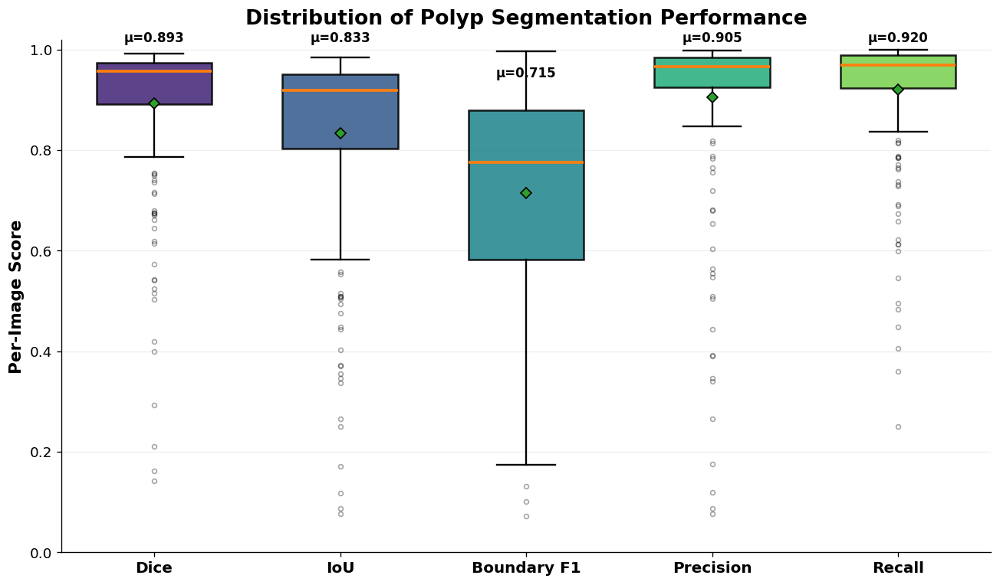

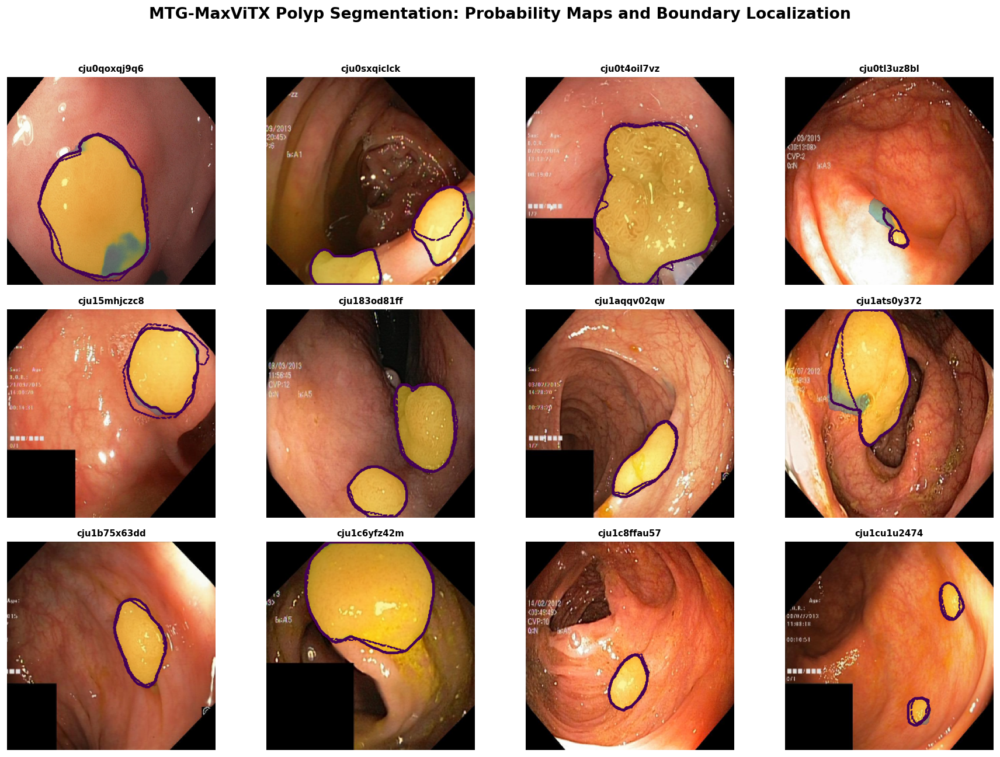

In [ ]:
# ============================================================
# IMPROVED SEGMENTATION VISUALIZATION
# Box Plot + Probability / Boundary Overlays
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

from pathlib import Path
from scipy.ndimage import binary_erosion


# ============================================================
# 19A — SEGMENTATION METRIC BOX PLOT
# ============================================================

metric_names = [
    "dice",
    "iou",
    "boundary_f1",
    "precision",
    "recall"
]

vals = [
    seg_metrics_df[
        m
    ].dropna().values
    for m in metric_names
]

labels = [
    "Dice",
    "IoU",
    "Boundary F1",
    "Precision",
    "Recall"
]


fig, ax = plt.subplots(
    figsize=(11, 6.5)
)

bp = ax.boxplot(
    vals,
    patch_artist=True,
    widths=0.62,
    showmeans=True,
    meanline=False,
    showfliers=True,
    medianprops={
        "linewidth": 2.2
    },
    meanprops={
        "marker": "D",
        "markersize": 6,
        "markeredgecolor": "black"
    },
    whiskerprops={
        "linewidth": 1.4
    },
    capprops={
        "linewidth": 1.4
    },
    boxprops={
        "linewidth": 1.5
    },
    flierprops={
        "marker": "o",
        "markersize": 3.5,
        "alpha": 0.35
    }
)

# Viridis-based fills
for i, box in enumerate(
    bp[
        "boxes"
    ]
):
    box.set_facecolor(
        mpl.colormaps[
            "viridis"
        ](
            0.12
            +
            0.17
            *
            i
        )
    )

    box.set_alpha(
        0.88
    )

    box.set_edgecolor(
        "black"
    )


ax.set_xticks(
    range(
        1,
        len(
            labels
        )
        +
        1
    )
)

ax.set_xticklabels(
    labels,
    fontsize=12,
    weight="bold"
)

ax.set_ylim(
    0,
    1.02
)

ax.set_ylabel(
    "Per-Image Score",
    fontsize=13,
    weight="bold"
)

ax.set_title(
    "Distribution of Polyp Segmentation Performance",
    fontsize=16,
    weight="bold",
    pad=12
)

ax.grid(
    axis="y",
    alpha=0.20
)

ax.spines[
    "top"
].set_visible(
    False
)

ax.spines[
    "right"
].set_visible(
    False
)

# ------------------------------------------------------------
# ADD MEAN VALUES ABOVE EACH BOX
# ------------------------------------------------------------

for i, values in enumerate(
    vals,
    start=1
):

    mean_value = np.mean(
        values
    )

    ax.text(
        i,
        min(
            1.01,
            np.percentile(
                values,
                75
            )
            +
            0.06
        ),
        f"μ={mean_value:.3f}",
        ha="center",
        va="bottom",
        fontsize=10,
        weight="bold"
    )


plt.tight_layout()

savefig(
    "19a_segmentation_boxplot"
)

plt.show()


# ============================================================
# 19B — IMPROVED POLYP PROBABILITY + BOUNDARY OVERLAYS
# ============================================================

mean = np.array(
    MEAN
)[
    :,
    None,
    None
]

std = np.array(
    STD
)[
    :,
    None,
    None
]


fig, axes = plt.subplots(
    3,
    4,
    figsize=(
        15,
        11
    )
)

for ax, (
    fn,
    xt,
    gt,
    prob,
    pred
) in zip(
    axes.ravel(),
    seg_examples
):

    # --------------------------------------------------------
    # DENORMALIZE IMAGE
    # --------------------------------------------------------

    img = (
        xt.numpy()
        *
        std
        +
        mean
    )

    img = np.clip(
        np.transpose(
            img,
            (
                1,
                2,
                0
            )
        ),
        0,
        1
    )

    ax.imshow(
        img
    )

    # --------------------------------------------------------
    # CLEAN PROBABILITY MAP
    # --------------------------------------------------------

    prob_masked = np.ma.masked_where(
        prob < 0.25,
        prob
    )

    ax.imshow(
        prob_masked,
        cmap="viridis",
        alpha=0.45,
        vmin=0,
        vmax=1
    )

    # --------------------------------------------------------
    # PREDICTED OUTER BOUNDARY
    # --------------------------------------------------------

    pred_bool = pred.astype(
        bool
    )

    edge = (
        pred_bool
        ^
        binary_erosion(
            pred_bool
        )
    )

    # Draw boundary directly
    ax.contour(
        edge.astype(
            float
        ),
        levels=[
            0.5
        ],
        linewidths=1.8
    )

    # --------------------------------------------------------
    # OPTIONAL GROUND-TRUTH BOUNDARY
    # Dashed contour for comparison
    # --------------------------------------------------------

    if gt is not None:

        gt_np = (
            gt.numpy()
            if hasattr(
                gt,
                "numpy"
            )
            else np.asarray(
                gt
            )
        )

        gt_np = np.squeeze(
            gt_np
        ).astype(
            bool
        )

        gt_edge = (
            gt_np
            ^
            binary_erosion(
                gt_np
            )
        )

        ax.contour(
            gt_edge.astype(
                float
            ),
            levels=[
                0.5
            ],
            linewidths=1.2,
            linestyles="--"
        )

    ax.set_title(
        Path(
            fn
        ).stem[
            :12
        ],
        fontsize=9,
        weight="bold"
    )

    ax.axis(
        "off"
    )


fig.suptitle(
    "MTG-MaxViTX Polyp Segmentation: Probability Maps and Boundary Localization",
    fontsize=16,
    weight="bold",
    y=0.98
)

plt.tight_layout(
    rect=[
        0,
        0,
        1,
        0.955
    ]
)

savefig(
    "19b_segmentation_probability_boundary_overlays"
)

plt.show()

## Stage 20 — Bootstrap Reliability Analysis

,metric,mean,ci_low,ci_high
0,Accuracy,0.908971,0.896649,0.921189
1,Macro F1,0.608771,0.579001,0.652166
2,MCC,0.901363,0.888225,0.914470
3,Seg. Dice,0.893726,0.872019,0.913561


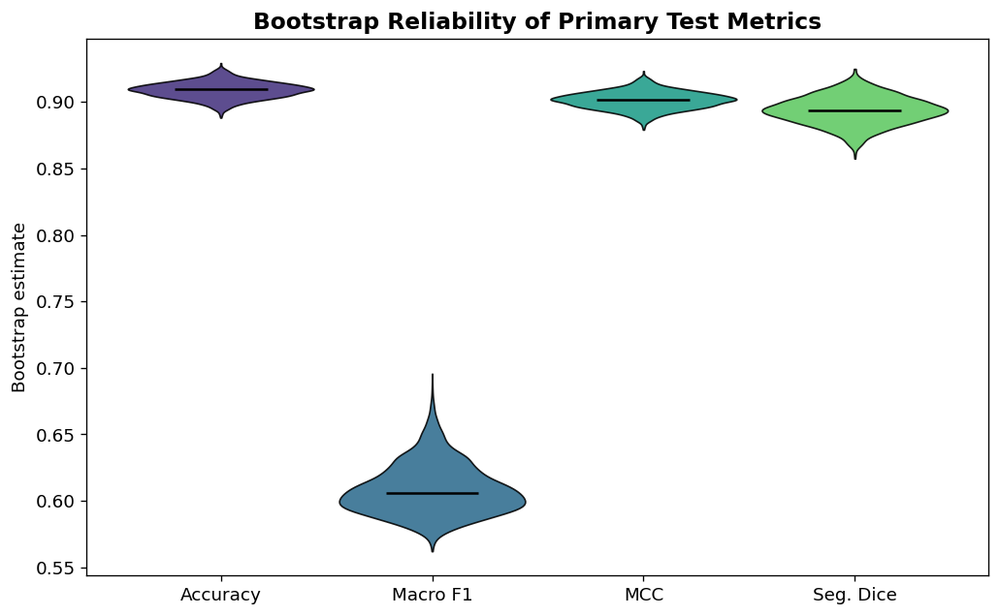

In [ ]:
def bootstrap_metric(y, pred, probs, metric_fn, n_boot=2000, seed=SEED):
    rng = np.random.default_rng(seed)
    vals = []
    n = len(y)
    for _ in range(n_boot):
        idx = rng.integers(0, n, n)
        try:
            vals.append(metric_fn(y[idx], pred[idx], probs[idx]))
        except Exception:
            pass
    vals = np.asarray(vals, dtype=float)
    return vals[np.isfinite(vals)]

boot = {
    "Accuracy": bootstrap_metric(y_test, p_test, prob_test, lambda y,p,z: accuracy_score(y,p)),
    "Macro F1": bootstrap_metric(y_test, p_test, prob_test, lambda y,p,z: f1_score(y,p,average="macro",zero_division=0)),
    "MCC": bootstrap_metric(y_test, p_test, prob_test, lambda y,p,z: matthews_corrcoef(y,p)),
}

rng = np.random.default_rng(SEED)
seg_boot = []
dice_values = seg_metrics_df["dice"].dropna().values
for _ in range(2000):
    seg_boot.append(rng.choice(dice_values, len(dice_values), replace=True).mean())
boot["Seg. Dice"] = np.asarray(seg_boot)

summary_rows = []
for k, v in boot.items():
    summary_rows.append({
        "metric": k, "mean": float(np.mean(v)),
        "ci_low": float(np.percentile(v, 2.5)),
        "ci_high": float(np.percentile(v, 97.5))
    })
boot_summary = pd.DataFrame(summary_rows)
boot_summary.to_csv(RESULTS / "bootstrap_95ci.csv", index=False)
display(boot_summary)

plt.figure(figsize=(10, 6))
vals = [boot[k] for k in boot]
parts = plt.violinplot(vals, showmedians=True, showextrema=False, widths=.88)
for i, body in enumerate(parts["bodies"]):
    body.set_facecolor(mpl.colormaps["viridis"](0.15 + 0.2*i))
    body.set_edgecolor("black")
    body.set_alpha(.88)
parts["cmedians"].set_color("black")
plt.xticks(range(1, len(boot)+1), list(boot.keys()))
plt.ylabel("Bootstrap estimate")
plt.title("Bootstrap Reliability of Primary Test Metrics", weight="bold")
savefig("20_bootstrap_reliability_violin")
plt.show()

## Stage 21 — Explainable AI: Classification Grad-CAM

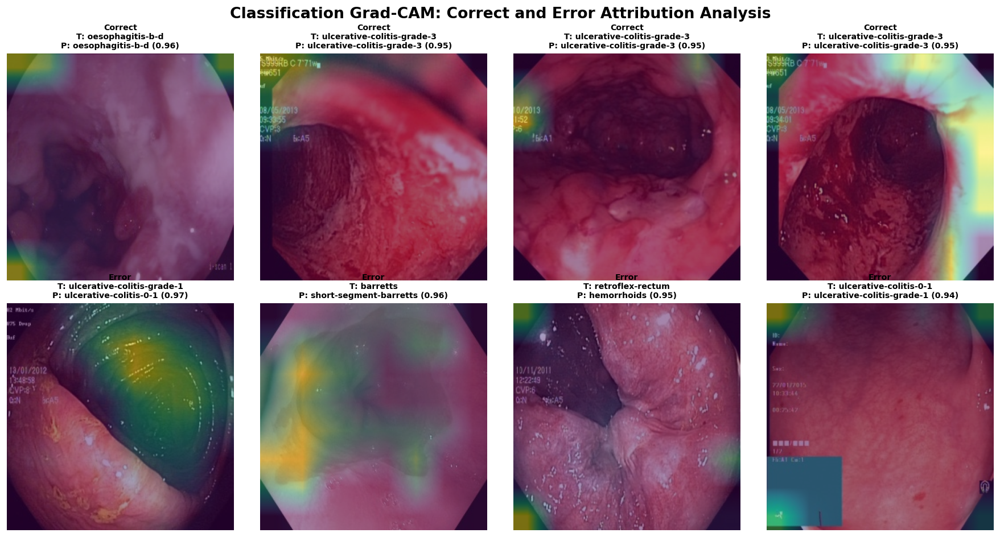

In [ ]:
# ============================================================
# STAGE 21 — ROBUST CLASSIFICATION GRAD-CAM
# ============================================================

def denormalize_tensor(x):
    mean = torch.tensor(
        MEAN,
        device=x.device,
        dtype=x.dtype
    ).view(3, 1, 1)

    std = torch.tensor(
        STD,
        device=x.device,
        dtype=x.dtype
    ).view(3, 1, 1)

    return (x * std + mean).clamp(0, 1)


@torch.no_grad()
def _xai_final_class_probability(x_batch):
    """
    Return probabilities from the final classification pipeline when
    available; otherwise use the refined base classifier.
    """

    if (
        "v6_classification_probabilities" in globals()
        and callable(globals()["v6_classification_probabilities"])
    ):
        return v6_classification_probabilities(x_batch)

    out = model(x_batch, task="cls")
    logits = out["cls"]

    if (
        "CLASSIFICATION_PRIOR_ALPHA" in globals()
        and "EVAL_LOG_PRIOR" in globals()
    ):
        logits = (
            logits
            - float(CLASSIFICATION_PRIOR_ALPHA)
            * EVAL_LOG_PRIOR.unsqueeze(0)
        )

    return torch.softmax(logits, dim=1)


def gradcam_classification(x, class_idx=None):
    """
    Grad-CAM for the final spatial MaxViT feature stage.

    The refinement phase freezes encoder parameters. Gradients are
    therefore enabled through the input tensor, and the gradient of
    the selected class score is obtained directly with autograd.
    """

    model.eval()

    # Final-pipeline prediction/confidence.
    x_pred = x.detach().to(DEVICE).unsqueeze(0)

    with torch.no_grad():
        final_prob = _xai_final_class_probability(x_pred)

    if class_idx is None:
        class_idx = int(final_prob.argmax(dim=1).item())
    else:
        class_idx = int(class_idx)

    confidence = float(final_prob[0, class_idx].item())

    # New graph with gradient-enabled input.
    x_grad = (
        x.detach()
        .clone()
        .to(DEVICE)
        .unsqueeze(0)
        .requires_grad_(True)
    )

    model.zero_grad(set_to_none=True)

    with torch.enable_grad():
        out = model(
            x_grad,
            task="cls",
            return_features=True
        )

        logits = out["cls"]
        feature_map = out["features"][-1]

        if not feature_map.requires_grad:
            raise RuntimeError(
                "The selected MaxViT feature map is detached from the "
                "classification computation graph."
            )

        target_score = logits[0, class_idx]

        grads = torch.autograd.grad(
            outputs=target_score,
            inputs=feature_map,
            retain_graph=False,
            create_graph=False,
            allow_unused=False
        )[0]

        weights = grads.mean(
            dim=(2, 3),
            keepdim=True
        )

        cam = F.relu(
            (weights * feature_map).sum(
                dim=1,
                keepdim=True
            )
        )

        cam = F.interpolate(
            cam,
            size=x_grad.shape[-2:],
            mode="bilinear",
            align_corners=False
        )[0, 0]

        cam = (
            (cam - cam.min())
            / (cam.max() - cam.min() + 1e-9)
        )

    return (
        cam.detach().cpu().numpy(),
        class_idx,
        confidence
    )


# ------------------------------------------------------------
# Q1-style qualitative panel:
# 4 high-confidence correct + 4 high-confidence errors.
# ------------------------------------------------------------

correct_rows = (
    pred_df.loc[pred_df["true"] == pred_df["pred"]]
    .sort_values("confidence", ascending=False)
    .head(4)
)

error_rows = (
    pred_df.loc[pred_df["true"] != pred_df["pred"]]
    .sort_values("confidence", ascending=False)
    .head(4)
)

xai_rows = pd.concat(
    [correct_rows, error_rows],
    ignore_index=True
)

if len(xai_rows) < 8:
    used = set(xai_rows["filename"].tolist())

    extra = (
        pred_df.loc[~pred_df["filename"].isin(used)]
        .sort_values("confidence", ascending=False)
        .head(8 - len(xai_rows))
    )

    xai_rows = pd.concat(
        [xai_rows, extra],
        ignore_index=True
    )


dataset_test = ClassificationDataset(
    cls_test_df,
    eval_tf
)

filename_to_idx = {
    r.filename: i
    for i, r in cls_test_df.reset_index(drop=True).iterrows()
}


fig, axes = plt.subplots(
    2,
    4,
    figsize=(15, 8)
)

for ax, r in zip(
    axes.ravel(),
    xai_rows.itertuples(index=False)
):
    idx = filename_to_idx[r.filename]
    x, y, fn = dataset_test[idx]

    # Explain the exact class reported by the final prediction table.
    cam, cls_idx, conf = gradcam_classification(
        x,
        class_idx=int(r.pred)
    )

    img = (
        denormalize_tensor(x)
        .permute(1, 2, 0)
        .cpu()
        .numpy()
    )

    ax.imshow(img)
    ax.imshow(
        cam,
        cmap="viridis",
        alpha=0.48,
        vmin=0,
        vmax=1
    )

    status = (
        "Correct"
        if int(y) == int(cls_idx)
        else "Error"
    )

    ax.set_title(
        (
            f"{status}\n"
            f"T: {HK_CLASSES[int(y)]}\n"
            f"P: {HK_CLASSES[int(cls_idx)]} ({conf:.2f})"
        ),
        fontsize=8.5,
        weight="bold"
    )

    ax.axis("off")


plt.suptitle(
    "Classification Grad-CAM: Correct and Error Attribution Analysis",
    fontsize=16,
    weight="bold"
)

plt.tight_layout()

savefig(
    "21_classification_gradcam"
)

plt.show()


mark_stage(
    "21_xai_classification_gradcam_fixed",
    {
        "samples": int(len(xai_rows)),
        "gradient_method": "input-enabled autograd",
        "final_classifier_aware": bool(
            "v6_classification_probabilities" in globals()
        ),
    }
)

## Stage 22 — Explainable AI: Segmentation Attribution

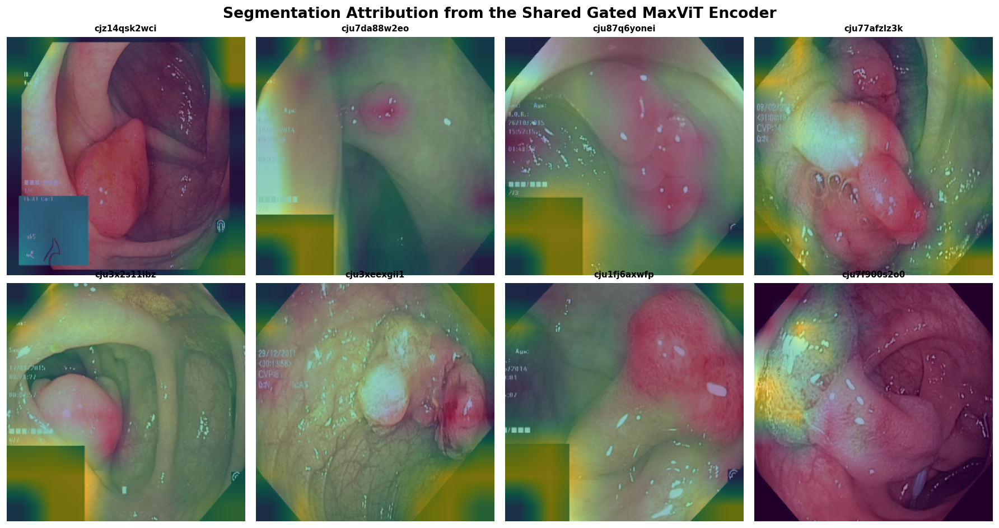

In [ ]:
# ============================================================
# STAGE 22 — ROBUST SEGMENTATION GRAD-CAM
# ============================================================

def gradcam_segmentation(x):
    """
    Spatial Grad-CAM for the segmentation branch after refinement.
    Works even when the shared encoder parameters are frozen.
    """

    model.eval()

    x_grad = (
        x.detach()
        .clone()
        .to(DEVICE)
        .unsqueeze(0)
        .requires_grad_(True)
    )

    model.zero_grad(set_to_none=True)

    with torch.enable_grad():
        out = model(
            x_grad,
            task="seg",
            return_features=True
        )

        logits = out["seg"]
        feature_map = out["features"][-1]

        if not feature_map.requires_grad:
            raise RuntimeError(
                "The selected MaxViT feature map is detached from the "
                "segmentation computation graph."
            )

        probability = torch.sigmoid(logits)

        threshold = float(
            globals().get(
                "SEGMENTATION_THRESHOLD",
                0.5
            )
        )

        roi = (
            probability > threshold
        ).float().detach()

        if float(roi.sum().item()) > 0:
            score = (
                (probability * roi).sum()
                / (roi.sum() + 1.0)
            )
        else:
            score = probability.mean()

        grads = torch.autograd.grad(
            outputs=score,
            inputs=feature_map,
            retain_graph=False,
            create_graph=False,
            allow_unused=False
        )[0]

        weights = grads.mean(
            dim=(2, 3),
            keepdim=True
        )

        cam = F.relu(
            (weights * feature_map).sum(
                dim=1,
                keepdim=True
            )
        )

        cam = F.interpolate(
            cam,
            size=x_grad.shape[-2:],
            mode="bilinear",
            align_corners=False
        )[0, 0]

        cam = (
            (cam - cam.min())
            / (cam.max() - cam.min() + 1e-9)
        )

    return (
        cam.detach().cpu().numpy(),
        probability[0, 0].detach().cpu().numpy()
    )


seg_ds = SegmentationDataset(
    seg_test_df,
    eval_tf
)

rng = np.random.default_rng(SEED)

ids = rng.choice(
    len(seg_ds),
    size=min(8, len(seg_ds)),
    replace=False
)


fig, axes = plt.subplots(
    2,
    4,
    figsize=(15, 8)
)

for ax, idx in zip(
    axes.ravel(),
    ids
):
    x, y, fn = seg_ds[int(idx)]

    cam, probability = gradcam_segmentation(x)

    img = (
        denormalize_tensor(x)
        .permute(1, 2, 0)
        .cpu()
        .numpy()
    )

    ax.imshow(img)
    ax.imshow(
        cam,
        cmap="viridis",
        alpha=0.50,
        vmin=0,
        vmax=1
    )

    ax.set_title(
        Path(fn).stem[:12],
        fontsize=9,
        weight="bold"
    )

    ax.axis("off")


plt.suptitle(
    "Segmentation Attribution from the Shared Gated MaxViT Encoder",
    fontsize=16,
    weight="bold"
)

plt.tight_layout()

savefig(
    "22_segmentation_attribution"
)

plt.show()


mark_stage(
    "22_xai_segmentation_gradcam_fixed",
    {
        "samples": int(len(ids)),
        "gradient_method": "input-enabled autograd",
    }
)

## Stage 23 — Feature Embedding and Representation Geometry

Caching embeddings:   0%|          | 0/133 [00:00<?, ?it/s]

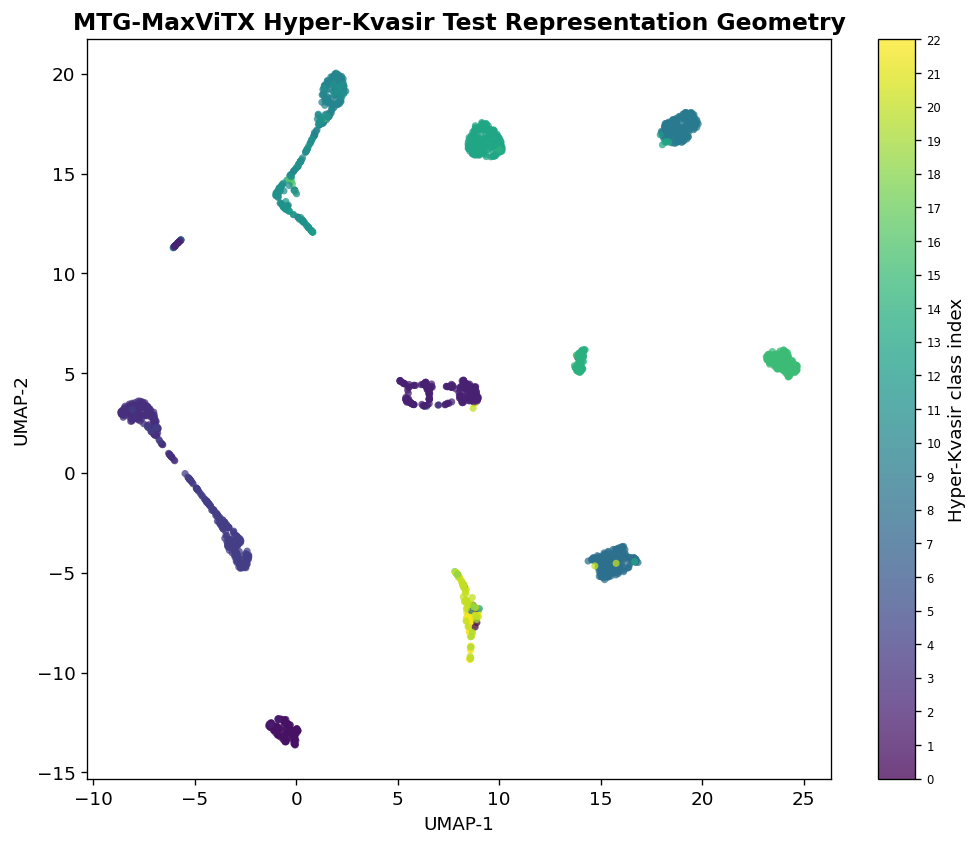

In [ ]:
embedding_cache = CACHE / f"primary_test_embeddings_{BEST_CKPT.stem}.npz"

if embedding_cache.exists():
    z = np.load(embedding_cache, allow_pickle=True)
    emb_features, emb_labels, emb_names = z["features"], z["labels"], z["names"]
else:
    feats, labs, names = [], [], []
    model.eval()
    with torch.no_grad():
        for x, y, fn in tqdm(cls_test_loader, desc="Caching embeddings"):
            x = x.to(DEVICE)
            out = model(x, task="cls", return_features=True)
            feats.append(out["pooled"].cpu().numpy())
            labs.extend(y.numpy())
            names.extend(fn)
    emb_features = np.concatenate(feats)
    emb_labels = np.asarray(labs)
    emb_names = np.asarray(names)
    np.savez_compressed(embedding_cache, features=emb_features, labels=emb_labels, names=emb_names)

reducer = umap.UMAP(
    n_neighbors=20, min_dist=0.15, metric="cosine",
    random_state=SEED, n_components=2
)
xy = reducer.fit_transform(emb_features)

plt.figure(figsize=(10, 8))
sc = plt.scatter(
    xy[:,0], xy[:,1], c=emb_labels, cmap="viridis",
    s=18, alpha=.75, linewidths=0
)
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.title("MTG-MaxViTX Hyper-Kvasir Test Representation Geometry", weight="bold")
cb = plt.colorbar(sc, ticks=np.arange(len(HK_CLASSES)))
cb.ax.set_yticklabels([str(i) for i in range(len(HK_CLASSES))], fontsize=7)
cb.set_label("Hyper-Kvasir class index")
savefig("23_primary_umap")
plt.show()

pd.DataFrame({"x":xy[:,0],"y":xy[:,1],"label":emb_labels,"filename":emb_names}).to_csv(
    RESULTS / "primary_test_umap.csv", index=False
)

## Stage 24 — GastroVision External Classification Validation

External runtime cache images: 1780
External runtime coverage: 100.000%


GastroVision external inference:   0%|          | 0/112 [00:00<?, ?it/s]

,value
accuracy,0.841573
balanced_accuracy,0.832774
macro_precision,0.869647
macro_recall,0.832774
macro_f1,0.848671
weighted_f1,0.864510
mcc,0.781849
ece,0.106537
brier_multiclass,0.263006
macro_auroc_ovr,0.972869


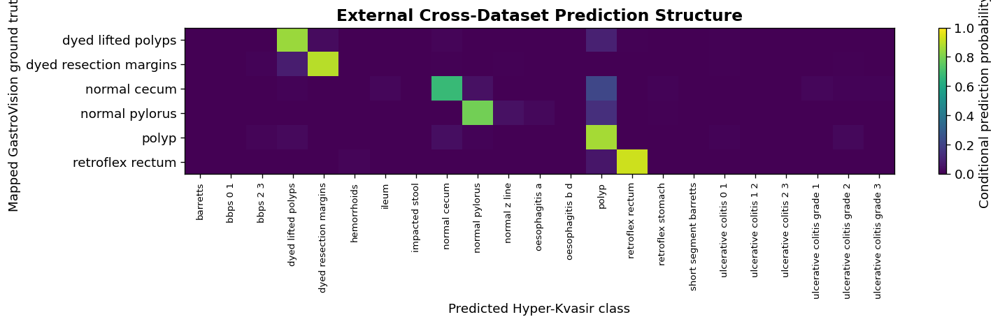

In [ ]:
print(
    "External runtime cache images:",
    len(
        gv_runtime_df
    )
)

print(
    "External runtime coverage:",
    f"{gv_runtime_coverage * 100:.3f}%"
)


y_ext, p_ext, prob_ext, fn_ext, lat_ext = (
    classification_predictions(
        external_loader,
        desc="GastroVision external inference"
    )
)


mapped_labels = sorted(
    gv_runtime_df.hk_label.unique().tolist()
)


ext_metrics = classification_metrics(
    y_ext,
    p_ext,
    prob_ext,
    labels=mapped_labels
)


ext_metrics[
    "latency_ms_per_image"
] = float(
    lat_ext.mean()
    *
    1000
)


ext_metrics[
    "mapped_classes"
] = len(
    mapped_labels
)


ext_metrics[
    "mapped_images"
] = len(
    y_ext
)


ext_metrics[
    "runtime_coverage"
] = float(
    gv_runtime_coverage
)


pd.DataFrame(
    [
        ext_metrics
    ]
).to_csv(
    RESULTS
    /
    "gastrovision_external_metrics.csv",
    index=False
)


ext_pred = pd.DataFrame(
    {
        "filename":
            fn_ext,

        "true":
            y_ext,

        "pred":
            p_ext,

        "true_class":
            [
                HK_CLASSES[
                    i
                ]
                for i
                in y_ext
            ],

        "pred_class":
            [
                HK_CLASSES[
                    i
                ]
                for i
                in p_ext
            ],

        "confidence":
            prob_ext.max(
                1
            ),

        "entropy":
            -(
                prob_ext
                *
                np.log(
                    prob_ext
                    +
                    1e-12
                )
            ).sum(
                1
            ),
    }
)


ext_pred.to_csv(
    RESULTS
    /
    "gastrovision_external_predictions.csv",
    index=False
)


display(
    pd.DataFrame(
        [
            ext_metrics
        ]
    ).T.rename(
        columns={
            0:
                "value"
        }
    )
)


labels = mapped_labels


ext_cm = confusion_matrix(
    y_ext,
    p_ext,
    labels=np.arange(
        len(
            HK_CLASSES
        )
    ),
    normalize="true"
)


rows = ext_cm[
    labels,
    :
]


plt.figure(
    figsize=(
        13,
        max(
            4,
            0.55
            *
            len(
                labels
            )
        )
    )
)


im = plt.imshow(
    rows,
    cmap="viridis",
    vmin=0,
    vmax=1,
    aspect="auto"
)


plt.yticks(
    range(
        len(
            labels
        )
    ),
    [
        HK_CLASSES[
            i
        ].replace(
            "-",
            " "
        )
        for i
        in labels
    ]
)


plt.xticks(
    range(
        len(
            HK_CLASSES
        )
    ),
    [
        c.replace(
            "-",
            " "
        )
        for c
        in HK_CLASSES
    ],
    rotation=90,
    fontsize=8
)


plt.xlabel(
    "Predicted Hyper-Kvasir class"
)


plt.ylabel(
    "Mapped GastroVision ground truth"
)


plt.title(
    "External Cross-Dataset Prediction Structure",
    weight="bold"
)


plt.colorbar(
    im,
    label="Conditional prediction probability"
)


plt.tight_layout()


savefig(
    "24_gastrovision_external_heatmap"
)


plt.show()


mark_stage(
    "24_external_validation_v5",
    {
        "mapped_images":
            int(
                len(
                    y_ext
                )
            ),

        "mapped_classes":
            int(
                len(
                    labels
                )
            ),

        "runtime_coverage":
            float(
                gv_runtime_coverage
            ),
    }
)

## Stage 25 — Cross-Dataset Confidence and Error Atlas

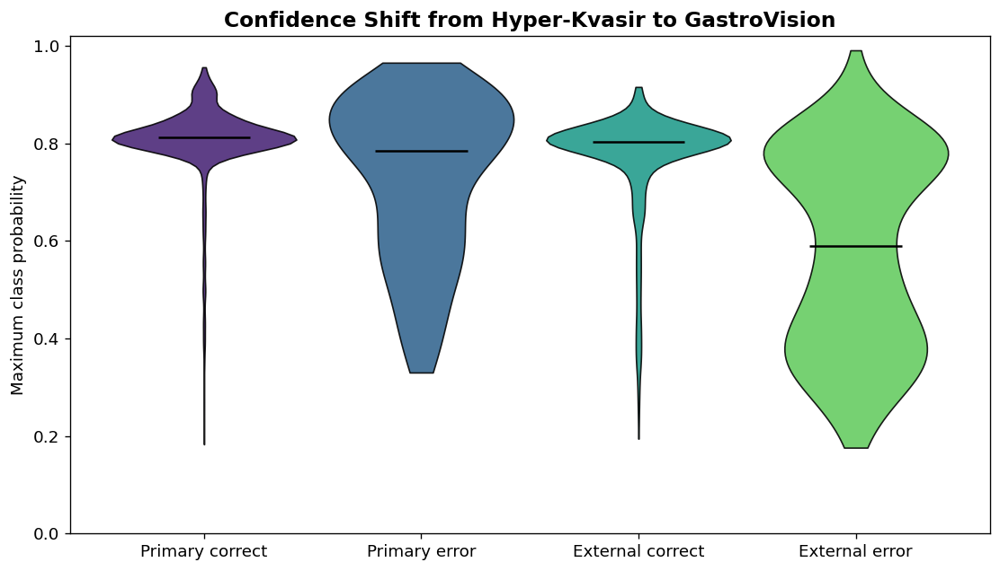

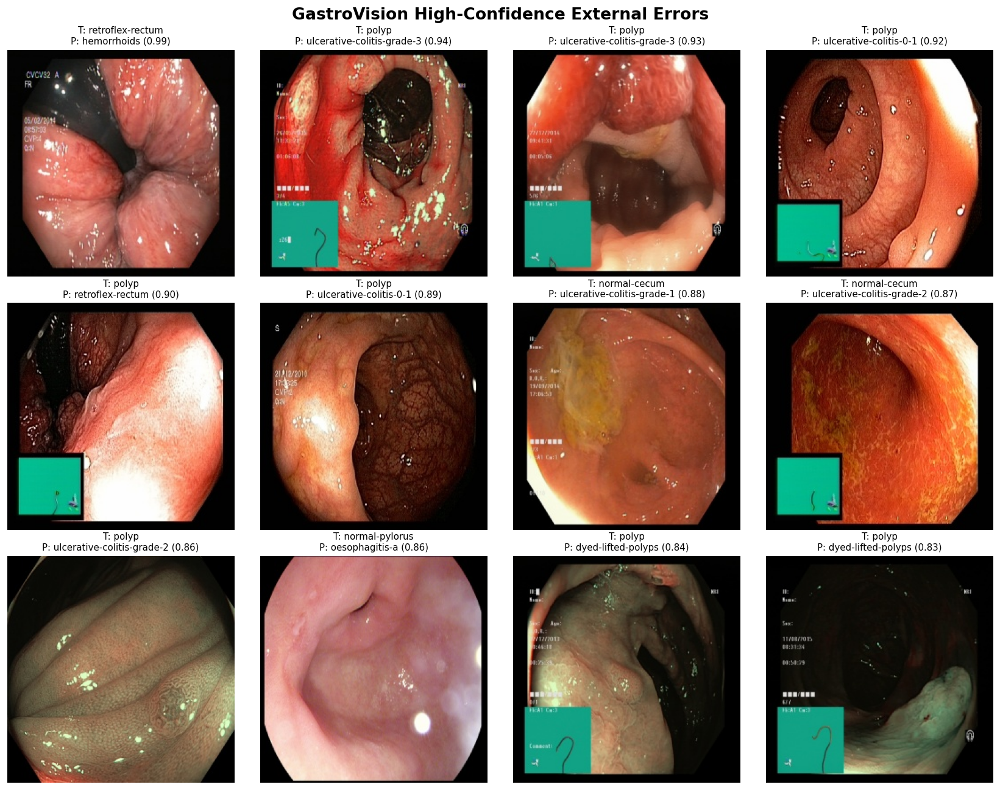

In [ ]:
# Matched confidence distributions using violin geometry.
primary_correct = pred_df.loc[pred_df.true == pred_df.pred, "confidence"].values
primary_wrong = pred_df.loc[pred_df.true != pred_df.pred, "confidence"].values
external_correct = ext_pred.loc[ext_pred.true == ext_pred.pred, "confidence"].values
external_wrong = ext_pred.loc[ext_pred.true != ext_pred.pred, "confidence"].values

groups = [primary_correct, primary_wrong, external_correct, external_wrong]
labels = ["Primary correct", "Primary error", "External correct", "External error"]

plt.figure(figsize=(11, 6))
parts = plt.violinplot(groups, showmedians=True, showextrema=False, widths=.85)
for i, body in enumerate(parts["bodies"]):
    body.set_facecolor(mpl.colormaps["viridis"](0.10 + 0.22*i))
    body.set_edgecolor("black")
    body.set_alpha(.88)
parts["cmedians"].set_color("black")
plt.xticks(range(1,5), labels)
plt.ylabel("Maximum class probability")
plt.ylim(0, 1.02)
plt.title("Confidence Shift from Hyper-Kvasir to GastroVision", weight="bold")
savefig("25a_cross_dataset_confidence")
plt.show()

# External high-confidence errors.
errors = ext_pred[ext_pred.true != ext_pred.pred].sort_values("confidence", ascending=False).head(12)
gv_lookup = gv_runtime_df.set_index("filename")["path"].to_dict()

fig, axes = plt.subplots(3, 4, figsize=(14, 11))
for ax, r in zip(axes.ravel(), errors.itertuples(index=False)):
    p = gv_lookup.get(r.filename)
    if p and Path(p).exists():
        img = Image.open(p).convert("RGB")
        ax.imshow(img)
    ax.set_title(f"T: {r.true_class}\nP: {r.pred_class} ({r.confidence:.2f})", fontsize=9)
    ax.axis("off")
plt.suptitle("GastroVision High-Confidence External Errors", fontsize=16, weight="bold")
plt.tight_layout()
savefig("25b_external_error_atlas")
plt.show()

## Stage 25B — Robustness and Stress Testing

The final model is evaluated under controlled brightness shift, blur, Gaussian noise, and resolution degradation. Classification uses paired McNemar tests against clean predictions; segmentation uses paired Wilcoxon tests on per-image Dice. These are inference-only experiments and do not retrain the model.


Classification robustness: clean


Cls robustness — clean:   0%|          | 0/133 [00:00<?, ?it/s]

Classification robustness: brightness+15%


Cls robustness — brightness+15%:   0%|          | 0/133 [00:00<?, ?it/s]

Classification robustness: brightness-15%


Cls robustness — brightness-15%:   0%|          | 0/133 [00:00<?, ?it/s]

Classification robustness: gaussian-noise


Cls robustness — gaussian-noise:   0%|          | 0/133 [00:00<?, ?it/s]

Classification robustness: blur-3x3


Cls robustness — blur-3x3:   0%|          | 0/133 [00:00<?, ?it/s]

Classification robustness: downsample-50%


Cls robustness — downsample-50%:   0%|          | 0/133 [00:00<?, ?it/s]

Segmentation robustness: clean


Seg robustness — clean:   0%|          | 0/26 [00:00<?, ?it/s]

Segmentation robustness: brightness+15%


Seg robustness — brightness+15%:   0%|          | 0/26 [00:00<?, ?it/s]

Segmentation robustness: brightness-15%


Seg robustness — brightness-15%:   0%|          | 0/26 [00:00<?, ?it/s]

Segmentation robustness: gaussian-noise


Seg robustness — gaussian-noise:   0%|          | 0/26 [00:00<?, ?it/s]

Segmentation robustness: blur-3x3


Seg robustness — blur-3x3:   0%|          | 0/26 [00:00<?, ?it/s]

Segmentation robustness: downsample-50%


Seg robustness — downsample-50%:   0%|          | 0/26 [00:00<?, ?it/s]

,condition,accuracy,macro_f1,mcc,ece,latency_ms,accuracy_drop,macro_f1_drop
0,clean,0.908919,0.601925,0.901308,0.144532,32.833122,0.000000,0.000000
1,brightness+15%,0.900897,0.598777,0.892570,0.133687,34.232562,0.008023,0.003148
2,brightness-15%,0.906560,0.591283,0.898763,0.139355,36.352344,0.002360,0.010642
3,gaussian-noise,0.901840,0.596581,0.893536,0.138724,35.398881,0.007079,0.005344
4,blur-3x3,0.898065,0.597072,0.889485,0.135394,36.293961,0.010854,0.004853
5,downsample-50%,0.896177,0.588819,0.887436,0.135741,36.706588,0.012742,0.013105


,condition,dice,iou,boundary_f1,hd95_px,dice_drop
0,clean,0.893260,0.833682,0.712160,20.394969,0.000000
1,brightness+15%,0.889245,0.828150,0.708800,21.526710,0.004016
2,brightness-15%,0.892252,0.831835,0.713505,20.691297,0.001009
3,gaussian-noise,0.883816,0.820452,0.693524,22.333714,0.009444
4,blur-3x3,0.883973,0.818565,0.689658,22.440784,0.009288
5,downsample-50%,0.880630,0.814348,0.684027,22.212507,0.012631


,task,condition,test,statistic,p_value
0,classification,brightness+15%,Exact McNemar,8.0,4.551384e-03
1,segmentation,brightness+15%,Paired Wilcoxon,11695.0,5.464499e-02
2,classification,brightness-15%,Exact McNemar,6.0,3.323059e-01
3,segmentation,brightness-15%,Paired Wilcoxon,10608.0,3.341209e-01
4,classification,gaussian-noise,Exact McNemar,13.0,2.753316e-02
5,segmentation,gaussian-noise,Paired Wilcoxon,13925.0,1.011101e-05
6,classification,blur-3x3,Exact McNemar,17.0,3.201544e-03
7,segmentation,blur-3x3,Paired Wilcoxon,13648.0,4.214131e-05
8,classification,downsample-50%,Exact McNemar,18.0,8.980472e-04
9,segmentation,downsample-50%,Paired Wilcoxon,14482.0,4.173238e-07


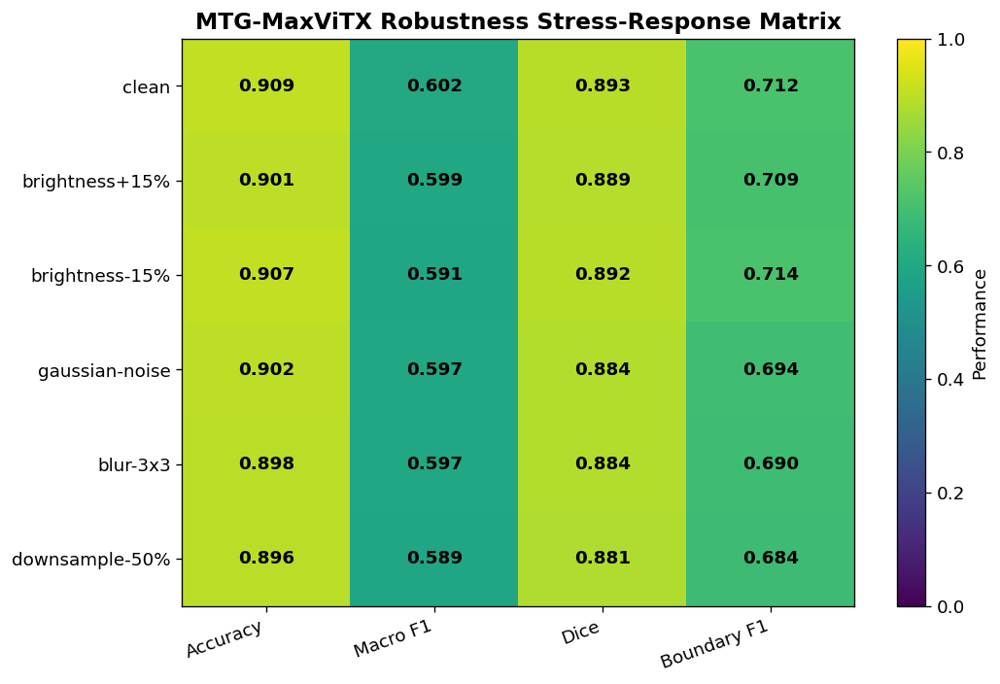

In [ ]:
# ============================================================
# STAGE 25B — ROBUSTNESS / STRESS TESTING
# ============================================================

from statsmodels.stats.contingency_tables import mcnemar
from scipy.stats import wilcoxon


_MEAN_T = torch.tensor(
    MEAN,
    dtype=torch.float32,
    device=DEVICE
).view(
    1,
    3,
    1,
    1
)


_STD_T = torch.tensor(
    STD,
    dtype=torch.float32,
    device=DEVICE
).view(
    1,
    3,
    1,
    1
)


def _to_image_space(
    x
):
    return (
        x
        *
        _STD_T
        +
        _MEAN_T
    ).clamp(
        0,
        1
    )


def _to_normalized_space(
    x
):
    return (
        x
        -
        _MEAN_T
    ) / _STD_T


def robustness_perturbation(
    mode
):
    def apply(
        x
    ):
        img = _to_image_space(
            x
        )

        if mode == "clean":

            out = img


        elif mode == "brightness+15%":

            out = (
                img
                *
                1.15
            ).clamp(
                0,
                1
            )


        elif mode == "brightness-15%":

            out = (
                img
                *
                0.85
            ).clamp(
                0,
                1
            )


        elif mode == "gaussian-noise":

            noise = torch.randn_like(
                img
            ) * 0.025

            out = (
                img
                +
                noise
            ).clamp(
                0,
                1
            )


        elif mode == "blur-3x3":

            out = F.avg_pool2d(
                img,
                kernel_size=3,
                stride=1,
                padding=1
            )


        elif mode == "downsample-50%":

            h, w = img.shape[
                -2:
            ]

            small = F.interpolate(
                img,
                size=(
                    max(
                        32,
                        h
                        //
                        2
                    ),
                    max(
                        32,
                        w
                        //
                        2
                    ),
                ),
                mode="bilinear",
                align_corners=False
            )

            out = F.interpolate(
                small,
                size=(
                    h,
                    w
                ),
                mode="bilinear",
                align_corners=False
            )


        else:

            raise ValueError(
                f"Unknown robustness mode: {mode}"
            )


        return _to_normalized_space(
            out
        )


    return apply


if RUN_ROBUSTNESS_SUITE:

    robustness_modes = [
        "clean",
        "brightness+15%",
        "brightness-15%",
        "gaussian-noise",
        "blur-3x3",
        "downsample-50%",
    ]


    cls_robust_rows = []

    cls_pred_by_mode = {}


    for mode in robustness_modes:

        print(
            "Classification robustness:",
            mode
        )


        perturb = (
            None
            if mode
            ==
            "clean"
            else robustness_perturbation(
                mode
            )
        )


        y_r, p_r, prob_r, fn_r, lat_r = (
            classification_predictions(
                cls_test_loader,
                perturb_fn=perturb,
                desc=f"Cls robustness — {mode}"
            )
        )


        cls_pred_by_mode[
            mode
        ] = (
            y_r,
            p_r
        )


        metrics_r = classification_metrics(
            y_r,
            p_r,
            prob_r
        )


        cls_robust_rows.append(
            {
                "condition":
                    mode,

                "accuracy":
                    float(
                        metrics_r[
                            "accuracy"
                        ]
                    ),

                "macro_f1":
                    float(
                        metrics_r[
                            "macro_f1"
                        ]
                    ),

                "mcc":
                    float(
                        metrics_r[
                            "mcc"
                        ]
                    ),

                "ece":
                    float(
                        metrics_r[
                            "ece"
                        ]
                    ),

                "latency_ms":
                    float(
                        lat_r.mean()
                        *
                        1000
                    ),
            }
        )


    cls_robust_df = pd.DataFrame(
        cls_robust_rows
    )


    clean_cls = cls_robust_df.loc[
        cls_robust_df[
            "condition"
        ].eq(
            "clean"
        )
    ].iloc[
        0
    ]


    cls_robust_df[
        "accuracy_drop"
    ] = (
        clean_cls[
            "accuracy"
        ]
        -
        cls_robust_df[
            "accuracy"
        ]
    )


    cls_robust_df[
        "macro_f1_drop"
    ] = (
        clean_cls[
            "macro_f1"
        ]
        -
        cls_robust_df[
            "macro_f1"
        ]
    )


    cls_robust_df.to_csv(
        RESULTS
        /
        "classification_robustness.csv",
        index=False
    )


    # --------------------------------------------------------
    # Segmentation robustness
    # --------------------------------------------------------

    seg_robust_rows = []

    seg_per_mode = {}


    for mode in robustness_modes:

        print(
            "Segmentation robustness:",
            mode
        )


        perturb = (
            None
            if mode
            ==
            "clean"
            else robustness_perturbation(
                mode
            )
        )


        seg_df_r, _ = segmentation_predictions(
            seg_test_loader,
            perturb_fn=perturb,
            desc=f"Seg robustness — {mode}"
        )


        seg_per_mode[
            mode
        ] = seg_df_r


        seg_robust_rows.append(
            {
                "condition":
                    mode,

                "dice":
                    float(
                        seg_df_r[
                            "dice"
                        ].mean()
                    ),

                "iou":
                    float(
                        seg_df_r[
                            "iou"
                        ].mean()
                    ),

                "boundary_f1":
                    float(
                        seg_df_r[
                            "boundary_f1"
                        ].mean()
                    ),

                "hd95_px":
                    float(
                        seg_df_r[
                            "hd95_px"
                        ].dropna().mean()
                    ),
            }
        )


    seg_robust_df = pd.DataFrame(
        seg_robust_rows
    )


    clean_seg = seg_robust_df.loc[
        seg_robust_df[
            "condition"
        ].eq(
            "clean"
        )
    ].iloc[
        0
    ]


    seg_robust_df[
        "dice_drop"
    ] = (
        clean_seg[
            "dice"
        ]
        -
        seg_robust_df[
            "dice"
        ]
    )


    seg_robust_df.to_csv(
        RESULTS
        /
        "segmentation_robustness.csv",
        index=False
    )


    # --------------------------------------------------------
    # Paired statistical robustness tests
    # --------------------------------------------------------

    stat_rows = []


    clean_y, clean_pred = cls_pred_by_mode[
        "clean"
    ]


    clean_correct = (
        clean_y
        ==
        clean_pred
    )


    clean_seg_per_image = seg_per_mode[
        "clean"
    ][
        [
            "filename",
            "dice"
        ]
    ].rename(
        columns={
            "dice":
                "dice_clean"
        }
    )


    for mode in robustness_modes[
        1:
    ]:

        y_r, p_r = cls_pred_by_mode[
            mode
        ]


        pert_correct = (
            y_r
            ==
            p_r
        )


        table = [
            [
                int(
                    np.sum(
                        clean_correct
                        &
                        pert_correct
                    )
                ),
                int(
                    np.sum(
                        clean_correct
                        &
                        ~pert_correct
                    )
                ),
            ],
            [
                int(
                    np.sum(
                        ~clean_correct
                        &
                        pert_correct
                    )
                ),
                int(
                    np.sum(
                        ~clean_correct
                        &
                        ~pert_correct
                    )
                ),
            ],
        ]


        mc = mcnemar(
            table,
            exact=True
        )


        stat_rows.append(
            {
                "task":
                    "classification",

                "condition":
                    mode,

                "test":
                    "Exact McNemar",

                "statistic":
                    float(
                        mc.statistic
                    ),

                "p_value":
                    float(
                        mc.pvalue
                    ),
            }
        )


        paired = clean_seg_per_image.merge(
            seg_per_mode[
                mode
            ][
                [
                    "filename",
                    "dice"
                ]
            ].rename(
                columns={
                    "dice":
                        "dice_perturbed"
                }
            ),
            on="filename",
            how="inner"
        )


        try:

            wt = wilcoxon(
                paired[
                    "dice_clean"
                ],
                paired[
                    "dice_perturbed"
                ],
                alternative="greater"
            )


            stat_rows.append(
                {
                    "task":
                        "segmentation",

                    "condition":
                        mode,

                    "test":
                        "Paired Wilcoxon",

                    "statistic":
                        float(
                            wt.statistic
                        ),

                    "p_value":
                        float(
                            wt.pvalue
                        ),
                }
            )


        except Exception:

            pass


    robustness_stats_df = pd.DataFrame(
        stat_rows
    )


    robustness_stats_df.to_csv(
        RESULTS
        /
        "robustness_statistical_tests.csv",
        index=False
    )


    display(
        cls_robust_df
    )


    display(
        seg_robust_df
    )


    display(
        robustness_stats_df
    )


    # --------------------------------------------------------
    # Publication visual: stress-response matrix
    # --------------------------------------------------------

    combined = cls_robust_df[
        [
            "condition",
            "accuracy",
            "macro_f1",
        ]
    ].merge(
        seg_robust_df[
            [
                "condition",
                "dice",
                "boundary_f1",
            ]
        ],
        on="condition"
    )


    matrix = combined[
        [
            "accuracy",
            "macro_f1",
            "dice",
            "boundary_f1",
        ]
    ].values


    plt.figure(
        figsize=(
            9,
            6
        )
    )


    im = plt.imshow(
        matrix,
        cmap="viridis",
        vmin=0,
        vmax=1,
        aspect="auto"
    )


    plt.yticks(
        range(
            len(
                combined
            )
        ),
        combined[
            "condition"
        ]
    )


    plt.xticks(
        range(
            4
        ),
        [
            "Accuracy",
            "Macro F1",
            "Dice",
            "Boundary F1",
        ],
        rotation=20,
        ha="right"
    )


    for i in range(
        matrix.shape[
            0
        ]
    ):

        for j in range(
            matrix.shape[
                1
            ]
        ):

            value = matrix[
                i,
                j
            ]


            plt.text(
                j,
                i,
                f"{value:.3f}",
                ha="center",
                va="center",
                weight="bold",
                color=(
                    "white"
                    if value
                    <
                    0.55
                    else "black"
                )
            )


    plt.title(
        "MTG-MaxViTX Robustness Stress-Response Matrix",
        weight="bold"
    )


    plt.colorbar(
        im,
        label="Performance"
    )


    plt.tight_layout()


    savefig(
        "25c_robustness_stress_matrix"
    )


    plt.show()


    mark_stage(
        "25b_robustness_suite_v5",
        {
            "conditions":
                robustness_modes,

            "classification_clean_accuracy":
                float(
                    clean_cls[
                        "accuracy"
                    ]
                ),

            "segmentation_clean_dice":
                float(
                    clean_seg[
                        "dice"
                    ]
                ),
        }
    )


else:

    print(
        "Robustness suite skipped: RUN_ROBUSTNESS_SUITE=False"
    )

## Stage 26 — External Representation Shift

External embeddings:   0%|          | 0/112 [00:00<?, ?it/s]

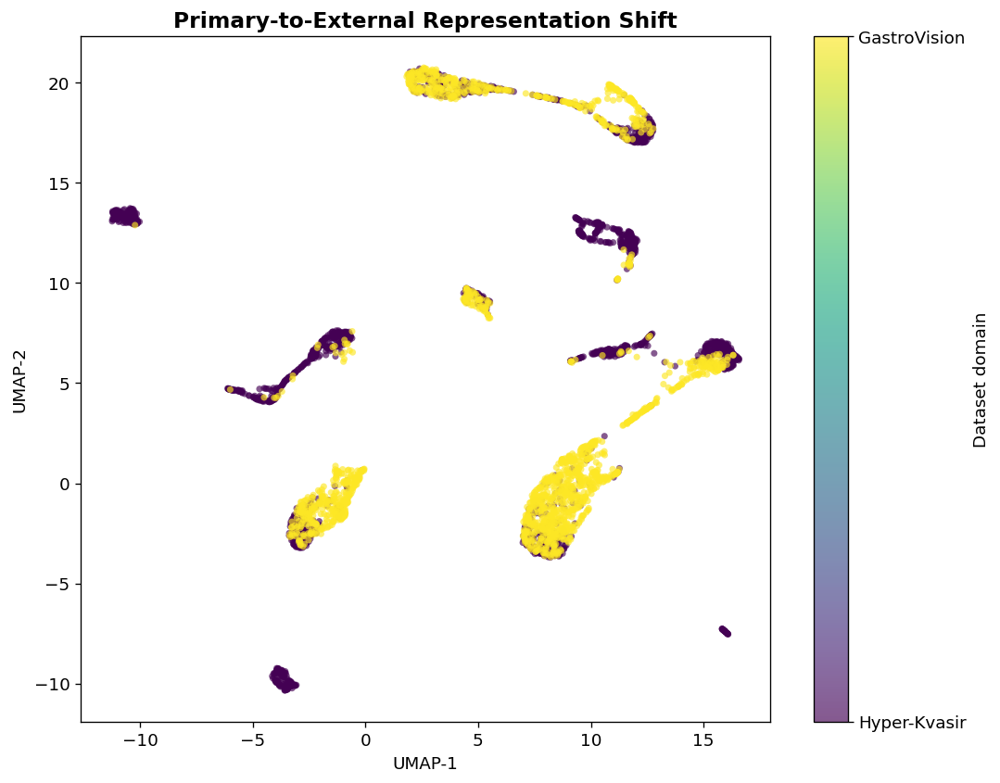

In [ ]:
ext_embedding_cache = CACHE / f"gastrovision_mapped_embeddings_{BEST_CKPT.stem}.npz"

if ext_embedding_cache.exists():
    z = np.load(ext_embedding_cache, allow_pickle=True)
    ext_features, ext_labels, ext_names = z["features"], z["labels"], z["names"]
else:
    feats, labs, names = [], [], []
    model.eval()
    with torch.no_grad():
        for x, y, fn in tqdm(external_loader, desc="External embeddings"):
            x = x.to(DEVICE)
            out = model(x, task="cls", return_features=True)
            feats.append(out["pooled"].cpu().numpy())
            labs.extend(y.numpy())
            names.extend(fn)
    ext_features = np.concatenate(feats)
    ext_labels = np.asarray(labs)
    ext_names = np.asarray(names)
    np.savez_compressed(ext_embedding_cache, features=ext_features, labels=ext_labels, names=ext_names)

# Fit one UMAP on the combined space for direct domain comparison.
combined = np.concatenate([emb_features, ext_features], axis=0)
domain = np.concatenate([np.zeros(len(emb_features)), np.ones(len(ext_features))]).astype(int)
labels_combined = np.concatenate([emb_labels, ext_labels])

reducer_joint = umap.UMAP(n_neighbors=25, min_dist=.18, metric="cosine", random_state=SEED)
joint_xy = reducer_joint.fit_transform(combined)

plt.figure(figsize=(10, 8))
sc = plt.scatter(
    joint_xy[:,0], joint_xy[:,1],
    c=domain, cmap="viridis", s=18, alpha=.65, linewidths=0
)
plt.xlabel("UMAP-1")
plt.ylabel("UMAP-2")
plt.title("Primary-to-External Representation Shift", weight="bold")
cb = plt.colorbar(sc, ticks=[0,1])
cb.ax.set_yticklabels(["Hyper-Kvasir", "GastroVision"])
cb.set_label("Dataset domain")
savefig("26_cross_dataset_umap")
plt.show()

## Stage 27 — Publication-Ready Summary Tables

In [ ]:
primary_table = pd.DataFrame([cls_metrics]).assign(dataset="Hyper-Kvasir primary test")
external_table = pd.DataFrame([ext_metrics]).assign(dataset="GastroVision external mapped")
classification_summary = pd.concat([primary_table, external_table], ignore_index=True)

classification_summary.to_csv(RESULTS / "classification_summary.csv", index=False)
seg_summary.reset_index(names="metric").to_csv(RESULTS / "segmentation_summary.csv", index=False)

per_class = []
for i, name in enumerate(HK_CLASSES):
    m = (y_test == i)
    if m.any():
        tp = ((p_test == i) & m).sum()
        recall = tp / m.sum()
        predicted_i = (p_test == i).sum()
        precision = tp / predicted_i if predicted_i else 0.0
        f1 = 2*precision*recall/(precision+recall+1e-12)
        per_class.append({"class":name, "support":int(m.sum()), "precision":precision, "recall":recall, "f1":f1})
per_class_df = pd.DataFrame(per_class)
per_class_df.to_csv(RESULTS / "primary_per_class_metrics.csv", index=False)

display(classification_summary)
display(seg_summary)
display(per_class_df)

,accuracy,balanced_accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,mcc,ece,brier_multiclass,macro_auroc_ovr,latency_ms_per_image,v6_w_base,v6_w_balanced,v6_w_prototype,v6_coarse_gamma,dataset,mapped_classes,mapped_images,runtime_coverage
0,0.908919,0.599672,0.617698,0.599672,0.601925,0.904122,0.901308,0.144532,0.175411,0.817044,36.515643,0.7,0.2,0.1,0.0,Hyper-Kvasir primary test,NaN,NaN,NaN
1,0.841573,0.832774,0.869647,0.832774,0.848671,0.864510,0.781849,0.106537,0.263006,0.972869,31.376917,NaN,NaN,NaN,NaN,GastroVision external mapped,6.0,1780.0,1.0


,mean,std,median
dice,0.893338,0.152778,0.957641
iou,0.833232,0.191948,0.918725
precision,0.904979,0.173815,0.965868
recall,0.920022,0.126371,0.968472
specificity,0.981260,0.046548,0.995700
boundary_f1,0.715280,0.205618,0.775123
hd95_px,20.660488,32.838552,6.000000


,class,support,precision,recall,f1
0,barretts,8,0.000000,0.000000,0.000000
1,bbps-0-1,129,0.976190,0.953488,0.964706
2,bbps-2-3,229,0.977679,0.956332,0.966887
3,dyed-lifted-polyps,200,0.964103,0.940000,0.951899
4,dyed-resection-margins,197,0.945274,0.964467,0.954774
5,hemorrhoids,1,0.000000,0.000000,0.000000
6,ileum,1,0.000000,0.000000,0.000000
7,impacted-stool,26,0.727273,0.923077,0.813559
8,normal-cecum,201,0.989950,0.980100,0.985000
9,normal-pylorus,199,0.980198,0.994975,0.987531


## Stage 28 — Model Complexity and Inference Profile

Profile checkpoint: /content/drive/MyDrive/MTG_MaxViTX/checkpoints/mtg_maxvitx_q1_refined_final.pt

Estimating FLOPs...

Benchmarking raw classification latency...
Benchmarking raw segmentation latency...
Benchmarking joint-task latency...

Benchmarking final V6 classification pipeline...

MTG-MaxViTX V6 COMPUTATIONAL PROFILE


,value
model,MTG-MaxViTX V6
parameters_m,32.562705
trainable_parameters_m,1.86253
core_checkpoint_mb,124.666274
v6_auxiliary_checkpoint_mb,0.0
total_inference_storage_mb,124.666274
profiler_estimated_gflops_cls,16.752872
profiler_estimated_gflops_seg,34.712694
profiler_estimated_gflops_both,34.712694
raw_cls_latency_ms,48.507044



Saved: /content/drive/MyDrive/MTG_MaxViTX/results/model_profile_final_v6.csv


,Metric,Value
0,Parameters,32.56 M
1,Model Storage,124.67 MB
2,Cls. GFLOPs,16.75
3,Seg. GFLOPs,34.71
4,Joint GFLOPs,34.71
5,Classification Latency,138.60 ms
6,Segmentation Latency,43.67 ms
7,Classification Throughput,7.2 img/s
8,Segmentation Throughput,22.9 img/s
9,Peak GPU Memory,1696.7 MB


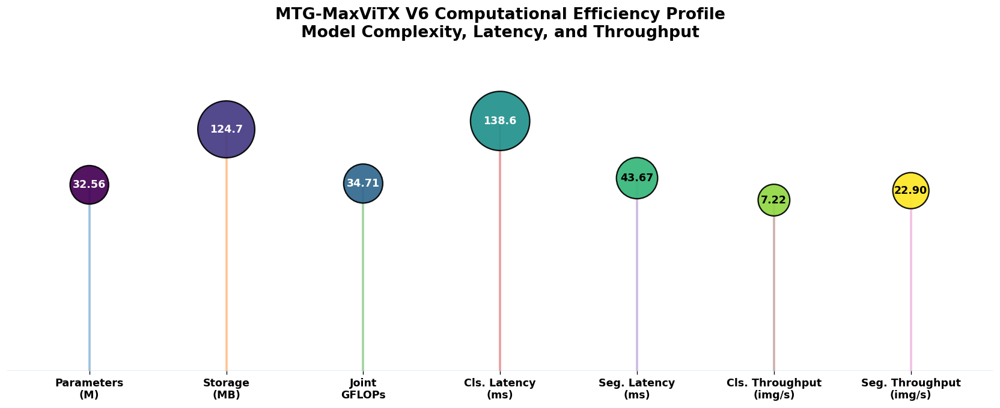


FINAL COMPUTATIONAL SUMMARY
Parameters                : 32.563 M
Core checkpoint           : 124.67 MB
Total V6 storage          : 124.67 MB
Classification GFLOPs     : 16.753
Segmentation GFLOPs       : 34.713
Joint GFLOPs              : 34.713
V6 classification latency : 138.60 ± 28.59 ms
Segmentation latency      : 43.67 ± 4.47 ms
Classification throughput : 7.22 images/s
Segmentation throughput   : 22.90 images/s
Peak GPU memory           : 1696.75 MB
Resolution                : 256 × 256
Precision                 : AMP/FP16


In [ ]:
# ============================================================
# STAGE 28 — FINAL COMPLEXITY, FLOPs, LATENCY, AND THROUGHPUT
# MTG-MaxViTX V6
# ============================================================

import gc
import time
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import matplotlib as mpl

from pathlib import Path


# ============================================================
# CONFIGURATION
# ============================================================

PROFILE_WARMUP = 20
PROFILE_REPEATS = 100
PROFILE_BATCH_SIZE = 1

# Mixed precision should reflect actual Colab inference.
PROFILE_USE_AMP = (
    DEVICE.type == "cuda"
)


# ============================================================
# 1. RESOLVE FINAL MODEL CHECKPOINT
# ============================================================

def resolve_profile_checkpoint():
    """
    Prefer the final Q1-refined model checkpoint.
    Fall back safely if unavailable.
    """

    candidates = [
        CHECKPOINTS
        /
        "mtg_maxvitx_q1_refined_final.pt",

        CHECKPOINTS
        /
        "mtg_maxvitx_selected_best.pt",

        CHECKPOINTS
        /
        "mtg_maxvitx_v3_best.pt",
    ]

    if "BEST_CKPT" in globals():

        candidates.append(
            Path(
                BEST_CKPT
            )
        )

    for path in candidates:

        path = Path(
            path
        )

        if path.exists():

            return path

    return None


PROFILE_CKPT = (
    resolve_profile_checkpoint()
)


print(
    "Profile checkpoint:",
    PROFILE_CKPT
)


# ============================================================
# 2. FILE SIZE
# ============================================================

def model_size_mb(
    path
):
    """
    Return file size in MB.
    """

    if path is None:

        return np.nan

    path = Path(
        path
    )

    if not path.exists():

        return np.nan

    return (
        path.stat().st_size
        /
        (
            1024
            **
            2
        )
    )


core_checkpoint_mb = (
    model_size_mb(
        PROFILE_CKPT
    )
)


# ------------------------------------------------------------
# Optional V6 balanced-head checkpoint
# ------------------------------------------------------------

balanced_head_candidates = [
    CHECKPOINTS
    /
    "balanced_embedding_head_best.pt",

    CHECKPOINTS
    /
    "balanced_embedding_head_last.pt",
]


balanced_head_checkpoint = None

for p in balanced_head_candidates:

    if Path(
        p
    ).exists():

        balanced_head_checkpoint = Path(
            p
        )

        break


balanced_head_mb = (
    model_size_mb(
        balanced_head_checkpoint
    )
    if balanced_head_checkpoint
    is not None
    else 0.0
)


total_v6_storage_mb = (
    core_checkpoint_mb
    +
    balanced_head_mb
    if np.isfinite(
        core_checkpoint_mb
    )
    else np.nan
)


# ============================================================
# 3. PARAMETER COUNTS
# ============================================================

total_params_count = sum(
    p.numel()
    for p
    in model.parameters()
)


trainable_params_count = sum(
    p.numel()
    for p
    in model.parameters()
    if p.requires_grad
)


total_params_m = (
    total_params_count
    /
    1e6
)


trainable_params_m = (
    trainable_params_count
    /
    1e6
)


# ============================================================
# 4. PROFILER-ESTIMATED FLOPs
# ============================================================

def estimate_flops_g(
    model_obj,
    task="both"
):
    """
    Estimate forward-pass FLOPs using torch.profiler.

    Important:
    PyTorch profiler may not count every custom/attention
    operation, so manuscript wording should be
    'profiler-estimated GFLOPs'.
    """

    model_obj.eval()

    dummy = torch.randn(
        PROFILE_BATCH_SIZE,
        3,
        IMG_SIZE,
        IMG_SIZE,
        device=DEVICE
    )

    activities = [
        torch.profiler.ProfilerActivity.CPU
    ]

    if DEVICE.type == "cuda":

        activities.append(
            torch.profiler.ProfilerActivity.CUDA
        )

    try:

        if DEVICE.type == "cuda":

            torch.cuda.empty_cache()

            torch.cuda.synchronize()

        with torch.inference_mode():

            with torch.profiler.profile(
                activities=activities,
                with_flops=True,
                record_shapes=False,
                profile_memory=False
            ) as prof:

                with torch.amp.autocast(
                    "cuda",
                    enabled=PROFILE_USE_AMP
                ):

                    _ = model_obj(
                        dummy,
                        task=task
                    )

        if DEVICE.type == "cuda":

            torch.cuda.synchronize()

        flops = sum(
            float(
                event.flops
                or
                0
            )
            for event
            in prof.key_averages()
        )

        return (
            flops
            /
            1e9
            /
            PROFILE_BATCH_SIZE
        )

    except Exception as e:

        print(
            f"FLOPs warning [{task}]:",
            e
        )

        return np.nan


print()
print(
    "Estimating FLOPs..."
)


gflops_cls = estimate_flops_g(
    model,
    task="cls"
)


gflops_seg = estimate_flops_g(
    model,
    task="seg"
)


gflops_both = estimate_flops_g(
    model,
    task="both"
)


# ============================================================
# 5. RAW MODEL LATENCY
# ============================================================

def benchmark_model_latency(
    model_obj,
    task,
    warmup=PROFILE_WARMUP,
    repeats=PROFILE_REPEATS
):
    """
    Benchmark batch-size-1 forward latency.

    Returns:
        mean_ms
        std_ms
        median_ms
        p95_ms
    """

    model_obj.eval()

    dummy = torch.randn(
        PROFILE_BATCH_SIZE,
        3,
        IMG_SIZE,
        IMG_SIZE,
        device=DEVICE
    )

    # --------------------------------------------------------
    # WARM-UP
    # --------------------------------------------------------

    with torch.inference_mode():

        for _ in range(
            warmup
        ):

            with torch.amp.autocast(
                "cuda",
                enabled=PROFILE_USE_AMP
            ):

                _ = model_obj(
                    dummy,
                    task=task
                )

    if DEVICE.type == "cuda":

        torch.cuda.synchronize()

    times_ms = []

    # --------------------------------------------------------
    # TIMED RUNS
    # --------------------------------------------------------

    with torch.inference_mode():

        for _ in range(
            repeats
        ):

            if DEVICE.type == "cuda":

                torch.cuda.synchronize()

            start = time.perf_counter()

            with torch.amp.autocast(
                "cuda",
                enabled=PROFILE_USE_AMP
            ):

                _ = model_obj(
                    dummy,
                    task=task
                )

            if DEVICE.type == "cuda":

                torch.cuda.synchronize()

            elapsed_ms = (
                time.perf_counter()
                -
                start
            ) * 1000

            times_ms.append(
                elapsed_ms
            )

    times_ms = np.asarray(
        times_ms,
        dtype=float
    )

    return {
        "mean":
            float(
                times_ms.mean()
            ),

        "std":
            float(
                times_ms.std()
            ),

        "median":
            float(
                np.median(
                    times_ms
                )
            ),

        "p95":
            float(
                np.percentile(
                    times_ms,
                    95
                )
            ),
    }


print()
print(
    "Benchmarking raw classification latency..."
)

raw_cls_latency = (
    benchmark_model_latency(
        model,
        task="cls"
    )
)


print(
    "Benchmarking raw segmentation latency..."
)

raw_seg_latency = (
    benchmark_model_latency(
        model,
        task="seg"
    )
)


print(
    "Benchmarking joint-task latency..."
)

raw_both_latency = (
    benchmark_model_latency(
        model,
        task="both"
    )
)


# ============================================================
# 6. FINAL V6 CLASSIFICATION LATENCY
# Includes balanced ensemble when available
# ============================================================

def benchmark_final_v6_classification(
    warmup=10,
    repeats=60
):
    """
    Benchmark final classification inference pipeline.

    Uses v6_classification_probabilities() when available.
    """

    dummy = torch.randn(
        1,
        3,
        IMG_SIZE,
        IMG_SIZE,
        device=DEVICE
    )

    if (
        "v6_classification_probabilities"
        not in globals()
        or
        not callable(
            globals()[
                "v6_classification_probabilities"
            ]
        )
    ):

        return raw_cls_latency

    # --------------------------------------------------------
    # WARM-UP
    # --------------------------------------------------------

    with torch.inference_mode():

        for _ in range(
            warmup
        ):

            _ = (
                v6_classification_probabilities(
                    dummy
                )
            )

    if DEVICE.type == "cuda":

        torch.cuda.synchronize()

    times_ms = []

    # --------------------------------------------------------
    # TIMED
    # --------------------------------------------------------

    with torch.inference_mode():

        for _ in range(
            repeats
        ):

            if DEVICE.type == "cuda":

                torch.cuda.synchronize()

            start = time.perf_counter()

            _ = (
                v6_classification_probabilities(
                    dummy
                )
            )

            if DEVICE.type == "cuda":

                torch.cuda.synchronize()

            times_ms.append(
                (
                    time.perf_counter()
                    -
                    start
                )
                *
                1000
            )

    arr = np.asarray(
        times_ms
    )

    return {
        "mean":
            float(
                arr.mean()
            ),

        "std":
            float(
                arr.std()
            ),

        "median":
            float(
                np.median(
                    arr
                )
            ),

        "p95":
            float(
                np.percentile(
                    arr,
                    95
                )
            ),
    }


print()
print(
    "Benchmarking final V6 classification pipeline..."
)


final_cls_latency = (
    benchmark_final_v6_classification()
)


# ============================================================
# 7. FINAL SEGMENTATION LATENCY
#
# First preference:
# already measured per-image segmentation latency.
#
# Fallback:
# direct raw segmentation benchmark.
# ============================================================

final_seg_latency_mean = np.nan
final_seg_latency_std = np.nan
final_seg_latency_median = np.nan


if (
    "seg_metrics_df"
    in globals()
    and
    isinstance(
        seg_metrics_df,
        pd.DataFrame
    )
    and
    "latency_ms"
    in seg_metrics_df.columns
):

    measured_latency = (
        pd.to_numeric(
            seg_metrics_df[
                "latency_ms"
            ],
            errors="coerce"
        )
        .replace(
            [
                np.inf,
                -np.inf
            ],
            np.nan
        )
        .dropna()
    )

    if len(
        measured_latency
    ) > 0:

        final_seg_latency_mean = float(
            measured_latency.mean()
        )

        final_seg_latency_std = float(
            measured_latency.std()
        )

        final_seg_latency_median = float(
            measured_latency.median()
        )


# ------------------------------------------------------------
# FALLBACK — direct benchmark
# ------------------------------------------------------------

if not np.isfinite(
    final_seg_latency_mean
):

    final_seg_latency_mean = (
        raw_seg_latency[
            "mean"
        ]
    )

    final_seg_latency_std = (
        raw_seg_latency[
            "std"
        ]
    )

    final_seg_latency_median = (
        raw_seg_latency[
            "median"
        ]
    )


# ============================================================
# 8. THROUGHPUT
# ============================================================

classification_fps = (
    1000.0
    /
    final_cls_latency[
        "mean"
    ]
    if final_cls_latency[
        "mean"
    ] > 0
    else np.nan
)


segmentation_fps = (
    1000.0
    /
    final_seg_latency_mean
    if final_seg_latency_mean > 0
    else np.nan
)


joint_fps = (
    1000.0
    /
    raw_both_latency[
        "mean"
    ]
    if raw_both_latency[
        "mean"
    ] > 0
    else np.nan
)


# ============================================================
# 9. GPU PEAK MEMORY
# ============================================================

def measure_peak_memory_mb(
    model_obj,
    task="both"
):
    """
    Peak allocated CUDA memory for one forward pass.
    """

    if DEVICE.type != "cuda":

        return np.nan

    try:

        gc.collect()

        torch.cuda.empty_cache()

        torch.cuda.reset_peak_memory_stats()

        dummy = torch.randn(
            1,
            3,
            IMG_SIZE,
            IMG_SIZE,
            device=DEVICE
        )

        with torch.inference_mode():

            with torch.amp.autocast(
                "cuda",
                enabled=True
            ):

                _ = model_obj(
                    dummy,
                    task=task
                )

        torch.cuda.synchronize()

        peak_mb = (
            torch.cuda.max_memory_allocated()
            /
            (
                1024
                **
                2
            )
        )

        return float(
            peak_mb
        )

    except Exception as e:

        print(
            "Peak memory warning:",
            e
        )

        return np.nan


peak_gpu_memory_mb = (
    measure_peak_memory_mb(
        model,
        task="both"
    )
)


# ============================================================
# 10. CREATE FINAL PROFILE TABLE
# ============================================================

profile_rows = [
    {
        "model":
            "MTG-MaxViTX V6",

        "parameters_m":
            total_params_m,

        "trainable_parameters_m":
            trainable_params_m,

        "core_checkpoint_mb":
            core_checkpoint_mb,

        "v6_auxiliary_checkpoint_mb":
            balanced_head_mb,

        "total_inference_storage_mb":
            total_v6_storage_mb,

        "profiler_estimated_gflops_cls":
            gflops_cls,

        "profiler_estimated_gflops_seg":
            gflops_seg,

        "profiler_estimated_gflops_both":
            gflops_both,

        "raw_cls_latency_ms":
            raw_cls_latency[
                "mean"
            ],

        "final_v6_cls_latency_ms":
            final_cls_latency[
                "mean"
            ],

        "final_v6_cls_latency_std_ms":
            final_cls_latency[
                "std"
            ],

        "final_v6_cls_latency_p95_ms":
            final_cls_latency[
                "p95"
            ],

        "segmentation_latency_ms":
            final_seg_latency_mean,

        "segmentation_latency_std_ms":
            final_seg_latency_std,

        "segmentation_latency_median_ms":
            final_seg_latency_median,

        "joint_latency_ms":
            raw_both_latency[
                "mean"
            ],

        "classification_fps":
            classification_fps,

        "segmentation_fps":
            segmentation_fps,

        "joint_fps":
            joint_fps,

        "peak_gpu_memory_mb":
            peak_gpu_memory_mb,

        "input_resolution":
            f"{IMG_SIZE}x{IMG_SIZE}",

        "batch_size":
            PROFILE_BATCH_SIZE,

        "precision":
            (
                "AMP/FP16"
                if PROFILE_USE_AMP
                else "FP32"
            ),
    }
]


profile_df = pd.DataFrame(
    profile_rows
)


# ============================================================
# 11. SAVE PROFILE
# ============================================================

profile_path = (
    RESULTS
    /
    "model_profile_final_v6.csv"
)


profile_df.to_csv(
    profile_path,
    index=False
)


print()
print(
    "=" * 78
)

print(
    "MTG-MaxViTX V6 COMPUTATIONAL PROFILE"
)

print(
    "=" * 78
)


display(
    profile_df.T.rename(
        columns={
            0:
                "value"
        }
    )
)


print()
print(
    "Saved:",
    profile_path
)


# ============================================================
# 12. PUBLICATION SUMMARY TABLE
# ============================================================

summary_df = pd.DataFrame(
    {
        "Metric": [
            "Parameters",
            "Model Storage",
            "Cls. GFLOPs",
            "Seg. GFLOPs",
            "Joint GFLOPs",
            "Classification Latency",
            "Segmentation Latency",
            "Classification Throughput",
            "Segmentation Throughput",
            "Peak GPU Memory",
        ],

        "Value": [
            f"{total_params_m:.2f} M",

            (
                f"{total_v6_storage_mb:.2f} MB"
                if np.isfinite(
                    total_v6_storage_mb
                )
                else "NA"
            ),

            (
                f"{gflops_cls:.2f}"
                if np.isfinite(
                    gflops_cls
                )
                else "NA"
            ),

            (
                f"{gflops_seg:.2f}"
                if np.isfinite(
                    gflops_seg
                )
                else "NA"
            ),

            (
                f"{gflops_both:.2f}"
                if np.isfinite(
                    gflops_both
                )
                else "NA"
            ),

            (
                f"{final_cls_latency['mean']:.2f} ms"
            ),

            (
                f"{final_seg_latency_mean:.2f} ms"
            ),

            (
                f"{classification_fps:.1f} img/s"
            ),

            (
                f"{segmentation_fps:.1f} img/s"
            ),

            (
                f"{peak_gpu_memory_mb:.1f} MB"
                if np.isfinite(
                    peak_gpu_memory_mb
                )
                else "NA"
            ),
        ]
    }
)


display(
    summary_df
)


summary_df.to_csv(
    RESULTS
    /
    "model_profile_publication_summary.csv",
    index=False
)


# ============================================================
# 13. IMPROVED COMPUTATIONAL FINGERPRINT
# Bubble-lollipop layout
# ============================================================

plot_metrics = [
    (
        "Parameters\n(M)",
        total_params_m
    ),

    (
        "Storage\n(MB)",
        total_v6_storage_mb
    ),

    (
        "Joint\nGFLOPs",
        gflops_both
    ),

    (
        "Cls. Latency\n(ms)",
        final_cls_latency[
            "mean"
        ]
    ),

    (
        "Seg. Latency\n(ms)",
        final_seg_latency_mean
    ),

    (
        "Cls. Throughput\n(img/s)",
        classification_fps
    ),

    (
        "Seg. Throughput\n(img/s)",
        segmentation_fps
    ),
]


plot_labels = [
    p[
        0
    ]
    for p in plot_metrics
]


plot_values = np.asarray(
    [
        p[
            1
        ]
        for p
        in plot_metrics
    ],
    dtype=float
)


finite = np.isfinite(
    plot_values
)


scaled = np.zeros_like(
    plot_values
)


if finite.any():

    valid = plot_values[
        finite
    ]

    valid_min = valid.min()

    valid_max = valid.max()

    scaled[
        finite
    ] = (
        valid
        -
        valid_min
    ) / (
        valid_max
        -
        valid_min
        +
        1e-9
    )


# ------------------------------------------------------------
# FIGURE
# ------------------------------------------------------------

fig, ax = plt.subplots(
    figsize=(
        14,
        5.8
    )
)


x = np.arange(
    len(
        plot_values
    )
)


# Vertical stems
for i in range(
    len(
        x
    )
):

    ax.plot(
        [
            x[
                i
            ],
            x[
                i
            ]
        ],
        [
            0,
            0.56
            +
            0.26
            *
            scaled[
                i
            ]
        ],
        linewidth=2.2,
        alpha=0.45
    )


bubble_y = (
    0.56
    +
    0.26
    *
    scaled
)


bubble_sizes = (
    1000
    +
    2500
    *
    scaled
)


bubble_colors = np.linspace(
    0.12,
    0.90,
    len(
        x
    )
)


ax.scatter(
    x,
    bubble_y,
    s=bubble_sizes,
    c=bubble_colors,
    cmap="viridis",
    edgecolors="black",
    linewidths=1.4,
    alpha=0.92,
    zorder=3
)


# ------------------------------------------------------------
# VALUE LABELS
# ------------------------------------------------------------

for i, value in enumerate(
    plot_values
):

    if np.isfinite(
        value
    ):

        if value >= 100:

            label = (
                f"{value:.1f}"
            )

        else:

            label = (
                f"{value:.2f}"
            )

    else:

        label = "NA"

    ax.text(
        x[
            i
        ],
        bubble_y[
            i
        ],
        label,
        ha="center",
        va="center",
        fontsize=10.5,
        weight="bold",
        color=(
            "white"
            if bubble_colors[
                i
            ] < 0.55
            else "black"
        ),
        zorder=4
    )


# ------------------------------------------------------------
# AXIS FORMATTING
# ------------------------------------------------------------

ax.set_xticks(
    x
)


ax.set_xticklabels(
    plot_labels,
    fontsize=10.5,
    weight="bold"
)


ax.set_yticks(
    []
)


ax.set_ylim(
    0,
    1.05
)


ax.set_xlim(
    -0.6,
    len(
        x
    )
    -
    0.4
)


ax.set_title(
    (
        "MTG-MaxViTX V6 Computational Efficiency Profile\n"
        "Model Complexity, Latency, and Throughput"
    ),
    fontsize=16,
    weight="bold",
    pad=14
)


for spine in ax.spines.values():

    spine.set_visible(
        False
    )


ax.axhline(
    0,
    linewidth=1,
    alpha=0.15
)


plt.tight_layout()


savefig(
    "28_model_complexity_final_v6"
)


plt.show()


# ============================================================
# 14. FINAL CONSOLE SUMMARY
# ============================================================

print()
print(
    "=" * 78
)

print(
    "FINAL COMPUTATIONAL SUMMARY"
)

print(
    "=" * 78
)

print(
    f"Parameters                : "
    f"{total_params_m:.3f} M"
)

print(
    f"Core checkpoint           : "
    f"{core_checkpoint_mb:.2f} MB"
)

print(
    f"Total V6 storage          : "
    f"{total_v6_storage_mb:.2f} MB"
)

print(
    f"Classification GFLOPs     : "
    f"{gflops_cls:.3f}"
)

print(
    f"Segmentation GFLOPs       : "
    f"{gflops_seg:.3f}"
)

print(
    f"Joint GFLOPs              : "
    f"{gflops_both:.3f}"
)

print(
    f"V6 classification latency : "
    f"{final_cls_latency['mean']:.2f} "
    f"± {final_cls_latency['std']:.2f} ms"
)

print(
    f"Segmentation latency      : "
    f"{final_seg_latency_mean:.2f} "
    f"± {final_seg_latency_std:.2f} ms"
)

print(
    f"Classification throughput : "
    f"{classification_fps:.2f} images/s"
)

print(
    f"Segmentation throughput   : "
    f"{segmentation_fps:.2f} images/s"
)

if np.isfinite(
    peak_gpu_memory_mb
):

    print(
        f"Peak GPU memory           : "
        f"{peak_gpu_memory_mb:.2f} MB"
    )

print(
    f"Resolution                : "
    f"{IMG_SIZE} × {IMG_SIZE}"
)

print(
    f"Precision                 : "
    f"{'AMP/FP16' if PROFILE_USE_AMP else 'FP32'}"
)


mark_stage(
    "28_final_complexity_profile",
    {
        "parameters_m":
            float(
                total_params_m
            ),

        "gflops_cls":
            float(
                gflops_cls
            )
            if np.isfinite(
                gflops_cls
            )
            else None,

        "gflops_seg":
            float(
                gflops_seg
            )
            if np.isfinite(
                gflops_seg
            )
            else None,

        "gflops_both":
            float(
                gflops_both
            )
            if np.isfinite(
                gflops_both
            )
            else None,

        "classification_latency_ms":
            float(
                final_cls_latency[
                    "mean"
                ]
            ),

        "segmentation_latency_ms":
            float(
                final_seg_latency_mean
            ),

        "classification_fps":
            float(
                classification_fps
            ),

        "segmentation_fps":
            float(
                segmentation_fps
            ),
    }
)

## Stage 29 — Checkpoint and Artifact Integrity

In [ ]:
artifacts = {
    "best_checkpoint": BEST_CKPT,
    "last_checkpoint": LAST_CKPT,
    "classification_metrics": RESULTS / "primary_classification_metrics.csv",
    "segmentation_metrics": RESULTS / "primary_segmentation_summary.csv",
    "external_metrics": RESULTS / "gastrovision_external_metrics.csv",
    "training_history": RESULTS / "training_history.csv",
}

def sha256(path, block=1024*1024):
    h = hashlib.sha256()
    with open(path, "rb") as f:
        while True:
            b = f.read(block)
            if not b:
                break
            h.update(b)
    return h.hexdigest()

integrity = []
for name, path in artifacts.items():
    path = Path(path)
    integrity.append({
        "artifact": name,
        "path": str(path),
        "exists": path.exists(),
        "size_mb": path.stat().st_size/(1024**2) if path.exists() else np.nan,
        "sha256": sha256(path) if path.exists() else None
    })

integrity_df = pd.DataFrame(integrity)
integrity_df.to_csv(RESULTS / "artifact_integrity.csv", index=False)
display(integrity_df)
mark_stage("29_integrity", {"complete": bool(integrity_df.exists.all())})

,artifact,path,exists,size_mb,sha256
0,best_checkpoint,/content/drive/MyDrive/MTG_MaxViTX/checkpoints...,True,124.666274,c3aeb4e9ab126cb8dd5eee99dc0092c0689efc349aa123...
1,last_checkpoint,/content/drive/MyDrive/MTG_MaxViTX/checkpoints...,True,371.553582,1cdd36ccc87f4892943c1944a1df319125f2f9bf2ec370...
2,classification_metrics,/content/drive/MyDrive/MTG_MaxViTX/results/pri...,True,0.000359,6d48a6c8f0653e3430f66eeb486113387b591ed299e905...
3,segmentation_metrics,/content/drive/MyDrive/MTG_MaxViTX/results/pri...,True,0.000513,35b625d808faea36d69087ef6ae1f68a95bd3a359e301e...
4,external_metrics,/content/drive/MyDrive/MTG_MaxViTX/results/gas...,True,0.000386,e0064d9636d3ee23a5ada7c8b43cef6845e2dc584141c4...
5,training_history,/content/drive/MyDrive/MTG_MaxViTX/results/tra...,True,0.002619,b6a15c0880ed169d955b2c21f58cdc08e3650e1c051203...


## Stage 30 — Final Result Dashboard

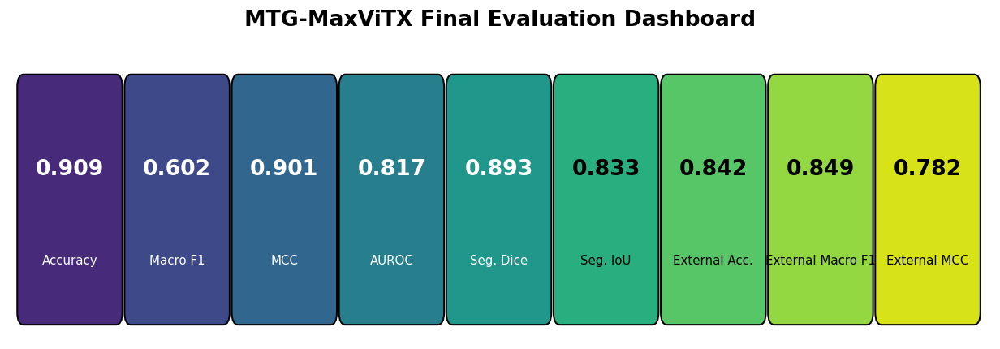

In [ ]:
cls_display = {
    "Accuracy": cls_metrics["accuracy"],
    "Macro F1": cls_metrics["macro_f1"],
    "MCC": cls_metrics["mcc"],
    "AUROC": cls_metrics.get("macro_auroc_ovr", np.nan),
    "Seg. Dice": seg_metrics_df["dice"].mean(),
    "Seg. IoU": seg_metrics_df["iou"].mean(),
}
ext_display = {
    "External Acc.": ext_metrics["accuracy"],
    "External Macro F1": ext_metrics["macro_f1"],
    "External MCC": ext_metrics["mcc"],
}

labels_dash = list(cls_display.keys()) + list(ext_display.keys())
values_dash = np.array(list(cls_display.values()) + list(ext_display.values()), dtype=float)

fig, ax = plt.subplots(figsize=(13, 4))
ax.axis("off")
cmap = mpl.colormaps["viridis"]
for i, (lab, val) in enumerate(zip(labels_dash, values_dash)):
    x = i
    color = cmap(0.12 + 0.82 * i / max(1, len(labels_dash)-1))
    box = mpl.patches.FancyBboxPatch(
        (x, 0), .92, 1.15, boxstyle="round,pad=.03,rounding_size=.06",
        facecolor=color, edgecolor="black", linewidth=1.2
    )
    ax.add_patch(box)
    ax.text(x+.46, .72, f"{val:.3f}" if np.isfinite(val) else "NA",
            ha="center", va="center", fontsize=16, weight="bold",
            color="white" if i < len(labels_dash)*.55 else "black")
    ax.text(x+.46, .28, lab, ha="center", va="center", fontsize=9,
            color="white" if i < len(labels_dash)*.55 else "black")
ax.set_xlim(-.1, len(labels_dash)+.05)
ax.set_ylim(-.1, 1.35)
ax.set_title("MTG-MaxViTX Final Evaluation Dashboard", fontsize=16, weight="bold", pad=10)
savefig("30_final_dashboard")
plt.show()

mark_stage("30_complete", {
    "primary_accuracy": float(cls_metrics["accuracy"]),
    "primary_macro_f1": float(cls_metrics["macro_f1"]),
    "segmentation_dice": float(seg_metrics_df["dice"].mean()),
    "external_accuracy": float(ext_metrics["accuracy"]),
})

In [ ]:
# ============================================================
# SINGLE-IMAGE CLASSIFICATION — VISUAL OUTPUT
# MTG-MaxViTX / V6 ensemble aware
# ============================================================

import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image


def robust_read_rgb(image_path):
    """
    Robust image reader for Colab / Google Drive / local paths.
    """

    image_path = Path(str(image_path))

    # Method 1: imdecode
    try:
        data = np.fromfile(
            str(image_path),
            dtype=np.uint8
        )

        img = cv2.imdecode(
            data,
            cv2.IMREAD_COLOR
        )

        if img is not None:
            return cv2.cvtColor(
                img,
                cv2.COLOR_BGR2RGB
            )

    except Exception:
        pass

    # Method 2: OpenCV
    try:
        img = cv2.imread(
            str(image_path),
            cv2.IMREAD_COLOR
        )

        if img is not None:
            return cv2.cvtColor(
                img,
                cv2.COLOR_BGR2RGB
            )

    except Exception:
        pass

    # Method 3: PIL
    try:
        return np.asarray(
            Image.open(
                image_path
            ).convert(
                "RGB"
            )
        )

    except Exception as e:
        raise RuntimeError(
            f"Unable to read image: {image_path}"
        ) from e


def prepare_single_image(image_rgb):
    """
    Apply the same validation/test preprocessing used by the notebook.
    Supports Albumentations-style eval_tf.
    """

    transformed = eval_tf(
        image=image_rgb
    )

    if isinstance(
        transformed,
        dict
    ):
        x = transformed[
            "image"
        ]
    else:
        x = transformed

    if isinstance(
        x,
        np.ndarray
    ):

        if x.ndim == 3 and x.shape[-1] == 3:
            x = torch.from_numpy(
                x.transpose(
                    2,
                    0,
                    1
                )
            )

        else:
            x = torch.from_numpy(
                x
            )

    x = x.float()

    return x


@torch.no_grad()
def predict_single_image_tensor(x):
    """
    Uses final V6 ensemble if available.
    Falls back to refined classifier otherwise.
    """

    model.eval()

    x = x.unsqueeze(
        0
    ).to(
        DEVICE
    )

    # --------------------------------------------------------
    # Final V6 classifier
    # --------------------------------------------------------
    if (
        "v6_classification_probabilities" in globals()
        and callable(
            globals()[
                "v6_classification_probabilities"
            ]
        )
    ):

        probs = v6_classification_probabilities(
            x
        )

        inference_name = (
            "MTG-MaxViTX V6 Balanced Ensemble"
        )

    # --------------------------------------------------------
    # Refined V5 classifier
    # --------------------------------------------------------
    elif (
        "classification_tta_logits_inference"
        in globals()
        and callable(
            globals()[
                "classification_tta_logits_inference"
            ]
        )
    ):

        logits = (
            classification_tta_logits_inference(
                x
            )
        )

        probs = torch.softmax(
            logits,
            dim=1
        )

        inference_name = (
            "MTG-MaxViTX Refined + TTA"
        )

    # --------------------------------------------------------
    # Basic model fallback
    # --------------------------------------------------------
    else:

        logits = model(
            x,
            task="cls"
        )[
            "cls"
        ]

        probs = torch.softmax(
            logits,
            dim=1
        )

        inference_name = (
            "MTG-MaxViTX"
        )

    return (
        probs[
            0
        ].detach().cpu().numpy(),
        inference_name
    )


def classify_image_visual(
    image_path,
    true_class=None,
    top_k=5,
    save_output=True
):
    """
    Classify one image and generate publication-style visual output.

    Parameters
    ----------
    image_path : str / Path
        Path of image to classify.

    true_class : str or None
        Optional known ground-truth class.

        Example:
            true_class="polyp"

    top_k : int
        Number of highest probability classes to display.

    save_output : bool
        Save 300-DPI PNG to FIGURES directory.
    """

    # ========================================================
    # READ
    # ========================================================

    image_rgb = robust_read_rgb(
        image_path
    )

    # ========================================================
    # PREPROCESS
    # ========================================================

    x = prepare_single_image(
        image_rgb
    )

    # ========================================================
    # INFERENCE
    # ========================================================

    probabilities, inference_name = (
        predict_single_image_tensor(
            x
        )
    )

    predicted_idx = int(
        np.argmax(
            probabilities
        )
    )

    predicted_class = HK_CLASSES[
        predicted_idx
    ]

    confidence = float(
        probabilities[
            predicted_idx
        ]
    )

    confidence_pct = (
        confidence
        *
        100
    )

    # ========================================================
    # TOP-K
    # ========================================================

    top_indices = np.argsort(
        probabilities
    )[
        ::-1
    ][
        :top_k
    ]

    top_classes = [
        HK_CLASSES[
            i
        ]
        for i
        in top_indices
    ]

    top_probs = (
        probabilities[
            top_indices
        ]
        *
        100
    )

    # ========================================================
    # OPTIONAL GROUND TRUTH
    # ========================================================

    correctness_text = None

    if true_class is not None:

        true_class = (
            str(
                true_class
            )
            .strip()
            .lower()
        )

        if true_class in HK_CLASSES:

            correct = (
                predicted_class
                ==
                true_class
            )

            correctness_text = (
                "CORRECT PREDICTION"
                if correct
                else "INCORRECT PREDICTION"
            )

        else:

            raise ValueError(
                f"Unknown true_class: {true_class}"
            )

    # ========================================================
    # VISUAL OUTPUT
    # ========================================================

    fig = plt.figure(
        figsize=(
            14,
            6.5
        )
    )

    gs = fig.add_gridspec(
        1,
        2,
        width_ratios=[
            1.08,
            1
        ]
    )

    # --------------------------------------------------------
    # IMAGE PANEL
    # --------------------------------------------------------

    ax_img = fig.add_subplot(
        gs[
            0,
            0
        ]
    )

    ax_img.imshow(
        image_rgb
    )

    ax_img.axis(
        "off"
    )

    ax_img.set_title(
        (
            f"Predicted: "
            f"{predicted_class.replace('-', ' ')}\n"
            f"Confidence: "
            f"{confidence_pct:.2f}%"
        ),
        fontsize=17,
        weight="bold",
        pad=14
    )

    if correctness_text is not None:

        ax_img.text(
            0.5,
            -0.06,
            (
                f"Ground Truth: "
                f"{true_class.replace('-', ' ')}  |  "
                f"{correctness_text}"
            ),
            transform=ax_img.transAxes,
            ha="center",
            va="top",
            fontsize=12,
            weight="bold"
        )

    # --------------------------------------------------------
    # TOP-K PROBABILITY PANEL
    # --------------------------------------------------------

    ax_prob = fig.add_subplot(
        gs[
            0,
            1
        ]
    )

    y_pos = np.arange(
        len(
            top_classes
        )
    )

    norm = plt.Normalize(
        0,
        max(
            100,
            top_probs.max()
        )
    )

    cmap = plt.cm.viridis

    colors = cmap(
        norm(
            top_probs
        )
    )

    # Lollipop probability chart
    for i, (
        y,
        probability,
        color
    ) in enumerate(
        zip(
            y_pos,
            top_probs,
            colors
        )
    ):

        ax_prob.plot(
            [
                0,
                probability
            ],
            [
                y,
                y
            ],
            linewidth=7,
            solid_capstyle="round",
            color=color,
            alpha=0.78
        )

        ax_prob.scatter(
            probability,
            y,
            s=240,
            color=color,
            edgecolor="black",
            linewidth=1.2,
            zorder=3
        )

        ax_prob.text(
            probability
            +
            1.5,
            y,
            f"{probability:.2f}%",
            va="center",
            fontsize=12,
            weight="bold"
        )

    ax_prob.set_yticks(
        y_pos
    )

    ax_prob.set_yticklabels(
        [
            c.replace(
                "-",
                " "
            )
            for c
            in top_classes
        ],
        fontsize=11,
        weight="bold"
    )

    ax_prob.invert_yaxis()

    ax_prob.set_xlim(
        0,
        min(
            108,
            max(
                100,
                top_probs.max()
                +
                10
            )
        )
    )

    ax_prob.set_xlabel(
        "Prediction Probability (%)",
        fontsize=12,
        weight="bold"
    )

    ax_prob.set_title(
        f"Top-{top_k} Class Probabilities",
        fontsize=15,
        weight="bold"
    )

    ax_prob.grid(
        axis="x",
        alpha=0.20
    )

    ax_prob.spines[
        "top"
    ].set_visible(
        False
    )

    ax_prob.spines[
        "right"
    ].set_visible(
        False
    )

    # ========================================================
    # MASTER TITLE
    # ========================================================

    fig.suptitle(
        (
            "MTG-MaxViTX Gastrointestinal Image Classification\n"
            f"{inference_name}"
        ),
        fontsize=19,
        weight="bold"
    )

    plt.tight_layout()

    # ========================================================
    # SAVE
    # ========================================================

    if save_output:

        output_name = (
            "single_image_classification_"
            +
            Path(
                image_path
            ).stem
            +
            ".png"
        )

        output_path = (
            FIGURES
            /
            output_name
        )

        plt.savefig(
            output_path,
            dpi=300,
            bbox_inches="tight"
        )

        print(
            "Saved visual:",
            output_path
        )

    plt.show()

    # ========================================================
    # TEXT RESULT
    # ========================================================

    print()
    print(
        "=" * 65
    )

    print(
        "MTG-MaxViTX SINGLE IMAGE CLASSIFICATION"
    )

    print(
        "=" * 65
    )

    print(
        "Image:",
        image_path
    )

    print(
        "Predicted class:",
        predicted_class
    )

    print(
        "Prediction confidence:",
        f"{confidence_pct:.2f}%"
    )

    if true_class is not None:

        print(
            "Ground truth:",
            true_class
        )

        print(
            "Result:",
            correctness_text
        )

    print()
    print(
        "Top predictions:"
    )

    for rank, (
        cls,
        probability
    ) in enumerate(
        zip(
            top_classes,
            top_probs
        ),
        start=1
    ):

        print(
            f"{rank}. "
            f"{cls:30s} "
            f"{probability:6.2f}%"
        )

    return {
        "predicted_class":
            predicted_class,

        "confidence":
            confidence,

        "confidence_percent":
            confidence_pct,

        "top_classes":
            top_classes,

        "top_probabilities_percent":
            top_probs,
    }

AUTO-SELECTED HYPER-KVASIR TEST SAMPLE
Filename: f03ada30b226_6a4b4551-c13d-432b-8403-5216b0e17488.jpg
Ground-truth class: bbps-2-3
Image path: /content/MTG_MaxViTX_classification_cache_256/f03ada30b226_6a4b4551-c13d-432b-8403-5216b0e17488.jpg

Saved visual: /content/drive/MyDrive/MTG_MaxViTX/figures/single_image_classification_f03ada30b226_6a4b4551-c13d-432b-8403-5216b0e17488.png


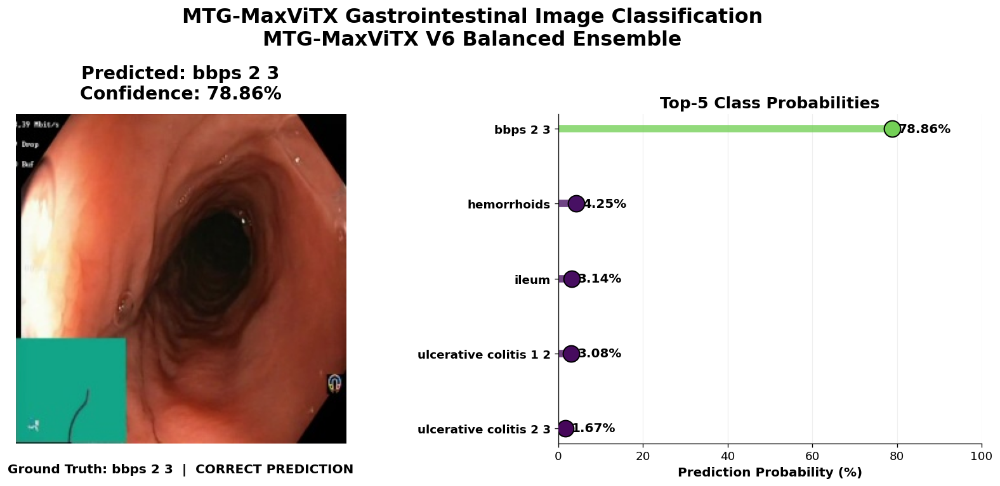


MTG-MaxViTX SINGLE IMAGE CLASSIFICATION
Image: /content/MTG_MaxViTX_classification_cache_256/f03ada30b226_6a4b4551-c13d-432b-8403-5216b0e17488.jpg
Predicted class: bbps-2-3
Prediction confidence: 78.86%
Ground truth: bbps-2-3
Result: CORRECT PREDICTION

Top predictions:
1. bbps-2-3                        78.86%
2. hemorrhoids                      4.25%
3. ileum                            3.14%
4. ulcerative-colitis-1-2           3.08%
5. ulcerative-colitis-2-3           1.67%

FINAL PREDICTION
Ground Truth : bbps-2-3
Prediction   : bbps-2-3
Confidence   : 78.86%
Status       : ✓ CORRECT


In [ ]:
# ============================================================
# AUTO-FETCH ONE TEST SAMPLE + CLASSIFY + VISUALIZE
# ============================================================

import numpy as np
from pathlib import Path

# ------------------------------------------------------------
# 1. Automatically select one random test image
# ------------------------------------------------------------

sample_row = (
    cls_test_df
    .sample(
        n=1,
        random_state=np.random.randint(
            0,
            100000
        )
    )
    .iloc[0]
)

sample_path = str(
    sample_row["path"]
)

true_label = int(
    sample_row["label"]
)

true_class = HK_CLASSES[
    true_label
]


# ------------------------------------------------------------
# 2. Show selected sample information
# ------------------------------------------------------------

print(
    "=" * 70
)

print(
    "AUTO-SELECTED HYPER-KVASIR TEST SAMPLE"
)

print(
    "=" * 70
)

print(
    "Filename:",
    Path(
        sample_path
    ).name
)

print(
    "Ground-truth class:",
    true_class
)

print(
    "Image path:",
    sample_path
)

print()


# ------------------------------------------------------------
# 3. Classify and produce publication-style visual
# ------------------------------------------------------------

result = classify_image_visual(
    image_path=sample_path,
    true_class=true_class,
    top_k=5,
    save_output=True
)


# ------------------------------------------------------------
# 4. Compact final result
# ------------------------------------------------------------

print()
print(
    "=" * 70
)

print(
    "FINAL PREDICTION"
)

print(
    "=" * 70
)

print(
    f"Ground Truth : {true_class}"
)

print(
    f"Prediction   : {result['predicted_class']}"
)

print(
    f"Confidence   : "
    f"{result['confidence_percent']:.2f}%"
)

print(
    "Status       :",
    (
        "✓ CORRECT"
        if result[
            "predicted_class"
        ]
        ==
        true_class
        else "✗ INCORRECT"
    )
)

In [ ]:
# ============================================================
# SINGLE IMAGE CLASSIFICATION + LESION HIGHLIGHTING
# MTG-MaxViTX V6
# ============================================================

import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path


# ============================================================
# GET POLYP SEGMENTATION MASK
# ============================================================

@torch.no_grad()
def get_polyp_lesion_mask(
    x,
    threshold=None
):
    """
    Predict polyp lesion mask using MTG-MaxViTX segmentation branch.
    """

    model.eval()

    x_batch = (
        x.unsqueeze(0)
        .to(DEVICE)
    )

    # Use tuned threshold if available
    if threshold is None:
        threshold = float(
            globals().get(
                "SEGMENTATION_THRESHOLD",
                0.5
            )
        )

    # --------------------------------------------------------
    # Prefer segmentation TTA from notebook
    # --------------------------------------------------------

    if (
        "segmentation_tta_probability_inference"
        in globals()
        and callable(
            globals()[
                "segmentation_tta_probability_inference"
            ]
        )
    ):
        prob = (
            segmentation_tta_probability_inference(
                x_batch
            )
            [0, 0]
            .cpu()
            .numpy()
        )

    else:
        out = model(
            x_batch,
            task="seg"
        )

        prob = (
            torch.sigmoid(
                out["seg"]
            )
            [0, 0]
            .cpu()
            .numpy()
        )

    mask = (
        prob
        >=
        threshold
    )

    # --------------------------------------------------------
    # Post-processing
    # --------------------------------------------------------

    if "postprocess_segmentation_mask" in globals():

        mask = postprocess_segmentation_mask(
            mask
        )

    else:

        mask = mask.astype(
            np.uint8
        )

        # Remove tiny regions
        num_labels, labels, stats, _ = (
            cv2.connectedComponentsWithStats(
                mask,
                connectivity=8
            )
        )

        clean = np.zeros_like(
            mask
        )

        min_area = int(
            0.002
            *
            mask.size
        )

        for i in range(
            1,
            num_labels
        ):
            if (
                stats[
                    i,
                    cv2.CC_STAT_AREA
                ]
                >=
                min_area
            ):
                clean[
                    labels == i
                ] = 1

        mask = clean.astype(
            bool
        )

    return (
        prob,
        mask.astype(bool)
    )


# ============================================================
# CREATE LESION OVERLAY
# ============================================================

def create_lesion_overlay(
    image_rgb,
    mask,
    alpha=0.38
):
    """
    Add transparent lesion highlight and contour.
    """

    image_rgb = image_rgb.copy()

    h, w = image_rgb.shape[:2]

    mask_resized = cv2.resize(
        mask.astype(
            np.uint8
        ),
        (
            w,
            h
        ),
        interpolation=cv2.INTER_NEAREST
    ).astype(bool)

    overlay = image_rgb.copy()

    # Yellow lesion highlight
    lesion_color = np.array(
        [
            255,
            215,
            0
        ],
        dtype=np.uint8
    )

    overlay[
        mask_resized
    ] = lesion_color

    blended = cv2.addWeighted(
        image_rgb,
        1.0 - alpha,
        overlay,
        alpha,
        0
    )

    # --------------------------------------------------------
    # Lesion boundary
    # --------------------------------------------------------

    contours, _ = cv2.findContours(
        mask_resized.astype(
            np.uint8
        ),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    cv2.drawContours(
        blended,
        contours,
        -1,
        (
            0,
            255,
            0
        ),
        3
    )

    return (
        blended,
        mask_resized
    )


# ============================================================
# CLASSIFICATION + LESION VISUALIZATION
# ============================================================

def classify_image_with_lesion_visual(
    image_path,
    true_class=None,
    top_k=5,
    save_output=True
):

    # ========================================================
    # LOAD IMAGE
    # ========================================================

    image_rgb = robust_read_rgb(
        image_path
    )

    x = prepare_single_image(
        image_rgb
    )

    # ========================================================
    # CLASSIFICATION
    # ========================================================

    probabilities, inference_name = (
        predict_single_image_tensor(
            x
        )
    )

    pred_idx = int(
        np.argmax(
            probabilities
        )
    )

    pred_class = HK_CLASSES[
        pred_idx
    ]

    confidence = float(
        probabilities[
            pred_idx
        ]
    )

    confidence_pct = (
        confidence
        *
        100
    )

    # ========================================================
    # TOP-K
    # ========================================================

    top_indices = np.argsort(
        probabilities
    )[::-1][
        :top_k
    ]

    top_classes = [
        HK_CLASSES[i]
        for i in top_indices
    ]

    top_probs = (
        probabilities[
            top_indices
        ]
        *
        100
    )

    # ========================================================
    # LESION LOCALIZATION
    # ========================================================

    lesion_available = (
        pred_class
        ==
        "polyp"
    )

    if lesion_available:

        seg_prob, lesion_mask = (
            get_polyp_lesion_mask(
                x
            )
        )

        lesion_overlay, lesion_mask_vis = (
            create_lesion_overlay(
                image_rgb,
                lesion_mask
            )
        )

        lesion_area_pct = (
            lesion_mask_vis.mean()
            *
            100
        )

    else:

        # For non-polyp classes use Grad-CAM as
        # discriminative-region visualization
        cam, _, _ = gradcam_classification(
            x,
            class_idx=pred_idx
        )

        cam_resized = cv2.resize(
            cam,
            (
                image_rgb.shape[1],
                image_rgb.shape[0]
            )
        )

        heatmap = plt.cm.viridis(
            cam_resized
        )[
            ...,
            :3
        ]

        heatmap = (
            heatmap
            *
            255
        ).astype(
            np.uint8
        )

        lesion_overlay = cv2.addWeighted(
            image_rgb,
            0.60,
            heatmap,
            0.40,
            0
        )

        lesion_area_pct = np.nan


    # ========================================================
    # CORRECTNESS
    # ========================================================

    status_text = None

    if true_class is not None:

        true_class = (
            str(
                true_class
            )
            .strip()
            .lower()
        )

        status_text = (
            "CORRECT PREDICTION"
            if pred_class
            ==
            true_class
            else "INCORRECT PREDICTION"
        )


    # ========================================================
    # FIGURE
    # ========================================================

    fig = plt.figure(
        figsize=(
            18,
            6.5
        )
    )

    gs = fig.add_gridspec(
        1,
        3,
        width_ratios=[
            1.0,
            1.0,
            1.15
        ]
    )


    # --------------------------------------------------------
    # PANEL 1 — ORIGINAL
    # --------------------------------------------------------

    ax1 = fig.add_subplot(
        gs[
            0,
            0
        ]
    )

    ax1.imshow(
        image_rgb
    )

    ax1.axis(
        "off"
    )

    ax1.set_title(
        (
            f"Predicted: "
            f"{pred_class.replace('-', ' ')}\n"
            f"Confidence: "
            f"{confidence_pct:.2f}%"
        ),
        fontsize=16,
        weight="bold"
    )


    if true_class is not None:

        ax1.text(
            0.5,
            -0.055,
            (
                f"Ground Truth: "
                f"{true_class.replace('-', ' ')}\n"
                f"{status_text}"
            ),
            transform=ax1.transAxes,
            ha="center",
            fontsize=11,
            weight="bold"
        )


    # --------------------------------------------------------
    # PANEL 2 — LESION HIGHLIGHT
    # --------------------------------------------------------

    ax2 = fig.add_subplot(
        gs[
            0,
            1
        ]
    )

    ax2.imshow(
        lesion_overlay
    )

    ax2.axis(
        "off"
    )


    if lesion_available:

        ax2.set_title(
            (
                "Predicted Polyp Lesion Region\n"
                f"Lesion Area: "
                f"{lesion_area_pct:.2f}% of image"
            ),
            fontsize=15,
            weight="bold"
        )

    else:

        ax2.set_title(
            "Classification Attention Region",
            fontsize=15,
            weight="bold"
        )


    # --------------------------------------------------------
    # PANEL 3 — PROBABILITIES
    # --------------------------------------------------------

    ax3 = fig.add_subplot(
        gs[
            0,
            2
        ]
    )

    y_pos = np.arange(
        len(
            top_classes
        )
    )

    norm = plt.Normalize(
        0,
        max(
            100,
            top_probs.max()
        )
    )

    colors = plt.cm.viridis(
        norm(
            top_probs
        )
    )


    for y_pos_i, probability, color in zip(
        y_pos,
        top_probs,
        colors
    ):

        ax3.plot(
            [
                0,
                probability
            ],
            [
                y_pos_i,
                y_pos_i
            ],
            linewidth=7,
            color=color,
            alpha=0.8,
            solid_capstyle="round"
        )

        ax3.scatter(
            probability,
            y_pos_i,
            s=230,
            color=color,
            edgecolor="black",
            linewidth=1.2,
            zorder=3
        )

        ax3.text(
            probability
            +
            1.2,
            y_pos_i,
            f"{probability:.2f}%",
            va="center",
            fontsize=11,
            weight="bold"
        )


    ax3.set_yticks(
        y_pos
    )

    ax3.set_yticklabels(
        [
            c.replace(
                "-",
                " "
            )
            for c
            in top_classes
        ],
        fontsize=10,
        weight="bold"
    )

    ax3.invert_yaxis()

    ax3.set_xlim(
        0,
        100
    )

    ax3.set_xlabel(
        "Prediction Probability (%)",
        fontsize=11,
        weight="bold"
    )

    ax3.set_title(
        f"Top-{top_k} Class Probabilities",
        fontsize=15,
        weight="bold"
    )

    ax3.grid(
        axis="x",
        alpha=0.18
    )

    ax3.spines[
        "top"
    ].set_visible(
        False
    )

    ax3.spines[
        "right"
    ].set_visible(
        False
    )


    # ========================================================
    # MASTER TITLE
    # ========================================================

    fig.suptitle(
        (
            "MTG-MaxViTX Gastrointestinal Image Analysis\n"
            "Classification and Lesion Localization"
        ),
        fontsize=20,
        weight="bold"
    )

    plt.tight_layout()


    # ========================================================
    # SAVE
    # ========================================================

    if save_output:

        output_path = (
            FIGURES
            /
            (
                "classification_lesion_"
                +
                Path(
                    image_path
                ).stem
                +
                ".png"
            )
        )

        plt.savefig(
            output_path,
            dpi=300,
            bbox_inches="tight"
        )

        print(
            "Saved:",
            output_path
        )


    plt.show()


    # ========================================================
    # OUTPUT
    # ========================================================

    print()
    print(
        "=" * 70
    )

    print(
        "MTG-MaxViTX CLASSIFICATION + LESION LOCALIZATION"
    )

    print(
        "=" * 70
    )

    print(
        "Prediction:",
        pred_class
    )

    print(
        "Confidence:",
        f"{confidence_pct:.2f}%"
    )


    if lesion_available:

        print(
            "Predicted lesion area:",
            f"{lesion_area_pct:.2f}%"
        )

        print(
            "Lesion localization:",
            "Segmentation branch"
        )

    else:

        print(
            "Region visualization:",
            "Grad-CAM attention"
        )


    if true_class is not None:

        print(
            "Ground truth:",
            true_class
        )

        print(
            "Status:",
            status_text
        )


    return {
        "predicted_class":
            pred_class,

        "confidence_percent":
            confidence_pct,

        "lesion_mask":
            (
                lesion_mask
                if lesion_available
                else None
            ),

        "lesion_area_percent":
            lesion_area_pct,
    }

Saved: /content/drive/MyDrive/MTG_MaxViTX/figures/classification_lesion_f03ada30b226_6a4b4551-c13d-432b-8403-5216b0e17488.png


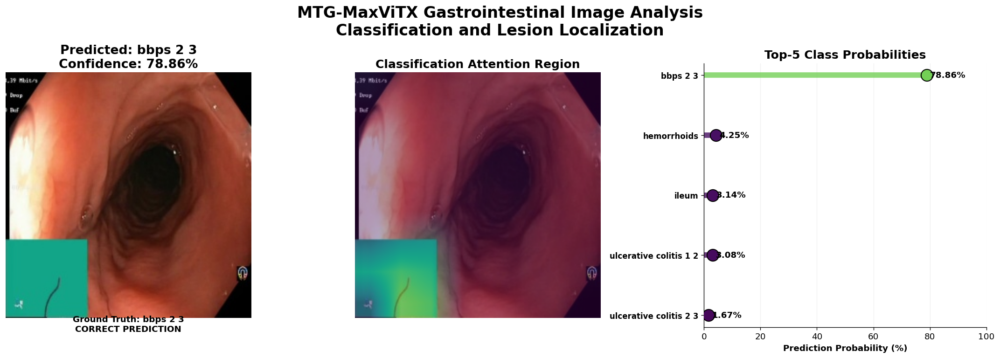


MTG-MaxViTX CLASSIFICATION + LESION LOCALIZATION
Prediction: bbps-2-3
Confidence: 78.86%
Region visualization: Grad-CAM attention
Ground truth: bbps-2-3
Status: CORRECT PREDICTION


In [ ]:
result = classify_image_with_lesion_visual(
    image_path=sample_path,
    true_class=true_class,
    top_k=5,
    save_output=True
)

In [ ]:
# ============================================================
# 8 TEST IMAGES — IMPROVED 4×4 VISUAL GRID
# Original + Polyp Segmentation / Multi-Scale Grad-CAM
# MTG-MaxViTX V6
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path


def display_8_images_4x4(
    random_state=42,
    save_output=True,
    ensure_polyp_samples=2
):
    """
    Display 8 Hyper-Kvasir test images in a 4×4 grid.

    Layout:
        Original 1 | Localization 1 | Original 2 | Localization 2
        Original 3 | Localization 3 | Original 4 | Localization 4
        Original 5 | Localization 5 | Original 6 | Localization 6
        Original 7 | Localization 7 | Original 8 | Localization 8

    Localization:
        Predicted polyp
            -> segmentation-derived lesion region.

        Other predicted classes
            -> improved multi-scale Grad-CAM attention.

    Parameters
    ----------
    random_state : int
        Reproducible sample selection.

    save_output : bool
        Save figure at 300 DPI.

    ensure_polyp_samples : int
        Number of polyp ground-truth samples to include when possible.
        Default = 2.
    """

    # ========================================================
    # REQUIRE IMPROVED XAI FUNCTIONS
    # ========================================================

    required_functions = [
        "improved_gradcam_classification",
        "show_improved_gradcam_overlay",
        "get_polyp_lesion_mask",
        "create_lesion_overlay",
    ]

    missing = [
        name
        for name in required_functions
        if name not in globals()
    ]

    if missing:
        raise RuntimeError(
            "Run the improved Grad-CAM / lesion-localization "
            f"helper cell first. Missing: {missing}"
        )

    # ========================================================
    # SELECT 8 TEST SAMPLES
    # Include some polyps intentionally for localization figure
    # ========================================================

    rng = np.random.default_rng(
        random_state
    )

    n_total = min(
        8,
        len(cls_test_df)
    )

    polyp_df = (
        cls_test_df[
            cls_test_df["label"]
            ==
            POLYP_LABEL
        ]
        .copy()
    )

    non_polyp_df = (
        cls_test_df[
            cls_test_df["label"]
            !=
            POLYP_LABEL
        ]
        .copy()
    )

    n_polyp = min(
        ensure_polyp_samples,
        len(polyp_df),
        n_total
    )

    n_other = (
        n_total
        -
        n_polyp
    )

    selected_parts = []

    if n_polyp > 0:
        selected_parts.append(
            polyp_df.sample(
                n=n_polyp,
                random_state=random_state
            )
        )

    if n_other > 0:
        selected_parts.append(
            non_polyp_df.sample(
                n=n_other,
                random_state=(
                    random_state
                    +
                    101
                )
            )
        )

    samples = (
        pd.concat(
            selected_parts,
            axis=0
        )
        .sample(
            frac=1.0,
            random_state=(
                random_state
                +
                202
            )
        )
        .reset_index(
            drop=True
        )
    )

    # ========================================================
    # FIGURE
    # ========================================================

    fig, axes = plt.subplots(
        4,
        4,
        figsize=(
            17,
            17
        )
    )

    axes = axes.ravel()

    result_rows = []

    panel = 0

    # ========================================================
    # PROCESS SAMPLES
    # ========================================================

    for sample_no, row in samples.iterrows():

        image_path = str(
            row["path"]
        )

        true_idx = int(
            row["label"]
        )

        true_class = HK_CLASSES[
            true_idx
        ]

        # ====================================================
        # READ + PREPARE IMAGE
        # ====================================================

        image_rgb = robust_read_rgb(
            image_path
        )

        x = prepare_single_image(
            image_rgb
        )

        # ====================================================
        # FINAL V6 CLASSIFICATION
        # ====================================================

        probabilities, inference_name = (
            predict_single_image_tensor(
                x
            )
        )

        pred_idx = int(
            np.argmax(
                probabilities
            )
        )

        pred_class = HK_CLASSES[
            pred_idx
        ]

        confidence = float(
            probabilities[
                pred_idx
            ]
            *
            100
        )

        correct = (
            pred_idx
            ==
            true_idx
        )

        status = (
            "CORRECT"
            if correct
            else "ERROR"
        )

        # ====================================================
        # PANEL A — ORIGINAL IMAGE
        # ====================================================

        ax_original = axes[
            panel
        ]

        ax_original.imshow(
            image_rgb
        )

        ax_original.axis(
            "off"
        )

        ax_original.set_title(
            (
                f"Sample {sample_no + 1} — Original\n"
                f"T: {true_class.replace('-', ' ')}\n"
                f"P: {pred_class.replace('-', ' ')} "
                f"({confidence:.1f}%)\n"
                f"{status}"
            ),
            fontsize=10,
            weight="bold",
            pad=7
        )

        panel += 1

        # ====================================================
        # PANEL B — LOCALIZATION
        # ====================================================

        ax_region = axes[
            panel
        ]

        # ----------------------------------------------------
        # POLYP PREDICTION
        # Actual segmentation-derived localization
        # ----------------------------------------------------

        if pred_class == "polyp":

            seg_prob, lesion_mask = (
                get_polyp_lesion_mask(
                    x
                )
            )

            (
                lesion_overlay,
                mask_vis
            ) = create_lesion_overlay(
                image_rgb,
                lesion_mask,
                alpha=0.38
            )

            lesion_area = float(
                mask_vis.mean()
                *
                100
            )

            ax_region.imshow(
                lesion_overlay
            )

            ax_region.set_title(
                (
                    "Predicted Polyp Lesion\n"
                    f"Area: {lesion_area:.1f}%"
                ),
                fontsize=10,
                weight="bold",
                pad=7
            )

            region_type = (
                "Polyp segmentation"
            )

        # ----------------------------------------------------
        # NON-POLYP PREDICTION
        # Improved multi-scale Grad-CAM
        # ----------------------------------------------------

        else:

            cam, explained_idx, xai_conf = (
                improved_gradcam_classification(
                    x,
                    class_idx=pred_idx,
                    use_flip_smoothing=True
                )
            )

            show_improved_gradcam_overlay(
                ax=ax_region,
                image_rgb=image_rgb,
                cam=cam,
                title=(
                    "Multi-Scale Grad-CAM\n"
                    "Classification Attention"
                )
            )

            lesion_area = np.nan

            region_type = (
                "Multi-scale Grad-CAM"
            )

        ax_region.axis(
            "off"
        )

        panel += 1

        # ====================================================
        # RESULT ROW
        # ====================================================

        result_rows.append(
            {
                "sample":
                    sample_no
                    +
                    1,

                "filename":
                    Path(
                        image_path
                    ).name,

                "true_class":
                    true_class,

                "predicted_class":
                    pred_class,

                "confidence_percent":
                    confidence,

                "correct":
                    bool(
                        correct
                    ),

                "region_type":
                    region_type,

                "lesion_area_percent":
                    lesion_area,
            }
        )

    # ========================================================
    # MAIN TITLE
    # ========================================================

    fig.suptitle(
        (
            "Qualitative Classification and Localization Results "
            "of MTG-MaxViTX\n"
            "Polyp Segmentation and Multi-Scale Grad-CAM Attention"
        ),
        fontsize=20,
        weight="bold",
        y=0.995
    )

    # Reduce unnecessary gaps
    plt.subplots_adjust(
        left=0.025,
        right=0.985,
        bottom=0.025,
        top=0.93,
        wspace=0.12,
        hspace=0.30
    )

    # ========================================================
    # SAVE 300 DPI
    # ========================================================

    if save_output:

        output_path = (
            FIGURES
            /
            "eight_sample_improved_gradcam_localization_4x4.png"
        )

        plt.savefig(
            output_path,
            dpi=300,
            bbox_inches="tight"
        )

        print(
            "✓ Saved:",
            output_path
        )

    plt.show()

    # ========================================================
    # RESULT TABLE
    # ========================================================

    results_df = pd.DataFrame(
        result_rows
    )

    display(
        results_df
    )

    accuracy_8 = (
        results_df[
            "correct"
        ].mean()
        *
        100
    )

    mean_confidence = (
        results_df[
            "confidence_percent"
        ].mean()
    )

    polyp_count = (
        results_df[
            "region_type"
        ]
        .eq(
            "Polyp segmentation"
        )
        .sum()
    )

    gradcam_count = (
        results_df[
            "region_type"
        ]
        .eq(
            "Multi-scale Grad-CAM"
        )
        .sum()
    )

    # ========================================================
    # SUMMARY
    # ========================================================

    print()
    print(
        "=" * 72
    )

    print(
        "8-IMAGE QUALITATIVE TEST SUMMARY"
    )

    print(
        "=" * 72
    )

    print(
        "Images:",
        len(
            results_df
        )
    )

    print(
        "Correct predictions:",
        int(
            results_df[
                "correct"
            ].sum()
        )
    )

    print(
        "Sample accuracy:",
        f"{accuracy_8:.2f}%"
    )

    print(
        "Mean confidence:",
        f"{mean_confidence:.2f}%"
    )

    print(
        "Polyp segmentation panels:",
        int(
            polyp_count
        )
    )

    print(
        "Multi-scale Grad-CAM panels:",
        int(
            gradcam_count
        )
    )

    return results_df


RANDOM QUALITATIVE SAMPLE SELECTION
Figure seed: 2247148156
Different samples will be selected on the next run.

Selected test samples:
01. normal-z-line                    | 6145e83b0351_03f6064f-751c-4cad-886b-69fb4d11c2fa.jpg
02. polyp                            | 413e6fd8fb79_3efbd8ca-c325-4124-ab3d-2d4367e03041.jpg
03. oesophagitis-b-d                 | 9fe625e4a7fb_8b194261-f053-4496-b13e-f79d15e157e3.jpg
04. bbps-0-1                         | 0125b1893ea4_cee91e1e-dc7f-4470-bbc1-12c02e0f626a.jpg
05. polyp                            | 514bd2ab7486_6e303cdc-869c-4a2f-8e85-b3c84a9d8aa2.jpg
06. bbps-2-3                         | c52017da8d5f_75a2de2d-005d-4083-a22a-6240cedf0019.jpg
07. bbps-0-1                         | 5715133e0d2d_812917b2-455f-4edd-939f-d6a24778ade3.jpg
08. retroflex-stomach                | ded4e75d4e85_d275778b-8362-48b9-b8f8-0a17739f3107.jpg

✓ Figure saved:
/content/drive/MyDrive/MTG_MaxViTX/figures/eight_sample_dominant_gradcam_seed_2247148156.png


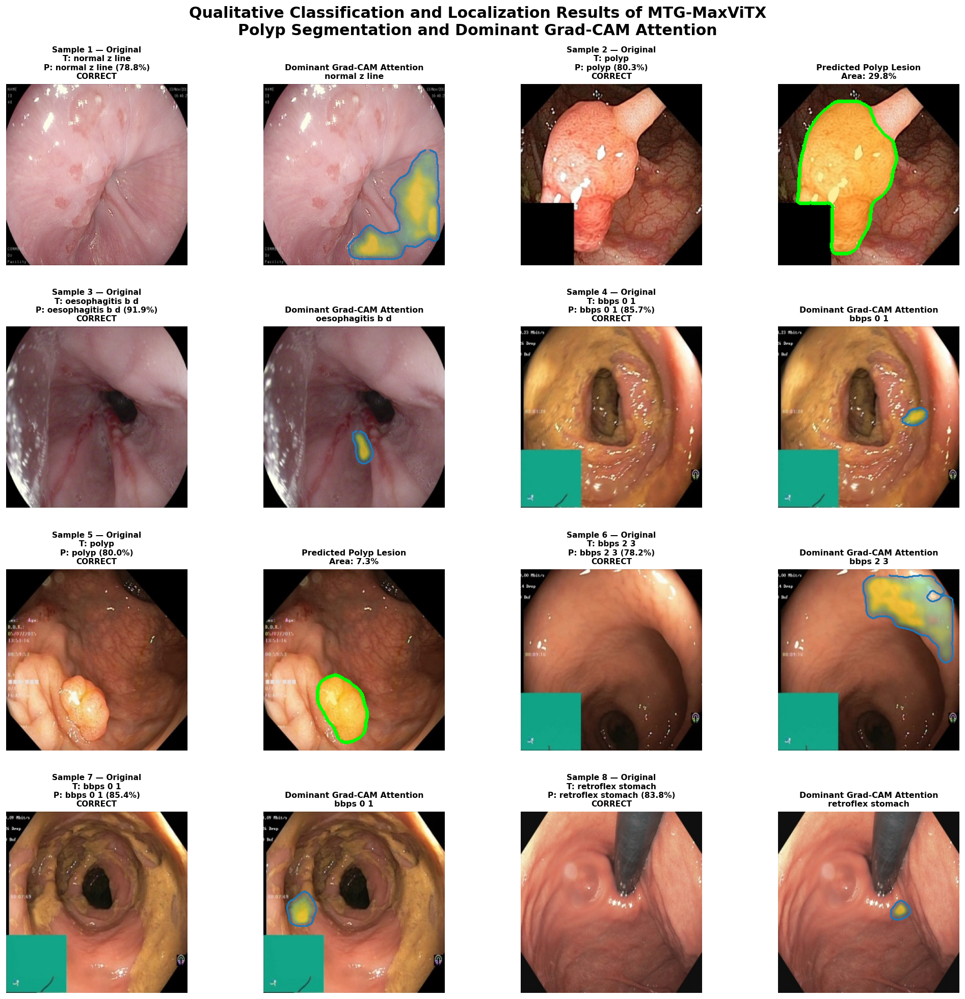

,figure_seed,sample,filename,true_class,predicted_class,confidence_percent,correct,region_type,lesion_area_percent,dominant_attention_area_percent
0,2247148156,1,6145e83b0351_03f6064f-751c-4cad-886b-69fb4d11c...,normal-z-line,normal-z-line,78.780014,True,Dominant multi-scale Grad-CAM,NaN,15.081787
1,2247148156,2,413e6fd8fb79_3efbd8ca-c325-4124-ab3d-2d4367e03...,polyp,polyp,80.279350,True,Polyp segmentation,29.777527,NaN
2,2247148156,3,9fe625e4a7fb_8b194261-f053-4496-b13e-f79d15e15...,oesophagitis-b-d,oesophagitis-b-d,91.932945,True,Dominant multi-scale Grad-CAM,NaN,1.464844
3,2247148156,4,0125b1893ea4_cee91e1e-dc7f-4470-bbc1-12c02e0f6...,bbps-0-1,bbps-0-1,85.692802,True,Dominant multi-scale Grad-CAM,NaN,0.997925
4,2247148156,5,514bd2ab7486_6e303cdc-869c-4a2f-8e85-b3c84a9d8...,polyp,polyp,79.966698,True,Polyp segmentation,7.296753,NaN
5,2247148156,6,c52017da8d5f_75a2de2d-005d-4083-a22a-6240cedf0...,bbps-2-3,bbps-2-3,78.188652,True,Dominant multi-scale Grad-CAM,NaN,14.184570
6,2247148156,7,5715133e0d2d_812917b2-455f-4edd-939f-d6a24778a...,bbps-0-1,bbps-0-1,85.368507,True,Dominant multi-scale Grad-CAM,NaN,2.375793
7,2247148156,8,ded4e75d4e85_d275778b-8362-48b9-b8f8-0a17739f3...,retroflex-stomach,retroflex-stomach,83.798164,True,Dominant multi-scale Grad-CAM,NaN,0.880432


✓ Results saved:
/content/drive/MyDrive/MTG_MaxViTX/results/eight_sample_dominant_gradcam_seed_2247148156.csv

8-IMAGE QUALITATIVE EVALUATION SUMMARY
Figure seed: 2247148156
Images: 8
Correct predictions: 8
Sample accuracy: 100.00%
Mean confidence: 83.00%
Polyp segmentation panels: 2
Dominant Grad-CAM panels: 6
Mean dominant attention area: 5.83%

To reproduce this exact figure later, run:
results_8 = display_8_images_4x4(
    random_state=2247148156,
    save_output=True,
    ensure_polyp_samples=2
)


In [ ]:
# ============================================================
# FINAL DOMINANT-REGION GRAD-CAM + RANDOM 8-IMAGE 4×4 GRID
# MTG-MaxViTX V6
#
# POLYP:
#   Actual segmentation-derived lesion localization
#
# NON-POLYP:
#   One compact dominant multi-scale Grad-CAM attention region
#
# IMPORTANT:
#   random_state=None  -> DIFFERENT 8 images every run
#   random_state=12345 -> reproduce exactly the same figure
#
# Run after final V6 model/checkpoint and inference helpers.
# ============================================================

import cv2
import secrets
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

from pathlib import Path


# ============================================================
# 1. ROBUST CAM NORMALIZATION
# ============================================================

def robust_cam_normalize(
    cam,
    low_percentile=2,
    high_percentile=98
):
    """
    Robustly normalize Grad-CAM to [0, 1].
    """

    cam = np.asarray(
        cam,
        dtype=np.float32
    )

    cam = np.nan_to_num(
        cam,
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )

    positive = cam[
        cam > 0
    ]

    if positive.size == 0:

        return np.zeros_like(
            cam,
            dtype=np.float32
        )

    lo = np.percentile(
        positive,
        low_percentile
    )

    hi = np.percentile(
        positive,
        high_percentile
    )

    cam = (
        cam - lo
    ) / (
        hi - lo + 1e-9
    )

    return np.clip(
        cam,
        0,
        1
    ).astype(
        np.float32
    )


# ============================================================
# 2. ENDOSCOPIC FIELD-OF-VIEW MASK
# ============================================================

def build_endoscopic_fov_mask(
    image_rgb,
    threshold=7
):
    """
    Suppress black external/endoscope borders while retaining
    internal dark anatomical regions such as the lumen.
    """

    image_rgb = np.asarray(
        image_rgb
    )

    if image_rgb.max() <= 1.5:

        image_u8 = (
            image_rgb
            *
            255
        ).clip(
            0,
            255
        ).astype(
            np.uint8
        )

    else:

        image_u8 = image_rgb.astype(
            np.uint8
        )

    gray = cv2.cvtColor(
        image_u8,
        cv2.COLOR_RGB2GRAY
    )

    binary = (
        gray > threshold
    ).astype(
        np.uint8
    )

    kernel = cv2.getStructuringElement(
        cv2.MORPH_ELLIPSE,
        (
            17,
            17
        )
    )

    binary = cv2.morphologyEx(
        binary,
        cv2.MORPH_CLOSE,
        kernel,
        iterations=2
    )

    contours, _ = cv2.findContours(
        binary,
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    fov = np.zeros_like(
        binary
    )

    if contours:

        largest = max(
            contours,
            key=cv2.contourArea
        )

        cv2.drawContours(
            fov,
            [largest],
            -1,
            1,
            thickness=-1
        )

    else:

        fov[:] = 1

    fov = cv2.GaussianBlur(
        fov.astype(
            np.float32
        ),
        (
            0,
            0
        ),
        sigmaX=2.0
    )

    if fov.max() > 0:

        fov /= (
            fov.max()
            +
            1e-9
        )

    return np.clip(
        fov,
        0,
        1
    )


# ============================================================
# 3. FINAL V6 CLASSIFICATION PROBABILITY
# ============================================================

@torch.no_grad()
def get_final_xai_prediction(
    x_batch
):
    """
    Prefer final V6 balanced ensemble.
    Fall back to refined base classifier.
    """

    model.eval()

    # --------------------------------------------------------
    # V6 FINAL ENSEMBLE
    # --------------------------------------------------------

    if (
        "v6_classification_probabilities"
        in globals()
        and
        callable(
            globals()[
                "v6_classification_probabilities"
            ]
        )
    ):

        prob = (
            v6_classification_probabilities(
                x_batch
            )
        )

    # --------------------------------------------------------
    # FALLBACK REFINED CLASSIFIER
    # --------------------------------------------------------

    else:

        out = model(
            x_batch,
            task="cls"
        )

        logits = out[
            "cls"
        ]

        if (
            "CLASSIFICATION_PRIOR_ALPHA"
            in globals()
            and
            "EVAL_LOG_PRIOR"
            in globals()
        ):

            logits = (
                logits
                -
                float(
                    CLASSIFICATION_PRIOR_ALPHA
                )
                *
                EVAL_LOG_PRIOR.unsqueeze(
                    0
                )
            )

        prob = torch.softmax(
            logits,
            dim=1
        )

    pred_idx = int(
        prob.argmax(
            dim=1
        ).item()
    )

    confidence = float(
        prob[
            0,
            pred_idx
        ].item()
    )

    return (
        pred_idx,
        confidence,
        prob
    )


# ============================================================
# 4. MULTI-SCALE GRAD-CAM
#
# Use:
#   features[-2] -> semantic + spatial detail
#   features[-3] -> finer spatial information
#
# Avoid:
#   features[-1] -> too coarse (~8×8)
# ============================================================

def _multiscale_gradcam_once(
    x,
    class_idx,
    layer_indices=(
        -2,
        -3
    ),
    layer_weights=(
        0.72,
        0.28
    )
):
    """
    Multi-scale Grad-CAM from higher-resolution MaxViT stages.
    """

    model.eval()

    # Required because encoder can be frozen.
    x_grad = (
        x.detach()
        .clone()
        .to(
            DEVICE
        )
        .unsqueeze(
            0
        )
        .requires_grad_(
            True
        )
    )

    model.zero_grad(
        set_to_none=True
    )

    with torch.enable_grad():

        out = model(
            x_grad,
            task="cls",
            return_features=True
        )

        logits = out[
            "cls"
        ]

        features = out[
            "features"
        ]

        selected_features = [
            features[idx]
            for idx
            in layer_indices
        ]

        target_score = logits[
            0,
            int(
                class_idx
            )
        ]

        gradients = torch.autograd.grad(
            outputs=target_score,
            inputs=selected_features,
            retain_graph=False,
            create_graph=False,
            allow_unused=True
        )

        cams = []

        used_weights = []

        for (
            feature_map,
            grad,
            fusion_weight
        ) in zip(
            selected_features,
            gradients,
            layer_weights
        ):

            if grad is None:

                continue

            channel_weights = grad.mean(
                dim=(
                    2,
                    3
                ),
                keepdim=True
            )

            cam = F.relu(
                (
                    channel_weights
                    *
                    feature_map
                ).sum(
                    dim=1,
                    keepdim=True
                )
            )

            cam = F.interpolate(
                cam,
                size=x_grad.shape[
                    -2:
                ],
                mode="bilinear",
                align_corners=False
            )[
                0,
                0
            ]

            cam_np = (
                cam.detach()
                .cpu()
                .numpy()
            )

            cam_np = robust_cam_normalize(
                cam_np
            )

            cams.append(
                cam_np
            )

            used_weights.append(
                fusion_weight
            )

    if not cams:

        raise RuntimeError(
            "No Grad-CAM gradients were obtained."
        )

    used_weights = np.asarray(
        used_weights,
        dtype=np.float32
    )

    used_weights /= (
        used_weights.sum()
        +
        1e-9
    )

    fused_cam = np.zeros_like(
        cams[0],
        dtype=np.float32
    )

    for weight, cam in zip(
        used_weights,
        cams
    ):

        fused_cam += (
            weight
            *
            cam
        )

    return robust_cam_normalize(
        fused_cam
    )


# ============================================================
# 5. IMPROVED MULTI-SCALE GRAD-CAM
# Original + horizontal flip smoothing
# ============================================================

def improved_gradcam_classification(
    x,
    class_idx=None,
    use_flip_smoothing=True
):
    """
    Final robust multi-scale Grad-CAM.
    """

    model.eval()

    x_device = (
        x.detach()
        .to(
            DEVICE
        )
        .unsqueeze(
            0
        )
    )

    (
        predicted_idx,
        predicted_confidence,
        final_prob
    ) = get_final_xai_prediction(
        x_device
    )

    if class_idx is None:

        class_idx = predicted_idx

    else:

        class_idx = int(
            class_idx
        )

    confidence = float(
        final_prob[
            0,
            class_idx
        ].item()
    )

    # --------------------------------------------------------
    # ORIGINAL
    # --------------------------------------------------------

    cam_original = (
        _multiscale_gradcam_once(
            x=x,
            class_idx=class_idx
        )
    )

    # --------------------------------------------------------
    # HORIZONTAL FLIP SMOOTHING
    # --------------------------------------------------------

    if use_flip_smoothing:

        x_flip = torch.flip(
            x,
            dims=[
                2
            ]
        )

        cam_flip = (
            _multiscale_gradcam_once(
                x=x_flip,
                class_idx=class_idx
            )
        )

        cam_flip = np.fliplr(
            cam_flip
        )

        cam = (
            0.70
            *
            cam_original
            +
            0.30
            *
            cam_flip
        )

    else:

        cam = cam_original

    # --------------------------------------------------------
    # APPLY FIELD-OF-VIEW MASK
    # --------------------------------------------------------

    image_rgb = (
        denormalize_tensor(
            x
        )
        .permute(
            1,
            2,
            0
        )
        .detach()
        .cpu()
        .numpy()
    )

    image_u8 = (
        image_rgb
        *
        255
    ).clip(
        0,
        255
    ).astype(
        np.uint8
    )

    fov_mask = (
        build_endoscopic_fov_mask(
            image_u8
        )
    )

    cam = (
        cam
        *
        fov_mask
    )

    cam = cv2.GaussianBlur(
        cam.astype(
            np.float32
        ),
        (
            0,
            0
        ),
        sigmaX=1.5
    )

    cam = robust_cam_normalize(
        cam
    )

    return (
        cam,
        int(
            class_idx
        ),
        float(
            confidence
        )
    )


# ============================================================
# 6. EXTRACT ONE COMPACT DOMINANT GRAD-CAM REGION
# ============================================================

def extract_dominant_gradcam_region(
    cam,
    image_rgb,
    activation_percentile=84,
    min_area_ratio=0.005,
    border_margin_ratio=0.04,
    suppress_annotation_box=True,
    max_area_ratio=0.22
):
    """
    Convert Grad-CAM into ONE dominant connected attention region.

    This is NOT lesion segmentation for non-polyp classes.
    """

    image_rgb = np.asarray(
        image_rgb
    )

    h, w = image_rgb.shape[
        :2
    ]

    image_area = float(
        h
        *
        w
    )

    # --------------------------------------------------------
    # RESIZE CAM
    # --------------------------------------------------------

    cam = cv2.resize(
        np.asarray(
            cam,
            dtype=np.float32
        ),
        (
            w,
            h
        ),
        interpolation=cv2.INTER_CUBIC
    )

    cam = np.nan_to_num(
        cam,
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )

    cam = robust_cam_normalize(
        cam
    )

    # --------------------------------------------------------
    # FOV MASK
    # --------------------------------------------------------

    fov = build_endoscopic_fov_mask(
        image_rgb
    )

    cam *= fov

    # --------------------------------------------------------
    # BORDER SUPPRESSION
    # --------------------------------------------------------

    border_y = max(
        1,
        int(
            border_margin_ratio
            *
            h
        )
    )

    border_x = max(
        1,
        int(
            border_margin_ratio
            *
            w
        )
    )

    valid_mask = np.ones(
        (
            h,
            w
        ),
        dtype=np.float32
    )

    valid_mask[
        :border_y,
        :
    ] = 0

    valid_mask[
        h-border_y:,
        :
    ] = 0

    valid_mask[
        :,
        :border_x
    ] = 0

    valid_mask[
        :,
        w-border_x:
    ] = 0

    cam *= valid_mask

    # --------------------------------------------------------
    # SUPPRESS LOWER-LEFT ACQUISITION OVERLAY
    # --------------------------------------------------------

    if suppress_annotation_box:

        annotation_h = int(
            0.38
            *
            h
        )

        annotation_w = int(
            0.38
            *
            w
        )

        cam[
            h-annotation_h:h,
            0:annotation_w
        ] = 0

    # --------------------------------------------------------
    # SMOOTH
    # --------------------------------------------------------

    cam = cv2.GaussianBlur(
        cam,
        (
            0,
            0
        ),
        sigmaX=2.0
    )

    cam = robust_cam_normalize(
        cam
    )

    valid_values = cam[
        cam > 0
    ]

    if valid_values.size == 0:

        return (
            np.zeros_like(
                cam,
                dtype=np.float32
            ),
            np.zeros_like(
                cam,
                dtype=bool
            )
        )

    # --------------------------------------------------------
    # STRONG ACTIVATION THRESHOLD
    # --------------------------------------------------------

    threshold = np.percentile(
        valid_values,
        activation_percentile
    )

    binary = (
        cam >= threshold
    ).astype(
        np.uint8
    )

    # --------------------------------------------------------
    # MODEST MORPHOLOGY
    # --------------------------------------------------------

    close_kernel = (
        cv2.getStructuringElement(
            cv2.MORPH_ELLIPSE,
            (
                11,
                11
            )
        )
    )

    binary = cv2.morphologyEx(
        binary,
        cv2.MORPH_CLOSE,
        close_kernel,
        iterations=1
    )

    open_kernel = (
        cv2.getStructuringElement(
            cv2.MORPH_ELLIPSE,
            (
                5,
                5
            )
        )
    )

    binary = cv2.morphologyEx(
        binary,
        cv2.MORPH_OPEN,
        open_kernel,
        iterations=1
    )

    # --------------------------------------------------------
    # CONNECTED COMPONENTS
    # --------------------------------------------------------

    (
        n_labels,
        labels,
        stats,
        centroids
    ) = cv2.connectedComponentsWithStats(
        binary,
        connectivity=8
    )

    min_area = max(
        25,
        int(
            min_area_ratio
            *
            image_area
        )
    )

    best_label = None

    best_score = -np.inf

    # ========================================================
    # SCORE COMPONENTS
    # ========================================================

    for label_id in range(
        1,
        n_labels
    ):

        component = (
            labels == label_id
        )

        area = int(
            stats[
                label_id,
                cv2.CC_STAT_AREA
            ]
        )

        if area < min_area:

            continue

        area_fraction = (
            area
            /
            image_area
        )

        # Reject huge nonspecific attention areas.
        if area_fraction > max_area_ratio:

            continue

        component_values = cam[
            component
        ]

        energy = float(
            component_values.sum()
        )

        mean_activation = float(
            component_values.mean()
        )

        peak_activation = float(
            component_values.max()
        )

        # ----------------------------------------------------
        # CENTROID
        # ----------------------------------------------------

        cx = float(
            centroids[
                label_id,
                0
            ]
        )

        cy = float(
            centroids[
                label_id,
                1
            ]
        )

        dx = (
            cx
            -
            w / 2.0
        ) / (
            w / 2.0
            +
            1e-9
        )

        dy = (
            cy
            -
            h / 2.0
        ) / (
            h / 2.0
            +
            1e-9
        )

        distance_from_center = np.sqrt(
            dx**2
            +
            dy**2
        )

        centrality = np.exp(
            -0.80
            *
            distance_from_center
        )

        # ----------------------------------------------------
        # BOUNDING BOX
        # ----------------------------------------------------

        x0 = int(
            stats[
                label_id,
                cv2.CC_STAT_LEFT
            ]
        )

        y0 = int(
            stats[
                label_id,
                cv2.CC_STAT_TOP
            ]
        )

        bw = int(
            stats[
                label_id,
                cv2.CC_STAT_WIDTH
            ]
        )

        bh = int(
            stats[
                label_id,
                cv2.CC_STAT_HEIGHT
            ]
        )

        margin_x = int(
            0.06
            *
            w
        )

        margin_y = int(
            0.06
            *
            h
        )

        touches_border = (
            x0 <= margin_x
            or
            y0 <= margin_y
            or
            x0 + bw
            >=
            w - margin_x
            or
            y0 + bh
            >=
            h - margin_y
        )

        border_factor = (
            0.35
            if touches_border
            else 1.0
        )

        # ----------------------------------------------------
        # SIZE PENALTY
        # ----------------------------------------------------

        if area_fraction <= 0.18:

            size_factor = 1.0

        else:

            size_factor = max(
                0.25,
                1.0
                -
                4.0
                *
                (
                    area_fraction
                    -
                    0.18
                )
            )

        # ----------------------------------------------------
        # COMPACTNESS
        # ----------------------------------------------------

        bbox_area = float(
            max(
                1,
                bw
                *
                bh
            )
        )

        compactness = np.clip(
            area
            /
            bbox_area,
            0,
            1
        )

        normalized_energy = (
            energy
            /
            (
                area
                +
                1e-9
            )
        )

        # ----------------------------------------------------
        # FINAL SCORE
        # ----------------------------------------------------

        score = (
            0.38
            *
            normalized_energy
            +
            0.26
            *
            mean_activation
            +
            0.16
            *
            peak_activation
            +
            0.10
            *
            centrality
            +
            0.10
            *
            compactness
        )

        score *= (
            border_factor
            *
            size_factor
        )

        if score > best_score:

            best_score = score

            best_label = label_id

    # ========================================================
    # FALLBACK
    # ========================================================

    if best_label is None:

        max_y, max_x = np.unravel_index(
            np.argmax(
                cam
            ),
            cam.shape
        )

        dominant_u8 = np.zeros_like(
            cam,
            dtype=np.uint8
        )

        radius = max(
            10,
            int(
                0.07
                *
                min(
                    h,
                    w
                )
            )
        )

        cv2.circle(
            dominant_u8,
            (
                int(
                    max_x
                ),
                int(
                    max_y
                )
            ),
            radius,
            1,
            thickness=-1
        )

    else:

        dominant_u8 = (
            labels == best_label
        ).astype(
            np.uint8
        )

    # --------------------------------------------------------
    # SMALL CONTROLLED EXPANSION
    # --------------------------------------------------------

    dilation_kernel = (
        cv2.getStructuringElement(
            cv2.MORPH_ELLIPSE,
            (
                7,
                7
            )
        )
    )

    dominant_u8 = cv2.dilate(
        dominant_u8,
        dilation_kernel,
        iterations=1
    )

    dominant_mask = (
        dominant_u8 > 0
    )

    # --------------------------------------------------------
    # SOFT MASK
    # --------------------------------------------------------

    soft_mask = cv2.GaussianBlur(
        dominant_u8.astype(
            np.float32
        ),
        (
            0,
            0
        ),
        sigmaX=4.0
    )

    if soft_mask.max() > 0:

        soft_mask /= (
            soft_mask.max()
            +
            1e-9
        )

    cam_filtered = (
        cam
        *
        soft_mask
    )

    cam_filtered = robust_cam_normalize(
        cam_filtered
    )

    return (
        cam_filtered.astype(
            np.float32
        ),
        dominant_mask
    )


# ============================================================
# 7. JOURNAL-STYLE DOMINANT GRAD-CAM OVERLAY
# ============================================================

def show_dominant_gradcam_overlay(
    ax,
    image_rgb,
    cam,
    title="Dominant Grad-CAM Attention"
):
    """
    Show only ONE dominant Grad-CAM attention region.
    """

    image_rgb = np.asarray(
        image_rgb
    )

    if image_rgb.max() > 1.5:

        image_float = (
            image_rgb.astype(
                np.float32
            )
            /
            255.0
        )

    else:

        image_float = (
            image_rgb.astype(
                np.float32
            )
        )

    image_float = np.clip(
        image_float,
        0,
        1
    )

    (
        cam_filtered,
        dominant_mask
    ) = extract_dominant_gradcam_region(
        cam=cam,
        image_rgb=image_rgb,
        activation_percentile=84,
        min_area_ratio=0.005,
        border_margin_ratio=0.04,
        suppress_annotation_box=True,
        max_area_ratio=0.22
    )

    # --------------------------------------------------------
    # HEATMAP
    # --------------------------------------------------------

    heatmap = plt.cm.viridis(
        cam_filtered
    )[
        ...,
        :3
    ]

    alpha_map = (
        0.05
        +
        0.55
        *
        cam_filtered
    )

    alpha_map[
        cam_filtered < 0.15
    ] = 0

    overlay = (
        image_float
        *
        (
            1.0
            -
            alpha_map[
                ...,
                None
            ]
        )
        +
        heatmap
        *
        alpha_map[
            ...,
            None
        ]
    )

    overlay = np.clip(
        overlay,
        0,
        1
    )

    ax.imshow(
        overlay
    )

    # --------------------------------------------------------
    # ONE OUTER CONTOUR
    # --------------------------------------------------------

    contours, _ = cv2.findContours(
        dominant_mask.astype(
            np.uint8
        ),
        cv2.RETR_EXTERNAL,
        cv2.CHAIN_APPROX_SIMPLE
    )

    if contours:

        largest_contour = max(
            contours,
            key=cv2.contourArea
        )

        if cv2.contourArea(
            largest_contour
        ) >= 50:

            xy = largest_contour[
                :,
                0,
                :
            ]

            ax.plot(
                xy[
                    :,
                    0
                ],
                xy[
                    :,
                    1
                ],
                linewidth=2.0
            )

    ax.set_title(
        title,
        fontsize=9.5,
        weight="bold",
        pad=6
    )

    ax.axis(
        "off"
    )

    return (
        cam_filtered,
        dominant_mask
    )


# ============================================================
# 8. RANDOM 8-IMAGE 4×4 VISUALIZATION
# ============================================================

def display_8_images_4x4(
    random_state=None,
    save_output=True,
    ensure_polyp_samples=2,
    save_results_csv=True
):
    """
    Final qualitative 4×4 grid.

    IMPORTANT
    ---------
    random_state=None:
        DIFFERENT 8 test images every execution.

    random_state=<integer>:
        reproduces exactly the same selected images.

    Two panels/sample:
        Original + localization

    Polyp:
        segmentation-derived lesion localization.

    Non-polyp:
        one dominant Grad-CAM attention region.
    """

    # ========================================================
    # VERIFY REQUIRED HELPERS
    # ========================================================

    required_functions = [
        "robust_read_rgb",
        "prepare_single_image",
        "predict_single_image_tensor",
        "get_polyp_lesion_mask",
        "create_lesion_overlay",
    ]

    missing = [
        name
        for name
        in required_functions
        if (
            name not in globals()
            or
            not callable(
                globals()[
                    name
                ]
            )
        )
    ]

    if missing:

        raise RuntimeError(
            "Required notebook helper functions are missing: "
            f"{missing}"
        )

    # ========================================================
    # NEW RANDOM SEED EVERY RUN
    # ========================================================

    if random_state is None:

        figure_seed = secrets.randbits(
            32
        )

    else:

        figure_seed = int(
            random_state
        )

    rng = np.random.default_rng(
        figure_seed
    )

    # Independent sub-seeds
    polyp_seed = int(
        rng.integers(
            0,
            2**31 - 1
        )
    )

    non_polyp_seed = int(
        rng.integers(
            0,
            2**31 - 1
        )
    )

    shuffle_seed = int(
        rng.integers(
            0,
            2**31 - 1
        )
    )

    print()
    print(
        "=" * 78
    )

    print(
        "RANDOM QUALITATIVE SAMPLE SELECTION"
    )

    print(
        "=" * 78
    )

    print(
        "Figure seed:",
        figure_seed
    )

    print(
        "Different samples will be selected on the next run."
    )

    # ========================================================
    # SPLIT POLYP / NON-POLYP POOL
    # ========================================================

    n_total = min(
        8,
        len(
            cls_test_df
        )
    )

    polyp_df = (
        cls_test_df[
            cls_test_df[
                "label"
            ]
            ==
            POLYP_LABEL
        ]
        .copy()
    )

    non_polyp_df = (
        cls_test_df[
            cls_test_df[
                "label"
            ]
            !=
            POLYP_LABEL
        ]
        .copy()
    )

    n_polyp = min(
        int(
            ensure_polyp_samples
        ),
        len(
            polyp_df
        ),
        n_total
    )

    n_other = (
        n_total
        -
        n_polyp
    )

    selected_parts = []

    # --------------------------------------------------------
    # RANDOM POLYP CASES
    # --------------------------------------------------------

    if n_polyp > 0:

        selected_parts.append(
            polyp_df.sample(
                n=n_polyp,
                replace=False,
                random_state=polyp_seed
            )
        )

    # --------------------------------------------------------
    # RANDOM NON-POLYP CASES
    # --------------------------------------------------------

    if n_other > 0:

        selected_parts.append(
            non_polyp_df.sample(
                n=n_other,
                replace=False,
                random_state=non_polyp_seed
            )
        )

    # --------------------------------------------------------
    # RANDOMIZE FINAL PANEL ORDER
    # --------------------------------------------------------

    samples = (
        pd.concat(
            selected_parts,
            axis=0
        )
        .sample(
            frac=1.0,
            replace=False,
            random_state=shuffle_seed
        )
        .reset_index(
            drop=True
        )
    )

    print()
    print(
        "Selected test samples:"
    )

    for i, row in samples.iterrows():

        print(
            f"{i + 1:02d}. "
            f"{HK_CLASSES[int(row['label'])]:32s} | "
            f"{Path(str(row['path'])).name}"
        )

    # ========================================================
    # CREATE 4×4 FIGURE
    # ========================================================

    fig, axes = plt.subplots(
        4,
        4,
        figsize=(
            17,
            17
        )
    )

    axes = axes.ravel()

    result_rows = []

    panel = 0

    # ========================================================
    # PROCESS EACH SAMPLE
    # ========================================================

    for sample_no, row in samples.iterrows():

        image_path = str(
            row[
                "path"
            ]
        )

        true_idx = int(
            row[
                "label"
            ]
        )

        true_class = HK_CLASSES[
            true_idx
        ]

        # ----------------------------------------------------
        # READ IMAGE
        # --------------------------------------------------------

        image_rgb = robust_read_rgb(
            image_path
        )

        x = prepare_single_image(
            image_rgb
        )

        # ----------------------------------------------------
        # FINAL CLASSIFICATION
        # ----------------------------------------------------

        (
            probabilities,
            inference_name
        ) = predict_single_image_tensor(
            x
        )

        pred_idx = int(
            np.argmax(
                probabilities
            )
        )

        pred_class = HK_CLASSES[
            pred_idx
        ]

        confidence = float(
            probabilities[
                pred_idx
            ]
            *
            100.0
        )

        correct = (
            pred_idx == true_idx
        )

        status = (
            "CORRECT"
            if correct
            else "ERROR"
        )

        # ====================================================
        # PANEL A — ORIGINAL
        # ====================================================

        ax_original = axes[
            panel
        ]

        ax_original.imshow(
            image_rgb
        )

        ax_original.axis(
            "off"
        )

        ax_original.set_title(
            (
                f"Sample {sample_no + 1} — Original\n"
                f"T: {true_class.replace('-', ' ')}\n"
                f"P: {pred_class.replace('-', ' ')} "
                f"({confidence:.1f}%)\n"
                f"{status}"
            ),
            fontsize=9.2,
            weight="bold",
            pad=6
        )

        panel += 1

        # ====================================================
        # PANEL B — LOCALIZATION
        # ====================================================

        ax_region = axes[
            panel
        ]

        # ----------------------------------------------------
        # POLYP PREDICTION
        # ----------------------------------------------------

        if pred_class == "polyp":

            (
                seg_prob,
                lesion_mask
            ) = get_polyp_lesion_mask(
                x
            )

            (
                lesion_overlay,
                mask_vis
            ) = create_lesion_overlay(
                image_rgb,
                lesion_mask,
                alpha=0.38
            )

            lesion_area = float(
                mask_vis.mean()
                *
                100
            )

            dominant_attention_area = np.nan

            ax_region.imshow(
                lesion_overlay
            )

            ax_region.axis(
                "off"
            )

            ax_region.set_title(
                (
                    "Predicted Polyp Lesion\n"
                    f"Area: {lesion_area:.1f}%"
                ),
                fontsize=9.5,
                weight="bold",
                pad=6
            )

            region_type = (
                "Polyp segmentation"
            )

        # ----------------------------------------------------
        # NON-POLYP PREDICTION
        # ----------------------------------------------------

        else:

            (
                cam,
                explained_idx,
                xai_conf
            ) = improved_gradcam_classification(
                x=x,
                class_idx=pred_idx,
                use_flip_smoothing=True
            )

            (
                dominant_cam,
                dominant_mask
            ) = show_dominant_gradcam_overlay(
                ax=ax_region,
                image_rgb=image_rgb,
                cam=cam,
                title=(
                    "Dominant Grad-CAM Attention\n"
                    f"{pred_class.replace('-', ' ')}"
                )
            )

            dominant_attention_area = float(
                dominant_mask.mean()
                *
                100
            )

            lesion_area = np.nan

            region_type = (
                "Dominant multi-scale Grad-CAM"
            )

        panel += 1

        # ====================================================
        # STORE RESULTS
        # ====================================================

        result_rows.append(
            {
                "figure_seed":
                    int(
                        figure_seed
                    ),

                "sample":
                    int(
                        sample_no + 1
                    ),

                "filename":
                    Path(
                        image_path
                    ).name,

                "true_class":
                    true_class,

                "predicted_class":
                    pred_class,

                "confidence_percent":
                    confidence,

                "correct":
                    bool(
                        correct
                    ),

                "region_type":
                    region_type,

                "lesion_area_percent":
                    lesion_area,

                "dominant_attention_area_percent":
                    dominant_attention_area,
            }
        )

    # ========================================================
    # MAIN TITLE
    # ========================================================

    fig.suptitle(
        (
            "Qualitative Classification and Localization Results "
            "of MTG-MaxViTX\n"
            "Polyp Segmentation and Dominant Grad-CAM Attention"
        ),
        fontsize=18,
        weight="bold",
        y=0.975
    )

    # ========================================================
    # SPACING
    # ========================================================

    plt.subplots_adjust(
        left=0.025,
        right=0.985,
        bottom=0.025,
        top=0.90,
        wspace=0.14,
        hspace=0.34
    )

    # ========================================================
    # SAVE FIGURE — UNIQUE NAME EVERY RUN
    # ========================================================

    if save_output:

        output_path = (
            FIGURES
            /
            (
                "eight_sample_dominant_gradcam_"
                f"seed_{figure_seed}.png"
            )
        )

        plt.savefig(
            output_path,
            dpi=300,
            bbox_inches="tight"
        )

        print()
        print(
            "✓ Figure saved:"
        )

        print(
            output_path
        )

    plt.show()

    # ========================================================
    # RESULT TABLE
    # ========================================================

    results_df = pd.DataFrame(
        result_rows
    )

    display(
        results_df
    )

    # ========================================================
    # SAVE RESULTS
    # ========================================================

    if save_results_csv:

        csv_path = (
            RESULTS
            /
            (
                "eight_sample_dominant_gradcam_"
                f"seed_{figure_seed}.csv"
            )
        )

        results_df.to_csv(
            csv_path,
            index=False
        )

        print(
            "✓ Results saved:"
        )

        print(
            csv_path
        )

    # ========================================================
    # SUMMARY
    # ========================================================

    accuracy_8 = float(
        results_df[
            "correct"
        ].mean()
        *
        100
    )

    mean_confidence = float(
        results_df[
            "confidence_percent"
        ].mean()
    )

    polyp_count = int(
        results_df[
            "region_type"
        ].eq(
            "Polyp segmentation"
        ).sum()
    )

    gradcam_count = int(
        results_df[
            "region_type"
        ].eq(
            "Dominant multi-scale Grad-CAM"
        ).sum()
    )

    print()
    print(
        "=" * 78
    )

    print(
        "8-IMAGE QUALITATIVE EVALUATION SUMMARY"
    )

    print(
        "=" * 78
    )

    print(
        "Figure seed:",
        figure_seed
    )

    print(
        "Images:",
        len(
            results_df
        )
    )

    print(
        "Correct predictions:",
        int(
            results_df[
                "correct"
            ].sum()
        )
    )

    print(
        "Sample accuracy:",
        f"{accuracy_8:.2f}%"
    )

    print(
        "Mean confidence:",
        f"{mean_confidence:.2f}%"
    )

    print(
        "Polyp segmentation panels:",
        polyp_count
    )

    print(
        "Dominant Grad-CAM panels:",
        gradcam_count
    )

    if gradcam_count > 0:

        mean_attention_area = float(
            results_df[
                "dominant_attention_area_percent"
            ]
            .dropna()
            .mean()
        )

        print(
            "Mean dominant attention area:",
            f"{mean_attention_area:.2f}%"
        )

    print()
    print(
        "To reproduce this exact figure later, run:"
    )

    print(
        "results_8 = display_8_images_4x4("
    )

    print(
        f"    random_state={figure_seed},"
    )

    print(
        "    save_output=True,"
    )

    print(
        "    ensure_polyp_samples=2"
    )

    print(
        ")"
    )

    return results_df


# ============================================================
# 9. RUN — DIFFERENT 8 IMAGES EVERY TIME
# ============================================================

results_8 = display_8_images_4x4(
    random_state=None,
    save_output=True,
    ensure_polyp_samples=2,
    save_results_csv=True
)

## Stage 31 — Q1 Experiment Engine

Reusable checkpointed utilities for five-run reproducibility, ablations, classification baselines, segmentation baselines, external validation, and paired significance testing.

In [ ]:
# ============================================================
# STAGE 31 — Q1 EXPERIMENT ENGINE
# ============================================================

from scipy.stats import wilcoxon
from statsmodels.stats.contingency_tables import mcnemar
import segmentation_models_pytorch as smp

def q1_class_weights():
    cp = np.sort(cls_train_df.label.unique())
    w = compute_class_weight(
        class_weight="balanced",
        classes=cp,
        y=cls_train_df.label.values
    )
    out = torch.ones(
        len(HK_CLASSES),
        dtype=torch.float32
    )
    out[cp] = torch.tensor(
        w,
        dtype=torch.float32
    )
    return out.to(DEVICE)

Q1_CLASS_WEIGHTS = q1_class_weights()

@torch.no_grad()
def q1_predict_cls(model_obj, loader, plain=False):
    model_obj.eval()

    ys, preds, probs, names, latency = [], [], [], [], []

    for x, y, fn in loader:
        x = x.to(
            DEVICE,
            non_blocking=True
        )

        if DEVICE.type == "cuda":
            torch.cuda.synchronize()

        t0 = time.perf_counter()

        if plain:
            logits = model_obj(x)
        else:
            logits = model_obj(
                x,
                task="cls"
            )["cls"]

        if DEVICE.type == "cuda":
            torch.cuda.synchronize()

        latency.append(
            (time.perf_counter() - t0)
            /
            len(x)
        )

        pr = torch.softmax(
            logits,
            dim=1
        )

        ys.extend(y.numpy())
        preds.extend(
            pr.argmax(1).cpu().numpy()
        )
        probs.append(
            pr.cpu().numpy()
        )
        names.extend(fn)

    return (
        np.asarray(ys),
        np.asarray(preds),
        np.concatenate(probs),
        names,
        np.asarray(latency),
    )

@torch.no_grad()
def q1_predict_seg(model_obj, loader, plain=False):
    model_obj.eval()
    rows = []

    for x, y, fn in loader:
        x = x.to(
            DEVICE,
            non_blocking=True
        )

        if DEVICE.type == "cuda":
            torch.cuda.synchronize()

        t0 = time.perf_counter()

        if plain:
            logits = model_obj(x)
        else:
            logits = model_obj(
                x,
                task="seg"
            )["seg"]

        if DEVICE.type == "cuda":
            torch.cuda.synchronize()

        latency = (
            time.perf_counter() - t0
        ) / len(x)

        pred = (
            torch.sigmoid(logits)
            .cpu()
            .numpy()
            >
            .5
        )

        gt = (
            y.numpy()
            >
            .5
        )

        for i in range(len(fn)):
            a = pred[i, 0]
            b = gt[i, 0]

            tp = np.logical_and(a, b).sum()
            fp = np.logical_and(a, ~b).sum()
            fnv = np.logical_and(~a, b).sum()

            dice = (
                2 * tp + 1e-9
            ) / (
                2 * tp + fp + fnv + 1e-9
            )

            iou = (
                tp + 1e-9
            ) / (
                tp + fp + fnv + 1e-9
            )

            rows.append({
                "filename": fn[i],
                "dice": float(dice),
                "iou": float(iou),
                "boundary_f1": boundary_f1(a, b),
                "latency_ms": float(latency * 1000),
            })

    return pd.DataFrame(rows)

def q1_eval_multitask(model_obj):
    y, p, prob, names, lat = q1_predict_cls(
        model_obj,
        cls_test_loader
    )

    cls_m = classification_metrics(
        y,
        p,
        prob
    )

    seg_m = q1_predict_seg(
        model_obj,
        seg_test_loader
    )

    ey, ep, eprob, _, _ = q1_predict_cls(
        model_obj,
        external_loader
    )

    ext_labels = sorted(
        gv_mapped.hk_label.unique().tolist()
    )

    ext_m = classification_metrics(
        ey,
        ep,
        eprob,
        labels=ext_labels
    )

    return {
        "y": y,
        "pred": p,
        "prob": prob,
        "names": names,
        "cls": cls_m,
        "seg": seg_m,
        "external": ext_m,
        "latency_ms": float(lat.mean() * 1000),
    }

def q1_fit_multitask(
    experiment_name,
    seed,
    use_multiscale_context=True,
    use_semantic_gating=True,
    use_boundary_head=True,
    lambda_consistency=LAMBDA_CONSISTENCY,
    lambda_boundary=LAMBDA_BOUNDARY,
    multitask=True
):
    safe = (
        experiment_name
        .lower()
        .replace(" ", "_")
        .replace("/", "_")
    )

    out_dir = (
        EXPERIMENTS
        / safe
        / f"seed_{seed}"
    )

    out_dir.mkdir(
        parents=True,
        exist_ok=True
    )

    metric_path = out_dir / "metrics.json"
    pred_path = out_dir / "classification_predictions.npz"
    seg_path = out_dir / "segmentation_per_image.csv"

    if (
        metric_path.exists()
        and pred_path.exists()
        and seg_path.exists()
    ):
        return json.loads(
            metric_path.read_text()
        )

    seed_everything(seed)

    m = MTGMaxViTX(
        use_multiscale_context=use_multiscale_context,
        use_semantic_gating=use_semantic_gating,
        use_boundary_head=use_boundary_head
    ).to(DEVICE)

    criterion = nn.CrossEntropyLoss(
        weight=Q1_CLASS_WEIGHTS,
        label_smoothing=.05
    )

    opt = torch.optim.AdamW(
        m.parameters(),
        lr=LR,
        weight_decay=WEIGHT_DECAY
    )

    sched = torch.optim.lr_scheduler.CosineAnnealingLR(
        opt,
        T_max=Q1_EXPERIMENT_EPOCHS,
        eta_min=LR * .02
    )

    amp = torch.amp.GradScaler(
        "cuda",
        enabled=DEVICE.type == "cuda"
    )

    best_state = None
    best_score = -np.inf
    bad = 0

    for epoch in range(Q1_EXPERIMENT_EPOCHS):
        m.train()

        ci = cycle(cls_train_loader)
        si = cycle(seg_train_loader)

        for _ in range(
            max(
                len(cls_train_loader),
                len(seg_train_loader)
            )
        ):
            cx, cy, _ = next(ci)
            sx, sy, _ = next(si)

            cx = cx.to(DEVICE)
            cy = cy.to(DEVICE)
            sx = sx.to(DEVICE)
            sy = sy.to(DEVICE)

            opt.zero_grad(
                set_to_none=True
            )

            with torch.amp.autocast(
                "cuda",
                enabled=DEVICE.type == "cuda"
            ):
                cls_out = m(
                    cx,
                    task="cls"
                )

                seg_out = m(
                    sx,
                    task="both" if multitask else "seg"
                )

                l_cls = criterion(
                    cls_out["cls"],
                    cy
                )

                l_seg = segmentation_loss(
                    seg_out["seg"],
                    sy
                )

                loss = (
                    l_cls
                    +
                    l_seg
                )

                if multitask:
                    polyp_y = torch.full(
                        (len(sx),),
                        POLYP_LABEL,
                        dtype=torch.long,
                        device=DEVICE
                    )

                    l_seg_cls = criterion(
                        seg_out["cls"],
                        polyp_y
                    )

                    l_cons = cross_task_consistency_loss(
                        seg_out["cls"],
                        seg_out["seg_presence"]
                    )

                    if (
                        use_boundary_head
                        and
                        "boundary" in seg_out
                    ):
                        l_bnd = explicit_boundary_loss(
                            seg_out["boundary"],
                            sy
                        )
                    else:
                        l_bnd = torch.zeros(
                            (),
                            device=DEVICE
                        )

                    loss = (
                        loss
                        +
                        LAMBDA_SEG_CLS * l_seg_cls
                        +
                        lambda_consistency * l_cons
                        +
                        lambda_boundary * l_bnd
                    )

            amp.scale(loss).backward()
            amp.unscale_(opt)

            torch.nn.utils.clip_grad_norm_(
                m.parameters(),
                1.0
            )

            amp.step(opt)
            amp.update()

        sched.step()

        # Compact validation.
        vy, vp, _, _, _ = q1_predict_cls(
            m,
            cls_val_loader
        )

        vf1 = f1_score(
            vy,
            vp,
            average="macro",
            zero_division=0
        )

        vseg = q1_predict_seg(
            m,
            seg_val_loader
        )

        vdice = float(
            vseg["dice"].mean()
        )

        score = .5 * vf1 + .5 * vdice

        if score > best_score + 1e-4:
            best_score = score
            bad = 0

            best_state = {
                k: v.detach().cpu()
                for k, v in m.state_dict().items()
            }
        else:
            bad += 1

        if bad >= Q1_EXPERIMENT_PATIENCE:
            break

    if best_state is not None:
        m.load_state_dict(best_state)

    ev = q1_eval_multitask(m)

    row = {
        "experiment": experiment_name,
        "seed": int(seed),
        "macro_f1": float(ev["cls"]["macro_f1"]),
        "accuracy": float(ev["cls"]["accuracy"]),
        "mcc": float(ev["cls"]["mcc"]),
        "ece": float(ev["cls"]["ece"]),
        "dice": float(ev["seg"]["dice"].mean()),
        "iou": float(ev["seg"]["iou"].mean()),
        "boundary_f1": float(
            ev["seg"]["boundary_f1"].mean()
        ),
        "external_macro_f1": float(
            ev["external"]["macro_f1"]
        ),
        "classification_latency_ms": float(
            ev["latency_ms"]
        ),
        "segmentation_latency_ms": float(
            ev["seg"]["latency_ms"].mean()
        ),
        "parameters_m": float(
            sum(p.numel() for p in m.parameters())
            / 1e6
        ),
    }

    metric_path.write_text(
        json.dumps(row, indent=2)
    )

    np.savez_compressed(
        pred_path,
        y=ev["y"],
        pred=ev["pred"],
        prob=ev["prob"],
        names=np.asarray(ev["names"])
    )

    ev["seg"].to_csv(
        seg_path,
        index=False
    )

    del m
    gc.collect()

    if DEVICE.type == "cuda":
        torch.cuda.empty_cache()

    return row

## Stage 32 — Full Ablation Study

The ablation suite isolates multi-scale context fusion, disease-semantic gating, multi-task coupling, consistency loss, and explicit boundary supervision.

In [ ]:
if not RUN_HEAVY_Q1_SUITE:
    print("Skipped heavy Q1 suite stage: RUN_HEAVY_Q1_SUITE=False. Enable only when sufficient GPU quota is available.")
else:
    # ============================================================
    # STAGE 32 — FULL ABLATION STUDY
    # ============================================================


    def q1_fit_single_task_pair(
        experiment_name,
        seed
    ):
        """
        Genuine no-multi-task ablation:
        one MaxViT model is optimized only for classification and
        a separate MaxViT model is optimized only for segmentation.
        There is no shared representation or cross-task gradient.
        """
        safe = (
            experiment_name
            .lower()
            .replace(" ", "_")
            .replace("/", "_")
        )

        out_dir = (
            EXPERIMENTS
            / safe
            / f"seed_{seed}"
        )
        out_dir.mkdir(
            parents=True,
            exist_ok=True
        )

        metric_path = out_dir / "metrics.json"
        pred_path = out_dir / "classification_predictions.npz"
        seg_path = out_dir / "segmentation_per_image.csv"

        if (
            metric_path.exists()
            and pred_path.exists()
            and seg_path.exists()
        ):
            return json.loads(
                metric_path.read_text()
            )

        seed_everything(seed)

        # --------------------------------------------------------
        # Classification-only model
        # --------------------------------------------------------
        cls_model = MTGMaxViTX(
            use_multiscale_context=True,
            use_semantic_gating=False,
            use_boundary_head=False
        ).to(DEVICE)

        criterion = nn.CrossEntropyLoss(
            weight=Q1_CLASS_WEIGHTS,
            label_smoothing=.05
        )

        cls_opt = torch.optim.AdamW(
            cls_model.parameters(),
            lr=LR,
            weight_decay=WEIGHT_DECAY
        )

        cls_amp = torch.amp.GradScaler(
            "cuda",
            enabled=DEVICE.type == "cuda"
        )

        best_cls = None
        best_f1 = -np.inf
        bad = 0

        for epoch in range(
            Q1_EXPERIMENT_EPOCHS
        ):
            cls_model.train()

            for x, y, _ in cls_train_loader:
                x = x.to(DEVICE)
                y = y.to(DEVICE)

                cls_opt.zero_grad(
                    set_to_none=True
                )

                with torch.amp.autocast(
                    "cuda",
                    enabled=DEVICE.type == "cuda"
                ):
                    logits = cls_model(
                        x,
                        task="cls"
                    )["cls"]

                    loss = criterion(
                        logits,
                        y
                    )

                cls_amp.scale(loss).backward()
                cls_amp.unscale_(cls_opt)

                torch.nn.utils.clip_grad_norm_(
                    cls_model.parameters(),
                    1.0
                )

                cls_amp.step(cls_opt)
                cls_amp.update()

            vy, vp, _, _, _ = q1_predict_cls(
                cls_model,
                cls_val_loader
            )

            vf1 = f1_score(
                vy,
                vp,
                average="macro",
                zero_division=0
            )

            if vf1 > best_f1 + 1e-4:
                best_f1 = vf1
                bad = 0

                best_cls = {
                    k: v.detach().cpu()
                    for k, v
                    in cls_model.state_dict().items()
                }
            else:
                bad += 1

            if bad >= Q1_EXPERIMENT_PATIENCE:
                break

        if best_cls is not None:
            cls_model.load_state_dict(
                best_cls
            )

        # --------------------------------------------------------
        # Segmentation-only model
        # --------------------------------------------------------
        seg_model = MTGMaxViTX(
            use_multiscale_context=False,
            use_semantic_gating=False,
            use_boundary_head=True
        ).to(DEVICE)

        seg_opt = torch.optim.AdamW(
            seg_model.parameters(),
            lr=LR,
            weight_decay=WEIGHT_DECAY
        )

        seg_amp = torch.amp.GradScaler(
            "cuda",
            enabled=DEVICE.type == "cuda"
        )

        best_seg = None
        best_dice = -np.inf
        bad = 0

        for epoch in range(
            Q1_EXPERIMENT_EPOCHS
        ):
            seg_model.train()

            for x, y, _ in seg_train_loader:
                x = x.to(DEVICE)
                y = y.to(DEVICE)

                seg_opt.zero_grad(
                    set_to_none=True
                )

                with torch.amp.autocast(
                    "cuda",
                    enabled=DEVICE.type == "cuda"
                ):
                    out = seg_model(
                        x,
                        task="seg"
                    )

                    loss = segmentation_loss(
                        out["seg"],
                        y
                    )

                    if "boundary" in out:
                        loss = (
                            loss
                            +
                            LAMBDA_BOUNDARY
                            *
                            explicit_boundary_loss(
                                out["boundary"],
                                y
                            )
                        )

                seg_amp.scale(loss).backward()
                seg_amp.unscale_(seg_opt)

                torch.nn.utils.clip_grad_norm_(
                    seg_model.parameters(),
                    1.0
                )

                seg_amp.step(seg_opt)
                seg_amp.update()

            val_seg = q1_predict_seg(
                seg_model,
                seg_val_loader
            )

            vdice = float(
                val_seg["dice"].mean()
            )

            if vdice > best_dice + 1e-4:
                best_dice = vdice
                bad = 0

                best_seg = {
                    k: v.detach().cpu()
                    for k, v
                    in seg_model.state_dict().items()
                }
            else:
                bad += 1

            if bad >= Q1_EXPERIMENT_PATIENCE:
                break

        if best_seg is not None:
            seg_model.load_state_dict(
                best_seg
            )

        # --------------------------------------------------------
        # Test evaluation
        # --------------------------------------------------------
        y, pred, prob, names, lat = q1_predict_cls(
            cls_model,
            cls_test_loader
        )

        cls_metrics_st = classification_metrics(
            y,
            pred,
            prob
        )

        seg_eval_st = q1_predict_seg(
            seg_model,
            seg_test_loader
        )

        ey, ep, eprob, _, _ = q1_predict_cls(
            cls_model,
            external_loader
        )

        ext_metrics_st = classification_metrics(
            ey,
            ep,
            eprob,
            labels=sorted(
                gv_mapped.hk_label.unique().tolist()
            )
        )

        row = {
            "experiment": experiment_name,
            "seed": int(seed),
            "macro_f1": float(
                cls_metrics_st["macro_f1"]
            ),
            "accuracy": float(
                cls_metrics_st["accuracy"]
            ),
            "mcc": float(
                cls_metrics_st["mcc"]
            ),
            "ece": float(
                cls_metrics_st["ece"]
            ),
            "dice": float(
                seg_eval_st["dice"].mean()
            ),
            "iou": float(
                seg_eval_st["iou"].mean()
            ),
            "boundary_f1": float(
                seg_eval_st[
                    "boundary_f1"
                ].mean()
            ),
            "external_macro_f1": float(
                ext_metrics_st["macro_f1"]
            ),
            "classification_latency_ms": float(
                lat.mean() * 1000
            ),
            "segmentation_latency_ms": float(
                seg_eval_st[
                    "latency_ms"
                ].mean()
            ),
            "parameters_m": float(
                (
                    sum(
                        p.numel()
                        for p in cls_model.parameters()
                    )
                    +
                    sum(
                        p.numel()
                        for p in seg_model.parameters()
                    )
                )
                / 1e6
            ),
        }

        metric_path.write_text(
            json.dumps(
                row,
                indent=2
            )
        )

        np.savez_compressed(
            pred_path,
            y=y,
            pred=pred,
            prob=prob,
            names=np.asarray(names)
        )

        seg_eval_st.to_csv(
            seg_path,
            index=False
        )

        del cls_model, seg_model
        gc.collect()

        if DEVICE.type == "cuda":
            torch.cuda.empty_cache()

        return row



    ABLATION_CONFIGS = {
        "Full MTG-MaxViTX": {
            "use_multiscale_context": True,
            "use_semantic_gating": True,
            "use_boundary_head": True,
            "lambda_consistency": LAMBDA_CONSISTENCY,
            "lambda_boundary": LAMBDA_BOUNDARY,
            "multitask": True,
        },
        "w/o Context Fusion": {
            "use_multiscale_context": False,
            "use_semantic_gating": True,
            "use_boundary_head": True,
            "lambda_consistency": LAMBDA_CONSISTENCY,
            "lambda_boundary": LAMBDA_BOUNDARY,
            "multitask": True,
        },
        "w/o Semantic Gating": {
            "use_multiscale_context": True,
            "use_semantic_gating": False,
            "use_boundary_head": True,
            "lambda_consistency": LAMBDA_CONSISTENCY,
            "lambda_boundary": LAMBDA_BOUNDARY,
            "multitask": True,
        },
        "Single-Task Training": {
            "use_multiscale_context": True,
            "use_semantic_gating": False,
            "use_boundary_head": False,
            "lambda_consistency": 0.0,
            "lambda_boundary": 0.0,
            "multitask": False,
        },
        "w/o Consistency Loss": {
            "use_multiscale_context": True,
            "use_semantic_gating": True,
            "use_boundary_head": True,
            "lambda_consistency": 0.0,
            "lambda_boundary": LAMBDA_BOUNDARY,
            "multitask": True,
        },
        "w/o Boundary Head": {
            "use_multiscale_context": True,
            "use_semantic_gating": True,
            "use_boundary_head": False,
            "lambda_consistency": LAMBDA_CONSISTENCY,
            "lambda_boundary": 0.0,
            "multitask": True,
        },
    }

    ablation_rows = []

    ablation_seeds = (
        Q1_SEEDS
        if RUN_FULL_Q1_SUITE
        else [Q1_SEEDS[0]]
    )

    for name, cfg in ABLATION_CONFIGS.items():
        for seed in ablation_seeds:
            print(
                f"Ablation: {name} | seed={seed}"
            )

            if name == "Single-Task Training":
                ablation_rows.append(
                    q1_fit_single_task_pair(
                        experiment_name="ablation_" + name,
                        seed=seed
                    )
                )
            else:
                ablation_rows.append(
                    q1_fit_multitask(
                        experiment_name="ablation_" + name,
                        seed=seed,
                        **cfg
                    )
                )

    ablation_df = pd.DataFrame(
        ablation_rows
    )

    ablation_df.to_csv(
        RESULTS / "q1_ablation_runs.csv",
        index=False
    )

    ablation_summary = (
        ablation_df
        .groupby("experiment")[
            [
                "macro_f1",
                "dice",
                "boundary_f1",
                "external_macro_f1",
            ]
        ]
        .agg(["mean", "std"])
    )

    display(ablation_summary)

    ablation_summary.to_csv(
        RESULTS / "q1_ablation_summary.csv"
    )

    metric_cols = [
        "macro_f1",
        "dice",
        "boundary_f1",
        "external_macro_f1",
    ]

    metric_labels = [
        "Macro F1",
        "Dice",
        "Boundary F1",
        "External F1",
    ]

    means = (
        ablation_df
        .groupby("experiment")[metric_cols]
        .mean()
    )

    full_key = [
        x for x in means.index
        if "full_mtg-maxvitx" in x.lower()
    ][0]

    full = means.loc[full_key]

    fig, ax = plt.subplots(
        figsize=(12, 7)
    )

    for yi, method in enumerate(means.index):
        for xi, metric in enumerate(metric_cols):
            value = means.loc[
                method,
                metric
            ]

            delta = value - full[metric]

            size = (
                450
                +
                2300 * max(0, value)
            )

            color_value = np.clip(
                .5 + 8 * delta,
                0,
                1
            )

            ax.scatter(
                xi,
                yi,
                s=size,
                c=[color_value],
                cmap="viridis",
                vmin=0,
                vmax=1,
                edgecolors="black",
                linewidths=1.0
            )

            ax.text(
                xi,
                yi,
                f"{value:.3f}",
                ha="center",
                va="center",
                fontsize=8.5,
                weight="bold",
                color=(
                    "white"
                    if color_value < .55
                    else "black"
                )
            )

    ax.set_xticks(
        range(len(metric_labels))
    )
    ax.set_xticklabels(
        metric_labels
    )

    ax.set_yticks(
        range(len(means.index))
    )
    ax.set_yticklabels(
        [
            x.replace("ablation_", "")
            for x in means.index
        ]
    )

    ax.invert_yaxis()

    ax.set_title(
        "Ablation Glyph Matrix: Performance Magnitude and Change from Full MTG-MaxViTX",
        weight="bold"
    )

    plt.tight_layout()

    savefig(
        "32_ablation_glyph_matrix"
    )

    plt.show()

Skipped heavy Q1 suite stage: RUN_HEAVY_Q1_SUITE=False. Enable only when sufficient GPU quota is available.


## Stage 33 — Five-Run Classification Baselines

ConvNeXt-Tiny, EfficientNet-B0, Swin-Tiny, and ViT-S/16 are fine-tuned on the same Hyper-Kvasir classification folds. Per-seed predictions are retained for significance and calibration analysis.

In [ ]:
if not RUN_HEAVY_Q1_SUITE:

    print(
        "Skipped heavy Q1 classification baselines. "
        "Set RUN_HEAVY_Q1_SUITE=True when GPU quota is available."
    )

else:

    # ========================================================
    # STAGE 33 — CHECKPOINT-SAFE CLASSIFICATION BASELINES
    # ========================================================

    CLASSIFICATION_BASELINES = {
        "ResNet-50":
            "resnet50",

        "EfficientNet-B0":
            "efficientnet_b0",

        "ConvNeXt-Tiny":
            "convnext_tiny",

        "Swin-Tiny":
            "swin_tiny_patch4_window7_224",

        "ViT-S/16":
            "vit_small_patch16_224",

        "MaxViT-Tiny single-task":
            MODEL_NAME,
    }


    def create_timm_classifier(
        model_name
    ):

        attempts = [
            {
                "pretrained":
                    True,

                "num_classes":
                    len(
                        HK_CLASSES
                    ),

                "img_size":
                    IMG_SIZE,
            },
            {
                "pretrained":
                    True,

                "num_classes":
                    len(
                        HK_CLASSES
                    ),
            },
        ]


        last_error = None


        for kwargs in attempts:

            try:

                return timm.create_model(
                    model_name,
                    **kwargs
                )

            except Exception as e:

                last_error = e


        raise RuntimeError(
            f"Could not create baseline {model_name}"
        ) from last_error


    def fit_cls_baseline(
        display_name,
        model_name,
        seed
    ):

        safe = (
            display_name
            .lower()
            .replace(
                " ",
                "_"
            )
            .replace(
                "/",
                "_"
            )
        )


        out_dir = (
            EXPERIMENTS
            /
            "classification_baselines"
            /
            safe
            /
            f"seed_{seed}"
        )


        out_dir.mkdir(
            parents=True,
            exist_ok=True
        )


        metric_path = (
            out_dir
            /
            "metrics.json"
        )

        pred_path = (
            out_dir
            /
            "predictions.npz"
        )

        best_path = (
            out_dir
            /
            "best.pt"
        )

        resume_path = (
            out_dir
            /
            "resume.pt"
        )


        if (
            metric_path.exists()
            and
            pred_path.exists()
        ):

            return json.loads(
                metric_path.read_text()
            )


        seed_everything(
            seed
        )


        m = create_timm_classifier(
            model_name
        ).to(
            DEVICE
        )


        criterion = nn.CrossEntropyLoss(
            weight=Q1_CLASS_WEIGHTS,
            label_smoothing=0.05
        )


        opt = torch.optim.AdamW(
            m.parameters(),
            lr=LR,
            weight_decay=WEIGHT_DECAY
        )


        sched = torch.optim.lr_scheduler.CosineAnnealingLR(
            opt,
            T_max=Q1_EXPERIMENT_EPOCHS,
            eta_min=LR
            *
            0.02
        )


        amp = torch.amp.GradScaler(
            "cuda",
            enabled=DEVICE.type
            ==
            "cuda"
        )


        start_epoch = 0

        best_f1 = -np.inf

        bad = 0


        if resume_path.exists():

            state = torch.load(
                resume_path,
                map_location=DEVICE,
                weights_only=False
            )


            m.load_state_dict(
                state[
                    "model"
                ]
            )


            opt.load_state_dict(
                state[
                    "optimizer"
                ]
            )


            sched.load_state_dict(
                state[
                    "scheduler"
                ]
            )


            amp.load_state_dict(
                state[
                    "scaler"
                ]
            )


            start_epoch = int(
                state[
                    "epoch"
                ]
            ) + 1


            best_f1 = float(
                state.get(
                    "best_f1",
                    -np.inf
                )
            )


            bad = int(
                state.get(
                    "bad",
                    0
                )
            )


            print(
                f"✓ Resuming {display_name} seed {seed} "
                f"from epoch {start_epoch + 1}"
            )


        for epoch in range(
            start_epoch,
            Q1_EXPERIMENT_EPOCHS
        ):

            m.train()


            for x, y, _ in tqdm(
                cls_train_loader,
                desc=(
                    f"{display_name} "
                    f"seed={seed} "
                    f"epoch={epoch + 1}"
                ),
                leave=False
            ):

                x = x.to(
                    DEVICE,
                    non_blocking=True
                )

                y = y.to(
                    DEVICE,
                    non_blocking=True
                )


                opt.zero_grad(
                    set_to_none=True
                )


                with torch.amp.autocast(
                    "cuda",
                    enabled=DEVICE.type
                    ==
                    "cuda"
                ):

                    logits = m(
                        x
                    )


                    loss = criterion(
                        logits,
                        y
                    )


                amp.scale(
                    loss
                ).backward()


                amp.unscale_(
                    opt
                )


                torch.nn.utils.clip_grad_norm_(
                    m.parameters(),
                    1.0
                )


                amp.step(
                    opt
                )

                amp.update()


            sched.step()


            vy, vp, _, _, _ = q1_predict_cls(
                m,
                cls_val_loader,
                plain=True
            )


            vf1 = f1_score(
                vy,
                vp,
                average="macro",
                zero_division=0
            )


            improved = (
                vf1
                >
                best_f1
                +
                1e-4
            )


            if improved:

                best_f1 = float(
                    vf1
                )

                bad = 0


                atomic_torch_save(
                    {
                        "model":
                            m.state_dict(),

                        "epoch":
                            int(
                                epoch
                            ),

                        "best_f1":
                            float(
                                best_f1
                            ),
                    },
                    best_path
                )


            else:

                bad += 1


            atomic_torch_save(
                {
                    "model":
                        m.state_dict(),

                    "optimizer":
                        opt.state_dict(),

                    "scheduler":
                        sched.state_dict(),

                    "scaler":
                        amp.state_dict(),

                    "epoch":
                        int(
                            epoch
                        ),

                    "best_f1":
                        float(
                            best_f1
                        ),

                    "bad":
                        int(
                            bad
                        ),
                },
                resume_path
            )


            if (
                bad
                >=
                Q1_EXPERIMENT_PATIENCE
            ):

                break


        if not best_path.exists():

            raise RuntimeError(
                f"No best checkpoint produced for {display_name}"
            )


        best_state = torch.load(
            best_path,
            map_location=DEVICE,
            weights_only=False
        )


        m.load_state_dict(
            best_state[
                "model"
            ]
        )


        y, pred, prob, names, lat = q1_predict_cls(
            m,
            cls_test_loader,
            plain=True
        )


        metrics = classification_metrics(
            y,
            pred,
            prob
        )


        ey, ep, eprob, _, _ = q1_predict_cls(
            m,
            external_loader,
            plain=True
        )


        ext_metrics = classification_metrics(
            ey,
            ep,
            eprob,
            labels=sorted(
                gv_runtime_df.hk_label.unique().tolist()
            )
        )


        row = {
            "method":
                display_name,

            "seed":
                int(
                    seed
                ),

            "macro_f1":
                float(
                    metrics[
                        "macro_f1"
                    ]
                ),

            "accuracy":
                float(
                    metrics[
                        "accuracy"
                    ]
                ),

            "mcc":
                float(
                    metrics[
                        "mcc"
                    ]
                ),

            "ece":
                float(
                    metrics[
                        "ece"
                    ]
                ),

            "brier":
                float(
                    metrics[
                        "brier_multiclass"
                    ]
                ),

            "external_macro_f1":
                float(
                    ext_metrics[
                        "macro_f1"
                    ]
                ),

            "latency_ms":
                float(
                    lat.mean()
                    *
                    1000
                ),

            "parameters_m":
                float(
                    sum(
                        p.numel()
                        for p
                        in m.parameters()
                    )
                    /
                    1e6
                ),
        }


        metric_path.write_text(
            json.dumps(
                row,
                indent=2
            )
        )


        np.savez_compressed(
            pred_path,
            y=y,
            pred=pred,
            prob=prob,
            names=np.asarray(
                names
            )
        )


        if resume_path.exists():

            resume_path.unlink()


        del m

        gc.collect()


        if DEVICE.type == "cuda":

            torch.cuda.empty_cache()


        return row


    baseline_seeds = (
        Q1_SEEDS
        if RUN_FULL_Q1_SUITE
        else [
            Q1_SEEDS[
                0
            ]
        ]
    )


    classification_baseline_rows = []


    for display_name, model_name in CLASSIFICATION_BASELINES.items():

        for seed in baseline_seeds:

            print(
                f"Classification baseline: "
                f"{display_name} | seed={seed}"
            )


            classification_baseline_rows.append(
                fit_cls_baseline(
                    display_name,
                    model_name,
                    seed
                )
            )


    classification_baselines_df = pd.DataFrame(
        classification_baseline_rows
    )


    classification_baselines_df.to_csv(
        RESULTS
        /
        "classification_baseline_runs.csv",
        index=False
    )


    classification_baseline_summary = (
        classification_baselines_df
        .groupby(
            "method"
        )
        .agg(
            macro_f1_mean=(
                "macro_f1",
                "mean"
            ),
            macro_f1_std=(
                "macro_f1",
                "std"
            ),
            accuracy_mean=(
                "accuracy",
                "mean"
            ),
            external_f1_mean=(
                "external_macro_f1",
                "mean"
            ),
            ece_mean=(
                "ece",
                "mean"
            ),
            latency_ms=(
                "latency_ms",
                "mean"
            ),
            parameters_m=(
                "parameters_m",
                "mean"
            ),
        )
    )


    display(
        classification_baseline_summary
    )


    classification_baseline_summary.to_csv(
        RESULTS
        /
        "classification_baseline_summary.csv"
    )


    summary = (
        classification_baselines_df
        .groupby(
            "method"
        )
        .mean(
            numeric_only=True
        )
    )


    fig, ax = plt.subplots(
        figsize=(
            10,
            7
        )
    )


    x = summary[
        "latency_ms"
    ].values

    y = summary[
        "macro_f1"
    ].values


    sizes = (
        350
        +
        summary[
            "parameters_m"
        ].values
        *
        35
    )


    colors = np.linspace(
        0.14,
        0.88,
        len(
            summary
        )
    )


    ax.scatter(
        x,
        y,
        s=sizes,
        c=colors,
        cmap="viridis",
        edgecolors="black",
        linewidths=1.2,
        alpha=0.88
    )


    for i, method in enumerate(
        summary.index
    ):

        ax.annotate(
            method,
            (
                x[
                    i
                ],
                y[
                    i
                ]
            ),
            xytext=(
                7,
                7
            ),
            textcoords="offset points",
            fontsize=9,
            weight="bold"
        )


    ax.set_xlabel(
        "Inference latency (ms/image)"
    )


    ax.set_ylabel(
        "Macro F1"
    )


    ax.set_title(
        "Deep Classification Baselines: Performance–Efficiency Field",
        weight="bold"
    )


    ax.grid(
        alpha=0.18
    )


    plt.tight_layout()


    savefig(
        "33_classification_baseline_bubbles"
    )


    plt.show()

Skipped heavy Q1 classification baselines. Set RUN_HEAVY_Q1_SUITE=True when GPU quota is available.


## Stage 34 — Five-Run Segmentation Baselines

U-Net++, DeepLabV3+, and MAnet use the same aligned Hyper-Kvasir polyp masks. Per-image Dice, IoU, and boundary F1 are saved for paired significance testing.

In [ ]:
if not RUN_HEAVY_Q1_SUITE:

    print(
        "Skipped heavy Q1 segmentation baselines. "
        "Set RUN_HEAVY_Q1_SUITE=True when GPU quota is available."
    )

else:

    # ========================================================
    # STAGE 34 — CHECKPOINT-SAFE SEGMENTATION BASELINES
    # ========================================================

    SEGMENTATION_BASELINES = {
        "U-Net":
            lambda:
                smp.Unet(
                    encoder_name="resnet34",
                    encoder_weights="imagenet",
                    in_channels=3,
                    classes=1
                ),

        "U-Net++":
            lambda:
                smp.UnetPlusPlus(
                    encoder_name="resnet34",
                    encoder_weights="imagenet",
                    in_channels=3,
                    classes=1
                ),

        "DeepLabV3+":
            lambda:
                smp.DeepLabV3Plus(
                    encoder_name="resnet50",
                    encoder_weights="imagenet",
                    in_channels=3,
                    classes=1
                ),

        "MAnet":
            lambda:
                smp.MAnet(
                    encoder_name="resnet34",
                    encoder_weights="imagenet",
                    in_channels=3,
                    classes=1
                ),

        "FPN":
            lambda:
                smp.FPN(
                    encoder_name="resnet34",
                    encoder_weights="imagenet",
                    in_channels=3,
                    classes=1
                ),
    }


    def fit_seg_baseline(
        display_name,
        builder,
        seed
    ):

        safe = (
            display_name
            .lower()
            .replace(
                " ",
                "_"
            )
            .replace(
                "+",
                "plus"
            )
        )


        out_dir = (
            EXPERIMENTS
            /
            "segmentation_baselines"
            /
            safe
            /
            f"seed_{seed}"
        )


        out_dir.mkdir(
            parents=True,
            exist_ok=True
        )


        metric_path = (
            out_dir
            /
            "metrics.json"
        )

        per_image_path = (
            out_dir
            /
            "per_image.csv"
        )

        best_path = (
            out_dir
            /
            "best.pt"
        )

        resume_path = (
            out_dir
            /
            "resume.pt"
        )


        if (
            metric_path.exists()
            and
            per_image_path.exists()
        ):

            return json.loads(
                metric_path.read_text()
            )


        seed_everything(
            seed
        )


        m = builder().to(
            DEVICE
        )


        opt = torch.optim.AdamW(
            m.parameters(),
            lr=LR,
            weight_decay=WEIGHT_DECAY
        )


        sched = torch.optim.lr_scheduler.CosineAnnealingLR(
            opt,
            T_max=Q1_EXPERIMENT_EPOCHS,
            eta_min=LR
            *
            0.02
        )


        amp = torch.amp.GradScaler(
            "cuda",
            enabled=DEVICE.type
            ==
            "cuda"
        )


        start_epoch = 0

        best_dice = -np.inf

        bad = 0


        if resume_path.exists():

            state = torch.load(
                resume_path,
                map_location=DEVICE,
                weights_only=False
            )


            m.load_state_dict(
                state[
                    "model"
                ]
            )


            opt.load_state_dict(
                state[
                    "optimizer"
                ]
            )


            sched.load_state_dict(
                state[
                    "scheduler"
                ]
            )


            amp.load_state_dict(
                state[
                    "scaler"
                ]
            )


            start_epoch = int(
                state[
                    "epoch"
                ]
            ) + 1


            best_dice = float(
                state.get(
                    "best_dice",
                    -np.inf
                )
            )


            bad = int(
                state.get(
                    "bad",
                    0
                )
            )


            print(
                f"✓ Resuming {display_name} seed {seed} "
                f"from epoch {start_epoch + 1}"
            )


        for epoch in range(
            start_epoch,
            Q1_EXPERIMENT_EPOCHS
        ):

            m.train()


            for x, y, _ in tqdm(
                seg_train_loader,
                desc=(
                    f"{display_name} "
                    f"seed={seed} "
                    f"epoch={epoch + 1}"
                ),
                leave=False
            ):

                x = x.to(
                    DEVICE,
                    non_blocking=True
                )

                y = y.to(
                    DEVICE,
                    non_blocking=True
                )


                opt.zero_grad(
                    set_to_none=True
                )


                with torch.amp.autocast(
                    "cuda",
                    enabled=DEVICE.type
                    ==
                    "cuda"
                ):

                    logits = m(
                        x
                    )


                    loss = segmentation_loss(
                        logits,
                        y
                    )


                amp.scale(
                    loss
                ).backward()


                amp.unscale_(
                    opt
                )


                torch.nn.utils.clip_grad_norm_(
                    m.parameters(),
                    1.0
                )


                amp.step(
                    opt
                )

                amp.update()


            sched.step()


            val_df = q1_predict_seg(
                m,
                seg_val_loader,
                plain=True
            )


            vdice = float(
                val_df[
                    "dice"
                ].mean()
            )


            improved = (
                vdice
                >
                best_dice
                +
                1e-4
            )


            if improved:

                best_dice = float(
                    vdice
                )

                bad = 0


                atomic_torch_save(
                    {
                        "model":
                            m.state_dict(),

                        "epoch":
                            int(
                                epoch
                            ),

                        "best_dice":
                            float(
                                best_dice
                            ),
                    },
                    best_path
                )


            else:

                bad += 1


            atomic_torch_save(
                {
                    "model":
                        m.state_dict(),

                    "optimizer":
                        opt.state_dict(),

                    "scheduler":
                        sched.state_dict(),

                    "scaler":
                        amp.state_dict(),

                    "epoch":
                        int(
                            epoch
                        ),

                    "best_dice":
                        float(
                            best_dice
                        ),

                    "bad":
                        int(
                            bad
                        ),
                },
                resume_path
            )


            if (
                bad
                >=
                Q1_EXPERIMENT_PATIENCE
            ):

                break


        if not best_path.exists():

            raise RuntimeError(
                f"No best checkpoint produced for {display_name}"
            )


        best_state = torch.load(
            best_path,
            map_location=DEVICE,
            weights_only=False
        )


        m.load_state_dict(
            best_state[
                "model"
            ]
        )


        test_df = q1_predict_seg(
            m,
            seg_test_loader,
            plain=True
        )


        row = {
            "method":
                display_name,

            "seed":
                int(
                    seed
                ),

            "dice":
                float(
                    test_df[
                        "dice"
                    ].mean()
                ),

            "iou":
                float(
                    test_df[
                        "iou"
                    ].mean()
                ),

            "boundary_f1":
                float(
                    test_df[
                        "boundary_f1"
                    ].mean()
                ),

            "latency_ms":
                float(
                    test_df[
                        "latency_ms"
                    ].mean()
                ),

            "parameters_m":
                float(
                    sum(
                        p.numel()
                        for p
                        in m.parameters()
                    )
                    /
                    1e6
                ),
        }


        metric_path.write_text(
            json.dumps(
                row,
                indent=2
            )
        )


        test_df.to_csv(
            per_image_path,
            index=False
        )


        if resume_path.exists():

            resume_path.unlink()


        del m

        gc.collect()


        if DEVICE.type == "cuda":

            torch.cuda.empty_cache()


        return row


    segmentation_baseline_rows = []


    for display_name, builder in SEGMENTATION_BASELINES.items():

        for seed in baseline_seeds:

            print(
                f"Segmentation baseline: "
                f"{display_name} | seed={seed}"
            )


            segmentation_baseline_rows.append(
                fit_seg_baseline(
                    display_name,
                    builder,
                    seed
                )
            )


    segmentation_baselines_df = pd.DataFrame(
        segmentation_baseline_rows
    )


    segmentation_baselines_df.to_csv(
        RESULTS
        /
        "segmentation_baseline_runs.csv",
        index=False
    )


    segmentation_baseline_summary = (
        segmentation_baselines_df
        .groupby(
            "method"
        )
        .agg(
            dice_mean=(
                "dice",
                "mean"
            ),
            dice_std=(
                "dice",
                "std"
            ),
            iou_mean=(
                "iou",
                "mean"
            ),
            boundary_f1_mean=(
                "boundary_f1",
                "mean"
            ),
            latency_ms=(
                "latency_ms",
                "mean"
            ),
            parameters_m=(
                "parameters_m",
                "mean"
            ),
        )
    )


    display(
        segmentation_baseline_summary
    )


    segmentation_baseline_summary.to_csv(
        RESULTS
        /
        "segmentation_baseline_summary.csv"
    )


    means = (
        segmentation_baselines_df
        .groupby(
            "method"
        )[
            [
                "dice",
                "iou",
                "boundary_f1",
            ]
        ]
        .mean()
    )


    fig, ax = plt.subplots(
        figsize=(
            11,
            7
        )
    )


    for mi, method in enumerate(
        means.index
    ):

        vals = means.loc[
            method
        ].values


        jitter = (
            mi
            -
            (
                len(
                    means
                )
                -
                1
            )
            /
            2
        ) * 0.07


        xs = (
            np.arange(
                3
            )
            +
            jitter
        )


        color = mpl.colormaps[
            "viridis"
        ](
            0.12
            +
            0.78
            *
            mi
            /
            max(
                1,
                len(
                    means
                )
                -
                1
            )
        )


        ax.scatter(
            xs,
            vals,
            s=230,
            color=color,
            edgecolors="black",
            linewidths=1.0,
            label=method,
            zorder=3
        )


        ax.plot(
            xs,
            vals,
            color=color,
            alpha=0.25,
            linewidth=1.0
        )


    ax.set_xticks(
        range(
            3
        )
    )


    ax.set_xticklabels(
        [
            "Dice",
            "IoU",
            "Boundary F1",
        ]
    )


    ax.set_ylim(
        0,
        1
    )


    ax.set_ylabel(
        "Test performance"
    )


    ax.set_title(
        "Deep Segmentation Baseline Metric Constellation",
        weight="bold"
    )


    ax.legend(
        frameon=False,
        ncol=3
    )


    ax.grid(
        axis="y",
        alpha=0.16
    )


    plt.tight_layout()


    savefig(
        "34_segmentation_baseline_constellation"
    )


    plt.show()

Skipped heavy Q1 segmentation baselines. Set RUN_HEAVY_Q1_SUITE=True when GPU quota is available.


## Stage 35 — Five-Run Reproducibility of MTG-MaxViTX

The complete proposed model is retrained under five independent seeds. Mean, standard deviation, calibration, segmentation, and external-validation metrics are summarized.

In [ ]:
if not RUN_HEAVY_Q1_SUITE:
    print("Skipped heavy Q1 suite stage: RUN_HEAVY_Q1_SUITE=False. Enable only when sufficient GPU quota is available.")
else:
    # ============================================================
    # STAGE 35 — FIVE-RUN REPRODUCIBILITY
    # ============================================================

    five_run_rows = []

    for seed in Q1_SEEDS:
        print(
            f"Full MTG-MaxViTX run | seed={seed}"
        )

        five_run_rows.append(
            q1_fit_multitask(
                experiment_name="five_run_full_mtg_maxvitx",
                seed=seed,
                use_multiscale_context=True,
                use_semantic_gating=True,
                use_boundary_head=True,
                lambda_consistency=LAMBDA_CONSISTENCY,
                lambda_boundary=LAMBDA_BOUNDARY,
                multitask=True
            )
        )

    five_run_df = pd.DataFrame(
        five_run_rows
    )

    five_run_df.to_csv(
        RESULTS / "mtg_maxvitx_five_run_results.csv",
        index=False
    )

    five_run_summary = (
        five_run_df[
            [
                "macro_f1",
                "accuracy",
                "mcc",
                "ece",
                "dice",
                "iou",
                "boundary_f1",
                "external_macro_f1",
            ]
        ]
        .agg(["mean", "std"])
        .T
    )

    display(
        five_run_summary
    )

    five_run_summary.to_csv(
        RESULTS / "mtg_maxvitx_five_run_mean_std.csv"
    )

    # Seed beads + mean/SD.
    metric_cols = [
        "macro_f1",
        "dice",
        "boundary_f1",
        "external_macro_f1",
    ]

    metric_labels = [
        "Macro F1",
        "Dice",
        "Boundary F1",
        "External F1",
    ]

    fig, ax = plt.subplots(
        figsize=(11, 6)
    )

    rng = np.random.default_rng(SEED)

    for i, metric in enumerate(metric_cols):
        vals = five_run_df[
            metric
        ].values

        jitter = rng.normal(
            0,
            .045,
            size=len(vals)
        )

        color = mpl.colormaps["viridis"](
            .15 + .22 * i
        )

        ax.scatter(
            np.full_like(
                vals,
                i,
                dtype=float
            ) + jitter,
            vals,
            s=110,
            color=color,
            edgecolors="black",
            linewidths=.8,
            alpha=.85,
            zorder=3
        )

        mean = vals.mean()
        std = vals.std(ddof=1)

        ax.errorbar(
            i,
            mean,
            yerr=std,
            fmt="D",
            markersize=9,
            capsize=7,
            color="black",
            ecolor="black",
            linewidth=2.0,
            zorder=4
        )

    ax.set_xticks(
        range(len(metric_labels))
    )
    ax.set_xticklabels(
        metric_labels
    )

    ax.set_ylabel(
        "Metric value"
    )

    ax.set_title(
        "Five-Seed Reproducibility: Individual Runs with Mean ± SD",
        weight="bold"
    )

    ax.grid(
        axis="y",
        alpha=.16
    )

    plt.tight_layout()

    savefig(
        "35_five_run_seed_beads"
    )

    plt.show()

Skipped heavy Q1 suite stage: RUN_HEAVY_Q1_SUITE=False. Enable only when sufficient GPU quota is available.


## Stage 36 — Statistical Significance and Effect Magnitude

Seed-level paired Wilcoxon tests, exact McNemar testing for classification correctness, paired per-image Wilcoxon testing for segmentation Dice, and bootstrap effect intervals are reported against the strongest baselines.

In [ ]:
if not RUN_HEAVY_Q1_SUITE:
    print("Skipped heavy Q1 suite stage: RUN_HEAVY_Q1_SUITE=False. Enable only when sufficient GPU quota is available.")
else:
    # ============================================================
    # STAGE 36 — STATISTICAL SIGNIFICANCE
    # ============================================================

    def paired_bootstrap_difference(
        a,
        b,
        n_boot=5000,
        seed=SEED
    ):
        a = np.asarray(a, dtype=float)
        b = np.asarray(b, dtype=float)

        if len(a) != len(b):
            raise ValueError(
                "Paired arrays must have identical length."
            )

        diff = a - b
        rng = np.random.default_rng(seed)

        boot = np.empty(
            n_boot,
            dtype=float
        )

        for i in range(n_boot):
            idx = rng.integers(
                0,
                len(diff),
                len(diff)
            )
            boot[i] = diff[idx].mean()

        return {
            "mean_difference": float(
                diff.mean()
            ),
            "ci_low": float(
                np.percentile(boot, 2.5)
            ),
            "ci_high": float(
                np.percentile(boot, 97.5)
            ),
        }


    strongest_cls = (
        classification_baselines_df
        .groupby("method")["macro_f1"]
        .mean()
        .idxmax()
    )

    strongest_seg = (
        segmentation_baselines_df
        .groupby("method")["dice"]
        .mean()
        .idxmax()
    )

    print(
        "Strongest classification baseline:",
        strongest_cls
    )

    print(
        "Strongest segmentation baseline:",
        strongest_seg
    )

    prop_cls_seed = (
        five_run_df
        .set_index("seed")["macro_f1"]
        .reindex(Q1_SEEDS)
    )

    base_cls_seed = (
        classification_baselines_df[
            classification_baselines_df[
                "method"
            ].eq(strongest_cls)
        ]
        .set_index("seed")["macro_f1"]
        .reindex(Q1_SEEDS)
    )

    seed_cls_test = wilcoxon(
        prop_cls_seed.values,
        base_cls_seed.values,
        alternative="greater"
    )

    prop_seg_seed = (
        five_run_df
        .set_index("seed")["dice"]
        .reindex(Q1_SEEDS)
    )

    base_seg_seed = (
        segmentation_baselines_df[
            segmentation_baselines_df[
                "method"
            ].eq(strongest_seg)
        ]
        .set_index("seed")["dice"]
        .reindex(Q1_SEEDS)
    )

    seed_seg_test = wilcoxon(
        prop_seg_seed.values,
        base_seg_seed.values,
        alternative="greater"
    )

    seed0 = Q1_SEEDS[0]

    prop_pred_path = (
        EXPERIMENTS
        / "five_run_full_mtg_maxvitx"
        / f"seed_{seed0}"
        / "classification_predictions.npz"
    )

    base_safe = (
        strongest_cls
        .lower()
        .replace(" ", "_")
        .replace("/", "_")
    )

    base_pred_path = (
        EXPERIMENTS
        / "classification_baselines"
        / base_safe
        / f"seed_{seed0}"
        / "predictions.npz"
    )

    zp = np.load(
        prop_pred_path,
        allow_pickle=True
    )

    zb = np.load(
        base_pred_path,
        allow_pickle=True
    )

    prop_correct = (
        zp["pred"] == zp["y"]
    )

    base_correct = (
        zb["pred"] == zb["y"]
    )

    table = [
        [
            int(
                np.sum(
                    prop_correct & base_correct
                )
            ),
            int(
                np.sum(
                    prop_correct & ~base_correct
                )
            ),
        ],
        [
            int(
                np.sum(
                    ~prop_correct & base_correct
                )
            ),
            int(
                np.sum(
                    ~prop_correct & ~base_correct
                )
            ),
        ],
    ]

    mcn = mcnemar(
        table,
        exact=True
    )

    prop_seg_path = (
        EXPERIMENTS
        / "five_run_full_mtg_maxvitx"
        / f"seed_{seed0}"
        / "segmentation_per_image.csv"
    )

    seg_safe = (
        strongest_seg
        .lower()
        .replace(" ", "_")
        .replace("+", "plus")
    )

    base_seg_path = (
        EXPERIMENTS
        / "segmentation_baselines"
        / seg_safe
        / f"seed_{seed0}"
        / "per_image.csv"
    )

    prop_seg = pd.read_csv(
        prop_seg_path
    )

    base_seg = pd.read_csv(
        base_seg_path
    )

    paired_seg = (
        prop_seg[
            ["filename", "dice"]
        ]
        .merge(
            base_seg[
                ["filename", "dice"]
            ],
            on="filename",
            suffixes=(
                "_proposed",
                "_baseline"
            )
        )
    )

    per_image_seg_test = wilcoxon(
        paired_seg["dice_proposed"],
        paired_seg["dice_baseline"],
        alternative="greater"
    )

    effect_cls = paired_bootstrap_difference(
        prop_cls_seed.values,
        base_cls_seed.values
    )

    effect_seg = paired_bootstrap_difference(
        paired_seg[
            "dice_proposed"
        ].values,
        paired_seg[
            "dice_baseline"
        ].values
    )

    significance_df = pd.DataFrame(
        [
            {
                "comparison": (
                    f"Macro F1 vs {strongest_cls} (5 seeds)"
                ),
                "test": "Paired Wilcoxon",
                "statistic": float(
                    seed_cls_test.statistic
                ),
                "p_value": float(
                    seed_cls_test.pvalue
                ),
                **effect_cls,
            },
            {
                "comparison": (
                    f"Accuracy correctness vs {strongest_cls}"
                ),
                "test": "Exact McNemar",
                "statistic": float(
                    mcn.statistic
                ),
                "p_value": float(
                    mcn.pvalue
                ),
                "mean_difference": float(
                    prop_correct.mean()
                    -
                    base_correct.mean()
                ),
                "ci_low": np.nan,
                "ci_high": np.nan,
            },
            {
                "comparison": (
                    f"Dice vs {strongest_seg} (5 seeds)"
                ),
                "test": "Paired Wilcoxon",
                "statistic": float(
                    seed_seg_test.statistic
                ),
                "p_value": float(
                    seed_seg_test.pvalue
                ),
                "mean_difference": float(
                    (
                        prop_seg_seed.values
                        -
                        base_seg_seed.values
                    ).mean()
                ),
                "ci_low": np.nan,
                "ci_high": np.nan,
            },
            {
                "comparison": (
                    f"Per-image Dice vs {strongest_seg}"
                ),
                "test": "Paired Wilcoxon",
                "statistic": float(
                    per_image_seg_test.statistic
                ),
                "p_value": float(
                    per_image_seg_test.pvalue
                ),
                **effect_seg,
            },
        ]
    )

    display(
        significance_df
    )

    significance_df.to_csv(
        RESULTS / "q1_statistical_significance.csv",
        index=False
    )

    forest = significance_df[
        significance_df["ci_low"].notna()
    ].copy()

    fig, ax = plt.subplots(
        figsize=(10, 5)
    )

    for i, row in enumerate(
        forest.itertuples(index=False)
    ):
        color = mpl.colormaps["viridis"](
            .25
            +
            .55 * i
            /
            max(
                1,
                len(forest) - 1
            )
        )

        ax.hlines(
            i,
            row.ci_low,
            row.ci_high,
            color=color,
            linewidth=6,
            alpha=.72
        )

        ax.scatter(
            row.mean_difference,
            i,
            s=150,
            color=color,
            edgecolors="black",
            zorder=3
        )

    ax.axvline(
        0,
        color="black",
        linestyle="--",
        linewidth=1.2
    )

    ax.set_yticks(
        range(len(forest))
    )

    ax.set_yticklabels(
        forest["comparison"]
    )

    ax.set_xlabel(
        "Paired performance advantage of MTG-MaxViTX"
    )

    ax.set_title(
        "Bootstrap Effect Magnitude with 95% Confidence Intervals",
        weight="bold"
    )

    ax.grid(
        axis="x",
        alpha=.16
    )

    plt.tight_layout()

    savefig(
        "36_significance_effect_forest"
    )

    plt.show()

Skipped heavy Q1 suite stage: RUN_HEAVY_Q1_SUITE=False. Enable only when sufficient GPU quota is available.


## Stage 37 — Calibration and Uncertainty Comparison

The proposed model and the strongest classification baseline are compared using ECE, multiclass Brier score, and confidence-bin reliability. Bubble area represents the number of test images in each bin.

In [ ]:
if not RUN_HEAVY_Q1_SUITE:
    print("Skipped heavy Q1 suite stage: RUN_HEAVY_Q1_SUITE=False. Enable only when sufficient GPU quota is available.")
else:
    # ============================================================
    # STAGE 37 — CALIBRATION AND UNCERTAINTY
    # ============================================================

    def reliability_table(
        y,
        probs,
        bins=12
    ):
        conf = probs.max(1)
        pred = probs.argmax(1)

        correct = (
            pred == y
        ).astype(float)

        edges = np.linspace(
            0,
            1,
            bins + 1
        )

        rows = []

        for i, (lo, hi) in enumerate(
            zip(
                edges[:-1],
                edges[1:]
            )
        ):
            mask = (
                (conf > lo)
                &
                (conf <= hi)
            )

            if not mask.any():
                continue

            rows.append({
                "bin": i,
                "confidence": float(
                    conf[mask].mean()
                ),
                "accuracy": float(
                    correct[mask].mean()
                ),
                "count": int(
                    mask.sum()
                ),
                "gap": float(
                    correct[mask].mean()
                    -
                    conf[mask].mean()
                ),
            })

        return pd.DataFrame(rows)


    prop_rel = reliability_table(
        zp["y"],
        zp["prob"]
    )

    base_rel = reliability_table(
        zb["y"],
        zb["prob"]
    )

    prop_rel["method"] = "MTG-MaxViTX"
    base_rel["method"] = strongest_cls

    reliability_df = pd.concat(
        [
            prop_rel,
            base_rel
        ],
        ignore_index=True
    )

    reliability_df.to_csv(
        RESULTS / "calibration_reliability_bins.csv",
        index=False
    )

    calibration_summary = pd.DataFrame(
        [
            {
                "method": "MTG-MaxViTX",
                "ece": multiclass_ece(
                    zp["y"],
                    zp["prob"]
                ),
                "brier": float(
                    np.mean(
                        np.sum(
                            (
                                zp["prob"]
                                -
                                np.eye(
                                    len(HK_CLASSES)
                                )[zp["y"]]
                            ) ** 2,
                            axis=1
                        )
                    )
                ),
            },
            {
                "method": strongest_cls,
                "ece": multiclass_ece(
                    zb["y"],
                    zb["prob"]
                ),
                "brier": float(
                    np.mean(
                        np.sum(
                            (
                                zb["prob"]
                                -
                                np.eye(
                                    len(HK_CLASSES)
                                )[zb["y"]]
                            ) ** 2,
                            axis=1
                        )
                    )
                ),
            },
        ]
    )

    display(
        calibration_summary
    )

    calibration_summary.to_csv(
        RESULTS / "calibration_summary.csv",
        index=False
    )

    fig, ax = plt.subplots(
        figsize=(8, 8)
    )

    for mi, method in enumerate(
        reliability_df[
            "method"
        ].unique()
    ):
        d = reliability_df[
            reliability_df[
                "method"
            ].eq(method)
        ]

        color = mpl.colormaps["viridis"](
            .22 + .55 * mi
        )

        ax.scatter(
            d["confidence"],
            d["accuracy"],
            s=(
                80
                +
                d["count"].values
                *
                3.2
            ),
            color=color,
            edgecolors="black",
            linewidths=.9,
            alpha=.78,
            label=method
        )

    ax.plot(
        [0, 1],
        [0, 1],
        linestyle="--",
        color="black",
        linewidth=1.1,
        alpha=.7
    )

    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)

    ax.set_xlabel(
        "Mean confidence"
    )

    ax.set_ylabel(
        "Empirical accuracy"
    )

    ax.set_title(
        "Reliability Bubble Map: Area Encodes Samples per Confidence Bin",
        weight="bold"
    )

    ax.legend(
        frameon=False
    )

    ax.grid(alpha=.14)

    plt.tight_layout()

    savefig(
        "37_calibration_bubble_map"
    )

    plt.show()

Skipped heavy Q1 suite stage: RUN_HEAVY_Q1_SUITE=False. Enable only when sufficient GPU quota is available.


## Stage 38 — Class-Wise and Rare-Class Analysis

Hyper-Kvasir contains very small categories. This stage explicitly reports support, precision, recall, F1, confidence, and error rate and highlights rare-class behavior.

,class,support,precision,recall,f1,mean_true_class_probability,error_rate,rarity
5,hemorrhoids,1,0.000000,0.000000,0.000000,0.025615,1.000000,Extremely rare
6,ileum,1,0.000000,0.000000,0.000000,0.047592,1.000000,Extremely rare
18,ulcerative-colitis-1-2,2,0.000000,0.000000,0.000000,0.016968,1.000000,Extremely rare
19,ulcerative-colitis-2-3,5,0.000000,0.000000,0.000000,0.012435,1.000000,Extremely rare
17,ulcerative-colitis-0-1,7,0.333333,0.142857,0.200000,0.139528,0.857143,Extremely rare
0,barretts,8,0.000000,0.000000,0.000000,0.013862,1.000000,Extremely rare
16,short-segment-barretts,10,0.200000,0.100000,0.133333,0.076985,0.900000,Extremely rare
22,ulcerative-colitis-grade-3,26,0.714286,0.384615,0.500000,0.392231,0.615385,Rare
7,impacted-stool,26,0.727273,0.923077,0.813559,0.821526,0.076923,Rare
20,ulcerative-colitis-grade-1,40,0.593750,0.475000,0.527778,0.382434,0.525000,Rare


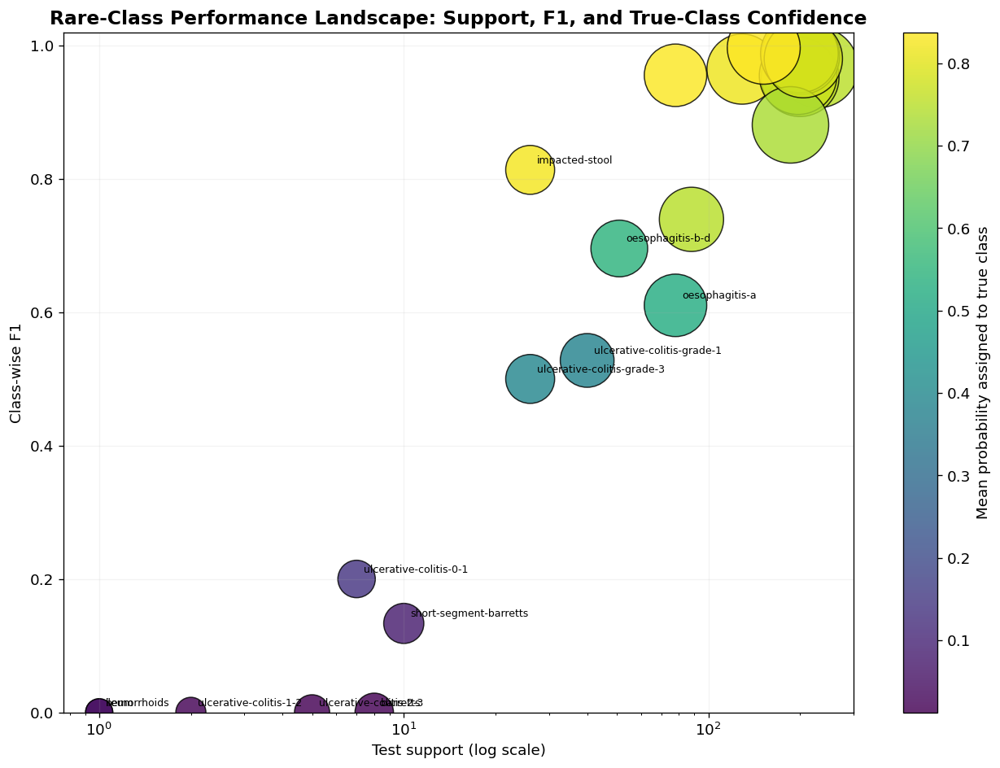

In [ ]:
# ============================================================
# STAGE 38 — CLASS-WISE / RARE-CLASS ANALYSIS
# ============================================================

class_rows = []

for i, class_name in enumerate(
    HK_CLASSES
):
    mask = (
        y_test == i
    )

    support = int(
        mask.sum()
    )

    if support == 0:
        continue

    tp = int(
        (
            (p_test == i)
            &
            mask
        ).sum()
    )

    predicted_i = int(
        (p_test == i).sum()
    )

    recall = (
        tp / support
    )

    precision = (
        tp / predicted_i
        if predicted_i
        else 0.0
    )

    f1 = (
        2
        *
        precision
        *
        recall
        /
        (
            precision
            +
            recall
            +
            1e-12
        )
    )

    true_conf = float(
        prob_test[
            mask,
            i
        ].mean()
    )

    class_rows.append({
        "class": class_name,
        "support": support,
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "mean_true_class_probability": true_conf,
        "error_rate": 1 - recall,
    })

rare_df = pd.DataFrame(
    class_rows
)

rare_df["rarity"] = pd.cut(
    rare_df["support"],
    bins=[
        -1,
        10,
        50,
        150,
        np.inf
    ],
    labels=[
        "Extremely rare",
        "Rare",
        "Moderate",
        "Frequent",
    ]
)

rare_df.to_csv(
    RESULTS / "classwise_rare_class_analysis.csv",
    index=False
)

display(
    rare_df.sort_values(
        ["support", "f1"]
    )
)

fig, ax = plt.subplots(
    figsize=(11, 8)
)

sizes = (
    180
    +
    220
    *
    np.sqrt(
        rare_df["support"].values
    )
)

sc = ax.scatter(
    rare_df["support"],
    rare_df["f1"],
    s=sizes,
    c=rare_df[
        "mean_true_class_probability"
    ],
    cmap="viridis",
    edgecolors="black",
    linewidths=.9,
    alpha=.82
)

for _, row in rare_df.iterrows():
    if (
        row["support"] <= 50
        or
        row["f1"]
        <
        rare_df["f1"].median()
    ):
        ax.annotate(
            row["class"],
            (
                row["support"],
                row["f1"]
            ),
            xytext=(5, 5),
            textcoords="offset points",
            fontsize=7.5
        )

ax.set_xscale("log")
ax.set_xlabel(
    "Test support (log scale)"
)
ax.set_ylabel(
    "Class-wise F1"
)

ax.set_ylim(0, 1.02)

ax.set_title(
    "Rare-Class Performance Landscape: Support, F1, and True-Class Confidence",
    weight="bold"
)

cbar = plt.colorbar(sc)
cbar.set_label(
    "Mean probability assigned to true class"
)

ax.grid(alpha=.15)

plt.tight_layout()

savefig(
    "38_rare_class_bubble_landscape"
)

plt.show()

## Stage 39 — Q1 Master Tables and Final Dashboard

All proposed-model, five-run, baseline, ablation, significance, calibration, class-wise, external-validation, and complexity results are exported into manuscript-ready CSV files and one Excel workbook.

In [ ]:
if not RUN_HEAVY_Q1_SUITE:
    print("Skipped heavy Q1 suite stage: RUN_HEAVY_Q1_SUITE=False. Enable only when sufficient GPU quota is available.")
else:
    # ============================================================
    # STAGE 39 — Q1 MASTER TABLES AND FINAL DASHBOARD
    # ============================================================

    proposed_summary = pd.DataFrame(
        [
            {
                "method": "MTG-MaxViTX",
                "classification_macro_f1_mean": (
                    five_run_df["macro_f1"].mean()
                ),
                "classification_macro_f1_std": (
                    five_run_df["macro_f1"].std(
                        ddof=1
                    )
                ),
                "segmentation_dice_mean": (
                    five_run_df["dice"].mean()
                ),
                "segmentation_dice_std": (
                    five_run_df["dice"].std(
                        ddof=1
                    )
                ),
                "boundary_f1_mean": (
                    five_run_df[
                        "boundary_f1"
                    ].mean()
                ),
                "external_macro_f1_mean": (
                    five_run_df[
                        "external_macro_f1"
                    ].mean()
                ),
                "ece_mean": (
                    five_run_df["ece"].mean()
                ),
                "parameters_m": (
                    five_run_df[
                        "parameters_m"
                    ].mean()
                ),
            }
        ]
    )

    display(
        proposed_summary
    )

    proposed_summary.to_csv(
        RESULTS / "q1_proposed_summary.csv",
        index=False
    )

    excel_path = (
        RESULTS / "MTG_MaxViTX_Q1_results.xlsx"
    )

    with pd.ExcelWriter(
        excel_path,
        engine="openpyxl"
    ) as writer:
        proposed_summary.to_excel(
            writer,
            sheet_name="Proposed",
            index=False
        )

        five_run_df.to_excel(
            writer,
            sheet_name="Five Runs",
            index=False
        )

        classification_baselines_df.to_excel(
            writer,
            sheet_name="Cls Baselines",
            index=False
        )

        segmentation_baselines_df.to_excel(
            writer,
            sheet_name="Seg Baselines",
            index=False
        )

        ablation_df.to_excel(
            writer,
            sheet_name="Ablations",
            index=False
        )

        significance_df.to_excel(
            writer,
            sheet_name="Significance",
            index=False
        )

        calibration_summary.to_excel(
            writer,
            sheet_name="Calibration",
            index=False
        )

        rare_df.to_excel(
            writer,
            sheet_name="Classwise",
            index=False
        )

        profile_df.to_excel(
            writer,
            sheet_name="Complexity",
            index=False
        )

    labels = [
        "Primary\nMacro F1",
        "Polyp\nDice",
        "Boundary\nF1",
        "External\nMacro F1",
        "1 - ECE",
    ]

    values = np.array(
        [
            five_run_df[
                "macro_f1"
            ].mean(),
            five_run_df[
                "dice"
            ].mean(),
            five_run_df[
                "boundary_f1"
            ].mean(),
            five_run_df[
                "external_macro_f1"
            ].mean(),
            1
            -
            five_run_df[
                "ece"
            ].mean(),
        ],
        dtype=float
    )

    fig, ax = plt.subplots(
        figsize=(12, 4.5)
    )

    ax.axis("off")

    cmap = mpl.colormaps[
        "viridis"
    ]

    for i, (
        label,
        value
    ) in enumerate(
        zip(labels, values)
    ):
        color = cmap(
            .10
            +
            .82
            *
            i
            /
            max(
                1,
                len(labels) - 1
            )
        )

        patch = mpl.patches.RegularPolygon(
            (i, 0),
            numVertices=6,
            radius=.53,
            orientation=np.pi / 6,
            facecolor=color,
            edgecolor="black",
            linewidth=1.3
        )

        ax.add_patch(patch)

        ax.text(
            i,
            .08,
            f"{value:.3f}",
            ha="center",
            va="center",
            fontsize=15,
            weight="bold",
            color=(
                "white"
                if i < 3
                else "black"
            )
        )

        ax.text(
            i,
            -.22,
            label,
            ha="center",
            va="center",
            fontsize=8.5,
            color=(
                "white"
                if i < 3
                else "black"
            )
        )

    ax.set_xlim(
        -.7,
        len(labels) - .3
    )

    ax.set_ylim(
        -.75,
        .8
    )

    ax.set_title(
        "MTG-MaxViTX Q1 Evaluation Hexagon Dashboard",
        fontsize=16,
        weight="bold"
    )

    plt.tight_layout()

    savefig(
        "39_q1_final_hex_dashboard"
    )

    plt.show()

    print(
        "Q1 results workbook:",
        excel_path
    )

    mark_stage(
        "39_q1_suite_complete",
        {
            "five_runs": int(
                len(five_run_df)
            ),
            "classification_baseline_runs": int(
                len(
                    classification_baselines_df
                )
            ),
            "segmentation_baseline_runs": int(
                len(
                    segmentation_baselines_df
                )
            ),
            "ablation_runs": int(
                len(ablation_df)
            ),
        }
    )

    print(
        "✓ Full Q1 experimental suite complete"
    )

Skipped heavy Q1 suite stage: RUN_HEAVY_Q1_SUITE=False. Enable only when sufficient GPU quota is available.
